In [1]:
import pickle
import cv2
import matplotlib.pyplot as plt

In [2]:
import numpy as np
import mnist


# load data
num_classes = 10
train_images = mnist.train_images() #[60000, 28, 28]
train_labels = mnist.train_labels()
test_images = mnist.test_images()
test_labels = mnist.test_labels()

print("Training...")

Training...


In [3]:
# activation function
def relu(inputs):
    return np.maximum(inputs, 0)

# output probability distribution function
def softmax(inputs):
    exp = np.exp(inputs)
    return exp/np.sum(exp, axis = 1, keepdims = True)

# loss
def cross_entropy(inputs, y):
    indices = np.argmax(y, axis = 1).astype(int)
    probability = inputs[np.arange(len(inputs)), indices] #inputs[0, indices]
    log = np.log(probability)
    loss = -1.0 * np.sum(log) / len(log)
    return loss

In [4]:
class Network:

    def __init__(self, 
                 num_nodes_in_layers, 
                 batch_size,
                 num_epochs,
                 learning_rate, 
                 ):

        self.num_nodes_in_layers = num_nodes_in_layers
        self.batch_size = batch_size
        self.num_epochs = num_epochs
        self.learning_rate = learning_rate
#         self.weights_file = weights_file

        # build the network
        #           w1/b1    w2/b2   w3/b3
        #784(inputs) ---> 32 ---> 32 ---> 10(output)
        #         x     z1  a1  z2  a2   z3  a3=y
        self.weight1 = np.random.normal(0, 1, [self.num_nodes_in_layers[0], self.num_nodes_in_layers[1]])
        self.bias1 = np.zeros((1, self.num_nodes_in_layers[1]))
        self.weight2 = np.random.normal(0, 1, [self.num_nodes_in_layers[1], self.num_nodes_in_layers[2]])
        self.bias2 = np.zeros((1, self.num_nodes_in_layers[2]))
        self.weight3 = np.random.normal(0, 1, [self.num_nodes_in_layers[2], self.num_nodes_in_layers[3]])
        self.bias3 = np.zeros((1, self.num_nodes_in_layers[3]))
        self.loss = []

    def train(self, inputs, labels):
    
        for epoch in range(self.num_epochs): # training begin
            iteration = 0
            while iteration < len(inputs):

                # batch input
                inputs_batch = inputs[iteration:iteration+self.batch_size]
                labels_batch = labels[iteration:iteration+self.batch_size]
                
                # forward pass
                z1 = np.dot(inputs_batch, self.weight1) + self.bias1
                a1 = relu(z1)
                z2 = np.dot(a1, self.weight2) + self.bias2
                a2 = relu(z2)
                z3 = np.dot(a2, self.weight3) + self.bias3
                a3 = softmax(z3)
                
                
                # calculate loss
                loss = cross_entropy(a3, labels_batch)

                if iteration+self.batch_size >= len(inputs):
                    self.loss.append(loss)

                # backward pass
                dz3 = (a3 - labels_batch) / a3.shape[0]
                dw3 = np.dot(a2.T, dz3) # forward * backward
                db3 = np.sum(dz3, axis = 0, keepdims = True)
                
                
                da2 = np.dot(dz3, self.weight3.T) 
                da2[a2 <= 0] = 0 # derivatives of relu
                dw2 = np.dot(a1.T, da2)/a3.shape[0] # forward * backward
                db2 = np.sum(da2, axis = 0, keepdims = True)
                
                da1 = np.dot(da2, self.weight2.T) 
                da1[a1 <= 0] = 0 # derivatives of relu
                dw1 = np.dot(inputs_batch.T, da1)
                db1 = np.sum(da1, axis = 0, keepdims = True)


                # stochastic gradient descent
                self.weight1 -= self.learning_rate * dw1 #update weight and bias
                self.bias1 -= self.learning_rate * db1
                self.weight2 -= self.learning_rate * dw2
                self.bias2 -= self.learning_rate * db2
                self.weight3 -= self.learning_rate * dw3
                self.bias3 -= self.learning_rate * db3
                

                print('=== Epoch: {:d}/{:d}\tIteration:{:d}\tLoss: {:.2f} ==='.format(epoch+1, self.num_epochs, iteration+1, loss))
                iteration += self.batch_size
                
        obj = [self.weight1, self.bias1, self.weight2, self.bias2, self.weight3, self.bias3]
        with open('filename.pkl', 'wb') as handle:
            pickle.dump(obj, handle, protocol=pickle.HIGHEST_PROTOCOL)
#         print("loss",self.loss)
        plt.plot(range(1,self.num_epochs+1), self.loss, color = 'b')
        plt.savefig("Loss_Function_vs_Epoch.jpg")
        plt.show()
            
    def test(self, inputs, labels):
        input_layer = np.dot(inputs, self.weight1)
        hidden_layer_1 = relu(input_layer + self.bias1)

        h1 = np.dot(hidden_layer_1, self.weight2) 
        hidden_layer_2 = relu(h1 + self.bias2)

        scores = np.dot(hidden_layer_2, self.weight3) + self.bias3
        probs = softmax(scores)
        predict = np.argmax(probs)

        acc = float(np.sum(np.argmax(probs, 1) == labels)) / float(len(labels))
        print('Test accuracy: {:.2f}%'.format(acc*100))

=== Epoch: 1/5	Iteration:1	Loss: 183.17 ===
=== Epoch: 1/5	Iteration:2	Loss: 397.93 ===
=== Epoch: 1/5	Iteration:3	Loss: 374.65 ===
=== Epoch: 1/5	Iteration:4	Loss: 183.54 ===
=== Epoch: 1/5	Iteration:5	Loss: 134.38 ===
=== Epoch: 1/5	Iteration:6	Loss: 534.93 ===
=== Epoch: 1/5	Iteration:7	Loss: 106.57 ===
=== Epoch: 1/5	Iteration:8	Loss: 60.49 ===
=== Epoch: 1/5	Iteration:9	Loss: 118.77 ===
=== Epoch: 1/5	Iteration:10	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:11	Loss: 121.06 ===
=== Epoch: 1/5	Iteration:12	Loss: 308.54 ===
=== Epoch: 1/5	Iteration:13	Loss: 27.18 ===
=== Epoch: 1/5	Iteration:14	Loss: 131.87 ===
=== Epoch: 1/5	Iteration:15	Loss: 126.83 ===
=== Epoch: 1/5	Iteration:16	Loss: 58.04 ===
=== Epoch: 1/5	Iteration:17	Loss: 324.31 ===
=== Epoch: 1/5	Iteration:18	Loss: 0.85 ===
=== Epoch: 1/5	Iteration:19	Loss: 79.00 ===
=== Epoch: 1/5	Iteration:20	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:21	Loss: 133.57 ===
=== Epoch: 1/5	Iteration:22	Loss: 138.40 ===
=== Epoch: 1/5	Iteration:23	

=== Epoch: 1/5	Iteration:262	Loss: 41.52 ===
=== Epoch: 1/5	Iteration:263	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:264	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:265	Loss: 69.52 ===
=== Epoch: 1/5	Iteration:266	Loss: 12.17 ===
=== Epoch: 1/5	Iteration:267	Loss: 93.42 ===
=== Epoch: 1/5	Iteration:268	Loss: 13.29 ===
=== Epoch: 1/5	Iteration:269	Loss: 202.24 ===
=== Epoch: 1/5	Iteration:270	Loss: 65.66 ===
=== Epoch: 1/5	Iteration:271	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:272	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:273	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:274	Loss: 57.42 ===
=== Epoch: 1/5	Iteration:275	Loss: 52.10 ===
=== Epoch: 1/5	Iteration:276	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:277	Loss: 21.68 ===
=== Epoch: 1/5	Iteration:278	Loss: 120.14 ===
=== Epoch: 1/5	Iteration:279	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:280	Loss: 6.28 ===
=== Epoch: 1/5	Iteration:281	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:282	Loss: 62.50 ===
=== Epoch: 1/5	Iteration:283	Loss: 53.77 ===
=== Epoch: 1/5	

=== Epoch: 1/5	Iteration:543	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:544	Loss: 48.07 ===
=== Epoch: 1/5	Iteration:545	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:546	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:547	Loss: 122.79 ===
=== Epoch: 1/5	Iteration:548	Loss: 13.81 ===
=== Epoch: 1/5	Iteration:549	Loss: 26.86 ===
=== Epoch: 1/5	Iteration:550	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:551	Loss: 19.15 ===
=== Epoch: 1/5	Iteration:552	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:553	Loss: 6.18 ===
=== Epoch: 1/5	Iteration:554	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:555	Loss: 28.77 ===
=== Epoch: 1/5	Iteration:556	Loss: 20.78 ===
=== Epoch: 1/5	Iteration:557	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:558	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:559	Loss: 80.70 ===
=== Epoch: 1/5	Iteration:560	Loss: 59.65 ===
=== Epoch: 1/5	Iteration:561	Loss: 16.32 ===
=== Epoch: 1/5	Iteration:562	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:563	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:564	Loss: 17.13 ===
=== Epoch: 1/5	I

=== Epoch: 1/5	Iteration:904	Loss: 45.28 ===
=== Epoch: 1/5	Iteration:905	Loss: 6.60 ===
=== Epoch: 1/5	Iteration:906	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:907	Loss: 21.13 ===
=== Epoch: 1/5	Iteration:908	Loss: 28.43 ===
=== Epoch: 1/5	Iteration:909	Loss: 59.58 ===
=== Epoch: 1/5	Iteration:910	Loss: 16.74 ===
=== Epoch: 1/5	Iteration:911	Loss: 36.20 ===
=== Epoch: 1/5	Iteration:912	Loss: 2.37 ===
=== Epoch: 1/5	Iteration:913	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:914	Loss: 34.28 ===
=== Epoch: 1/5	Iteration:915	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:916	Loss: 48.18 ===
=== Epoch: 1/5	Iteration:917	Loss: 35.31 ===
=== Epoch: 1/5	Iteration:918	Loss: 15.81 ===
=== Epoch: 1/5	Iteration:919	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:920	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:921	Loss: 13.66 ===
=== Epoch: 1/5	Iteration:922	Loss: 37.02 ===
=== Epoch: 1/5	Iteration:923	Loss: 41.74 ===
=== Epoch: 1/5	Iteration:924	Loss: 5.30 ===
=== Epoch: 1/5	Iteration:925	Loss: 0.00 ===
=== Epoch: 1/5	Ite

=== Epoch: 1/5	Iteration:1185	Loss: 24.85 ===
=== Epoch: 1/5	Iteration:1186	Loss: 39.79 ===
=== Epoch: 1/5	Iteration:1187	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:1188	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1189	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1190	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1191	Loss: 3.55 ===
=== Epoch: 1/5	Iteration:1192	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1193	Loss: 5.26 ===
=== Epoch: 1/5	Iteration:1194	Loss: 22.16 ===
=== Epoch: 1/5	Iteration:1195	Loss: 61.20 ===
=== Epoch: 1/5	Iteration:1196	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1197	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1198	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1199	Loss: 18.37 ===
=== Epoch: 1/5	Iteration:1200	Loss: 33.34 ===
=== Epoch: 1/5	Iteration:1201	Loss: 14.86 ===
=== Epoch: 1/5	Iteration:1202	Loss: 46.67 ===
=== Epoch: 1/5	Iteration:1203	Loss: 6.04 ===
=== Epoch: 1/5	Iteration:1204	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1205	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:1206	Loss: 0.00 ===

=== Epoch: 1/5	Iteration:1473	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1474	Loss: 16.21 ===
=== Epoch: 1/5	Iteration:1475	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1476	Loss: 34.08 ===
=== Epoch: 1/5	Iteration:1477	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:1478	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1479	Loss: 13.00 ===
=== Epoch: 1/5	Iteration:1480	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1481	Loss: 36.48 ===
=== Epoch: 1/5	Iteration:1482	Loss: 70.54 ===
=== Epoch: 1/5	Iteration:1483	Loss: 14.41 ===
=== Epoch: 1/5	Iteration:1484	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1485	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1486	Loss: 32.13 ===
=== Epoch: 1/5	Iteration:1487	Loss: 10.15 ===
=== Epoch: 1/5	Iteration:1488	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:1489	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1490	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:1491	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1492	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1493	Loss: 9.71 ===
=== Epoch: 1/5	Iteration:1494	Loss: 0.20 ==

=== Epoch: 1/5	Iteration:1832	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:1833	Loss: 17.75 ===
=== Epoch: 1/5	Iteration:1834	Loss: 15.18 ===
=== Epoch: 1/5	Iteration:1835	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1836	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1837	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:1838	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1839	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1840	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1841	Loss: 66.35 ===
=== Epoch: 1/5	Iteration:1842	Loss: 79.64 ===
=== Epoch: 1/5	Iteration:1843	Loss: 25.15 ===
=== Epoch: 1/5	Iteration:1844	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1845	Loss: 28.30 ===
=== Epoch: 1/5	Iteration:1846	Loss: 45.97 ===
=== Epoch: 1/5	Iteration:1847	Loss: 34.33 ===
=== Epoch: 1/5	Iteration:1848	Loss: 28.83 ===
=== Epoch: 1/5	Iteration:1849	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1850	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:1851	Loss: 35.60 ===
=== Epoch: 1/5	Iteration:1852	Loss: 5.49 ===
=== Epoch: 1/5	Iteration:1853	Loss: 59.28 ===

=== Epoch: 1/5	Iteration:2224	Loss: 20.78 ===
=== Epoch: 1/5	Iteration:2225	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2226	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2227	Loss: 9.81 ===
=== Epoch: 1/5	Iteration:2228	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2229	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2230	Loss: 4.43 ===
=== Epoch: 1/5	Iteration:2231	Loss: 12.72 ===
=== Epoch: 1/5	Iteration:2232	Loss: 13.78 ===
=== Epoch: 1/5	Iteration:2233	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2234	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:2235	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:2236	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:2237	Loss: 53.15 ===
=== Epoch: 1/5	Iteration:2238	Loss: 7.72 ===
=== Epoch: 1/5	Iteration:2239	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2240	Loss: 10.12 ===
=== Epoch: 1/5	Iteration:2241	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:2242	Loss: 6.85 ===
=== Epoch: 1/5	Iteration:2243	Loss: 30.43 ===
=== Epoch: 1/5	Iteration:2244	Loss: 35.19 ===
=== Epoch: 1/5	Iteration:2245	Loss: 30.79 ===
=

=== Epoch: 1/5	Iteration:2582	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2583	Loss: 4.72 ===
=== Epoch: 1/5	Iteration:2584	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:2585	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:2586	Loss: 13.29 ===
=== Epoch: 1/5	Iteration:2587	Loss: 35.59 ===
=== Epoch: 1/5	Iteration:2588	Loss: 13.38 ===
=== Epoch: 1/5	Iteration:2589	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2590	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:2591	Loss: 22.53 ===
=== Epoch: 1/5	Iteration:2592	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2593	Loss: 15.16 ===
=== Epoch: 1/5	Iteration:2594	Loss: 13.70 ===
=== Epoch: 1/5	Iteration:2595	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:2596	Loss: 2.39 ===
=== Epoch: 1/5	Iteration:2597	Loss: 8.69 ===
=== Epoch: 1/5	Iteration:2598	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2599	Loss: 15.05 ===
=== Epoch: 1/5	Iteration:2600	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2601	Loss: 8.93 ===
=== Epoch: 1/5	Iteration:2602	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:2603	Loss: 19.36 ===


=== Epoch: 1/5	Iteration:2885	Loss: 9.22 ===
=== Epoch: 1/5	Iteration:2886	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2887	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2888	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:2889	Loss: 4.66 ===
=== Epoch: 1/5	Iteration:2890	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2891	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2892	Loss: 34.03 ===
=== Epoch: 1/5	Iteration:2893	Loss: 52.75 ===
=== Epoch: 1/5	Iteration:2894	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2895	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2896	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2897	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:2898	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2899	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:2900	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2901	Loss: 4.01 ===
=== Epoch: 1/5	Iteration:2902	Loss: 20.72 ===
=== Epoch: 1/5	Iteration:2903	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2904	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:2905	Loss: 6.78 ===
=== Epoch: 1/5	Iteration:2906	Loss: 4.02 ===
=== Ep

=== Epoch: 1/5	Iteration:3229	Loss: 11.32 ===
=== Epoch: 1/5	Iteration:3230	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:3231	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3232	Loss: 15.79 ===
=== Epoch: 1/5	Iteration:3233	Loss: 9.61 ===
=== Epoch: 1/5	Iteration:3234	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:3235	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:3236	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3237	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3238	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3239	Loss: 5.80 ===
=== Epoch: 1/5	Iteration:3240	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:3241	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:3242	Loss: 8.78 ===
=== Epoch: 1/5	Iteration:3243	Loss: 25.74 ===
=== Epoch: 1/5	Iteration:3244	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:3245	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:3246	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:3247	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3248	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3249	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3250	Loss: 0.00 ===
=== Ep

=== Epoch: 1/5	Iteration:3610	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:3611	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:3612	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3613	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3614	Loss: 7.22 ===
=== Epoch: 1/5	Iteration:3615	Loss: 5.88 ===
=== Epoch: 1/5	Iteration:3616	Loss: 11.10 ===
=== Epoch: 1/5	Iteration:3617	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:3618	Loss: 9.39 ===
=== Epoch: 1/5	Iteration:3619	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:3620	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:3621	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3622	Loss: 12.50 ===
=== Epoch: 1/5	Iteration:3623	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:3624	Loss: 4.33 ===
=== Epoch: 1/5	Iteration:3625	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:3626	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3627	Loss: 30.14 ===
=== Epoch: 1/5	Iteration:3628	Loss: 6.19 ===
=== Epoch: 1/5	Iteration:3629	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3630	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:3631	Loss: 7.09 ===
=== Ep

=== Epoch: 1/5	Iteration:4043	Loss: 12.24 ===
=== Epoch: 1/5	Iteration:4044	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:4045	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4046	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:4047	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:4048	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4049	Loss: 7.09 ===
=== Epoch: 1/5	Iteration:4050	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:4051	Loss: 4.99 ===
=== Epoch: 1/5	Iteration:4052	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4053	Loss: 4.53 ===
=== Epoch: 1/5	Iteration:4054	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:4055	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:4056	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:4057	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4058	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4059	Loss: 5.61 ===
=== Epoch: 1/5	Iteration:4060	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:4061	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4062	Loss: 3.98 ===
=== Epoch: 1/5	Iteration:4063	Loss: 18.30 ===
=== Epoch: 1/5	Iteration:4064	Loss: 0.00 ===
=== Epo

=== Epoch: 1/5	Iteration:4340	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:4341	Loss: 6.64 ===
=== Epoch: 1/5	Iteration:4342	Loss: 4.78 ===
=== Epoch: 1/5	Iteration:4343	Loss: 9.16 ===
=== Epoch: 1/5	Iteration:4344	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4345	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4346	Loss: 1.26 ===
=== Epoch: 1/5	Iteration:4347	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4348	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:4349	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:4350	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4351	Loss: 2.79 ===
=== Epoch: 1/5	Iteration:4352	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4353	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4354	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4355	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:4356	Loss: 24.97 ===
=== Epoch: 1/5	Iteration:4357	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4358	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4359	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4360	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:4361	Loss: 27.87 ===
=== Epoc

=== Epoch: 1/5	Iteration:4579	Loss: 3.78 ===
=== Epoch: 1/5	Iteration:4580	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:4581	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:4582	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:4583	Loss: 6.05 ===
=== Epoch: 1/5	Iteration:4584	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:4585	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:4586	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4587	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:4588	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4589	Loss: 4.35 ===
=== Epoch: 1/5	Iteration:4590	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:4591	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:4592	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4593	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4594	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:4595	Loss: 3.16 ===
=== Epoch: 1/5	Iteration:4596	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:4597	Loss: 15.59 ===
=== Epoch: 1/5	Iteration:4598	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4599	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:4600	Loss: 0.16 ===
=== Epoch

=== Epoch: 1/5	Iteration:4838	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:4839	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:4840	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4841	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:4842	Loss: 5.48 ===
=== Epoch: 1/5	Iteration:4843	Loss: 2.25 ===
=== Epoch: 1/5	Iteration:4844	Loss: 6.79 ===
=== Epoch: 1/5	Iteration:4845	Loss: 6.65 ===
=== Epoch: 1/5	Iteration:4846	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:4847	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:4848	Loss: 4.48 ===
=== Epoch: 1/5	Iteration:4849	Loss: 4.35 ===
=== Epoch: 1/5	Iteration:4850	Loss: 20.01 ===
=== Epoch: 1/5	Iteration:4851	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:4852	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4853	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4854	Loss: 5.49 ===
=== Epoch: 1/5	Iteration:4855	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:4856	Loss: 11.33 ===
=== Epoch: 1/5	Iteration:4857	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:4858	Loss: 5.09 ===
=== Epoch: 1/5	Iteration:4859	Loss: 0.51 ===
=== Ep

=== Epoch: 1/5	Iteration:5102	Loss: 2.53 ===
=== Epoch: 1/5	Iteration:5103	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:5104	Loss: 19.40 ===
=== Epoch: 1/5	Iteration:5105	Loss: 2.96 ===
=== Epoch: 1/5	Iteration:5106	Loss: 21.70 ===
=== Epoch: 1/5	Iteration:5107	Loss: 4.54 ===
=== Epoch: 1/5	Iteration:5108	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5109	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:5110	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:5111	Loss: 3.48 ===
=== Epoch: 1/5	Iteration:5112	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:5113	Loss: 4.28 ===
=== Epoch: 1/5	Iteration:5114	Loss: 9.61 ===
=== Epoch: 1/5	Iteration:5115	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:5116	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5117	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:5118	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:5119	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5120	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:5121	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5122	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:5123	Loss: 0.04 ===
=== Epo

=== Epoch: 1/5	Iteration:5384	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:5385	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:5386	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5387	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:5388	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5389	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:5390	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:5391	Loss: 3.17 ===
=== Epoch: 1/5	Iteration:5392	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:5393	Loss: 5.20 ===
=== Epoch: 1/5	Iteration:5394	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:5395	Loss: 8.08 ===
=== Epoch: 1/5	Iteration:5396	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:5397	Loss: 3.06 ===
=== Epoch: 1/5	Iteration:5398	Loss: 7.16 ===
=== Epoch: 1/5	Iteration:5399	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:5400	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:5401	Loss: 2.81 ===
=== Epoch: 1/5	Iteration:5402	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5403	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:5404	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:5405	Loss: 1.17 ===
=== Epoch

=== Epoch: 1/5	Iteration:5693	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5694	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5695	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5696	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:5697	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:5698	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:5699	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5700	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:5701	Loss: 3.79 ===
=== Epoch: 1/5	Iteration:5702	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:5703	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:5704	Loss: 4.71 ===
=== Epoch: 1/5	Iteration:5705	Loss: 17.58 ===
=== Epoch: 1/5	Iteration:5706	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:5707	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:5708	Loss: 4.09 ===
=== Epoch: 1/5	Iteration:5709	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:5710	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:5711	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:5712	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:5713	Loss: 23.05 ===
=== Epoch: 1/5	Iteration:5714	Loss: 0.08 ===
=== Epoc

=== Epoch: 1/5	Iteration:6033	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:6034	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:6035	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:6036	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:6037	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:6038	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6039	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:6040	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:6041	Loss: 2.22 ===
=== Epoch: 1/5	Iteration:6042	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:6043	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6044	Loss: 3.04 ===
=== Epoch: 1/5	Iteration:6045	Loss: 16.48 ===
=== Epoch: 1/5	Iteration:6046	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6047	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6048	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:6049	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:6050	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6051	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6052	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:6053	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:6054	Loss: 0.00 ===
=== Epoch

=== Epoch: 1/5	Iteration:6388	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:6389	Loss: 5.23 ===
=== Epoch: 1/5	Iteration:6390	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:6391	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:6392	Loss: 7.58 ===
=== Epoch: 1/5	Iteration:6393	Loss: 8.26 ===
=== Epoch: 1/5	Iteration:6394	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6395	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:6396	Loss: 11.84 ===
=== Epoch: 1/5	Iteration:6397	Loss: 2.56 ===
=== Epoch: 1/5	Iteration:6398	Loss: 2.57 ===
=== Epoch: 1/5	Iteration:6399	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:6400	Loss: 3.64 ===
=== Epoch: 1/5	Iteration:6401	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6402	Loss: 3.13 ===
=== Epoch: 1/5	Iteration:6403	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:6404	Loss: 3.07 ===
=== Epoch: 1/5	Iteration:6405	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:6406	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:6407	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6408	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:6409	Loss: 0.79 ===
=== Epoch

=== Epoch: 1/5	Iteration:6716	Loss: 26.31 ===
=== Epoch: 1/5	Iteration:6717	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:6718	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:6719	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:6720	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:6721	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:6722	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6723	Loss: 13.44 ===
=== Epoch: 1/5	Iteration:6724	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:6725	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6726	Loss: 5.72 ===
=== Epoch: 1/5	Iteration:6727	Loss: 11.52 ===
=== Epoch: 1/5	Iteration:6728	Loss: 6.50 ===
=== Epoch: 1/5	Iteration:6729	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:6730	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:6731	Loss: 15.66 ===
=== Epoch: 1/5	Iteration:6732	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:6733	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:6734	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:6735	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:6736	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:6737	Loss: 0.47 ===
=== 

=== Epoch: 1/5	Iteration:7072	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:7073	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:7074	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:7075	Loss: 3.10 ===
=== Epoch: 1/5	Iteration:7076	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7077	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:7078	Loss: 7.96 ===
=== Epoch: 1/5	Iteration:7079	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:7080	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:7081	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:7082	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:7083	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7084	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:7085	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:7086	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7087	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:7088	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:7089	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:7090	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7091	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7092	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7093	Loss: 0.00 ===
=== Epoch:

=== Epoch: 1/5	Iteration:7448	Loss: 5.71 ===
=== Epoch: 1/5	Iteration:7449	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:7450	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:7451	Loss: 5.03 ===
=== Epoch: 1/5	Iteration:7452	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:7453	Loss: 4.68 ===
=== Epoch: 1/5	Iteration:7454	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:7455	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7456	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:7457	Loss: 4.03 ===
=== Epoch: 1/5	Iteration:7458	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:7459	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7460	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7461	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:7462	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:7463	Loss: 7.08 ===
=== Epoch: 1/5	Iteration:7464	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:7465	Loss: 17.54 ===
=== Epoch: 1/5	Iteration:7466	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:7467	Loss: 3.54 ===
=== Epoch: 1/5	Iteration:7468	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:7469	Loss: 0.34 ===
=== Epoch

=== Epoch: 1/5	Iteration:7753	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:7754	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:7755	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:7756	Loss: 2.28 ===
=== Epoch: 1/5	Iteration:7757	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:7758	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:7759	Loss: 6.63 ===
=== Epoch: 1/5	Iteration:7760	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7761	Loss: 3.67 ===
=== Epoch: 1/5	Iteration:7762	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:7763	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:7764	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:7765	Loss: 4.96 ===
=== Epoch: 1/5	Iteration:7766	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:7767	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:7768	Loss: 24.56 ===
=== Epoch: 1/5	Iteration:7769	Loss: 17.40 ===
=== Epoch: 1/5	Iteration:7770	Loss: 2.82 ===
=== Epoch: 1/5	Iteration:7771	Loss: 5.59 ===
=== Epoch: 1/5	Iteration:7772	Loss: 2.77 ===
=== Epoch: 1/5	Iteration:7773	Loss: 21.84 ===
=== Epoch: 1/5	Iteration:7774	Loss: 4.28 ===
=== Epo

=== Epoch: 1/5	Iteration:8104	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:8105	Loss: 2.66 ===
=== Epoch: 1/5	Iteration:8106	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:8107	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:8108	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:8109	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:8110	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:8111	Loss: 3.57 ===
=== Epoch: 1/5	Iteration:8112	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:8113	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:8114	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:8115	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:8116	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:8117	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:8118	Loss: 25.60 ===
=== Epoch: 1/5	Iteration:8119	Loss: 2.52 ===
=== Epoch: 1/5	Iteration:8120	Loss: 7.46 ===
=== Epoch: 1/5	Iteration:8121	Loss: 34.48 ===
=== Epoch: 1/5	Iteration:8122	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:8123	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:8124	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:8125	Loss: 1.92 ===
=== Epoc

=== Epoch: 1/5	Iteration:8461	Loss: 0.85 ===
=== Epoch: 1/5	Iteration:8462	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:8463	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:8464	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:8465	Loss: 9.05 ===
=== Epoch: 1/5	Iteration:8466	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:8467	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:8468	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:8469	Loss: 2.41 ===
=== Epoch: 1/5	Iteration:8470	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:8471	Loss: 27.17 ===
=== Epoch: 1/5	Iteration:8472	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:8473	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:8474	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:8475	Loss: 3.02 ===
=== Epoch: 1/5	Iteration:8476	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:8477	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:8478	Loss: 4.70 ===
=== Epoch: 1/5	Iteration:8479	Loss: 3.09 ===
=== Epoch: 1/5	Iteration:8480	Loss: 1.03 ===
=== Epoch: 1/5	Iteration:8481	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:8482	Loss: 1.06 ===
=== Epoch

=== Epoch: 1/5	Iteration:8771	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:8772	Loss: 2.01 ===
=== Epoch: 1/5	Iteration:8773	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:8774	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:8775	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:8776	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:8777	Loss: 4.03 ===
=== Epoch: 1/5	Iteration:8778	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:8779	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:8780	Loss: 2.61 ===
=== Epoch: 1/5	Iteration:8781	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:8782	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:8783	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:8784	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:8785	Loss: 1.03 ===
=== Epoch: 1/5	Iteration:8786	Loss: 1.47 ===
=== Epoch: 1/5	Iteration:8787	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:8788	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:8789	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:8790	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:8791	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:8792	Loss: 2.30 ===
=== Epoch:

=== Epoch: 1/5	Iteration:9036	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:9037	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:9038	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:9039	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:9040	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:9041	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:9042	Loss: 2.84 ===
=== Epoch: 1/5	Iteration:9043	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:9044	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9045	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:9046	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:9047	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:9048	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:9049	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:9050	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:9051	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:9052	Loss: 2.79 ===
=== Epoch: 1/5	Iteration:9053	Loss: 4.42 ===
=== Epoch: 1/5	Iteration:9054	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:9055	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:9056	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:9057	Loss: 0.17 ===
=== Epoch:

=== Epoch: 1/5	Iteration:9349	Loss: 7.19 ===
=== Epoch: 1/5	Iteration:9350	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:9351	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:9352	Loss: 2.37 ===
=== Epoch: 1/5	Iteration:9353	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:9354	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9355	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:9356	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:9357	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9358	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:9359	Loss: 1.90 ===
=== Epoch: 1/5	Iteration:9360	Loss: 4.96 ===
=== Epoch: 1/5	Iteration:9361	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:9362	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:9363	Loss: 3.19 ===
=== Epoch: 1/5	Iteration:9364	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:9365	Loss: 4.74 ===
=== Epoch: 1/5	Iteration:9366	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:9367	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:9368	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:9369	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:9370	Loss: 2.30 ===
=== Epoch:

=== Epoch: 1/5	Iteration:9738	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:9739	Loss: 3.50 ===
=== Epoch: 1/5	Iteration:9740	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:9741	Loss: 6.53 ===
=== Epoch: 1/5	Iteration:9742	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9743	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:9744	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:9745	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:9746	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:9747	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9748	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:9749	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:9750	Loss: 2.93 ===
=== Epoch: 1/5	Iteration:9751	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:9752	Loss: 2.59 ===
=== Epoch: 1/5	Iteration:9753	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:9754	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:9755	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:9756	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:9757	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:9758	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:9759	Loss: 1.43 ===
=== Epoch:

=== Epoch: 1/5	Iteration:10002	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:10003	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:10004	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:10005	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:10006	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:10007	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:10008	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10009	Loss: 2.97 ===
=== Epoch: 1/5	Iteration:10010	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:10011	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:10012	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:10013	Loss: 2.77 ===
=== Epoch: 1/5	Iteration:10014	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10015	Loss: 2.83 ===
=== Epoch: 1/5	Iteration:10016	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:10017	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:10018	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:10019	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:10020	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10021	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:10022	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:10023	Los

=== Epoch: 1/5	Iteration:10311	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10312	Loss: 3.41 ===
=== Epoch: 1/5	Iteration:10313	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:10314	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:10315	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:10316	Loss: 2.28 ===
=== Epoch: 1/5	Iteration:10317	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:10318	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:10319	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:10320	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:10321	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10322	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:10323	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:10324	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:10325	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:10326	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:10327	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:10328	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10329	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:10330	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:10331	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:10332	Los

=== Epoch: 1/5	Iteration:10617	Loss: 4.20 ===
=== Epoch: 1/5	Iteration:10618	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:10619	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10620	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:10621	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10622	Loss: 3.85 ===
=== Epoch: 1/5	Iteration:10623	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:10624	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:10625	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:10626	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:10627	Loss: 9.11 ===
=== Epoch: 1/5	Iteration:10628	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10629	Loss: 2.49 ===
=== Epoch: 1/5	Iteration:10630	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:10631	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:10632	Loss: 5.95 ===
=== Epoch: 1/5	Iteration:10633	Loss: 2.96 ===
=== Epoch: 1/5	Iteration:10634	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10635	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10636	Loss: 3.87 ===
=== Epoch: 1/5	Iteration:10637	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:10638	Los

=== Epoch: 1/5	Iteration:10957	Loss: 3.76 ===
=== Epoch: 1/5	Iteration:10958	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:10959	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:10960	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:10961	Loss: 11.65 ===
=== Epoch: 1/5	Iteration:10962	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:10963	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:10964	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:10965	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10966	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:10967	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:10968	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:10969	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:10970	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:10971	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:10972	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:10973	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:10974	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:10975	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:10976	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:10977	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:10978	Lo

=== Epoch: 1/5	Iteration:11288	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11289	Loss: 3.56 ===
=== Epoch: 1/5	Iteration:11290	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:11291	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11292	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:11293	Loss: 2.88 ===
=== Epoch: 1/5	Iteration:11294	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:11295	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11296	Loss: 2.20 ===
=== Epoch: 1/5	Iteration:11297	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:11298	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:11299	Loss: 3.43 ===
=== Epoch: 1/5	Iteration:11300	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:11301	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:11302	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:11303	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:11304	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11305	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11306	Loss: 3.33 ===
=== Epoch: 1/5	Iteration:11307	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:11308	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:11309	Los

=== Epoch: 1/5	Iteration:11554	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:11555	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:11556	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:11557	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:11558	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:11559	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:11560	Loss: 4.25 ===
=== Epoch: 1/5	Iteration:11561	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:11562	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11563	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:11564	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:11565	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:11566	Loss: 12.25 ===
=== Epoch: 1/5	Iteration:11567	Loss: 5.23 ===
=== Epoch: 1/5	Iteration:11568	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11569	Loss: 4.07 ===
=== Epoch: 1/5	Iteration:11570	Loss: 3.66 ===
=== Epoch: 1/5	Iteration:11571	Loss: 3.12 ===
=== Epoch: 1/5	Iteration:11572	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:11573	Loss: 4.09 ===
=== Epoch: 1/5	Iteration:11574	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11575	Lo

=== Epoch: 1/5	Iteration:11865	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:11866	Loss: 2.08 ===
=== Epoch: 1/5	Iteration:11867	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:11868	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:11869	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:11870	Loss: 3.29 ===
=== Epoch: 1/5	Iteration:11871	Loss: 6.64 ===
=== Epoch: 1/5	Iteration:11872	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:11873	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:11874	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:11875	Loss: 1.93 ===
=== Epoch: 1/5	Iteration:11876	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:11877	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:11878	Loss: 6.95 ===
=== Epoch: 1/5	Iteration:11879	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:11880	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:11881	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:11882	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:11883	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:11884	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:11885	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:11886	Los

=== Epoch: 1/5	Iteration:12144	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:12145	Loss: 1.87 ===
=== Epoch: 1/5	Iteration:12146	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:12147	Loss: 2.77 ===
=== Epoch: 1/5	Iteration:12148	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:12149	Loss: 3.61 ===
=== Epoch: 1/5	Iteration:12150	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:12151	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:12152	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:12153	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:12154	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:12155	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:12156	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:12157	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:12158	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:12159	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:12160	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:12161	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:12162	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:12163	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:12164	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:12165	Los

=== Epoch: 1/5	Iteration:12418	Loss: 2.21 ===
=== Epoch: 1/5	Iteration:12419	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12420	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:12421	Loss: 4.92 ===
=== Epoch: 1/5	Iteration:12422	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:12423	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:12424	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12425	Loss: 5.39 ===
=== Epoch: 1/5	Iteration:12426	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:12427	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:12428	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:12429	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12430	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:12431	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:12432	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:12433	Loss: 4.57 ===
=== Epoch: 1/5	Iteration:12434	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:12435	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:12436	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:12437	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:12438	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:12439	Los

=== Epoch: 1/5	Iteration:12677	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:12678	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:12679	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:12680	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:12681	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:12682	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:12683	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:12684	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:12685	Loss: 1.95 ===
=== Epoch: 1/5	Iteration:12686	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:12687	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:12688	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12689	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:12690	Loss: 3.71 ===
=== Epoch: 1/5	Iteration:12691	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:12692	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12693	Loss: 3.88 ===
=== Epoch: 1/5	Iteration:12694	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12695	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:12696	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:12697	Loss: 2.84 ===
=== Epoch: 1/5	Iteration:12698	Los

=== Epoch: 1/5	Iteration:12973	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:12974	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12975	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:12976	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:12977	Loss: 0.61 ===
=== Epoch: 1/5	Iteration:12978	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:12979	Loss: 2.25 ===
=== Epoch: 1/5	Iteration:12980	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:12981	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:12982	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:12983	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12984	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:12985	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:12986	Loss: 5.30 ===
=== Epoch: 1/5	Iteration:12987	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:12988	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:12989	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:12990	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:12991	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:12992	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12993	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:12994	Los

=== Epoch: 1/5	Iteration:13296	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:13297	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:13298	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:13299	Loss: 0.61 ===
=== Epoch: 1/5	Iteration:13300	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:13301	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:13302	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:13303	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:13304	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:13305	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:13306	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:13307	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:13308	Loss: 13.89 ===
=== Epoch: 1/5	Iteration:13309	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:13310	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:13311	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:13312	Loss: 2.43 ===
=== Epoch: 1/5	Iteration:13313	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:13314	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:13315	Loss: 3.17 ===
=== Epoch: 1/5	Iteration:13316	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:13317	Lo

=== Epoch: 1/5	Iteration:13598	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:13599	Loss: 4.93 ===
=== Epoch: 1/5	Iteration:13600	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:13601	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:13602	Loss: 1.70 ===
=== Epoch: 1/5	Iteration:13603	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:13604	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:13605	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:13606	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:13607	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:13608	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:13609	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:13610	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:13611	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:13612	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:13613	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:13614	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:13615	Loss: 7.02 ===
=== Epoch: 1/5	Iteration:13616	Loss: 1.81 ===
=== Epoch: 1/5	Iteration:13617	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:13618	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:13619	Los

=== Epoch: 1/5	Iteration:13835	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:13836	Loss: 0.99 ===
=== Epoch: 1/5	Iteration:13837	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:13838	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:13839	Loss: 3.94 ===
=== Epoch: 1/5	Iteration:13840	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:13841	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:13842	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:13843	Loss: 1.16 ===
=== Epoch: 1/5	Iteration:13844	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:13845	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:13846	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:13847	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:13848	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:13849	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:13850	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:13851	Loss: 3.02 ===
=== Epoch: 1/5	Iteration:13852	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:13853	Loss: 2.68 ===
=== Epoch: 1/5	Iteration:13854	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:13855	Loss: 15.89 ===
=== Epoch: 1/5	Iteration:13856	Lo

=== Epoch: 1/5	Iteration:14077	Loss: 2.44 ===
=== Epoch: 1/5	Iteration:14078	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:14079	Loss: 2.52 ===
=== Epoch: 1/5	Iteration:14080	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:14081	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:14082	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:14083	Loss: 2.66 ===
=== Epoch: 1/5	Iteration:14084	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:14085	Loss: 3.13 ===
=== Epoch: 1/5	Iteration:14086	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:14087	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:14088	Loss: 3.24 ===
=== Epoch: 1/5	Iteration:14089	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:14090	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:14091	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:14092	Loss: 3.10 ===
=== Epoch: 1/5	Iteration:14093	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:14094	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:14095	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:14096	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:14097	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:14098	Los

=== Epoch: 1/5	Iteration:14417	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:14418	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:14419	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:14420	Loss: 2.28 ===
=== Epoch: 1/5	Iteration:14421	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:14422	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:14423	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:14424	Loss: 4.68 ===
=== Epoch: 1/5	Iteration:14425	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:14426	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:14427	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:14428	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:14429	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:14430	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:14431	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:14432	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:14433	Loss: 2.56 ===
=== Epoch: 1/5	Iteration:14434	Loss: 8.50 ===
=== Epoch: 1/5	Iteration:14435	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:14436	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:14437	Loss: 9.66 ===
=== Epoch: 1/5	Iteration:14438	Los

=== Epoch: 1/5	Iteration:14762	Loss: 2.61 ===
=== Epoch: 1/5	Iteration:14763	Loss: 2.22 ===
=== Epoch: 1/5	Iteration:14764	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:14765	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:14766	Loss: 10.88 ===
=== Epoch: 1/5	Iteration:14767	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:14768	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:14769	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:14770	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:14771	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:14772	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:14773	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:14774	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:14775	Loss: 3.97 ===
=== Epoch: 1/5	Iteration:14776	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:14777	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:14778	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:14779	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:14780	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:14781	Loss: 4.14 ===
=== Epoch: 1/5	Iteration:14782	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:14783	Lo

=== Epoch: 1/5	Iteration:15031	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:15032	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:15033	Loss: 3.12 ===
=== Epoch: 1/5	Iteration:15034	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:15035	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:15036	Loss: 2.25 ===
=== Epoch: 1/5	Iteration:15037	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:15038	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15039	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:15040	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:15041	Loss: 2.21 ===
=== Epoch: 1/5	Iteration:15042	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:15043	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:15044	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:15045	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:15046	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:15047	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:15048	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:15049	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:15050	Loss: 1.82 ===
=== Epoch: 1/5	Iteration:15051	Loss: 5.56 ===
=== Epoch: 1/5	Iteration:15052	Los

=== Epoch: 1/5	Iteration:15320	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15321	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:15322	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:15323	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:15324	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:15325	Loss: 7.67 ===
=== Epoch: 1/5	Iteration:15326	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:15327	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:15328	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15329	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:15330	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:15331	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:15332	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15333	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:15334	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:15335	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:15336	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:15337	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:15338	Loss: 1.47 ===
=== Epoch: 1/5	Iteration:15339	Loss: 3.70 ===
=== Epoch: 1/5	Iteration:15340	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:15341	Los

=== Epoch: 1/5	Iteration:15628	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:15629	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15630	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:15631	Loss: 4.52 ===
=== Epoch: 1/5	Iteration:15632	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:15633	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:15634	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15635	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:15636	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:15637	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:15638	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15639	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:15640	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:15641	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:15642	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:15643	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:15644	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:15645	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:15646	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:15647	Loss: 9.97 ===
=== Epoch: 1/5	Iteration:15648	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:15649	Los

=== Epoch: 1/5	Iteration:15941	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:15942	Loss: 4.26 ===
=== Epoch: 1/5	Iteration:15943	Loss: 2.49 ===
=== Epoch: 1/5	Iteration:15944	Loss: 3.16 ===
=== Epoch: 1/5	Iteration:15945	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:15946	Loss: 2.95 ===
=== Epoch: 1/5	Iteration:15947	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:15948	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:15949	Loss: 7.63 ===
=== Epoch: 1/5	Iteration:15950	Loss: 2.79 ===
=== Epoch: 1/5	Iteration:15951	Loss: 7.90 ===
=== Epoch: 1/5	Iteration:15952	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:15953	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:15954	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:15955	Loss: 3.91 ===
=== Epoch: 1/5	Iteration:15956	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:15957	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:15958	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:15959	Loss: 5.00 ===
=== Epoch: 1/5	Iteration:15960	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:15961	Loss: 12.43 ===
=== Epoch: 1/5	Iteration:15962	Lo

=== Epoch: 1/5	Iteration:16238	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:16239	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:16240	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:16241	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16242	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:16243	Loss: 3.87 ===
=== Epoch: 1/5	Iteration:16244	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:16245	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:16246	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:16247	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:16248	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:16249	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:16250	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:16251	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:16252	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:16253	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:16254	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:16255	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:16256	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:16257	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:16258	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:16259	Los

=== Epoch: 1/5	Iteration:16467	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:16468	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:16469	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16470	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:16471	Loss: 3.57 ===
=== Epoch: 1/5	Iteration:16472	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:16473	Loss: 6.22 ===
=== Epoch: 1/5	Iteration:16474	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:16475	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:16476	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16477	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:16478	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:16479	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16480	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:16481	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:16482	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:16483	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:16484	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:16485	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:16486	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:16487	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:16488	Los

=== Epoch: 1/5	Iteration:16786	Loss: 2.44 ===
=== Epoch: 1/5	Iteration:16787	Loss: 3.34 ===
=== Epoch: 1/5	Iteration:16788	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:16789	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:16790	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16791	Loss: 2.58 ===
=== Epoch: 1/5	Iteration:16792	Loss: 2.37 ===
=== Epoch: 1/5	Iteration:16793	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:16794	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:16795	Loss: 3.63 ===
=== Epoch: 1/5	Iteration:16796	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:16797	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:16798	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:16799	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:16800	Loss: 2.22 ===
=== Epoch: 1/5	Iteration:16801	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:16802	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:16803	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:16804	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:16805	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:16806	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:16807	Lo

=== Epoch: 1/5	Iteration:17175	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:17176	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:17177	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:17178	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17179	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:17180	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:17181	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:17182	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:17183	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:17184	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17185	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:17186	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17187	Loss: 3.40 ===
=== Epoch: 1/5	Iteration:17188	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:17189	Loss: 7.54 ===
=== Epoch: 1/5	Iteration:17190	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:17191	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:17192	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:17193	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:17194	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:17195	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:17196	Los

=== Epoch: 1/5	Iteration:17482	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:17483	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:17484	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:17485	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:17486	Loss: 3.90 ===
=== Epoch: 1/5	Iteration:17487	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:17488	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17489	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:17490	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:17491	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17492	Loss: 3.49 ===
=== Epoch: 1/5	Iteration:17493	Loss: 2.94 ===
=== Epoch: 1/5	Iteration:17494	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:17495	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:17496	Loss: 4.46 ===
=== Epoch: 1/5	Iteration:17497	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:17498	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17499	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:17500	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:17501	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:17502	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:17503	Los

=== Epoch: 1/5	Iteration:17797	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:17798	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:17799	Loss: 2.68 ===
=== Epoch: 1/5	Iteration:17800	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:17801	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17802	Loss: 3.37 ===
=== Epoch: 1/5	Iteration:17803	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:17804	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:17805	Loss: 1.06 ===
=== Epoch: 1/5	Iteration:17806	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:17807	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:17808	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:17809	Loss: 0.61 ===
=== Epoch: 1/5	Iteration:17810	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:17811	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:17812	Loss: 2.90 ===
=== Epoch: 1/5	Iteration:17813	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:17814	Loss: 3.04 ===
=== Epoch: 1/5	Iteration:17815	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:17816	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:17817	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:17818	Los

=== Epoch: 1/5	Iteration:18125	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:18126	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:18127	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:18128	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:18129	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:18130	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:18131	Loss: 4.63 ===
=== Epoch: 1/5	Iteration:18132	Loss: 0.97 ===
=== Epoch: 1/5	Iteration:18133	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:18134	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:18135	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:18136	Loss: 3.11 ===
=== Epoch: 1/5	Iteration:18137	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:18138	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:18139	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:18140	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:18141	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:18142	Loss: 1.69 ===
=== Epoch: 1/5	Iteration:18143	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:18144	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:18145	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:18146	Los

=== Epoch: 1/5	Iteration:18418	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:18419	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:18420	Loss: 1.12 ===
=== Epoch: 1/5	Iteration:18421	Loss: 2.43 ===
=== Epoch: 1/5	Iteration:18422	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:18423	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:18424	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:18425	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:18426	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:18427	Loss: 2.53 ===
=== Epoch: 1/5	Iteration:18428	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:18429	Loss: 1.90 ===
=== Epoch: 1/5	Iteration:18430	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:18431	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:18432	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:18433	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:18434	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:18435	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:18436	Loss: 3.51 ===
=== Epoch: 1/5	Iteration:18437	Loss: 2.71 ===
=== Epoch: 1/5	Iteration:18438	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:18439	Los

=== Epoch: 1/5	Iteration:18765	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:18766	Loss: 1.26 ===
=== Epoch: 1/5	Iteration:18767	Loss: 11.23 ===
=== Epoch: 1/5	Iteration:18768	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:18769	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:18770	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:18771	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:18772	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:18773	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:18774	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:18775	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:18776	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:18777	Loss: 2.69 ===
=== Epoch: 1/5	Iteration:18778	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:18779	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:18780	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:18781	Loss: 1.81 ===
=== Epoch: 1/5	Iteration:18782	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:18783	Loss: 2.52 ===
=== Epoch: 1/5	Iteration:18784	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:18785	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:18786	Lo

=== Epoch: 1/5	Iteration:19054	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:19055	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19056	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19057	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:19058	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19059	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19060	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:19061	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:19062	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:19063	Loss: 12.91 ===
=== Epoch: 1/5	Iteration:19064	Loss: 1.82 ===
=== Epoch: 1/5	Iteration:19065	Loss: 3.31 ===
=== Epoch: 1/5	Iteration:19066	Loss: 1.69 ===
=== Epoch: 1/5	Iteration:19067	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:19068	Loss: 1.90 ===
=== Epoch: 1/5	Iteration:19069	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:19070	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:19071	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:19072	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19073	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:19074	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:19075	Lo

=== Epoch: 1/5	Iteration:19387	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:19388	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:19389	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19390	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19391	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:19392	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:19393	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:19394	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:19395	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19396	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:19397	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:19398	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:19399	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:19400	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:19401	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19402	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19403	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:19404	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:19405	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19406	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:19407	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:19408	Los

=== Epoch: 1/5	Iteration:19647	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:19648	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:19649	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:19650	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19651	Loss: 2.01 ===
=== Epoch: 1/5	Iteration:19652	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:19653	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:19654	Loss: 3.78 ===
=== Epoch: 1/5	Iteration:19655	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:19656	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:19657	Loss: 5.88 ===
=== Epoch: 1/5	Iteration:19658	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:19659	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:19660	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:19661	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:19662	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:19663	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:19664	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:19665	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:19666	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:19667	Loss: 6.00 ===
=== Epoch: 1/5	Iteration:19668	Los

=== Epoch: 1/5	Iteration:19946	Loss: 1.48 ===
=== Epoch: 1/5	Iteration:19947	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:19948	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:19949	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:19950	Loss: 28.13 ===
=== Epoch: 1/5	Iteration:19951	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:19952	Loss: 3.12 ===
=== Epoch: 1/5	Iteration:19953	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:19954	Loss: 2.25 ===
=== Epoch: 1/5	Iteration:19955	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:19956	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19957	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:19958	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:19959	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:19960	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:19961	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:19962	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19963	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:19964	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:19965	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:19966	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:19967	Lo

=== Epoch: 1/5	Iteration:20166	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:20167	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:20168	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:20169	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:20170	Loss: 4.98 ===
=== Epoch: 1/5	Iteration:20171	Loss: 3.40 ===
=== Epoch: 1/5	Iteration:20172	Loss: 4.08 ===
=== Epoch: 1/5	Iteration:20173	Loss: 2.64 ===
=== Epoch: 1/5	Iteration:20174	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:20175	Loss: 0.73 ===
=== Epoch: 1/5	Iteration:20176	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20177	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:20178	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:20179	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:20180	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:20181	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:20182	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:20183	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20184	Loss: 4.40 ===
=== Epoch: 1/5	Iteration:20185	Loss: 3.84 ===
=== Epoch: 1/5	Iteration:20186	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:20187	Los

=== Epoch: 1/5	Iteration:20438	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:20439	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:20440	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:20441	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:20442	Loss: 1.33 ===
=== Epoch: 1/5	Iteration:20443	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:20444	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:20445	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:20446	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:20447	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:20448	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20449	Loss: 4.46 ===
=== Epoch: 1/5	Iteration:20450	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:20451	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:20452	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:20453	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:20454	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:20455	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:20456	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20457	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:20458	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:20459	Los

=== Epoch: 1/5	Iteration:20720	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:20721	Loss: 18.34 ===
=== Epoch: 1/5	Iteration:20722	Loss: 2.39 ===
=== Epoch: 1/5	Iteration:20723	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:20724	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20725	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:20726	Loss: 3.04 ===
=== Epoch: 1/5	Iteration:20727	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:20728	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:20729	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:20730	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:20731	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:20732	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:20733	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:20734	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:20735	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:20736	Loss: 9.21 ===
=== Epoch: 1/5	Iteration:20737	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:20738	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:20739	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:20740	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:20741	Lo

=== Epoch: 1/5	Iteration:21005	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:21006	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:21007	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:21008	Loss: 3.16 ===
=== Epoch: 1/5	Iteration:21009	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:21010	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:21011	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:21012	Loss: 2.08 ===
=== Epoch: 1/5	Iteration:21013	Loss: 2.08 ===
=== Epoch: 1/5	Iteration:21014	Loss: 2.01 ===
=== Epoch: 1/5	Iteration:21015	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:21016	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:21017	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:21018	Loss: 2.20 ===
=== Epoch: 1/5	Iteration:21019	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:21020	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:21021	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:21022	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21023	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:21024	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:21025	Loss: 3.28 ===
=== Epoch: 1/5	Iteration:21026	Los

=== Epoch: 1/5	Iteration:21295	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:21296	Loss: 3.07 ===
=== Epoch: 1/5	Iteration:21297	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:21298	Loss: 1.84 ===
=== Epoch: 1/5	Iteration:21299	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:21300	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:21301	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:21302	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:21303	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:21304	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:21305	Loss: 4.07 ===
=== Epoch: 1/5	Iteration:21306	Loss: 1.33 ===
=== Epoch: 1/5	Iteration:21307	Loss: 2.51 ===
=== Epoch: 1/5	Iteration:21308	Loss: 5.54 ===
=== Epoch: 1/5	Iteration:21309	Loss: 1.06 ===
=== Epoch: 1/5	Iteration:21310	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:21311	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:21312	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:21313	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:21314	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:21315	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21316	Los

=== Epoch: 1/5	Iteration:21575	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:21576	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:21577	Loss: 4.63 ===
=== Epoch: 1/5	Iteration:21578	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:21579	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:21580	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:21581	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:21582	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21583	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:21584	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:21585	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:21586	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:21587	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:21588	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:21589	Loss: 23.48 ===
=== Epoch: 1/5	Iteration:21590	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:21591	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:21592	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:21593	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:21594	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:21595	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21596	Lo

=== Epoch: 1/5	Iteration:21870	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:21871	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:21872	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21873	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:21874	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:21875	Loss: 3.67 ===
=== Epoch: 1/5	Iteration:21876	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:21877	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:21878	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:21879	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21880	Loss: 2.09 ===
=== Epoch: 1/5	Iteration:21881	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:21882	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:21883	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:21884	Loss: 1.47 ===
=== Epoch: 1/5	Iteration:21885	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:21886	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:21887	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:21888	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:21889	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:21890	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:21891	Los

=== Epoch: 1/5	Iteration:22147	Loss: 0.97 ===
=== Epoch: 1/5	Iteration:22148	Loss: 3.31 ===
=== Epoch: 1/5	Iteration:22149	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:22150	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:22151	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:22152	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:22153	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:22154	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:22155	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:22156	Loss: 3.70 ===
=== Epoch: 1/5	Iteration:22157	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:22158	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:22159	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:22160	Loss: 2.51 ===
=== Epoch: 1/5	Iteration:22161	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:22162	Loss: 1.06 ===
=== Epoch: 1/5	Iteration:22163	Loss: 1.26 ===
=== Epoch: 1/5	Iteration:22164	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:22165	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22166	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:22167	Loss: 2.74 ===
=== Epoch: 1/5	Iteration:22168	Los

=== Epoch: 1/5	Iteration:22462	Loss: 2.68 ===
=== Epoch: 1/5	Iteration:22463	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:22464	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:22465	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22466	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:22467	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:22468	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22469	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:22470	Loss: 2.97 ===
=== Epoch: 1/5	Iteration:22471	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:22472	Loss: 1.47 ===
=== Epoch: 1/5	Iteration:22473	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:22474	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:22475	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:22476	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:22477	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:22478	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:22479	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22480	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:22481	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:22482	Loss: 3.01 ===
=== Epoch: 1/5	Iteration:22483	Los

=== Epoch: 1/5	Iteration:22770	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:22771	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:22772	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:22773	Loss: 4.01 ===
=== Epoch: 1/5	Iteration:22774	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:22775	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22776	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:22777	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:22778	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:22779	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:22780	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:22781	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:22782	Loss: 2.56 ===
=== Epoch: 1/5	Iteration:22783	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:22784	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:22785	Loss: 8.69 ===
=== Epoch: 1/5	Iteration:22786	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:22787	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:22788	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:22789	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:22790	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:22791	Los

=== Epoch: 1/5	Iteration:23106	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:23107	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:23108	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:23109	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:23110	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:23111	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:23112	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:23113	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:23114	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:23115	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:23116	Loss: 1.03 ===
=== Epoch: 1/5	Iteration:23117	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:23118	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:23119	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:23120	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:23121	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:23122	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:23123	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:23124	Loss: 3.09 ===
=== Epoch: 1/5	Iteration:23125	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:23126	Loss: 2.40 ===
=== Epoch: 1/5	Iteration:23127	Los

=== Epoch: 1/5	Iteration:23502	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:23503	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:23504	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:23505	Loss: 2.39 ===
=== Epoch: 1/5	Iteration:23506	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:23507	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:23508	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:23509	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:23510	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:23511	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:23512	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:23513	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:23514	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:23515	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:23516	Loss: 3.07 ===
=== Epoch: 1/5	Iteration:23517	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:23518	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:23519	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:23520	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:23521	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:23522	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:23523	Los

=== Epoch: 1/5	Iteration:23910	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:23911	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:23912	Loss: 19.16 ===
=== Epoch: 1/5	Iteration:23913	Loss: 1.26 ===
=== Epoch: 1/5	Iteration:23914	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:23915	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:23916	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:23917	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:23918	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:23919	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:23920	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:23921	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:23922	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:23923	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:23924	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:23925	Loss: 3.89 ===
=== Epoch: 1/5	Iteration:23926	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:23927	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:23928	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:23929	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:23930	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:23931	Lo

=== Epoch: 1/5	Iteration:24210	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:24211	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:24212	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:24213	Loss: 2.65 ===
=== Epoch: 1/5	Iteration:24214	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:24215	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:24216	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:24217	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:24218	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:24219	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:24220	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:24221	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:24222	Loss: 2.36 ===
=== Epoch: 1/5	Iteration:24223	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:24224	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:24225	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:24226	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:24227	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:24228	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:24229	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:24230	Loss: 3.54 ===
=== Epoch: 1/5	Iteration:24231	Los

=== Epoch: 1/5	Iteration:24574	Loss: 2.25 ===
=== Epoch: 1/5	Iteration:24575	Loss: 2.09 ===
=== Epoch: 1/5	Iteration:24576	Loss: 6.96 ===
=== Epoch: 1/5	Iteration:24577	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:24578	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:24579	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:24580	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:24581	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:24582	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:24583	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:24584	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:24585	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:24586	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:24587	Loss: 5.34 ===
=== Epoch: 1/5	Iteration:24588	Loss: 4.36 ===
=== Epoch: 1/5	Iteration:24589	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:24590	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:24591	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:24592	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:24593	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:24594	Loss: 1.48 ===
=== Epoch: 1/5	Iteration:24595	Los

=== Epoch: 1/5	Iteration:24936	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:24937	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:24938	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:24939	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:24940	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:24941	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:24942	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:24943	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:24944	Loss: 18.14 ===
=== Epoch: 1/5	Iteration:24945	Loss: 6.61 ===
=== Epoch: 1/5	Iteration:24946	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:24947	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:24948	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:24949	Loss: 5.01 ===
=== Epoch: 1/5	Iteration:24950	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:24951	Loss: 4.47 ===
=== Epoch: 1/5	Iteration:24952	Loss: 2.49 ===
=== Epoch: 1/5	Iteration:24953	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:24954	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:24955	Loss: 5.84 ===
=== Epoch: 1/5	Iteration:24956	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:24957	Lo

=== Epoch: 1/5	Iteration:25302	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:25303	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:25304	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:25305	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:25306	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:25307	Loss: 10.31 ===
=== Epoch: 1/5	Iteration:25308	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:25309	Loss: 2.27 ===
=== Epoch: 1/5	Iteration:25310	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:25311	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:25312	Loss: 1.84 ===
=== Epoch: 1/5	Iteration:25313	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25314	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25315	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:25316	Loss: 2.87 ===
=== Epoch: 1/5	Iteration:25317	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:25318	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:25319	Loss: 3.22 ===
=== Epoch: 1/5	Iteration:25320	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25321	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:25322	Loss: 3.55 ===
=== Epoch: 1/5	Iteration:25323	Lo

=== Epoch: 1/5	Iteration:25685	Loss: 8.49 ===
=== Epoch: 1/5	Iteration:25686	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:25687	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:25688	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:25689	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:25690	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:25691	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:25692	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:25693	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:25694	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:25695	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:25696	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:25697	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25698	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25699	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:25700	Loss: 3.65 ===
=== Epoch: 1/5	Iteration:25701	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:25702	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:25703	Loss: 1.70 ===
=== Epoch: 1/5	Iteration:25704	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:25705	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25706	Los

=== Epoch: 1/5	Iteration:25952	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:25953	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:25954	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:25955	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:25956	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:25957	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:25958	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:25959	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:25960	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:25961	Loss: 8.89 ===
=== Epoch: 1/5	Iteration:25962	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25963	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:25964	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:25965	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:25966	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:25967	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:25968	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:25969	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:25970	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25971	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:25972	Loss: 2.82 ===
=== Epoch: 1/5	Iteration:25973	Los

=== Epoch: 1/5	Iteration:26327	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:26328	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:26329	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:26330	Loss: 3.33 ===
=== Epoch: 1/5	Iteration:26331	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:26332	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:26333	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:26334	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:26335	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:26336	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26337	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:26338	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:26339	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:26340	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26341	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:26342	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:26343	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:26344	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:26345	Loss: 4.30 ===
=== Epoch: 1/5	Iteration:26346	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:26347	Loss: 1.90 ===
=== Epoch: 1/5	Iteration:26348	Los

=== Epoch: 1/5	Iteration:26624	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:26625	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:26626	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:26627	Loss: 6.18 ===
=== Epoch: 1/5	Iteration:26628	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26629	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:26630	Loss: 7.02 ===
=== Epoch: 1/5	Iteration:26631	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:26632	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:26633	Loss: 4.14 ===
=== Epoch: 1/5	Iteration:26634	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:26635	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26636	Loss: 5.83 ===
=== Epoch: 1/5	Iteration:26637	Loss: 17.58 ===
=== Epoch: 1/5	Iteration:26638	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:26639	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:26640	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:26641	Loss: 3.21 ===
=== Epoch: 1/5	Iteration:26642	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:26643	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:26644	Loss: 3.29 ===
=== Epoch: 1/5	Iteration:26645	Lo

=== Epoch: 1/5	Iteration:26964	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:26965	Loss: 2.55 ===
=== Epoch: 1/5	Iteration:26966	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:26967	Loss: 4.37 ===
=== Epoch: 1/5	Iteration:26968	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:26969	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:26970	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26971	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:26972	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:26973	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:26974	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:26975	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:26976	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:26977	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:26978	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:26979	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:26980	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:26981	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:26982	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:26983	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26984	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:26985	Los

=== Epoch: 1/5	Iteration:27292	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:27293	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:27294	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:27295	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:27296	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:27297	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:27298	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:27299	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:27300	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:27301	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:27302	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:27303	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:27304	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:27305	Loss: 2.39 ===
=== Epoch: 1/5	Iteration:27306	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:27307	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:27308	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:27309	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:27310	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:27311	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:27312	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:27313	Los

=== Epoch: 1/5	Iteration:27648	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:27649	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:27650	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:27651	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:27652	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:27653	Loss: 2.22 ===
=== Epoch: 1/5	Iteration:27654	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:27655	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:27656	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:27657	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:27658	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:27659	Loss: 3.58 ===
=== Epoch: 1/5	Iteration:27660	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:27661	Loss: 2.81 ===
=== Epoch: 1/5	Iteration:27662	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:27663	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:27664	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:27665	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:27666	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:27667	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:27668	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:27669	Los

=== Epoch: 1/5	Iteration:28007	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:28008	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:28009	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28010	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28011	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:28012	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:28013	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:28014	Loss: 2.66 ===
=== Epoch: 1/5	Iteration:28015	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:28016	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:28017	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:28018	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:28019	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28020	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:28021	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28022	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:28023	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28024	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:28025	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:28026	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28027	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:28028	Los

=== Epoch: 1/5	Iteration:28327	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:28328	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28329	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:28330	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:28331	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:28332	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28333	Loss: 2.01 ===
=== Epoch: 1/5	Iteration:28334	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:28335	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:28336	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:28337	Loss: 2.08 ===
=== Epoch: 1/5	Iteration:28338	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28339	Loss: 2.65 ===
=== Epoch: 1/5	Iteration:28340	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:28341	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:28342	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:28343	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:28344	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:28345	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:28346	Loss: 1.12 ===
=== Epoch: 1/5	Iteration:28347	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:28348	Los

=== Epoch: 1/5	Iteration:28657	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:28658	Loss: 5.69 ===
=== Epoch: 1/5	Iteration:28659	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:28660	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28661	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:28662	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:28663	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:28664	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:28665	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:28666	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:28667	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:28668	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:28669	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:28670	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:28671	Loss: 9.21 ===
=== Epoch: 1/5	Iteration:28672	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28673	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:28674	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28675	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:28676	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:28677	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:28678	Los

=== Epoch: 1/5	Iteration:28933	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:28934	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:28935	Loss: 3.29 ===
=== Epoch: 1/5	Iteration:28936	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:28937	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:28938	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:28939	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:28940	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:28941	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:28942	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:28943	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:28944	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:28945	Loss: 4.46 ===
=== Epoch: 1/5	Iteration:28946	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:28947	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:28948	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:28949	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:28950	Loss: 2.28 ===
=== Epoch: 1/5	Iteration:28951	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:28952	Loss: 5.66 ===
=== Epoch: 1/5	Iteration:28953	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:28954	Los

=== Epoch: 1/5	Iteration:29240	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:29241	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:29242	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:29243	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:29244	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29245	Loss: 2.14 ===
=== Epoch: 1/5	Iteration:29246	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:29247	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:29248	Loss: 1.12 ===
=== Epoch: 1/5	Iteration:29249	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:29250	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:29251	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:29252	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29253	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:29254	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:29255	Loss: 2.09 ===
=== Epoch: 1/5	Iteration:29256	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:29257	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29258	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:29259	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:29260	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:29261	Los

=== Epoch: 1/5	Iteration:29582	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:29583	Loss: 1.81 ===
=== Epoch: 1/5	Iteration:29584	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:29585	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:29586	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:29587	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:29588	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:29589	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29590	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:29591	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:29592	Loss: 4.40 ===
=== Epoch: 1/5	Iteration:29593	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:29594	Loss: 16.84 ===
=== Epoch: 1/5	Iteration:29595	Loss: 5.11 ===
=== Epoch: 1/5	Iteration:29596	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29597	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:29598	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:29599	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:29600	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29601	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:29602	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:29603	Lo

=== Epoch: 1/5	Iteration:29877	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:29878	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:29879	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:29880	Loss: 8.42 ===
=== Epoch: 1/5	Iteration:29881	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:29882	Loss: 2.57 ===
=== Epoch: 1/5	Iteration:29883	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:29884	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:29885	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:29886	Loss: 4.02 ===
=== Epoch: 1/5	Iteration:29887	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:29888	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:29889	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:29890	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:29891	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:29892	Loss: 3.10 ===
=== Epoch: 1/5	Iteration:29893	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:29894	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:29895	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:29896	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:29897	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:29898	Los

=== Epoch: 1/5	Iteration:30210	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:30211	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:30212	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:30213	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:30214	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:30215	Loss: 7.61 ===
=== Epoch: 1/5	Iteration:30216	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:30217	Loss: 2.18 ===
=== Epoch: 1/5	Iteration:30218	Loss: 1.95 ===
=== Epoch: 1/5	Iteration:30219	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:30220	Loss: 3.12 ===
=== Epoch: 1/5	Iteration:30221	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:30222	Loss: 3.86 ===
=== Epoch: 1/5	Iteration:30223	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:30224	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:30225	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:30226	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:30227	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:30228	Loss: 2.51 ===
=== Epoch: 1/5	Iteration:30229	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:30230	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:30231	Los

=== Epoch: 1/5	Iteration:30565	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:30566	Loss: 2.75 ===
=== Epoch: 1/5	Iteration:30567	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:30568	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:30569	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:30570	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:30571	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:30572	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:30573	Loss: 2.57 ===
=== Epoch: 1/5	Iteration:30574	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:30575	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:30576	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:30577	Loss: 3.65 ===
=== Epoch: 1/5	Iteration:30578	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:30579	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:30580	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:30581	Loss: 2.44 ===
=== Epoch: 1/5	Iteration:30582	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:30583	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:30584	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:30585	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:30586	Los

=== Epoch: 1/5	Iteration:30842	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:30843	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:30844	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:30845	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:30846	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:30847	Loss: 3.93 ===
=== Epoch: 1/5	Iteration:30848	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:30849	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:30850	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:30851	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:30852	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:30853	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:30854	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:30855	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:30856	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:30857	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:30858	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:30859	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:30860	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:30861	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:30862	Loss: 3.12 ===
=== Epoch: 1/5	Iteration:30863	Los

=== Epoch: 1/5	Iteration:31183	Loss: 1.84 ===
=== Epoch: 1/5	Iteration:31184	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:31185	Loss: 4.36 ===
=== Epoch: 1/5	Iteration:31186	Loss: 7.29 ===
=== Epoch: 1/5	Iteration:31187	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:31188	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:31189	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:31190	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:31191	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:31192	Loss: 1.95 ===
=== Epoch: 1/5	Iteration:31193	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31194	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:31195	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:31196	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:31197	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:31198	Loss: 42.79 ===
=== Epoch: 1/5	Iteration:31199	Loss: 21.91 ===
=== Epoch: 1/5	Iteration:31200	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:31201	Loss: 7.39 ===
=== Epoch: 1/5	Iteration:31202	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:31203	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:31204	L

=== Epoch: 1/5	Iteration:31539	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:31540	Loss: -0.00 ===
=== Epoch: 1/5	Iteration:31541	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:31542	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31543	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:31544	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31545	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:31546	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:31547	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:31548	Loss: 3.34 ===
=== Epoch: 1/5	Iteration:31549	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:31550	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:31551	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:31552	Loss: 1.81 ===
=== Epoch: 1/5	Iteration:31553	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31554	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:31555	Loss: 1.84 ===
=== Epoch: 1/5	Iteration:31556	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:31557	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:31558	Loss: 4.62 ===
=== Epoch: 1/5	Iteration:31559	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:31560	Lo

=== Epoch: 1/5	Iteration:31863	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:31864	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:31865	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31866	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:31867	Loss: 5.25 ===
=== Epoch: 1/5	Iteration:31868	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:31869	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:31870	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:31871	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31872	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:31873	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31874	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:31875	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:31876	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:31877	Loss: 5.15 ===
=== Epoch: 1/5	Iteration:31878	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:31879	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:31880	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:31881	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:31882	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:31883	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:31884	Los

=== Epoch: 1/5	Iteration:32207	Loss: 2.28 ===
=== Epoch: 1/5	Iteration:32208	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:32209	Loss: 3.53 ===
=== Epoch: 1/5	Iteration:32210	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:32211	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:32212	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:32213	Loss: 2.40 ===
=== Epoch: 1/5	Iteration:32214	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32215	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:32216	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:32217	Loss: 3.57 ===
=== Epoch: 1/5	Iteration:32218	Loss: 3.03 ===
=== Epoch: 1/5	Iteration:32219	Loss: 2.17 ===
=== Epoch: 1/5	Iteration:32220	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:32221	Loss: 3.67 ===
=== Epoch: 1/5	Iteration:32222	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:32223	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:32224	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:32225	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:32226	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:32227	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:32228	Los

=== Epoch: 1/5	Iteration:32556	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:32557	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32558	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:32559	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:32560	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:32561	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:32562	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:32563	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:32564	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:32565	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:32566	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32567	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:32568	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:32569	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32570	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:32571	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:32572	Loss: 4.17 ===
=== Epoch: 1/5	Iteration:32573	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:32574	Loss: 9.35 ===
=== Epoch: 1/5	Iteration:32575	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:32576	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:32577	Los

=== Epoch: 1/5	Iteration:32934	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:32935	Loss: 1.70 ===
=== Epoch: 1/5	Iteration:32936	Loss: 2.59 ===
=== Epoch: 1/5	Iteration:32937	Loss: 9.16 ===
=== Epoch: 1/5	Iteration:32938	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:32939	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:32940	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32941	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:32942	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:32943	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:32944	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:32945	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:32946	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32947	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:32948	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:32949	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:32950	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:32951	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:32952	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:32953	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:32954	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:32955	Los

=== Epoch: 1/5	Iteration:33314	Loss: 2.45 ===
=== Epoch: 1/5	Iteration:33315	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:33316	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:33317	Loss: 0.49 ===
=== Epoch: 1/5	Iteration:33318	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:33319	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:33320	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33321	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33322	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:33323	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33324	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:33325	Loss: 3.69 ===
=== Epoch: 1/5	Iteration:33326	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:33327	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:33328	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33329	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:33330	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:33331	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33332	Loss: 13.03 ===
=== Epoch: 1/5	Iteration:33333	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33334	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:33335	Lo

=== Epoch: 1/5	Iteration:33639	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33640	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33641	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33642	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:33643	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:33644	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:33645	Loss: 3.40 ===
=== Epoch: 1/5	Iteration:33646	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:33647	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33648	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33649	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:33650	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:33651	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33652	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:33653	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33654	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:33655	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:33656	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:33657	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:33658	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:33659	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:33660	Los

=== Epoch: 1/5	Iteration:33944	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:33945	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:33946	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:33947	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:33948	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:33949	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:33950	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33951	Loss: 4.92 ===
=== Epoch: 1/5	Iteration:33952	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:33953	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33954	Loss: 2.24 ===
=== Epoch: 1/5	Iteration:33955	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:33956	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:33957	Loss: 2.44 ===
=== Epoch: 1/5	Iteration:33958	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:33959	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:33960	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:33961	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:33962	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:33963	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:33964	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:33965	Los

=== Epoch: 1/5	Iteration:34222	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34223	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:34224	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:34225	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:34226	Loss: 2.14 ===
=== Epoch: 1/5	Iteration:34227	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:34228	Loss: 1.93 ===
=== Epoch: 1/5	Iteration:34229	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:34230	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:34231	Loss: 3.03 ===
=== Epoch: 1/5	Iteration:34232	Loss: 5.24 ===
=== Epoch: 1/5	Iteration:34233	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:34234	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:34235	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:34236	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:34237	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:34238	Loss: 7.90 ===
=== Epoch: 1/5	Iteration:34239	Loss: 2.42 ===
=== Epoch: 1/5	Iteration:34240	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:34241	Loss: 8.01 ===
=== Epoch: 1/5	Iteration:34242	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34243	Los

=== Epoch: 1/5	Iteration:34497	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:34498	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34499	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34500	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:34501	Loss: 4.28 ===
=== Epoch: 1/5	Iteration:34502	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:34503	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:34504	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:34505	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:34506	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:34507	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:34508	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34509	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:34510	Loss: 2.17 ===
=== Epoch: 1/5	Iteration:34511	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:34512	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34513	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:34514	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34515	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:34516	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:34517	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:34518	Los

=== Epoch: 1/5	Iteration:34759	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:34760	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34761	Loss: 2.54 ===
=== Epoch: 1/5	Iteration:34762	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:34763	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:34764	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:34765	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:34766	Loss: 4.64 ===
=== Epoch: 1/5	Iteration:34767	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:34768	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:34769	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:34770	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:34771	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:34772	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:34773	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:34774	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34775	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34776	Loss: 2.57 ===
=== Epoch: 1/5	Iteration:34777	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:34778	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:34779	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:34780	Los

=== Epoch: 1/5	Iteration:35032	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:35033	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:35034	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:35035	Loss: 3.31 ===
=== Epoch: 1/5	Iteration:35036	Loss: 3.36 ===
=== Epoch: 1/5	Iteration:35037	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:35038	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:35039	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:35040	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:35041	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:35042	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:35043	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:35044	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:35045	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:35046	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:35047	Loss: 2.81 ===
=== Epoch: 1/5	Iteration:35048	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:35049	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:35050	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:35051	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:35052	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:35053	Los

=== Epoch: 1/5	Iteration:35318	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:35319	Loss: 2.94 ===
=== Epoch: 1/5	Iteration:35320	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:35321	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:35322	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:35323	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:35324	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:35325	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:35326	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:35327	Loss: 18.57 ===
=== Epoch: 1/5	Iteration:35328	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:35329	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:35330	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:35331	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:35332	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:35333	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:35334	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:35335	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:35336	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:35337	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:35338	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:35339	Lo

=== Epoch: 1/5	Iteration:35624	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:35625	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:35626	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:35627	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:35628	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:35629	Loss: 5.82 ===
=== Epoch: 1/5	Iteration:35630	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:35631	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:35632	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:35633	Loss: 5.54 ===
=== Epoch: 1/5	Iteration:35634	Loss: 3.07 ===
=== Epoch: 1/5	Iteration:35635	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:35636	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:35637	Loss: 3.68 ===
=== Epoch: 1/5	Iteration:35638	Loss: 4.43 ===
=== Epoch: 1/5	Iteration:35639	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:35640	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:35641	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:35642	Loss: 3.36 ===
=== Epoch: 1/5	Iteration:35643	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:35644	Loss: 3.74 ===
=== Epoch: 1/5	Iteration:35645	Los

=== Epoch: 1/5	Iteration:35921	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:35922	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:35923	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:35924	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:35925	Loss: 2.78 ===
=== Epoch: 1/5	Iteration:35926	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:35927	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:35928	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:35929	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:35930	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:35931	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:35932	Loss: 13.20 ===
=== Epoch: 1/5	Iteration:35933	Loss: 2.58 ===
=== Epoch: 1/5	Iteration:35934	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:35935	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:35936	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:35937	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:35938	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:35939	Loss: 2.17 ===
=== Epoch: 1/5	Iteration:35940	Loss: 1.07 ===
=== Epoch: 1/5	Iteration:35941	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:35942	Lo

=== Epoch: 1/5	Iteration:36223	Loss: 2.68 ===
=== Epoch: 1/5	Iteration:36224	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:36225	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:36226	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:36227	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:36228	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:36229	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:36230	Loss: 2.84 ===
=== Epoch: 1/5	Iteration:36231	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:36232	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36233	Loss: 3.83 ===
=== Epoch: 1/5	Iteration:36234	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:36235	Loss: 3.32 ===
=== Epoch: 1/5	Iteration:36236	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36237	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:36238	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:36239	Loss: 2.93 ===
=== Epoch: 1/5	Iteration:36240	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:36241	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:36242	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:36243	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:36244	Los

=== Epoch: 1/5	Iteration:36603	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:36604	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:36605	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:36606	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:36607	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:36608	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:36609	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:36610	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:36611	Loss: 2.74 ===
=== Epoch: 1/5	Iteration:36612	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36613	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:36614	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:36615	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:36616	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:36617	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:36618	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:36619	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36620	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:36621	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:36622	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:36623	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:36624	Los

=== Epoch: 1/5	Iteration:36928	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:36929	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36930	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:36931	Loss: 4.78 ===
=== Epoch: 1/5	Iteration:36932	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:36933	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:36934	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:36935	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:36936	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:36937	Loss: 3.76 ===
=== Epoch: 1/5	Iteration:36938	Loss: 2.07 ===
=== Epoch: 1/5	Iteration:36939	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36940	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:36941	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:36942	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:36943	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:36944	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:36945	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:36946	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:36947	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:36948	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:36949	Los

=== Epoch: 1/5	Iteration:37245	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:37246	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:37247	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:37248	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:37249	Loss: 3.19 ===
=== Epoch: 1/5	Iteration:37250	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:37251	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:37252	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:37253	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:37254	Loss: 1.29 ===
=== Epoch: 1/5	Iteration:37255	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:37256	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:37257	Loss: 5.92 ===
=== Epoch: 1/5	Iteration:37258	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:37259	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:37260	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:37261	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:37262	Loss: 0.97 ===
=== Epoch: 1/5	Iteration:37263	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:37264	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:37265	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:37266	Los

=== Epoch: 1/5	Iteration:37643	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:37644	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:37645	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:37646	Loss: 2.44 ===
=== Epoch: 1/5	Iteration:37647	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37648	Loss: 2.03 ===
=== Epoch: 1/5	Iteration:37649	Loss: 4.60 ===
=== Epoch: 1/5	Iteration:37650	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:37651	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37652	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:37653	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:37654	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:37655	Loss: 2.79 ===
=== Epoch: 1/5	Iteration:37656	Loss: 7.44 ===
=== Epoch: 1/5	Iteration:37657	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:37658	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37659	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:37660	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37661	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:37662	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37663	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:37664	Los

=== Epoch: 1/5	Iteration:37957	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:37958	Loss: 2.96 ===
=== Epoch: 1/5	Iteration:37959	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:37960	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:37961	Loss: 1.16 ===
=== Epoch: 1/5	Iteration:37962	Loss: 2.04 ===
=== Epoch: 1/5	Iteration:37963	Loss: 15.13 ===
=== Epoch: 1/5	Iteration:37964	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:37965	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:37966	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:37967	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:37968	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:37969	Loss: 0.73 ===
=== Epoch: 1/5	Iteration:37970	Loss: 1.06 ===
=== Epoch: 1/5	Iteration:37971	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:37972	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:37973	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:37974	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:37975	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:37976	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:37977	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:37978	Lo

=== Epoch: 1/5	Iteration:38201	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:38202	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38203	Loss: 3.01 ===
=== Epoch: 1/5	Iteration:38204	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38205	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:38206	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:38207	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38208	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38209	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:38210	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38211	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:38212	Loss: 2.84 ===
=== Epoch: 1/5	Iteration:38213	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:38214	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:38215	Loss: 1.95 ===
=== Epoch: 1/5	Iteration:38216	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:38217	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:38218	Loss: 1.87 ===
=== Epoch: 1/5	Iteration:38219	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:38220	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:38221	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:38222	Los

=== Epoch: 1/5	Iteration:38445	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:38446	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:38447	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:38448	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:38449	Loss: 11.50 ===
=== Epoch: 1/5	Iteration:38450	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:38451	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:38452	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:38453	Loss: 3.30 ===
=== Epoch: 1/5	Iteration:38454	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:38455	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:38456	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:38457	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:38458	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:38459	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:38460	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:38461	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:38462	Loss: 5.43 ===
=== Epoch: 1/5	Iteration:38463	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:38464	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:38465	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:38466	Lo

=== Epoch: 1/5	Iteration:38766	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:38767	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:38768	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:38769	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:38770	Loss: 0.39 ===
=== Epoch: 1/5	Iteration:38771	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:38772	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:38773	Loss: 2.51 ===
=== Epoch: 1/5	Iteration:38774	Loss: 3.34 ===
=== Epoch: 1/5	Iteration:38775	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:38776	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:38777	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:38778	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:38779	Loss: 1.23 ===
=== Epoch: 1/5	Iteration:38780	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:38781	Loss: 5.93 ===
=== Epoch: 1/5	Iteration:38782	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:38783	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:38784	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:38785	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:38786	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:38787	Los

=== Epoch: 1/5	Iteration:39023	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:39024	Loss: 1.43 ===
=== Epoch: 1/5	Iteration:39025	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39026	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:39027	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:39028	Loss: 2.91 ===
=== Epoch: 1/5	Iteration:39029	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:39030	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:39031	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:39032	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:39033	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:39034	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:39035	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:39036	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:39037	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:39038	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:39039	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:39040	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:39041	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:39042	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:39043	Loss: 4.67 ===
=== Epoch: 1/5	Iteration:39044	Los

=== Epoch: 1/5	Iteration:39269	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39270	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39271	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:39272	Loss: 3.27 ===
=== Epoch: 1/5	Iteration:39273	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:39274	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:39275	Loss: 2.67 ===
=== Epoch: 1/5	Iteration:39276	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:39277	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:39278	Loss: 3.14 ===
=== Epoch: 1/5	Iteration:39279	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:39280	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39281	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:39282	Loss: 2.59 ===
=== Epoch: 1/5	Iteration:39283	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:39284	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:39285	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:39286	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:39287	Loss: 2.60 ===
=== Epoch: 1/5	Iteration:39288	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:39289	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:39290	Los

=== Epoch: 1/5	Iteration:39579	Loss: 2.67 ===
=== Epoch: 1/5	Iteration:39580	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:39581	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39582	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:39583	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39584	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:39585	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39586	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:39587	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:39588	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:39589	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:39590	Loss: 0.78 ===
=== Epoch: 1/5	Iteration:39591	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:39592	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:39593	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:39594	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:39595	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:39596	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:39597	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:39598	Loss: 2.64 ===
=== Epoch: 1/5	Iteration:39599	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:39600	Los

=== Epoch: 1/5	Iteration:39929	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:39930	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:39931	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:39932	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39933	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:39934	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:39935	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:39936	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:39937	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:39938	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:39939	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:39940	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:39941	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:39942	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:39943	Loss: 6.79 ===
=== Epoch: 1/5	Iteration:39944	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:39945	Loss: 1.39 ===
=== Epoch: 1/5	Iteration:39946	Loss: 2.55 ===
=== Epoch: 1/5	Iteration:39947	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:39948	Loss: 3.55 ===
=== Epoch: 1/5	Iteration:39949	Loss: 2.58 ===
=== Epoch: 1/5	Iteration:39950	Los

=== Epoch: 1/5	Iteration:40338	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:40339	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:40340	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:40341	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40342	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:40343	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:40344	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:40345	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:40346	Loss: 2.01 ===
=== Epoch: 1/5	Iteration:40347	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:40348	Loss: 2.82 ===
=== Epoch: 1/5	Iteration:40349	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40350	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:40351	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:40352	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:40353	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:40354	Loss: 5.02 ===
=== Epoch: 1/5	Iteration:40355	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40356	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:40357	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:40358	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40359	Los

=== Epoch: 1/5	Iteration:40763	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:40764	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:40765	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:40766	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:40767	Loss: 6.73 ===
=== Epoch: 1/5	Iteration:40768	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:40769	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:40770	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:40771	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40772	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:40773	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:40774	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:40775	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40776	Loss: 3.31 ===
=== Epoch: 1/5	Iteration:40777	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:40778	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:40779	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:40780	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:40781	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:40782	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:40783	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:40784	Los

=== Epoch: 1/5	Iteration:41056	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41057	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:41058	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:41059	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:41060	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:41061	Loss: 3.02 ===
=== Epoch: 1/5	Iteration:41062	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:41063	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:41064	Loss: 4.00 ===
=== Epoch: 1/5	Iteration:41065	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:41066	Loss: 1.74 ===
=== Epoch: 1/5	Iteration:41067	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:41068	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:41069	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:41070	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:41071	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:41072	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:41073	Loss: 4.16 ===
=== Epoch: 1/5	Iteration:41074	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:41075	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:41076	Loss: 4.02 ===
=== Epoch: 1/5	Iteration:41077	Los

=== Epoch: 1/5	Iteration:41318	Loss: 1.48 ===
=== Epoch: 1/5	Iteration:41319	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:41320	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:41321	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41322	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:41323	Loss: 1.32 ===
=== Epoch: 1/5	Iteration:41324	Loss: 4.46 ===
=== Epoch: 1/5	Iteration:41325	Loss: 5.50 ===
=== Epoch: 1/5	Iteration:41326	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:41327	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:41328	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:41329	Loss: 2.37 ===
=== Epoch: 1/5	Iteration:41330	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:41331	Loss: 1.48 ===
=== Epoch: 1/5	Iteration:41332	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:41333	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:41334	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:41335	Loss: 4.25 ===
=== Epoch: 1/5	Iteration:41336	Loss: 2.85 ===
=== Epoch: 1/5	Iteration:41337	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:41338	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:41339	Los

=== Epoch: 1/5	Iteration:41637	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:41638	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:41639	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41640	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:41641	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41642	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:41643	Loss: 2.20 ===
=== Epoch: 1/5	Iteration:41644	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:41645	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:41646	Loss: 1.86 ===
=== Epoch: 1/5	Iteration:41647	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:41648	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41649	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41650	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:41651	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41652	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:41653	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:41654	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:41655	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:41656	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:41657	Loss: 2.17 ===
=== Epoch: 1/5	Iteration:41658	Los

=== Epoch: 1/5	Iteration:41932	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:41933	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:41934	Loss: 4.66 ===
=== Epoch: 1/5	Iteration:41935	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:41936	Loss: 1.48 ===
=== Epoch: 1/5	Iteration:41937	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:41938	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:41939	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:41940	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:41941	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:41942	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:41943	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:41944	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:41945	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:41946	Loss: 3.13 ===
=== Epoch: 1/5	Iteration:41947	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:41948	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:41949	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:41950	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:41951	Loss: 4.53 ===
=== Epoch: 1/5	Iteration:41952	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:41953	Los

=== Epoch: 1/5	Iteration:42179	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:42180	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:42181	Loss: 3.91 ===
=== Epoch: 1/5	Iteration:42182	Loss: 3.58 ===
=== Epoch: 1/5	Iteration:42183	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:42184	Loss: 2.10 ===
=== Epoch: 1/5	Iteration:42185	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:42186	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:42187	Loss: 0.61 ===
=== Epoch: 1/5	Iteration:42188	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:42189	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:42190	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:42191	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:42192	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:42193	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:42194	Loss: 2.62 ===
=== Epoch: 1/5	Iteration:42195	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:42196	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:42197	Loss: 1.76 ===
=== Epoch: 1/5	Iteration:42198	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:42199	Loss: 4.49 ===
=== Epoch: 1/5	Iteration:42200	Los

=== Epoch: 1/5	Iteration:42494	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:42495	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:42496	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:42497	Loss: 1.97 ===
=== Epoch: 1/5	Iteration:42498	Loss: 2.73 ===
=== Epoch: 1/5	Iteration:42499	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:42500	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:42501	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:42502	Loss: 4.80 ===
=== Epoch: 1/5	Iteration:42503	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:42504	Loss: 28.91 ===
=== Epoch: 1/5	Iteration:42505	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:42506	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:42507	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:42508	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:42509	Loss: 3.97 ===
=== Epoch: 1/5	Iteration:42510	Loss: 2.70 ===
=== Epoch: 1/5	Iteration:42511	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:42512	Loss: 1.82 ===
=== Epoch: 1/5	Iteration:42513	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:42514	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:42515	Lo

=== Epoch: 1/5	Iteration:42828	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:42829	Loss: 7.29 ===
=== Epoch: 1/5	Iteration:42830	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:42831	Loss: 2.21 ===
=== Epoch: 1/5	Iteration:42832	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:42833	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:42834	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:42835	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:42836	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:42837	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:42838	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:42839	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:42840	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:42841	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:42842	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:42843	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:42844	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:42845	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:42846	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:42847	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:42848	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:42849	Los

=== Epoch: 1/5	Iteration:43170	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:43171	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:43172	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:43173	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:43174	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:43175	Loss: 1.21 ===
=== Epoch: 1/5	Iteration:43176	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:43177	Loss: 2.66 ===
=== Epoch: 1/5	Iteration:43178	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:43179	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:43180	Loss: 2.54 ===
=== Epoch: 1/5	Iteration:43181	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:43182	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:43183	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:43184	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:43185	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:43186	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:43187	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:43188	Loss: 2.53 ===
=== Epoch: 1/5	Iteration:43189	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:43190	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:43191	Los

=== Epoch: 1/5	Iteration:43459	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:43460	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:43461	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:43462	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:43463	Loss: 3.11 ===
=== Epoch: 1/5	Iteration:43464	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:43465	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:43466	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:43467	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:43468	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:43469	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:43470	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:43471	Loss: 3.15 ===
=== Epoch: 1/5	Iteration:43472	Loss: 3.36 ===
=== Epoch: 1/5	Iteration:43473	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:43474	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:43475	Loss: 3.68 ===
=== Epoch: 1/5	Iteration:43476	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:43477	Loss: 1.75 ===
=== Epoch: 1/5	Iteration:43478	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:43479	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:43480	Los

=== Epoch: 1/5	Iteration:43752	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:43753	Loss: 1.71 ===
=== Epoch: 1/5	Iteration:43754	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:43755	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:43756	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:43757	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:43758	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:43759	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:43760	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:43761	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:43762	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:43763	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:43764	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:43765	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:43766	Loss: 0.85 ===
=== Epoch: 1/5	Iteration:43767	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:43768	Loss: 6.02 ===
=== Epoch: 1/5	Iteration:43769	Loss: 2.74 ===
=== Epoch: 1/5	Iteration:43770	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:43771	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:43772	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:43773	Los

=== Epoch: 1/5	Iteration:44027	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:44028	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:44029	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:44030	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:44031	Loss: 4.44 ===
=== Epoch: 1/5	Iteration:44032	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44033	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:44034	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:44035	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:44036	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:44037	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44038	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:44039	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:44040	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44041	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:44042	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:44043	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:44044	Loss: 2.86 ===
=== Epoch: 1/5	Iteration:44045	Loss: 1.93 ===
=== Epoch: 1/5	Iteration:44046	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44047	Loss: 6.44 ===
=== Epoch: 1/5	Iteration:44048	Los

=== Epoch: 1/5	Iteration:44341	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:44342	Loss: 2.38 ===
=== Epoch: 1/5	Iteration:44343	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:44344	Loss: 1.03 ===
=== Epoch: 1/5	Iteration:44345	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:44346	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:44347	Loss: 1.19 ===
=== Epoch: 1/5	Iteration:44348	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:44349	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:44350	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:44351	Loss: 2.40 ===
=== Epoch: 1/5	Iteration:44352	Loss: 1.97 ===
=== Epoch: 1/5	Iteration:44353	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:44354	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:44355	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:44356	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44357	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:44358	Loss: 1.70 ===
=== Epoch: 1/5	Iteration:44359	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44360	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44361	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:44362	Los

=== Epoch: 1/5	Iteration:44694	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44695	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:44696	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:44697	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:44698	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:44699	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:44700	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:44701	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:44702	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:44703	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:44704	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:44705	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44706	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:44707	Loss: 2.19 ===
=== Epoch: 1/5	Iteration:44708	Loss: 1.94 ===
=== Epoch: 1/5	Iteration:44709	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:44710	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:44711	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:44712	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:44713	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:44714	Loss: 2.56 ===
=== Epoch: 1/5	Iteration:44715	Los

=== Epoch: 1/5	Iteration:45100	Loss: 3.06 ===
=== Epoch: 1/5	Iteration:45101	Loss: 1.90 ===
=== Epoch: 1/5	Iteration:45102	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:45103	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:45104	Loss: 0.65 ===
=== Epoch: 1/5	Iteration:45105	Loss: 0.73 ===
=== Epoch: 1/5	Iteration:45106	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:45107	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:45108	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:45109	Loss: 4.21 ===
=== Epoch: 1/5	Iteration:45110	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:45111	Loss: 1.89 ===
=== Epoch: 1/5	Iteration:45112	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:45113	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:45114	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:45115	Loss: 3.56 ===
=== Epoch: 1/5	Iteration:45116	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:45117	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:45118	Loss: 2.97 ===
=== Epoch: 1/5	Iteration:45119	Loss: 2.94 ===
=== Epoch: 1/5	Iteration:45120	Loss: 3.64 ===
=== Epoch: 1/5	Iteration:45121	Los

=== Epoch: 1/5	Iteration:45480	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:45481	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45482	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:45483	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:45484	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:45485	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:45486	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45487	Loss: 4.79 ===
=== Epoch: 1/5	Iteration:45488	Loss: 1.14 ===
=== Epoch: 1/5	Iteration:45489	Loss: 4.44 ===
=== Epoch: 1/5	Iteration:45490	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:45491	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:45492	Loss: 3.91 ===
=== Epoch: 1/5	Iteration:45493	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:45494	Loss: 2.22 ===
=== Epoch: 1/5	Iteration:45495	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:45496	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45497	Loss: 3.06 ===
=== Epoch: 1/5	Iteration:45498	Loss: 1.04 ===
=== Epoch: 1/5	Iteration:45499	Loss: 3.49 ===
=== Epoch: 1/5	Iteration:45500	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45501	Los

=== Epoch: 1/5	Iteration:45828	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45829	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:45830	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45831	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:45832	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:45833	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:45834	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:45835	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:45836	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:45837	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:45838	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:45839	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:45840	Loss: 1.10 ===
=== Epoch: 1/5	Iteration:45841	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:45842	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:45843	Loss: 2.09 ===
=== Epoch: 1/5	Iteration:45844	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:45845	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:45846	Loss: 2.11 ===
=== Epoch: 1/5	Iteration:45847	Loss: 1.99 ===
=== Epoch: 1/5	Iteration:45848	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:45849	Los

=== Epoch: 1/5	Iteration:46165	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46166	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:46167	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:46168	Loss: 5.34 ===
=== Epoch: 1/5	Iteration:46169	Loss: 0.85 ===
=== Epoch: 1/5	Iteration:46170	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:46171	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:46172	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:46173	Loss: 3.75 ===
=== Epoch: 1/5	Iteration:46174	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:46175	Loss: 1.60 ===
=== Epoch: 1/5	Iteration:46176	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:46177	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:46178	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:46179	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46180	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:46181	Loss: 2.14 ===
=== Epoch: 1/5	Iteration:46182	Loss: 0.86 ===
=== Epoch: 1/5	Iteration:46183	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:46184	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46185	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46186	Los

=== Epoch: 1/5	Iteration:46512	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:46513	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:46514	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:46515	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:46516	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:46517	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:46518	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:46519	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46520	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:46521	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:46522	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:46523	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:46524	Loss: 1.55 ===
=== Epoch: 1/5	Iteration:46525	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:46526	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:46527	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:46528	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:46529	Loss: 1.41 ===
=== Epoch: 1/5	Iteration:46530	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:46531	Loss: 2.32 ===
=== Epoch: 1/5	Iteration:46532	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:46533	Los

=== Epoch: 1/5	Iteration:46878	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:46879	Loss: 4.10 ===
=== Epoch: 1/5	Iteration:46880	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:46881	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:46882	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46883	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:46884	Loss: 1.26 ===
=== Epoch: 1/5	Iteration:46885	Loss: 2.37 ===
=== Epoch: 1/5	Iteration:46886	Loss: 1.08 ===
=== Epoch: 1/5	Iteration:46887	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:46888	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:46889	Loss: 2.09 ===
=== Epoch: 1/5	Iteration:46890	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:46891	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:46892	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:46893	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:46894	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:46895	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:46896	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:46897	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:46898	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:46899	Los

=== Epoch: 1/5	Iteration:47255	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:47256	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:47257	Loss: 3.51 ===
=== Epoch: 1/5	Iteration:47258	Loss: 2.93 ===
=== Epoch: 1/5	Iteration:47259	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:47260	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:47261	Loss: 6.75 ===
=== Epoch: 1/5	Iteration:47262	Loss: 1.33 ===
=== Epoch: 1/5	Iteration:47263	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:47264	Loss: 3.41 ===
=== Epoch: 1/5	Iteration:47265	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:47266	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:47267	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:47268	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:47269	Loss: 3.38 ===
=== Epoch: 1/5	Iteration:47270	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:47271	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:47272	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:47273	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:47274	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:47275	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:47276	Los

=== Epoch: 1/5	Iteration:47639	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:47640	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:47641	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:47642	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:47643	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:47644	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:47645	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:47646	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:47647	Loss: 2.74 ===
=== Epoch: 1/5	Iteration:47648	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:47649	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:47650	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:47651	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:47652	Loss: 5.04 ===
=== Epoch: 1/5	Iteration:47653	Loss: 5.92 ===
=== Epoch: 1/5	Iteration:47654	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:47655	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:47656	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:47657	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:47658	Loss: 4.83 ===
=== Epoch: 1/5	Iteration:47659	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:47660	Los

=== Epoch: 1/5	Iteration:47955	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:47956	Loss: 3.14 ===
=== Epoch: 1/5	Iteration:47957	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:47958	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:47959	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:47960	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:47961	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:47962	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:47963	Loss: 5.09 ===
=== Epoch: 1/5	Iteration:47964	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:47965	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:47966	Loss: 2.78 ===
=== Epoch: 1/5	Iteration:47967	Loss: 7.93 ===
=== Epoch: 1/5	Iteration:47968	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:47969	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:47970	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:47971	Loss: 0.41 ===
=== Epoch: 1/5	Iteration:47972	Loss: 2.26 ===
=== Epoch: 1/5	Iteration:47973	Loss: 1.33 ===
=== Epoch: 1/5	Iteration:47974	Loss: 1.95 ===
=== Epoch: 1/5	Iteration:47975	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:47976	Los

=== Epoch: 1/5	Iteration:48269	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:48270	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:48271	Loss: 1.97 ===
=== Epoch: 1/5	Iteration:48272	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:48273	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:48274	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:48275	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48276	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:48277	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:48278	Loss: 3.34 ===
=== Epoch: 1/5	Iteration:48279	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:48280	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:48281	Loss: 2.90 ===
=== Epoch: 1/5	Iteration:48282	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:48283	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:48284	Loss: 1.05 ===
=== Epoch: 1/5	Iteration:48285	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:48286	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:48287	Loss: 1.16 ===
=== Epoch: 1/5	Iteration:48288	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48289	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:48290	Los

=== Epoch: 1/5	Iteration:48554	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48555	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48556	Loss: 1.96 ===
=== Epoch: 1/5	Iteration:48557	Loss: 3.59 ===
=== Epoch: 1/5	Iteration:48558	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:48559	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:48560	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:48561	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:48562	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:48563	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:48564	Loss: 1.57 ===
=== Epoch: 1/5	Iteration:48565	Loss: 4.32 ===
=== Epoch: 1/5	Iteration:48566	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:48567	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:48568	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:48569	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:48570	Loss: 1.63 ===
=== Epoch: 1/5	Iteration:48571	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:48572	Loss: 1.82 ===
=== Epoch: 1/5	Iteration:48573	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:48574	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:48575	Los

=== Epoch: 1/5	Iteration:48845	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48846	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:48847	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:48848	Loss: 0.96 ===
=== Epoch: 1/5	Iteration:48849	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:48850	Loss: 0.42 ===
=== Epoch: 1/5	Iteration:48851	Loss: 1.31 ===
=== Epoch: 1/5	Iteration:48852	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:48853	Loss: 1.66 ===
=== Epoch: 1/5	Iteration:48854	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:48855	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:48856	Loss: 4.16 ===
=== Epoch: 1/5	Iteration:48857	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:48858	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:48859	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:48860	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:48861	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:48862	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:48863	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:48864	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:48865	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:48866	Los

=== Epoch: 1/5	Iteration:49143	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:49144	Loss: 1.59 ===
=== Epoch: 1/5	Iteration:49145	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:49146	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:49147	Loss: 0.67 ===
=== Epoch: 1/5	Iteration:49148	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:49149	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:49150	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:49151	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:49152	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:49153	Loss: 1.49 ===
=== Epoch: 1/5	Iteration:49154	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:49155	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:49156	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:49157	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:49158	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:49159	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:49160	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:49161	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:49162	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:49163	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:49164	Los

=== Epoch: 1/5	Iteration:49451	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:49452	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:49453	Loss: 5.54 ===
=== Epoch: 1/5	Iteration:49454	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:49455	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:49456	Loss: 2.54 ===
=== Epoch: 1/5	Iteration:49457	Loss: 1.18 ===
=== Epoch: 1/5	Iteration:49458	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:49459	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:49460	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:49461	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:49462	Loss: 0.97 ===
=== Epoch: 1/5	Iteration:49463	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:49464	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:49465	Loss: 3.45 ===
=== Epoch: 1/5	Iteration:49466	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:49467	Loss: 2.05 ===
=== Epoch: 1/5	Iteration:49468	Loss: 1.54 ===
=== Epoch: 1/5	Iteration:49469	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:49470	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:49471	Loss: 1.68 ===
=== Epoch: 1/5	Iteration:49472	Los

=== Epoch: 1/5	Iteration:49759	Loss: 1.77 ===
=== Epoch: 1/5	Iteration:49760	Loss: 1.88 ===
=== Epoch: 1/5	Iteration:49761	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:49762	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:49763	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:49764	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:49765	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:49766	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:49767	Loss: 0.81 ===
=== Epoch: 1/5	Iteration:49768	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:49769	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:49770	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:49771	Loss: 3.62 ===
=== Epoch: 1/5	Iteration:49772	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:49773	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:49774	Loss: 0.31 ===
=== Epoch: 1/5	Iteration:49775	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:49776	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:49777	Loss: 2.02 ===
=== Epoch: 1/5	Iteration:49778	Loss: 3.68 ===
=== Epoch: 1/5	Iteration:49779	Loss: 2.34 ===
=== Epoch: 1/5	Iteration:49780	Los

=== Epoch: 1/5	Iteration:50064	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:50065	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50066	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:50067	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50068	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:50069	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:50070	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:50071	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:50072	Loss: 2.99 ===
=== Epoch: 1/5	Iteration:50073	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:50074	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:50075	Loss: 5.94 ===
=== Epoch: 1/5	Iteration:50076	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:50077	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:50078	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:50079	Loss: 3.88 ===
=== Epoch: 1/5	Iteration:50080	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:50081	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:50082	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:50083	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:50084	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:50085	Los

=== Epoch: 1/5	Iteration:50387	Loss: 2.81 ===
=== Epoch: 1/5	Iteration:50388	Loss: 6.54 ===
=== Epoch: 1/5	Iteration:50389	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50390	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:50391	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:50392	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:50393	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:50394	Loss: 1.80 ===
=== Epoch: 1/5	Iteration:50395	Loss: 0.74 ===
=== Epoch: 1/5	Iteration:50396	Loss: 2.13 ===
=== Epoch: 1/5	Iteration:50397	Loss: 10.40 ===
=== Epoch: 1/5	Iteration:50398	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50399	Loss: 1.53 ===
=== Epoch: 1/5	Iteration:50400	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:50401	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:50402	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:50403	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:50404	Loss: 5.56 ===
=== Epoch: 1/5	Iteration:50405	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50406	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:50407	Loss: 2.89 ===
=== Epoch: 1/5	Iteration:50408	Lo

=== Epoch: 1/5	Iteration:50794	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:50795	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:50796	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:50797	Loss: 2.65 ===
=== Epoch: 1/5	Iteration:50798	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:50799	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:50800	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:50801	Loss: 0.28 ===
=== Epoch: 1/5	Iteration:50802	Loss: 1.92 ===
=== Epoch: 1/5	Iteration:50803	Loss: 2.30 ===
=== Epoch: 1/5	Iteration:50804	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:50805	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:50806	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:50807	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:50808	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:50809	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:50810	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:50811	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:50812	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:50813	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:50814	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:50815	Los

=== Epoch: 1/5	Iteration:51186	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:51187	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:51188	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:51189	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:51190	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:51191	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51192	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:51193	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:51194	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:51195	Loss: 3.16 ===
=== Epoch: 1/5	Iteration:51196	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:51197	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51198	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51199	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:51200	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51201	Loss: 0.94 ===
=== Epoch: 1/5	Iteration:51202	Loss: 0.92 ===
=== Epoch: 1/5	Iteration:51203	Loss: 2.53 ===
=== Epoch: 1/5	Iteration:51204	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:51205	Loss: 0.49 ===
=== Epoch: 1/5	Iteration:51206	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51207	Los

=== Epoch: 1/5	Iteration:51571	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:51572	Loss: 1.12 ===
=== Epoch: 1/5	Iteration:51573	Loss: 1.02 ===
=== Epoch: 1/5	Iteration:51574	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51575	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:51576	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:51577	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:51578	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:51579	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:51580	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:51581	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:51582	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:51583	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:51584	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:51585	Loss: 3.28 ===
=== Epoch: 1/5	Iteration:51586	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:51587	Loss: 1.15 ===
=== Epoch: 1/5	Iteration:51588	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51589	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:51590	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:51591	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:51592	Los

=== Epoch: 1/5	Iteration:51923	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:51924	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:51925	Loss: 4.22 ===
=== Epoch: 1/5	Iteration:51926	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51927	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51928	Loss: 2.67 ===
=== Epoch: 1/5	Iteration:51929	Loss: 1.83 ===
=== Epoch: 1/5	Iteration:51930	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:51931	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:51932	Loss: 2.43 ===
=== Epoch: 1/5	Iteration:51933	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51934	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:51935	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:51936	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:51937	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:51938	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:51939	Loss: 2.46 ===
=== Epoch: 1/5	Iteration:51940	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51941	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:51942	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:51943	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:51944	Los

=== Epoch: 1/5	Iteration:52241	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:52242	Loss: 2.16 ===
=== Epoch: 1/5	Iteration:52243	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:52244	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:52245	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52246	Loss: 2.55 ===
=== Epoch: 1/5	Iteration:52247	Loss: 2.49 ===
=== Epoch: 1/5	Iteration:52248	Loss: 2.96 ===
=== Epoch: 1/5	Iteration:52249	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:52250	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:52251	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:52252	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:52253	Loss: 2.71 ===
=== Epoch: 1/5	Iteration:52254	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:52255	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52256	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:52257	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52258	Loss: 1.97 ===
=== Epoch: 1/5	Iteration:52259	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:52260	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:52261	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:52262	Los

=== Epoch: 1/5	Iteration:52585	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:52586	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:52587	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:52588	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:52589	Loss: 0.83 ===
=== Epoch: 1/5	Iteration:52590	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52591	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:52592	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:52593	Loss: 1.17 ===
=== Epoch: 1/5	Iteration:52594	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:52595	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:52596	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:52597	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:52598	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52599	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:52600	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:52601	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:52602	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:52603	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:52604	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:52605	Loss: 0.48 ===
=== Epoch: 1/5	Iteration:52606	Los

=== Epoch: 1/5	Iteration:52909	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:52910	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:52911	Loss: 5.03 ===
=== Epoch: 1/5	Iteration:52912	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52913	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:52914	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:52915	Loss: 3.47 ===
=== Epoch: 1/5	Iteration:52916	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:52917	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:52918	Loss: 0.84 ===
=== Epoch: 1/5	Iteration:52919	Loss: 3.21 ===
=== Epoch: 1/5	Iteration:52920	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:52921	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52922	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:52923	Loss: 2.29 ===
=== Epoch: 1/5	Iteration:52924	Loss: 1.25 ===
=== Epoch: 1/5	Iteration:52925	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:52926	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:52927	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:52928	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:52929	Loss: 7.78 ===
=== Epoch: 1/5	Iteration:52930	Los

=== Epoch: 1/5	Iteration:53237	Loss: 2.72 ===
=== Epoch: 1/5	Iteration:53238	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:53239	Loss: 3.92 ===
=== Epoch: 1/5	Iteration:53240	Loss: 2.61 ===
=== Epoch: 1/5	Iteration:53241	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:53242	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:53243	Loss: 0.46 ===
=== Epoch: 1/5	Iteration:53244	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:53245	Loss: 1.56 ===
=== Epoch: 1/5	Iteration:53246	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:53247	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:53248	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:53249	Loss: 2.76 ===
=== Epoch: 1/5	Iteration:53250	Loss: 3.51 ===
=== Epoch: 1/5	Iteration:53251	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:53252	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:53253	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:53254	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:53255	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:53256	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:53257	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:53258	Los

=== Epoch: 1/5	Iteration:53561	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:53562	Loss: 3.15 ===
=== Epoch: 1/5	Iteration:53563	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:53564	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:53565	Loss: 2.33 ===
=== Epoch: 1/5	Iteration:53566	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:53567	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:53568	Loss: 1.85 ===
=== Epoch: 1/5	Iteration:53569	Loss: 1.34 ===
=== Epoch: 1/5	Iteration:53570	Loss: 2.47 ===
=== Epoch: 1/5	Iteration:53571	Loss: 3.74 ===
=== Epoch: 1/5	Iteration:53572	Loss: 1.16 ===
=== Epoch: 1/5	Iteration:53573	Loss: 1.40 ===
=== Epoch: 1/5	Iteration:53574	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:53575	Loss: 4.20 ===
=== Epoch: 1/5	Iteration:53576	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:53577	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:53578	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:53579	Loss: 10.60 ===
=== Epoch: 1/5	Iteration:53580	Loss: 0.32 ===
=== Epoch: 1/5	Iteration:53581	Loss: 0.89 ===
=== Epoch: 1/5	Iteration:53582	Lo

=== Epoch: 1/5	Iteration:53878	Loss: 0.21 ===
=== Epoch: 1/5	Iteration:53879	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:53880	Loss: 0.77 ===
=== Epoch: 1/5	Iteration:53881	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:53882	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:53883	Loss: 0.99 ===
=== Epoch: 1/5	Iteration:53884	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:53885	Loss: 0.91 ===
=== Epoch: 1/5	Iteration:53886	Loss: 0.68 ===
=== Epoch: 1/5	Iteration:53887	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:53888	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:53889	Loss: 0.38 ===
=== Epoch: 1/5	Iteration:53890	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:53891	Loss: 0.99 ===
=== Epoch: 1/5	Iteration:53892	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:53893	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:53894	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:53895	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:53896	Loss: 2.80 ===
=== Epoch: 1/5	Iteration:53897	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:53898	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:53899	Los

=== Epoch: 1/5	Iteration:54268	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:54269	Loss: 1.06 ===
=== Epoch: 1/5	Iteration:54270	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:54271	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:54272	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:54273	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:54274	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:54275	Loss: 0.33 ===
=== Epoch: 1/5	Iteration:54276	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:54277	Loss: 2.36 ===
=== Epoch: 1/5	Iteration:54278	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:54279	Loss: 10.25 ===
=== Epoch: 1/5	Iteration:54280	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:54281	Loss: 0.63 ===
=== Epoch: 1/5	Iteration:54282	Loss: 1.11 ===
=== Epoch: 1/5	Iteration:54283	Loss: 1.52 ===
=== Epoch: 1/5	Iteration:54284	Loss: 0.99 ===
=== Epoch: 1/5	Iteration:54285	Loss: 8.18 ===
=== Epoch: 1/5	Iteration:54286	Loss: 1.20 ===
=== Epoch: 1/5	Iteration:54287	Loss: 2.59 ===
=== Epoch: 1/5	Iteration:54288	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:54289	Lo

=== Epoch: 1/5	Iteration:54640	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:54641	Loss: 4.50 ===
=== Epoch: 1/5	Iteration:54642	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:54643	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:54644	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:54645	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:54646	Loss: 2.97 ===
=== Epoch: 1/5	Iteration:54647	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:54648	Loss: 0.98 ===
=== Epoch: 1/5	Iteration:54649	Loss: 0.93 ===
=== Epoch: 1/5	Iteration:54650	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:54651	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:54652	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:54653	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:54654	Loss: 0.69 ===
=== Epoch: 1/5	Iteration:54655	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:54656	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:54657	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:54658	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:54659	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:54660	Loss: 0.76 ===
=== Epoch: 1/5	Iteration:54661	Los

=== Epoch: 1/5	Iteration:55062	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:55063	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:55064	Loss: 0.58 ===
=== Epoch: 1/5	Iteration:55065	Loss: 4.28 ===
=== Epoch: 1/5	Iteration:55066	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55067	Loss: 0.56 ===
=== Epoch: 1/5	Iteration:55068	Loss: 0.27 ===
=== Epoch: 1/5	Iteration:55069	Loss: 0.45 ===
=== Epoch: 1/5	Iteration:55070	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:55071	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55072	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:55073	Loss: 0.43 ===
=== Epoch: 1/5	Iteration:55074	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:55075	Loss: 0.59 ===
=== Epoch: 1/5	Iteration:55076	Loss: 4.06 ===
=== Epoch: 1/5	Iteration:55077	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:55078	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:55079	Loss: 2.60 ===
=== Epoch: 1/5	Iteration:55080	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55081	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55082	Loss: 1.42 ===
=== Epoch: 1/5	Iteration:55083	Los

=== Epoch: 1/5	Iteration:55416	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:55417	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:55418	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55419	Loss: 2.14 ===
=== Epoch: 1/5	Iteration:55420	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:55421	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:55422	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55423	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55424	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55425	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:55426	Loss: 0.26 ===
=== Epoch: 1/5	Iteration:55427	Loss: 6.17 ===
=== Epoch: 1/5	Iteration:55428	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55429	Loss: 3.07 ===
=== Epoch: 1/5	Iteration:55430	Loss: 2.67 ===
=== Epoch: 1/5	Iteration:55431	Loss: 1.24 ===
=== Epoch: 1/5	Iteration:55432	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:55433	Loss: 6.55 ===
=== Epoch: 1/5	Iteration:55434	Loss: 1.22 ===
=== Epoch: 1/5	Iteration:55435	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:55436	Loss: 1.37 ===
=== Epoch: 1/5	Iteration:55437	Los

=== Epoch: 1/5	Iteration:55818	Loss: 1.27 ===
=== Epoch: 1/5	Iteration:55819	Loss: 1.61 ===
=== Epoch: 1/5	Iteration:55820	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:55821	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:55822	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55823	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55824	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:55825	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55826	Loss: 0.52 ===
=== Epoch: 1/5	Iteration:55827	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:55828	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:55829	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:55830	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:55831	Loss: 2.06 ===
=== Epoch: 1/5	Iteration:55832	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:55833	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:55834	Loss: 4.68 ===
=== Epoch: 1/5	Iteration:55835	Loss: 4.82 ===
=== Epoch: 1/5	Iteration:55836	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:55837	Loss: 2.00 ===
=== Epoch: 1/5	Iteration:55838	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:55839	Los

=== Epoch: 1/5	Iteration:56156	Loss: 1.00 ===
=== Epoch: 1/5	Iteration:56157	Loss: 3.20 ===
=== Epoch: 1/5	Iteration:56158	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:56159	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:56160	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:56161	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56162	Loss: 1.31 ===
=== Epoch: 1/5	Iteration:56163	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:56164	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:56165	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:56166	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:56167	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:56168	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:56169	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:56170	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56171	Loss: 1.30 ===
=== Epoch: 1/5	Iteration:56172	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:56173	Loss: 3.02 ===
=== Epoch: 1/5	Iteration:56174	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:56175	Loss: 2.66 ===
=== Epoch: 1/5	Iteration:56176	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:56177	Los

=== Epoch: 1/5	Iteration:56508	Loss: 1.64 ===
=== Epoch: 1/5	Iteration:56509	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:56510	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:56511	Loss: 0.14 ===
=== Epoch: 1/5	Iteration:56512	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:56513	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56514	Loss: 1.09 ===
=== Epoch: 1/5	Iteration:56515	Loss: 1.46 ===
=== Epoch: 1/5	Iteration:56516	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:56517	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56518	Loss: 1.67 ===
=== Epoch: 1/5	Iteration:56519	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:56520	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:56521	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:56522	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56523	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:56524	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:56525	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:56526	Loss: 0.99 ===
=== Epoch: 1/5	Iteration:56527	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:56528	Loss: 1.73 ===
=== Epoch: 1/5	Iteration:56529	Los

=== Epoch: 1/5	Iteration:56831	Loss: 0.79 ===
=== Epoch: 1/5	Iteration:56832	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:56833	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:56834	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56835	Loss: 0.44 ===
=== Epoch: 1/5	Iteration:56836	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:56837	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:56838	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56839	Loss: 3.14 ===
=== Epoch: 1/5	Iteration:56840	Loss: 0.55 ===
=== Epoch: 1/5	Iteration:56841	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:56842	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:56843	Loss: 2.15 ===
=== Epoch: 1/5	Iteration:56844	Loss: 1.35 ===
=== Epoch: 1/5	Iteration:56845	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:56846	Loss: 0.08 ===
=== Epoch: 1/5	Iteration:56847	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:56848	Loss: 1.91 ===
=== Epoch: 1/5	Iteration:56849	Loss: 0.70 ===
=== Epoch: 1/5	Iteration:56850	Loss: 1.03 ===
=== Epoch: 1/5	Iteration:56851	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:56852	Los

=== Epoch: 1/5	Iteration:57226	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:57227	Loss: 2.43 ===
=== Epoch: 1/5	Iteration:57228	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:57229	Loss: 0.37 ===
=== Epoch: 1/5	Iteration:57230	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57231	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57232	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:57233	Loss: 3.56 ===
=== Epoch: 1/5	Iteration:57234	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:57235	Loss: 0.80 ===
=== Epoch: 1/5	Iteration:57236	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:57237	Loss: 0.66 ===
=== Epoch: 1/5	Iteration:57238	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:57239	Loss: 0.17 ===
=== Epoch: 1/5	Iteration:57240	Loss: 1.13 ===
=== Epoch: 1/5	Iteration:57241	Loss: 0.24 ===
=== Epoch: 1/5	Iteration:57242	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57243	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:57244	Loss: 0.05 ===
=== Epoch: 1/5	Iteration:57245	Loss: 4.65 ===
=== Epoch: 1/5	Iteration:57246	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:57247	Los

=== Epoch: 1/5	Iteration:57599	Loss: 1.78 ===
=== Epoch: 1/5	Iteration:57600	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57601	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57602	Loss: 0.18 ===
=== Epoch: 1/5	Iteration:57603	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:57604	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57605	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57606	Loss: 2.77 ===
=== Epoch: 1/5	Iteration:57607	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57608	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57609	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:57610	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57611	Loss: 1.62 ===
=== Epoch: 1/5	Iteration:57612	Loss: 1.72 ===
=== Epoch: 1/5	Iteration:57613	Loss: 0.23 ===
=== Epoch: 1/5	Iteration:57614	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:57615	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:57616	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:57617	Loss: 0.51 ===
=== Epoch: 1/5	Iteration:57618	Loss: 1.28 ===
=== Epoch: 1/5	Iteration:57619	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:57620	Los

=== Epoch: 1/5	Iteration:58029	Loss: 0.36 ===
=== Epoch: 1/5	Iteration:58030	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:58031	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:58032	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:58033	Loss: 0.82 ===
=== Epoch: 1/5	Iteration:58034	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:58035	Loss: 0.71 ===
=== Epoch: 1/5	Iteration:58036	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58037	Loss: 2.12 ===
=== Epoch: 1/5	Iteration:58038	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58039	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:58040	Loss: 1.44 ===
=== Epoch: 1/5	Iteration:58041	Loss: 1.33 ===
=== Epoch: 1/5	Iteration:58042	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:58043	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:58044	Loss: 0.10 ===
=== Epoch: 1/5	Iteration:58045	Loss: 0.19 ===
=== Epoch: 1/5	Iteration:58046	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:58047	Loss: 3.34 ===
=== Epoch: 1/5	Iteration:58048	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58049	Loss: 0.57 ===
=== Epoch: 1/5	Iteration:58050	Los

=== Epoch: 1/5	Iteration:58404	Loss: 1.45 ===
=== Epoch: 1/5	Iteration:58405	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:58406	Loss: 0.72 ===
=== Epoch: 1/5	Iteration:58407	Loss: 0.09 ===
=== Epoch: 1/5	Iteration:58408	Loss: 0.73 ===
=== Epoch: 1/5	Iteration:58409	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:58410	Loss: 1.01 ===
=== Epoch: 1/5	Iteration:58411	Loss: 0.16 ===
=== Epoch: 1/5	Iteration:58412	Loss: 0.50 ===
=== Epoch: 1/5	Iteration:58413	Loss: 0.75 ===
=== Epoch: 1/5	Iteration:58414	Loss: 4.37 ===
=== Epoch: 1/5	Iteration:58415	Loss: 4.41 ===
=== Epoch: 1/5	Iteration:58416	Loss: 0.15 ===
=== Epoch: 1/5	Iteration:58417	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:58418	Loss: 0.49 ===
=== Epoch: 1/5	Iteration:58419	Loss: 1.98 ===
=== Epoch: 1/5	Iteration:58420	Loss: 2.31 ===
=== Epoch: 1/5	Iteration:58421	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58422	Loss: 0.34 ===
=== Epoch: 1/5	Iteration:58423	Loss: 0.22 ===
=== Epoch: 1/5	Iteration:58424	Loss: 0.04 ===
=== Epoch: 1/5	Iteration:58425	Los

=== Epoch: 1/5	Iteration:58776	Loss: 3.77 ===
=== Epoch: 1/5	Iteration:58777	Loss: 3.43 ===
=== Epoch: 1/5	Iteration:58778	Loss: 2.35 ===
=== Epoch: 1/5	Iteration:58779	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58780	Loss: 0.87 ===
=== Epoch: 1/5	Iteration:58781	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58782	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58783	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:58784	Loss: 3.06 ===
=== Epoch: 1/5	Iteration:58785	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:58786	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:58787	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:58788	Loss: 1.38 ===
=== Epoch: 1/5	Iteration:58789	Loss: 1.36 ===
=== Epoch: 1/5	Iteration:58790	Loss: 0.35 ===
=== Epoch: 1/5	Iteration:58791	Loss: 0.64 ===
=== Epoch: 1/5	Iteration:58792	Loss: 0.90 ===
=== Epoch: 1/5	Iteration:58793	Loss: 0.30 ===
=== Epoch: 1/5	Iteration:58794	Loss: 3.31 ===
=== Epoch: 1/5	Iteration:58795	Loss: 1.79 ===
=== Epoch: 1/5	Iteration:58796	Loss: 0.54 ===
=== Epoch: 1/5	Iteration:58797	Los

=== Epoch: 1/5	Iteration:59146	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:59147	Loss: 0.02 ===
=== Epoch: 1/5	Iteration:59148	Loss: 0.25 ===
=== Epoch: 1/5	Iteration:59149	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59150	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:59151	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59152	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59153	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:59154	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59155	Loss: 0.03 ===
=== Epoch: 1/5	Iteration:59156	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:59157	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59158	Loss: 1.51 ===
=== Epoch: 1/5	Iteration:59159	Loss: 0.88 ===
=== Epoch: 1/5	Iteration:59160	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59161	Loss: 4.67 ===
=== Epoch: 1/5	Iteration:59162	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:59163	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59164	Loss: 0.62 ===
=== Epoch: 1/5	Iteration:59165	Loss: 0.13 ===
=== Epoch: 1/5	Iteration:59166	Loss: 0.20 ===
=== Epoch: 1/5	Iteration:59167	Los

=== Epoch: 1/5	Iteration:59582	Loss: 0.53 ===
=== Epoch: 1/5	Iteration:59583	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59584	Loss: 0.29 ===
=== Epoch: 1/5	Iteration:59585	Loss: 1.65 ===
=== Epoch: 1/5	Iteration:59586	Loss: 0.01 ===
=== Epoch: 1/5	Iteration:59587	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59588	Loss: 0.60 ===
=== Epoch: 1/5	Iteration:59589	Loss: 0.95 ===
=== Epoch: 1/5	Iteration:59590	Loss: 0.40 ===
=== Epoch: 1/5	Iteration:59591	Loss: 0.11 ===
=== Epoch: 1/5	Iteration:59592	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:59593	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59594	Loss: 0.47 ===
=== Epoch: 1/5	Iteration:59595	Loss: 0.12 ===
=== Epoch: 1/5	Iteration:59596	Loss: 0.06 ===
=== Epoch: 1/5	Iteration:59597	Loss: 0.00 ===
=== Epoch: 1/5	Iteration:59598	Loss: 1.50 ===
=== Epoch: 1/5	Iteration:59599	Loss: 2.97 ===
=== Epoch: 1/5	Iteration:59600	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:59601	Loss: 2.23 ===
=== Epoch: 1/5	Iteration:59602	Loss: 0.07 ===
=== Epoch: 1/5	Iteration:59603	Los

=== Epoch: 2/5	Iteration:10	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:11	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12	Loss: 4.12 ===
=== Epoch: 2/5	Iteration:13	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:15	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:16	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17	Loss: 0.78 ===
=== Epoch: 2/5	Iteration:18	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:19	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:20	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:21	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:24	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:25	Loss: 6.88 ===
=== Epoch: 2/5	Iteration:26	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:27	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:28	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29	Loss: 10.33 ===
=== Epoch: 2/5	Iteration:30	Loss: 3.40 ===
=== Epoch: 2/5	Iteration:31	Loss: 1.71 ===
=== Epoch: 2/5	Iteration:32	Loss: 1.35 ===
=== Epoch:

=== Epoch: 2/5	Iteration:406	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:407	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:408	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:409	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:410	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:411	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:412	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:413	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:414	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:415	Loss: 4.36 ===
=== Epoch: 2/5	Iteration:416	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:417	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:418	Loss: 3.32 ===
=== Epoch: 2/5	Iteration:419	Loss: 5.86 ===
=== Epoch: 2/5	Iteration:420	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:421	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:422	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:423	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:424	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:425	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:426	Loss: 4.86 ===
=== Epoch: 2/5	Iteration:427	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:428	Los

=== Epoch: 2/5	Iteration:781	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:782	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:783	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:784	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:785	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:786	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:787	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:788	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:789	Loss: 4.88 ===
=== Epoch: 2/5	Iteration:790	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:791	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:792	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:793	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:794	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:795	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:796	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:797	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:798	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:799	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:800	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:801	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:802	Loss: 18.94 ===
=== Epoch: 2/5	Iteration:803	Lo

=== Epoch: 2/5	Iteration:1154	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:1155	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:1156	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:1157	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:1158	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:1159	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:1160	Loss: 3.06 ===
=== Epoch: 2/5	Iteration:1161	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:1162	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:1163	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:1164	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:1165	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:1166	Loss: 1.91 ===
=== Epoch: 2/5	Iteration:1167	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:1168	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:1169	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:1170	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:1171	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:1172	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:1173	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:1174	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:1175	Loss: 0.00 ===
=== Epoch:

=== Epoch: 2/5	Iteration:1572	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:1573	Loss: 5.25 ===
=== Epoch: 2/5	Iteration:1574	Loss: 8.03 ===
=== Epoch: 2/5	Iteration:1575	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:1576	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:1577	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:1578	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:1579	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:1580	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:1581	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:1582	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:1583	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:1584	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:1585	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:1586	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:1587	Loss: 5.22 ===
=== Epoch: 2/5	Iteration:1588	Loss: 2.16 ===
=== Epoch: 2/5	Iteration:1589	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:1590	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:1591	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:1592	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:1593	Loss: 2.25 ===
=== Epoch:

=== Epoch: 2/5	Iteration:1956	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:1957	Loss: 1.07 ===
=== Epoch: 2/5	Iteration:1958	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:1959	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:1960	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:1961	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:1962	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:1963	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:1964	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:1965	Loss: 3.06 ===
=== Epoch: 2/5	Iteration:1966	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:1967	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:1968	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:1969	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:1970	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:1971	Loss: 4.02 ===
=== Epoch: 2/5	Iteration:1972	Loss: 1.70 ===
=== Epoch: 2/5	Iteration:1973	Loss: 1.75 ===
=== Epoch: 2/5	Iteration:1974	Loss: 1.39 ===
=== Epoch: 2/5	Iteration:1975	Loss: 2.12 ===
=== Epoch: 2/5	Iteration:1976	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:1977	Loss: 1.14 ===
=== Epoch:

=== Epoch: 2/5	Iteration:2310	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:2311	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:2312	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:2313	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:2314	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:2315	Loss: 3.39 ===
=== Epoch: 2/5	Iteration:2316	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:2317	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:2318	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:2319	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:2320	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:2321	Loss: 6.78 ===
=== Epoch: 2/5	Iteration:2322	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:2323	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:2324	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:2325	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:2326	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:2327	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:2328	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:2329	Loss: 3.17 ===
=== Epoch: 2/5	Iteration:2330	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:2331	Loss: 0.16 ===
=== Epoch:

=== Epoch: 2/5	Iteration:2668	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:2669	Loss: 1.76 ===
=== Epoch: 2/5	Iteration:2670	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:2671	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:2672	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:2673	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:2674	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:2675	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:2676	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:2677	Loss: 9.10 ===
=== Epoch: 2/5	Iteration:2678	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:2679	Loss: 1.76 ===
=== Epoch: 2/5	Iteration:2680	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:2681	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:2682	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:2683	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:2684	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:2685	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:2686	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:2687	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:2688	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:2689	Loss: 0.91 ===
=== Epoch:

=== Epoch: 2/5	Iteration:3056	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:3057	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:3058	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:3059	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:3060	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:3061	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:3062	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:3063	Loss: 2.42 ===
=== Epoch: 2/5	Iteration:3064	Loss: 1.81 ===
=== Epoch: 2/5	Iteration:3065	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3066	Loss: 3.53 ===
=== Epoch: 2/5	Iteration:3067	Loss: 3.10 ===
=== Epoch: 2/5	Iteration:3068	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:3069	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:3070	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:3071	Loss: 1.99 ===
=== Epoch: 2/5	Iteration:3072	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:3073	Loss: 2.30 ===
=== Epoch: 2/5	Iteration:3074	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:3075	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3076	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:3077	Loss: 1.80 ===
=== Epoch:

=== Epoch: 2/5	Iteration:3365	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:3366	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:3367	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:3368	Loss: 9.44 ===
=== Epoch: 2/5	Iteration:3369	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:3370	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:3371	Loss: 11.33 ===
=== Epoch: 2/5	Iteration:3372	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:3373	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:3374	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:3375	Loss: 3.48 ===
=== Epoch: 2/5	Iteration:3376	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:3377	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:3378	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3379	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:3380	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:3381	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:3382	Loss: 1.97 ===
=== Epoch: 2/5	Iteration:3383	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:3384	Loss: 1.71 ===
=== Epoch: 2/5	Iteration:3385	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:3386	Loss: 2.63 ===
=== Epoch

=== Epoch: 2/5	Iteration:3691	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:3692	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:3693	Loss: 3.78 ===
=== Epoch: 2/5	Iteration:3694	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:3695	Loss: 3.17 ===
=== Epoch: 2/5	Iteration:3696	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:3697	Loss: 1.80 ===
=== Epoch: 2/5	Iteration:3698	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3699	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3700	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:3701	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:3702	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3703	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3704	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:3705	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:3706	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:3707	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:3708	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:3709	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3710	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3711	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:3712	Loss: 0.59 ===
=== Epoch:

=== Epoch: 2/5	Iteration:3991	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:3992	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:3993	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:3994	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:3995	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:3996	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:3997	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:3998	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:3999	Loss: 6.32 ===
=== Epoch: 2/5	Iteration:4000	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4001	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:4002	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4003	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4004	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:4005	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:4006	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:4007	Loss: 3.02 ===
=== Epoch: 2/5	Iteration:4008	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:4009	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:4010	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:4011	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:4012	Loss: 0.39 ===
=== Epoch:

=== Epoch: 2/5	Iteration:4316	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:4317	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4318	Loss: 2.26 ===
=== Epoch: 2/5	Iteration:4319	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:4320	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4321	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:4322	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:4323	Loss: 7.23 ===
=== Epoch: 2/5	Iteration:4324	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:4325	Loss: 2.31 ===
=== Epoch: 2/5	Iteration:4326	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:4327	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:4328	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:4329	Loss: 3.83 ===
=== Epoch: 2/5	Iteration:4330	Loss: 3.77 ===
=== Epoch: 2/5	Iteration:4331	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:4332	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:4333	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:4334	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:4335	Loss: 12.56 ===
=== Epoch: 2/5	Iteration:4336	Loss: 2.72 ===
=== Epoch: 2/5	Iteration:4337	Loss: 0.49 ===
=== Epoch

=== Epoch: 2/5	Iteration:4684	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:4685	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:4686	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:4687	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:4688	Loss: 5.02 ===
=== Epoch: 2/5	Iteration:4689	Loss: 3.91 ===
=== Epoch: 2/5	Iteration:4690	Loss: 2.50 ===
=== Epoch: 2/5	Iteration:4691	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:4692	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:4693	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:4694	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:4695	Loss: 4.61 ===
=== Epoch: 2/5	Iteration:4696	Loss: 2.41 ===
=== Epoch: 2/5	Iteration:4697	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:4698	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:4699	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:4700	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:4701	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:4702	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:4703	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:4704	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:4705	Loss: 2.78 ===
=== Epoch:

=== Epoch: 2/5	Iteration:5016	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5017	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:5018	Loss: 1.33 ===
=== Epoch: 2/5	Iteration:5019	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:5020	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:5021	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:5022	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:5023	Loss: 2.08 ===
=== Epoch: 2/5	Iteration:5024	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:5025	Loss: 1.89 ===
=== Epoch: 2/5	Iteration:5026	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:5027	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:5028	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:5029	Loss: 1.55 ===
=== Epoch: 2/5	Iteration:5030	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:5031	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:5032	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:5033	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:5034	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:5035	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:5036	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:5037	Loss: 0.85 ===
=== Epoch:

=== Epoch: 2/5	Iteration:5329	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5330	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:5331	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:5332	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:5333	Loss: 1.81 ===
=== Epoch: 2/5	Iteration:5334	Loss: 3.88 ===
=== Epoch: 2/5	Iteration:5335	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5336	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:5337	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:5338	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:5339	Loss: 3.77 ===
=== Epoch: 2/5	Iteration:5340	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:5341	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:5342	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:5343	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5344	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:5345	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:5346	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:5347	Loss: 1.55 ===
=== Epoch: 2/5	Iteration:5348	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:5349	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:5350	Loss: 0.00 ===
=== Epoch:

=== Epoch: 2/5	Iteration:5683	Loss: 1.22 ===
=== Epoch: 2/5	Iteration:5684	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:5685	Loss: 2.35 ===
=== Epoch: 2/5	Iteration:5686	Loss: 1.62 ===
=== Epoch: 2/5	Iteration:5687	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:5688	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5689	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:5690	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5691	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:5692	Loss: 1.86 ===
=== Epoch: 2/5	Iteration:5693	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:5694	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5695	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:5696	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:5697	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:5698	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:5699	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:5700	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:5701	Loss: 3.55 ===
=== Epoch: 2/5	Iteration:5702	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:5703	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:5704	Loss: 0.00 ===
=== Epoch:

=== Epoch: 2/5	Iteration:6111	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:6112	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:6113	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:6114	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6115	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:6116	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6117	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:6118	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:6119	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:6120	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:6121	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6122	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:6123	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6124	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:6125	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6126	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:6127	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:6128	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6129	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:6130	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:6131	Loss: 2.44 ===
=== Epoch: 2/5	Iteration:6132	Loss: 0.02 ===
=== Epoch:

=== Epoch: 2/5	Iteration:6532	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6533	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:6534	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:6535	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:6536	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:6537	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6538	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6539	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:6540	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:6541	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:6542	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:6543	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:6544	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:6545	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:6546	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:6547	Loss: 5.01 ===
=== Epoch: 2/5	Iteration:6548	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:6549	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:6550	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:6551	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6552	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:6553	Loss: 0.00 ===
=== Epoch:

=== Epoch: 2/5	Iteration:6873	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:6874	Loss: 3.07 ===
=== Epoch: 2/5	Iteration:6875	Loss: 2.13 ===
=== Epoch: 2/5	Iteration:6876	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:6877	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6878	Loss: 1.47 ===
=== Epoch: 2/5	Iteration:6879	Loss: 7.38 ===
=== Epoch: 2/5	Iteration:6880	Loss: 6.35 ===
=== Epoch: 2/5	Iteration:6881	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:6882	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:6883	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:6884	Loss: 4.33 ===
=== Epoch: 2/5	Iteration:6885	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:6886	Loss: 10.64 ===
=== Epoch: 2/5	Iteration:6887	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:6888	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:6889	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:6890	Loss: 3.44 ===
=== Epoch: 2/5	Iteration:6891	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:6892	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:6893	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:6894	Loss: 1.82 ===
=== Epoch

=== Epoch: 2/5	Iteration:7278	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:7279	Loss: 4.97 ===
=== Epoch: 2/5	Iteration:7280	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:7281	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:7282	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:7283	Loss: 3.61 ===
=== Epoch: 2/5	Iteration:7284	Loss: 2.05 ===
=== Epoch: 2/5	Iteration:7285	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:7286	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:7287	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:7288	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:7289	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:7290	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:7291	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:7292	Loss: 2.97 ===
=== Epoch: 2/5	Iteration:7293	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:7294	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:7295	Loss: 3.58 ===
=== Epoch: 2/5	Iteration:7296	Loss: 2.71 ===
=== Epoch: 2/5	Iteration:7297	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:7298	Loss: 5.36 ===
=== Epoch: 2/5	Iteration:7299	Loss: 0.17 ===
=== Epoch:

=== Epoch: 2/5	Iteration:7616	Loss: 0.91 ===
=== Epoch: 2/5	Iteration:7617	Loss: 3.28 ===
=== Epoch: 2/5	Iteration:7618	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:7619	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:7620	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:7621	Loss: 2.48 ===
=== Epoch: 2/5	Iteration:7622	Loss: 1.61 ===
=== Epoch: 2/5	Iteration:7623	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:7624	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:7625	Loss: 1.57 ===
=== Epoch: 2/5	Iteration:7626	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:7627	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:7628	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:7629	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:7630	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:7631	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:7632	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:7633	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:7634	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:7635	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:7636	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:7637	Loss: 1.08 ===
=== Epoch:

=== Epoch: 2/5	Iteration:8038	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:8039	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:8040	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:8041	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:8042	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:8043	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:8044	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8045	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:8046	Loss: 7.28 ===
=== Epoch: 2/5	Iteration:8047	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:8048	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:8049	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:8050	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:8051	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:8052	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8053	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:8054	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8055	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:8056	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:8057	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:8058	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:8059	Loss: 0.39 ===
=== Epoch:

=== Epoch: 2/5	Iteration:8434	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8435	Loss: 1.50 ===
=== Epoch: 2/5	Iteration:8436	Loss: 1.47 ===
=== Epoch: 2/5	Iteration:8437	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8438	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:8439	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:8440	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:8441	Loss: 2.29 ===
=== Epoch: 2/5	Iteration:8442	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:8443	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:8444	Loss: 3.90 ===
=== Epoch: 2/5	Iteration:8445	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:8446	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:8447	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8448	Loss: 18.19 ===
=== Epoch: 2/5	Iteration:8449	Loss: 0.87 ===
=== Epoch: 2/5	Iteration:8450	Loss: 9.23 ===
=== Epoch: 2/5	Iteration:8451	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:8452	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:8453	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:8454	Loss: 1.95 ===
=== Epoch: 2/5	Iteration:8455	Loss: 2.15 ===
=== Epoch

=== Epoch: 2/5	Iteration:8814	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:8815	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:8816	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:8817	Loss: 1.62 ===
=== Epoch: 2/5	Iteration:8818	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:8819	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:8820	Loss: 3.33 ===
=== Epoch: 2/5	Iteration:8821	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:8822	Loss: 3.97 ===
=== Epoch: 2/5	Iteration:8823	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8824	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:8825	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:8826	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:8827	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:8828	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:8829	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:8830	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:8831	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:8832	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:8833	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:8834	Loss: 3.43 ===
=== Epoch: 2/5	Iteration:8835	Loss: 0.85 ===
=== Epoch:

=== Epoch: 2/5	Iteration:9178	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:9179	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:9180	Loss: 2.03 ===
=== Epoch: 2/5	Iteration:9181	Loss: 4.69 ===
=== Epoch: 2/5	Iteration:9182	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:9183	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:9184	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:9185	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:9186	Loss: 1.86 ===
=== Epoch: 2/5	Iteration:9187	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:9188	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:9189	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:9190	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:9191	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:9192	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:9193	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:9194	Loss: 2.65 ===
=== Epoch: 2/5	Iteration:9195	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:9196	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:9197	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:9198	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:9199	Loss: 1.20 ===
=== Epoch:

=== Epoch: 2/5	Iteration:9584	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:9585	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:9586	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:9587	Loss: 2.09 ===
=== Epoch: 2/5	Iteration:9588	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:9589	Loss: 2.40 ===
=== Epoch: 2/5	Iteration:9590	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:9591	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:9592	Loss: 18.56 ===
=== Epoch: 2/5	Iteration:9593	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:9594	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:9595	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:9596	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:9597	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:9598	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:9599	Loss: 2.80 ===
=== Epoch: 2/5	Iteration:9600	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:9601	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:9602	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:9603	Loss: 2.08 ===
=== Epoch: 2/5	Iteration:9604	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:9605	Loss: 0.02 ===
=== Epoch

=== Epoch: 2/5	Iteration:9912	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:9913	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:9914	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:9915	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:9916	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:9917	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:9918	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:9919	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:9920	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:9921	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:9922	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:9923	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:9924	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:9925	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:9926	Loss: 2.18 ===
=== Epoch: 2/5	Iteration:9927	Loss: 2.34 ===
=== Epoch: 2/5	Iteration:9928	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:9929	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:9930	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:9931	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:9932	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:9933	Loss: 0.14 ===
=== Epoch:

=== Epoch: 2/5	Iteration:10218	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:10219	Loss: 3.47 ===
=== Epoch: 2/5	Iteration:10220	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:10221	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10222	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:10223	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:10224	Loss: 3.03 ===
=== Epoch: 2/5	Iteration:10225	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:10226	Loss: 1.81 ===
=== Epoch: 2/5	Iteration:10227	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:10228	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:10229	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:10230	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:10231	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:10232	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:10233	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:10234	Loss: 4.22 ===
=== Epoch: 2/5	Iteration:10235	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:10236	Loss: 1.63 ===
=== Epoch: 2/5	Iteration:10237	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10238	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:10239	Los

=== Epoch: 2/5	Iteration:10581	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10582	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:10583	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:10584	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:10585	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:10586	Loss: 2.19 ===
=== Epoch: 2/5	Iteration:10587	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:10588	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10589	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:10590	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:10591	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:10592	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10593	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:10594	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:10595	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:10596	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:10597	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:10598	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:10599	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:10600	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10601	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:10602	Los

=== Epoch: 2/5	Iteration:10912	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:10913	Loss: 2.60 ===
=== Epoch: 2/5	Iteration:10914	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:10915	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:10916	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10917	Loss: 3.79 ===
=== Epoch: 2/5	Iteration:10918	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:10919	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:10920	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10921	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:10922	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:10923	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10924	Loss: 2.69 ===
=== Epoch: 2/5	Iteration:10925	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:10926	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:10927	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10928	Loss: 0.99 ===
=== Epoch: 2/5	Iteration:10929	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:10930	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:10931	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:10932	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:10933	Los

=== Epoch: 2/5	Iteration:11242	Loss: 0.99 ===
=== Epoch: 2/5	Iteration:11243	Loss: 18.93 ===
=== Epoch: 2/5	Iteration:11244	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:11245	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:11246	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:11247	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:11248	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:11249	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:11250	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:11251	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:11252	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:11253	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:11254	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:11255	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:11256	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:11257	Loss: 2.08 ===
=== Epoch: 2/5	Iteration:11258	Loss: 3.37 ===
=== Epoch: 2/5	Iteration:11259	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:11260	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:11261	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:11262	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:11263	Lo

=== Epoch: 2/5	Iteration:11612	Loss: 3.37 ===
=== Epoch: 2/5	Iteration:11613	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:11614	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:11615	Loss: 3.13 ===
=== Epoch: 2/5	Iteration:11616	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:11617	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:11618	Loss: 2.80 ===
=== Epoch: 2/5	Iteration:11619	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:11620	Loss: 21.31 ===
=== Epoch: 2/5	Iteration:11621	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:11622	Loss: 2.14 ===
=== Epoch: 2/5	Iteration:11623	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:11624	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:11625	Loss: 2.58 ===
=== Epoch: 2/5	Iteration:11626	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:11627	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:11628	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:11629	Loss: 1.93 ===
=== Epoch: 2/5	Iteration:11630	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:11631	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:11632	Loss: 3.66 ===
=== Epoch: 2/5	Iteration:11633	Lo

=== Epoch: 2/5	Iteration:12008	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12009	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:12010	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:12011	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:12012	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12013	Loss: 3.66 ===
=== Epoch: 2/5	Iteration:12014	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:12015	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:12016	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:12017	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:12018	Loss: 0.91 ===
=== Epoch: 2/5	Iteration:12019	Loss: 3.39 ===
=== Epoch: 2/5	Iteration:12020	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:12021	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12022	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:12023	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:12024	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:12025	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:12026	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:12027	Loss: 1.44 ===
=== Epoch: 2/5	Iteration:12028	Loss: 1.89 ===
=== Epoch: 2/5	Iteration:12029	Los

=== Epoch: 2/5	Iteration:12399	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12400	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12401	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:12402	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:12403	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:12404	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:12405	Loss: 1.78 ===
=== Epoch: 2/5	Iteration:12406	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:12407	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:12408	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12409	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12410	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:12411	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12412	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:12413	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12414	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:12415	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:12416	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12417	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:12418	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:12419	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:12420	Los

=== Epoch: 2/5	Iteration:12686	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:12687	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:12688	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12689	Loss: 2.44 ===
=== Epoch: 2/5	Iteration:12690	Loss: 2.94 ===
=== Epoch: 2/5	Iteration:12691	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12692	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12693	Loss: 6.01 ===
=== Epoch: 2/5	Iteration:12694	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12695	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:12696	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:12697	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:12698	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:12699	Loss: 1.40 ===
=== Epoch: 2/5	Iteration:12700	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:12701	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:12702	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:12703	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:12704	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12705	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12706	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:12707	Los

=== Epoch: 2/5	Iteration:12882	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12883	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:12884	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12885	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:12886	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:12887	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:12888	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:12889	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:12890	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:12891	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:12892	Loss: 4.13 ===
=== Epoch: 2/5	Iteration:12893	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:12894	Loss: 6.51 ===
=== Epoch: 2/5	Iteration:12895	Loss: 6.58 ===
=== Epoch: 2/5	Iteration:12896	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:12897	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12898	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:12899	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:12900	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:12901	Loss: 1.59 ===
=== Epoch: 2/5	Iteration:12902	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:12903	Los

=== Epoch: 2/5	Iteration:13248	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:13249	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:13250	Loss: 2.61 ===
=== Epoch: 2/5	Iteration:13251	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:13252	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:13253	Loss: 2.07 ===
=== Epoch: 2/5	Iteration:13254	Loss: 2.44 ===
=== Epoch: 2/5	Iteration:13255	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:13256	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:13257	Loss: 1.73 ===
=== Epoch: 2/5	Iteration:13258	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:13259	Loss: 1.33 ===
=== Epoch: 2/5	Iteration:13260	Loss: 9.67 ===
=== Epoch: 2/5	Iteration:13261	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:13262	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:13263	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:13264	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:13265	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:13266	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:13267	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:13268	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:13269	Los

=== Epoch: 2/5	Iteration:13447	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13448	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:13449	Loss: 1.28 ===
=== Epoch: 2/5	Iteration:13450	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:13451	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:13452	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:13453	Loss: 5.07 ===
=== Epoch: 2/5	Iteration:13454	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:13455	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:13456	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:13457	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:13458	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:13459	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13460	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13461	Loss: 3.22 ===
=== Epoch: 2/5	Iteration:13462	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:13463	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:13464	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13465	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13466	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:13467	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:13468	Los

=== Epoch: 2/5	Iteration:13721	Loss: 1.40 ===
=== Epoch: 2/5	Iteration:13722	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13723	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:13724	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:13725	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:13726	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:13727	Loss: 1.62 ===
=== Epoch: 2/5	Iteration:13728	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:13729	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:13730	Loss: 5.13 ===
=== Epoch: 2/5	Iteration:13731	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:13732	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:13733	Loss: 1.55 ===
=== Epoch: 2/5	Iteration:13734	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:13735	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:13736	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:13737	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:13738	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:13739	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:13740	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:13741	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:13742	Los

=== Epoch: 2/5	Iteration:14032	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:14033	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:14034	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:14035	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:14036	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:14037	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:14038	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:14039	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:14040	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14041	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:14042	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:14043	Loss: 0.90 ===
=== Epoch: 2/5	Iteration:14044	Loss: 2.45 ===
=== Epoch: 2/5	Iteration:14045	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:14046	Loss: 1.98 ===
=== Epoch: 2/5	Iteration:14047	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:14048	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14049	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:14050	Loss: 2.77 ===
=== Epoch: 2/5	Iteration:14051	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:14052	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:14053	Los

=== Epoch: 2/5	Iteration:14279	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14280	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:14281	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:14282	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:14283	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:14284	Loss: 3.37 ===
=== Epoch: 2/5	Iteration:14285	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14286	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:14287	Loss: 3.41 ===
=== Epoch: 2/5	Iteration:14288	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14289	Loss: 2.28 ===
=== Epoch: 2/5	Iteration:14290	Loss: 1.61 ===
=== Epoch: 2/5	Iteration:14291	Loss: 6.61 ===
=== Epoch: 2/5	Iteration:14292	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14293	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:14294	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14295	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:14296	Loss: 4.00 ===
=== Epoch: 2/5	Iteration:14297	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:14298	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:14299	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:14300	Los

=== Epoch: 2/5	Iteration:14477	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:14478	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:14479	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:14480	Loss: 1.22 ===
=== Epoch: 2/5	Iteration:14481	Loss: 3.84 ===
=== Epoch: 2/5	Iteration:14482	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:14483	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:14484	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:14485	Loss: 4.16 ===
=== Epoch: 2/5	Iteration:14486	Loss: 2.46 ===
=== Epoch: 2/5	Iteration:14487	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:14488	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:14489	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:14490	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:14491	Loss: 2.59 ===
=== Epoch: 2/5	Iteration:14492	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14493	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:14494	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:14495	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:14496	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:14497	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:14498	Los

=== Epoch: 2/5	Iteration:14756	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:14757	Loss: 6.68 ===
=== Epoch: 2/5	Iteration:14758	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14759	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:14760	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:14761	Loss: 5.91 ===
=== Epoch: 2/5	Iteration:14762	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:14763	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:14764	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:14765	Loss: 1.61 ===
=== Epoch: 2/5	Iteration:14766	Loss: 4.18 ===
=== Epoch: 2/5	Iteration:14767	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:14768	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:14769	Loss: 1.84 ===
=== Epoch: 2/5	Iteration:14770	Loss: 2.00 ===
=== Epoch: 2/5	Iteration:14771	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:14772	Loss: 2.38 ===
=== Epoch: 2/5	Iteration:14773	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:14774	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14775	Loss: 5.07 ===
=== Epoch: 2/5	Iteration:14776	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:14777	Los

=== Epoch: 2/5	Iteration:15223	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:15224	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:15225	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:15226	Loss: 1.88 ===
=== Epoch: 2/5	Iteration:15227	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:15228	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:15229	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:15230	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15231	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:15232	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:15233	Loss: 1.92 ===
=== Epoch: 2/5	Iteration:15234	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:15235	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15236	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:15237	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:15238	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:15239	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:15240	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:15241	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15242	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:15243	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:15244	Los

=== Epoch: 2/5	Iteration:15579	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15580	Loss: 2.70 ===
=== Epoch: 2/5	Iteration:15581	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:15582	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15583	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15584	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:15585	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:15586	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:15587	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:15588	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:15589	Loss: 6.89 ===
=== Epoch: 2/5	Iteration:15590	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15591	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15592	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:15593	Loss: 8.49 ===
=== Epoch: 2/5	Iteration:15594	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:15595	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:15596	Loss: 3.19 ===
=== Epoch: 2/5	Iteration:15597	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:15598	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:15599	Loss: 2.38 ===
=== Epoch: 2/5	Iteration:15600	Los

=== Epoch: 2/5	Iteration:15920	Loss: 1.74 ===
=== Epoch: 2/5	Iteration:15921	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:15922	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:15923	Loss: 2.65 ===
=== Epoch: 2/5	Iteration:15924	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:15925	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:15926	Loss: 1.95 ===
=== Epoch: 2/5	Iteration:15927	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:15928	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:15929	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15930	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:15931	Loss: 1.47 ===
=== Epoch: 2/5	Iteration:15932	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:15933	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:15934	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:15935	Loss: 0.93 ===
=== Epoch: 2/5	Iteration:15936	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:15937	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:15938	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:15939	Loss: 1.57 ===
=== Epoch: 2/5	Iteration:15940	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:15941	Los

=== Epoch: 2/5	Iteration:16111	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:16112	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:16113	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:16114	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:16115	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:16116	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:16117	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:16118	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:16119	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:16120	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:16121	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:16122	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:16123	Loss: 1.43 ===
=== Epoch: 2/5	Iteration:16124	Loss: 2.10 ===
=== Epoch: 2/5	Iteration:16125	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:16126	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:16127	Loss: 3.42 ===
=== Epoch: 2/5	Iteration:16128	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16129	Loss: 0.94 ===
=== Epoch: 2/5	Iteration:16130	Loss: 3.44 ===
=== Epoch: 2/5	Iteration:16131	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:16132	Los

=== Epoch: 2/5	Iteration:16419	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:16420	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:16421	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:16422	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:16423	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:16424	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:16425	Loss: 4.85 ===
=== Epoch: 2/5	Iteration:16426	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:16427	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:16428	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:16429	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16430	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:16431	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:16432	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16433	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:16434	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16435	Loss: 2.68 ===
=== Epoch: 2/5	Iteration:16436	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:16437	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:16438	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:16439	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:16440	Los

=== Epoch: 2/5	Iteration:16710	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:16711	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:16712	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16713	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16714	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:16715	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:16716	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:16717	Loss: 3.52 ===
=== Epoch: 2/5	Iteration:16718	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:16719	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:16720	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:16721	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16722	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:16723	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:16724	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16725	Loss: 1.91 ===
=== Epoch: 2/5	Iteration:16726	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:16727	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:16728	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:16729	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:16730	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:16731	Los

=== Epoch: 2/5	Iteration:16988	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16989	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:16990	Loss: 4.45 ===
=== Epoch: 2/5	Iteration:16991	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:16992	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16993	Loss: 4.22 ===
=== Epoch: 2/5	Iteration:16994	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:16995	Loss: 2.29 ===
=== Epoch: 2/5	Iteration:16996	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:16997	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:16998	Loss: 3.92 ===
=== Epoch: 2/5	Iteration:16999	Loss: 1.40 ===
=== Epoch: 2/5	Iteration:17000	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:17001	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:17002	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:17003	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:17004	Loss: 2.68 ===
=== Epoch: 2/5	Iteration:17005	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:17006	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:17007	Loss: 2.48 ===
=== Epoch: 2/5	Iteration:17008	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:17009	Los

=== Epoch: 2/5	Iteration:17258	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:17259	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:17260	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17261	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:17262	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:17263	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:17264	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:17265	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:17266	Loss: 4.55 ===
=== Epoch: 2/5	Iteration:17267	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:17268	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:17269	Loss: 1.50 ===
=== Epoch: 2/5	Iteration:17270	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:17271	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:17272	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:17273	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:17274	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:17275	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:17276	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:17277	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17278	Loss: 1.98 ===
=== Epoch: 2/5	Iteration:17279	Los

=== Epoch: 2/5	Iteration:17531	Loss: 4.14 ===
=== Epoch: 2/5	Iteration:17532	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:17533	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17534	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:17535	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:17536	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17537	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:17538	Loss: 5.57 ===
=== Epoch: 2/5	Iteration:17539	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:17540	Loss: 2.20 ===
=== Epoch: 2/5	Iteration:17541	Loss: 5.44 ===
=== Epoch: 2/5	Iteration:17542	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:17543	Loss: 13.71 ===
=== Epoch: 2/5	Iteration:17544	Loss: 3.42 ===
=== Epoch: 2/5	Iteration:17545	Loss: 2.19 ===
=== Epoch: 2/5	Iteration:17546	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:17547	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:17548	Loss: 2.38 ===
=== Epoch: 2/5	Iteration:17549	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:17550	Loss: 2.87 ===
=== Epoch: 2/5	Iteration:17551	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:17552	Lo

=== Epoch: 2/5	Iteration:17801	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:17802	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:17803	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17804	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:17805	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:17806	Loss: 2.59 ===
=== Epoch: 2/5	Iteration:17807	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:17808	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:17809	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:17810	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:17811	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:17812	Loss: 2.74 ===
=== Epoch: 2/5	Iteration:17813	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:17814	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:17815	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:17816	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:17817	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:17818	Loss: 2.42 ===
=== Epoch: 2/5	Iteration:17819	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:17820	Loss: 2.57 ===
=== Epoch: 2/5	Iteration:17821	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:17822	Los

=== Epoch: 2/5	Iteration:18064	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:18065	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:18066	Loss: 5.67 ===
=== Epoch: 2/5	Iteration:18067	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:18068	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:18069	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:18070	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:18071	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18072	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:18073	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:18074	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:18075	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:18076	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:18077	Loss: 3.19 ===
=== Epoch: 2/5	Iteration:18078	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18079	Loss: 2.94 ===
=== Epoch: 2/5	Iteration:18080	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:18081	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:18082	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:18083	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18084	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:18085	Los

=== Epoch: 2/5	Iteration:18332	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18333	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18334	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18335	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:18336	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:18337	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:18338	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18339	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:18340	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18341	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:18342	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:18343	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:18344	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:18345	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18346	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:18347	Loss: 0.99 ===
=== Epoch: 2/5	Iteration:18348	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:18349	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:18350	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18351	Loss: 0.93 ===
=== Epoch: 2/5	Iteration:18352	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18353	Los

=== Epoch: 2/5	Iteration:18595	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:18596	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:18597	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:18598	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18599	Loss: 6.40 ===
=== Epoch: 2/5	Iteration:18600	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18601	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:18602	Loss: 2.74 ===
=== Epoch: 2/5	Iteration:18603	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:18604	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18605	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18606	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:18607	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:18608	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18609	Loss: 2.35 ===
=== Epoch: 2/5	Iteration:18610	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:18611	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:18612	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18613	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:18614	Loss: 2.37 ===
=== Epoch: 2/5	Iteration:18615	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:18616	Los

=== Epoch: 2/5	Iteration:18900	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:18901	Loss: 5.56 ===
=== Epoch: 2/5	Iteration:18902	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:18903	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:18904	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18905	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:18906	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:18907	Loss: 2.22 ===
=== Epoch: 2/5	Iteration:18908	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:18909	Loss: 1.22 ===
=== Epoch: 2/5	Iteration:18910	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18911	Loss: 23.45 ===
=== Epoch: 2/5	Iteration:18912	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18913	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:18914	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18915	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:18916	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:18917	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:18918	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:18919	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:18920	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:18921	Lo

=== Epoch: 2/5	Iteration:19146	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:19147	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:19148	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:19149	Loss: 4.55 ===
=== Epoch: 2/5	Iteration:19150	Loss: 1.60 ===
=== Epoch: 2/5	Iteration:19151	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19152	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:19153	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:19154	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:19155	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:19156	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:19157	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:19158	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:19159	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:19160	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:19161	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:19162	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19163	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:19164	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:19165	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19166	Loss: 1.91 ===
=== Epoch: 2/5	Iteration:19167	Los

=== Epoch: 2/5	Iteration:19425	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:19426	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:19427	Loss: 1.22 ===
=== Epoch: 2/5	Iteration:19428	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19429	Loss: 8.81 ===
=== Epoch: 2/5	Iteration:19430	Loss: 1.47 ===
=== Epoch: 2/5	Iteration:19431	Loss: 3.75 ===
=== Epoch: 2/5	Iteration:19432	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:19433	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19434	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19435	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:19436	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:19437	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:19438	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:19439	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:19440	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19441	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19442	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19443	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:19444	Loss: 2.10 ===
=== Epoch: 2/5	Iteration:19445	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:19446	Los

=== Epoch: 2/5	Iteration:19791	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:19792	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:19793	Loss: 2.75 ===
=== Epoch: 2/5	Iteration:19794	Loss: 0.78 ===
=== Epoch: 2/5	Iteration:19795	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:19796	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:19797	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:19798	Loss: 1.59 ===
=== Epoch: 2/5	Iteration:19799	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:19800	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19801	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19802	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19803	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:19804	Loss: 1.28 ===
=== Epoch: 2/5	Iteration:19805	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:19806	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19807	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:19808	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:19809	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:19810	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:19811	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:19812	Los

=== Epoch: 2/5	Iteration:20195	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:20196	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:20197	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:20198	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20199	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:20200	Loss: 3.55 ===
=== Epoch: 2/5	Iteration:20201	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:20202	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:20203	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:20204	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:20205	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:20206	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:20207	Loss: 3.45 ===
=== Epoch: 2/5	Iteration:20208	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:20209	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:20210	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:20211	Loss: 2.25 ===
=== Epoch: 2/5	Iteration:20212	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:20213	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:20214	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:20215	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:20216	Los

=== Epoch: 2/5	Iteration:20453	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:20454	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:20455	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:20456	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:20457	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:20458	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:20459	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:20460	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:20461	Loss: 5.54 ===
=== Epoch: 2/5	Iteration:20462	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20463	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:20464	Loss: 1.90 ===
=== Epoch: 2/5	Iteration:20465	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20466	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20467	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:20468	Loss: 2.43 ===
=== Epoch: 2/5	Iteration:20469	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:20470	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:20471	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:20472	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:20473	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:20474	Los

=== Epoch: 2/5	Iteration:20687	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:20688	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:20689	Loss: 2.64 ===
=== Epoch: 2/5	Iteration:20690	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:20691	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:20692	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:20693	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:20694	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:20695	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:20696	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:20697	Loss: 2.23 ===
=== Epoch: 2/5	Iteration:20698	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20699	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:20700	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:20701	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:20702	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:20703	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:20704	Loss: 3.19 ===
=== Epoch: 2/5	Iteration:20705	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:20706	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20707	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:20708	Los

=== Epoch: 2/5	Iteration:20908	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:20909	Loss: 3.35 ===
=== Epoch: 2/5	Iteration:20910	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:20911	Loss: 2.78 ===
=== Epoch: 2/5	Iteration:20912	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:20913	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:20914	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:20915	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:20916	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:20917	Loss: 3.81 ===
=== Epoch: 2/5	Iteration:20918	Loss: 2.39 ===
=== Epoch: 2/5	Iteration:20919	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:20920	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:20921	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:20922	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:20923	Loss: 1.81 ===
=== Epoch: 2/5	Iteration:20924	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:20925	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:20926	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:20927	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:20928	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:20929	Los

=== Epoch: 2/5	Iteration:21169	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:21170	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:21171	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:21172	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:21173	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:21174	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:21175	Loss: 11.60 ===
=== Epoch: 2/5	Iteration:21176	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:21177	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:21178	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:21179	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:21180	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:21181	Loss: 2.95 ===
=== Epoch: 2/5	Iteration:21182	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21183	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:21184	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:21185	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:21186	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:21187	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21188	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:21189	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:21190	Lo

=== Epoch: 2/5	Iteration:21443	Loss: 3.06 ===
=== Epoch: 2/5	Iteration:21444	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:21445	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21446	Loss: 4.40 ===
=== Epoch: 2/5	Iteration:21447	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:21448	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:21449	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:21450	Loss: 3.97 ===
=== Epoch: 2/5	Iteration:21451	Loss: 3.46 ===
=== Epoch: 2/5	Iteration:21452	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:21453	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:21454	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:21455	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:21456	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:21457	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:21458	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:21459	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:21460	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21461	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21462	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:21463	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:21464	Los

=== Epoch: 2/5	Iteration:21686	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:21687	Loss: 6.25 ===
=== Epoch: 2/5	Iteration:21688	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:21689	Loss: 1.48 ===
=== Epoch: 2/5	Iteration:21690	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:21691	Loss: 2.14 ===
=== Epoch: 2/5	Iteration:21692	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:21693	Loss: 6.02 ===
=== Epoch: 2/5	Iteration:21694	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:21695	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:21696	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:21697	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:21698	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:21699	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:21700	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:21701	Loss: 10.70 ===
=== Epoch: 2/5	Iteration:21702	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:21703	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:21704	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:21705	Loss: 1.90 ===
=== Epoch: 2/5	Iteration:21706	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:21707	Lo

=== Epoch: 2/5	Iteration:21903	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:21904	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21905	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:21906	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:21907	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:21908	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21909	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21910	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21911	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:21912	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:21913	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:21914	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:21915	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:21916	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:21917	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:21918	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:21919	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:21920	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:21921	Loss: 6.96 ===
=== Epoch: 2/5	Iteration:21922	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:21923	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:21924	Los

=== Epoch: 2/5	Iteration:22117	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:22118	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:22119	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:22120	Loss: 2.02 ===
=== Epoch: 2/5	Iteration:22121	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:22122	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:22123	Loss: 1.90 ===
=== Epoch: 2/5	Iteration:22124	Loss: 1.32 ===
=== Epoch: 2/5	Iteration:22125	Loss: 7.17 ===
=== Epoch: 2/5	Iteration:22126	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:22127	Loss: 1.89 ===
=== Epoch: 2/5	Iteration:22128	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:22129	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:22130	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:22131	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:22132	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22133	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22134	Loss: 1.96 ===
=== Epoch: 2/5	Iteration:22135	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:22136	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:22137	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:22138	Los

=== Epoch: 2/5	Iteration:22355	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:22356	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22357	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:22358	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:22359	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:22360	Loss: 2.62 ===
=== Epoch: 2/5	Iteration:22361	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:22362	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:22363	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:22364	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:22365	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:22366	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:22367	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:22368	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:22369	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:22370	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:22371	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:22372	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:22373	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:22374	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:22375	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:22376	Los

=== Epoch: 2/5	Iteration:22544	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:22545	Loss: 1.48 ===
=== Epoch: 2/5	Iteration:22546	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:22547	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:22548	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:22549	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:22550	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:22551	Loss: 4.97 ===
=== Epoch: 2/5	Iteration:22552	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:22553	Loss: 2.36 ===
=== Epoch: 2/5	Iteration:22554	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:22555	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:22556	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22557	Loss: 3.15 ===
=== Epoch: 2/5	Iteration:22558	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:22559	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22560	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:22561	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:22562	Loss: 5.45 ===
=== Epoch: 2/5	Iteration:22563	Loss: 11.00 ===
=== Epoch: 2/5	Iteration:22564	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:22565	Lo

=== Epoch: 2/5	Iteration:22813	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:22814	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:22815	Loss: 2.11 ===
=== Epoch: 2/5	Iteration:22816	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:22817	Loss: 2.37 ===
=== Epoch: 2/5	Iteration:22818	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22819	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:22820	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:22821	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:22822	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:22823	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:22824	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22825	Loss: 6.49 ===
=== Epoch: 2/5	Iteration:22826	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:22827	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:22828	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:22829	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22830	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:22831	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:22832	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:22833	Loss: 2.18 ===
=== Epoch: 2/5	Iteration:22834	Los

=== Epoch: 2/5	Iteration:23053	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:23054	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:23055	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:23056	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23057	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23058	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:23059	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:23060	Loss: 2.18 ===
=== Epoch: 2/5	Iteration:23061	Loss: 2.52 ===
=== Epoch: 2/5	Iteration:23062	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:23063	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23064	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:23065	Loss: 2.84 ===
=== Epoch: 2/5	Iteration:23066	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:23067	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:23068	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23069	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:23070	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:23071	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23072	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:23073	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:23074	Los

=== Epoch: 2/5	Iteration:23252	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:23253	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:23254	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:23255	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:23256	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23257	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:23258	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:23259	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23260	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:23261	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:23262	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:23263	Loss: 1.43 ===
=== Epoch: 2/5	Iteration:23264	Loss: 2.34 ===
=== Epoch: 2/5	Iteration:23265	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:23266	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23267	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:23268	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23269	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:23270	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23271	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:23272	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23273	Los

=== Epoch: 2/5	Iteration:23440	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:23441	Loss: 2.36 ===
=== Epoch: 2/5	Iteration:23442	Loss: 3.31 ===
=== Epoch: 2/5	Iteration:23443	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23444	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23445	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:23446	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23447	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:23448	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:23449	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:23450	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:23451	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:23452	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:23453	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:23454	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23455	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23456	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:23457	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:23458	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:23459	Loss: 1.44 ===
=== Epoch: 2/5	Iteration:23460	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:23461	Los

=== Epoch: 2/5	Iteration:23730	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:23731	Loss: 1.43 ===
=== Epoch: 2/5	Iteration:23732	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:23733	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:23734	Loss: 10.22 ===
=== Epoch: 2/5	Iteration:23735	Loss: 2.07 ===
=== Epoch: 2/5	Iteration:23736	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:23737	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:23738	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:23739	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:23740	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:23741	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:23742	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:23743	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:23744	Loss: 1.50 ===
=== Epoch: 2/5	Iteration:23745	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:23746	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:23747	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:23748	Loss: 3.39 ===
=== Epoch: 2/5	Iteration:23749	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:23750	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:23751	Lo

=== Epoch: 2/5	Iteration:24076	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:24077	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:24078	Loss: 1.32 ===
=== Epoch: 2/5	Iteration:24079	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:24080	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:24081	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24082	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:24083	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:24084	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24085	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:24086	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:24087	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:24088	Loss: 3.41 ===
=== Epoch: 2/5	Iteration:24089	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:24090	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:24091	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24092	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:24093	Loss: 2.20 ===
=== Epoch: 2/5	Iteration:24094	Loss: 4.00 ===
=== Epoch: 2/5	Iteration:24095	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:24096	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:24097	Los

=== Epoch: 2/5	Iteration:24278	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:24279	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:24280	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:24281	Loss: 3.59 ===
=== Epoch: 2/5	Iteration:24282	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:24283	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:24284	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:24285	Loss: 3.03 ===
=== Epoch: 2/5	Iteration:24286	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:24287	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:24288	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:24289	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24290	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:24291	Loss: 2.91 ===
=== Epoch: 2/5	Iteration:24292	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:24293	Loss: 2.78 ===
=== Epoch: 2/5	Iteration:24294	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:24295	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24296	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:24297	Loss: 2.98 ===
=== Epoch: 2/5	Iteration:24298	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:24299	Los

=== Epoch: 2/5	Iteration:24499	Loss: 1.50 ===
=== Epoch: 2/5	Iteration:24500	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:24501	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24502	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:24503	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24504	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:24505	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:24506	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24507	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24508	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:24509	Loss: 6.09 ===
=== Epoch: 2/5	Iteration:24510	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:24511	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24512	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:24513	Loss: 2.59 ===
=== Epoch: 2/5	Iteration:24514	Loss: 1.63 ===
=== Epoch: 2/5	Iteration:24515	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:24516	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24517	Loss: 4.14 ===
=== Epoch: 2/5	Iteration:24518	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:24519	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24520	Los

=== Epoch: 2/5	Iteration:24728	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24729	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:24730	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:24731	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:24732	Loss: 3.24 ===
=== Epoch: 2/5	Iteration:24733	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:24734	Loss: 2.96 ===
=== Epoch: 2/5	Iteration:24735	Loss: 2.92 ===
=== Epoch: 2/5	Iteration:24736	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:24737	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:24738	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:24739	Loss: 2.30 ===
=== Epoch: 2/5	Iteration:24740	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:24741	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:24742	Loss: 2.84 ===
=== Epoch: 2/5	Iteration:24743	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:24744	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:24745	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:24746	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:24747	Loss: 2.85 ===
=== Epoch: 2/5	Iteration:24748	Loss: 4.02 ===
=== Epoch: 2/5	Iteration:24749	Los

=== Epoch: 2/5	Iteration:25010	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25011	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:25012	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25013	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:25014	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25015	Loss: 2.90 ===
=== Epoch: 2/5	Iteration:25016	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:25017	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:25018	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:25019	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:25020	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:25021	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:25022	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25023	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25024	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:25025	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:25026	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:25027	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:25028	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25029	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:25030	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:25031	Los

=== Epoch: 2/5	Iteration:25281	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:25282	Loss: 1.88 ===
=== Epoch: 2/5	Iteration:25283	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:25284	Loss: 0.99 ===
=== Epoch: 2/5	Iteration:25285	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:25286	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:25287	Loss: 2.43 ===
=== Epoch: 2/5	Iteration:25288	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:25289	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:25290	Loss: 2.62 ===
=== Epoch: 2/5	Iteration:25291	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:25292	Loss: 3.20 ===
=== Epoch: 2/5	Iteration:25293	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:25294	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25295	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:25296	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:25297	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:25298	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:25299	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:25300	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:25301	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:25302	Los

=== Epoch: 2/5	Iteration:25510	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:25511	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25512	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:25513	Loss: 1.41 ===
=== Epoch: 2/5	Iteration:25514	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25515	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:25516	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:25517	Loss: 2.20 ===
=== Epoch: 2/5	Iteration:25518	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:25519	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:25520	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25521	Loss: 0.90 ===
=== Epoch: 2/5	Iteration:25522	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:25523	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:25524	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:25525	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25526	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25527	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:25528	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:25529	Loss: 3.63 ===
=== Epoch: 2/5	Iteration:25530	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25531	Los

=== Epoch: 2/5	Iteration:25809	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:25810	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:25811	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:25812	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25813	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25814	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:25815	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:25816	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:25817	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:25818	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25819	Loss: 2.02 ===
=== Epoch: 2/5	Iteration:25820	Loss: 9.92 ===
=== Epoch: 2/5	Iteration:25821	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:25822	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:25823	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:25824	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:25825	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:25826	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:25827	Loss: 1.73 ===
=== Epoch: 2/5	Iteration:25828	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:25829	Loss: 1.33 ===
=== Epoch: 2/5	Iteration:25830	Los

=== Epoch: 2/5	Iteration:26061	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:26062	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:26063	Loss: 1.46 ===
=== Epoch: 2/5	Iteration:26064	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26065	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:26066	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:26067	Loss: 1.64 ===
=== Epoch: 2/5	Iteration:26068	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26069	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:26070	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:26071	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26072	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26073	Loss: 20.04 ===
=== Epoch: 2/5	Iteration:26074	Loss: 1.44 ===
=== Epoch: 2/5	Iteration:26075	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:26076	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:26077	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:26078	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:26079	Loss: 3.96 ===
=== Epoch: 2/5	Iteration:26080	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:26081	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:26082	Lo

=== Epoch: 2/5	Iteration:26269	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:26270	Loss: 3.83 ===
=== Epoch: 2/5	Iteration:26271	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:26272	Loss: 2.80 ===
=== Epoch: 2/5	Iteration:26273	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26274	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:26275	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:26276	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:26277	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:26278	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:26279	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:26280	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26281	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26282	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:26283	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:26284	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:26285	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26286	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:26287	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:26288	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26289	Loss: 1.39 ===
=== Epoch: 2/5	Iteration:26290	Los

=== Epoch: 2/5	Iteration:26673	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:26674	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26675	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:26676	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:26677	Loss: 1.55 ===
=== Epoch: 2/5	Iteration:26678	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:26679	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26680	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:26681	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:26682	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:26683	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:26684	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:26685	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:26686	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26687	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:26688	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26689	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:26690	Loss: 1.75 ===
=== Epoch: 2/5	Iteration:26691	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:26692	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:26693	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:26694	Los

=== Epoch: 2/5	Iteration:26902	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:26903	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:26904	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:26905	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26906	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:26907	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:26908	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:26909	Loss: 0.94 ===
=== Epoch: 2/5	Iteration:26910	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:26911	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:26912	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:26913	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:26914	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:26915	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26916	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:26917	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:26918	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:26919	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:26920	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:26921	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:26922	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:26923	Los

=== Epoch: 2/5	Iteration:27167	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27168	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:27169	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:27170	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:27171	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:27172	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:27173	Loss: 1.95 ===
=== Epoch: 2/5	Iteration:27174	Loss: 1.48 ===
=== Epoch: 2/5	Iteration:27175	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:27176	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:27177	Loss: 5.28 ===
=== Epoch: 2/5	Iteration:27178	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:27179	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:27180	Loss: 0.78 ===
=== Epoch: 2/5	Iteration:27181	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:27182	Loss: 3.31 ===
=== Epoch: 2/5	Iteration:27183	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27184	Loss: 2.80 ===
=== Epoch: 2/5	Iteration:27185	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:27186	Loss: 2.32 ===
=== Epoch: 2/5	Iteration:27187	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27188	Los

=== Epoch: 2/5	Iteration:27390	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:27391	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:27392	Loss: 4.37 ===
=== Epoch: 2/5	Iteration:27393	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:27394	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:27395	Loss: 2.66 ===
=== Epoch: 2/5	Iteration:27396	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:27397	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:27398	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:27399	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:27400	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:27401	Loss: 0.94 ===
=== Epoch: 2/5	Iteration:27402	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27403	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:27404	Loss: 3.50 ===
=== Epoch: 2/5	Iteration:27405	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:27406	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27407	Loss: 5.66 ===
=== Epoch: 2/5	Iteration:27408	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27409	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:27410	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:27411	Los

=== Epoch: 2/5	Iteration:27644	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:27645	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:27646	Loss: 15.44 ===
=== Epoch: 2/5	Iteration:27647	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:27648	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27649	Loss: 3.25 ===
=== Epoch: 2/5	Iteration:27650	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:27651	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:27652	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:27653	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:27654	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:27655	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:27656	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:27657	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:27658	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27659	Loss: 2.79 ===
=== Epoch: 2/5	Iteration:27660	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27661	Loss: 1.98 ===
=== Epoch: 2/5	Iteration:27662	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:27663	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:27664	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:27665	Lo

=== Epoch: 2/5	Iteration:27906	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:27907	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27908	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:27909	Loss: 1.53 ===
=== Epoch: 2/5	Iteration:27910	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:27911	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:27912	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27913	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27914	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27915	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:27916	Loss: 2.13 ===
=== Epoch: 2/5	Iteration:27917	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:27918	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:27919	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:27920	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27921	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27922	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:27923	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27924	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:27925	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:27926	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:27927	Los

=== Epoch: 2/5	Iteration:28154	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28155	Loss: 2.70 ===
=== Epoch: 2/5	Iteration:28156	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:28157	Loss: 2.16 ===
=== Epoch: 2/5	Iteration:28158	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28159	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:28160	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:28161	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28162	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:28163	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:28164	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28165	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28166	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:28167	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28168	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:28169	Loss: 3.10 ===
=== Epoch: 2/5	Iteration:28170	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28171	Loss: 0.91 ===
=== Epoch: 2/5	Iteration:28172	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:28173	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:28174	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28175	Los

=== Epoch: 2/5	Iteration:28413	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:28414	Loss: 1.75 ===
=== Epoch: 2/5	Iteration:28415	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:28416	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:28417	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:28418	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:28419	Loss: 2.26 ===
=== Epoch: 2/5	Iteration:28420	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:28421	Loss: 1.43 ===
=== Epoch: 2/5	Iteration:28422	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28423	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:28424	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:28425	Loss: 3.77 ===
=== Epoch: 2/5	Iteration:28426	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:28427	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28428	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28429	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28430	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28431	Loss: 3.64 ===
=== Epoch: 2/5	Iteration:28432	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:28433	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:28434	Los

=== Epoch: 2/5	Iteration:28701	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:28702	Loss: 2.03 ===
=== Epoch: 2/5	Iteration:28703	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:28704	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:28705	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28706	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28707	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:28708	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:28709	Loss: 4.07 ===
=== Epoch: 2/5	Iteration:28710	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:28711	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:28712	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:28713	Loss: 2.64 ===
=== Epoch: 2/5	Iteration:28714	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:28715	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:28716	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:28717	Loss: 1.80 ===
=== Epoch: 2/5	Iteration:28718	Loss: 2.29 ===
=== Epoch: 2/5	Iteration:28719	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:28720	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:28721	Loss: 1.60 ===
=== Epoch: 2/5	Iteration:28722	Los

=== Epoch: 2/5	Iteration:28968	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:28969	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:28970	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:28971	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:28972	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:28973	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:28974	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:28975	Loss: 2.04 ===
=== Epoch: 2/5	Iteration:28976	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:28977	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:28978	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28979	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:28980	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:28981	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:28982	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:28983	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:28984	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:28985	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:28986	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:28987	Loss: 1.70 ===
=== Epoch: 2/5	Iteration:28988	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:28989	Los

=== Epoch: 2/5	Iteration:29256	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:29257	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29258	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:29259	Loss: 2.24 ===
=== Epoch: 2/5	Iteration:29260	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:29261	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:29262	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:29263	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29264	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:29265	Loss: 1.90 ===
=== Epoch: 2/5	Iteration:29266	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29267	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:29268	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:29269	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:29270	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:29271	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:29272	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29273	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:29274	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:29275	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:29276	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:29277	Los

=== Epoch: 2/5	Iteration:29519	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:29520	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:29521	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:29522	Loss: 1.64 ===
=== Epoch: 2/5	Iteration:29523	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:29524	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29525	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:29526	Loss: 2.29 ===
=== Epoch: 2/5	Iteration:29527	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:29528	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:29529	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:29530	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:29531	Loss: 5.24 ===
=== Epoch: 2/5	Iteration:29532	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:29533	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:29534	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:29535	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:29536	Loss: 1.74 ===
=== Epoch: 2/5	Iteration:29537	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:29538	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:29539	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29540	Los

=== Epoch: 2/5	Iteration:29777	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:29778	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:29779	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:29780	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29781	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:29782	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:29783	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:29784	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:29785	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:29786	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:29787	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:29788	Loss: 3.32 ===
=== Epoch: 2/5	Iteration:29789	Loss: 2.63 ===
=== Epoch: 2/5	Iteration:29790	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:29791	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:29792	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:29793	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:29794	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:29795	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29796	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:29797	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:29798	Los

=== Epoch: 2/5	Iteration:30076	Loss: 2.77 ===
=== Epoch: 2/5	Iteration:30077	Loss: 2.40 ===
=== Epoch: 2/5	Iteration:30078	Loss: 7.61 ===
=== Epoch: 2/5	Iteration:30079	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30080	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:30081	Loss: 1.28 ===
=== Epoch: 2/5	Iteration:30082	Loss: 2.41 ===
=== Epoch: 2/5	Iteration:30083	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:30084	Loss: 6.52 ===
=== Epoch: 2/5	Iteration:30085	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:30086	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:30087	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:30088	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:30089	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30090	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30091	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:30092	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:30093	Loss: 2.09 ===
=== Epoch: 2/5	Iteration:30094	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:30095	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:30096	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:30097	Los

=== Epoch: 2/5	Iteration:30375	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:30376	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:30377	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30378	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:30379	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:30380	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:30381	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:30382	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:30383	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:30384	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:30385	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:30386	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:30387	Loss: 2.31 ===
=== Epoch: 2/5	Iteration:30388	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:30389	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30390	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:30391	Loss: 1.32 ===
=== Epoch: 2/5	Iteration:30392	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30393	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:30394	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:30395	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:30396	Los

=== Epoch: 2/5	Iteration:30632	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:30633	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:30634	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:30635	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:30636	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:30637	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:30638	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30639	Loss: 2.54 ===
=== Epoch: 2/5	Iteration:30640	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30641	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:30642	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:30643	Loss: 2.77 ===
=== Epoch: 2/5	Iteration:30644	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:30645	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:30646	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:30647	Loss: 8.40 ===
=== Epoch: 2/5	Iteration:30648	Loss: 3.25 ===
=== Epoch: 2/5	Iteration:30649	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:30650	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30651	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:30652	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:30653	Los

=== Epoch: 2/5	Iteration:30833	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30834	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:30835	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:30836	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:30837	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:30838	Loss: 1.32 ===
=== Epoch: 2/5	Iteration:30839	Loss: 6.77 ===
=== Epoch: 2/5	Iteration:30840	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:30841	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:30842	Loss: 2.87 ===
=== Epoch: 2/5	Iteration:30843	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:30844	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:30845	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:30846	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:30847	Loss: 3.29 ===
=== Epoch: 2/5	Iteration:30848	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:30849	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:30850	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:30851	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:30852	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:30853	Loss: 1.96 ===
=== Epoch: 2/5	Iteration:30854	Los

=== Epoch: 2/5	Iteration:31062	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:31063	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:31064	Loss: 4.33 ===
=== Epoch: 2/5	Iteration:31065	Loss: 2.43 ===
=== Epoch: 2/5	Iteration:31066	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:31067	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:31068	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:31069	Loss: 2.34 ===
=== Epoch: 2/5	Iteration:31070	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:31071	Loss: 2.31 ===
=== Epoch: 2/5	Iteration:31072	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:31073	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:31074	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31075	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:31076	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:31077	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:31078	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:31079	Loss: 1.03 ===
=== Epoch: 2/5	Iteration:31080	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:31081	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:31082	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:31083	Los

=== Epoch: 2/5	Iteration:31321	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:31322	Loss: 1.53 ===
=== Epoch: 2/5	Iteration:31323	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:31324	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31325	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31326	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:31327	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:31328	Loss: 3.46 ===
=== Epoch: 2/5	Iteration:31329	Loss: 1.22 ===
=== Epoch: 2/5	Iteration:31330	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:31331	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:31332	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:31333	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31334	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:31335	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:31336	Loss: 1.97 ===
=== Epoch: 2/5	Iteration:31337	Loss: 1.50 ===
=== Epoch: 2/5	Iteration:31338	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:31339	Loss: 1.28 ===
=== Epoch: 2/5	Iteration:31340	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:31341	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:31342	Los

=== Epoch: 2/5	Iteration:31566	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:31567	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:31568	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:31569	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:31570	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:31571	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:31572	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:31573	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:31574	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:31575	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:31576	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:31577	Loss: 1.93 ===
=== Epoch: 2/5	Iteration:31578	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:31579	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:31580	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:31581	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31582	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31583	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:31584	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:31585	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:31586	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:31587	Los

=== Epoch: 2/5	Iteration:31821	Loss: 1.99 ===
=== Epoch: 2/5	Iteration:31822	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:31823	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:31824	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:31825	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31826	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:31827	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:31828	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:31829	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:31830	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:31831	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:31832	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:31833	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:31834	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:31835	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:31836	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:31837	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:31838	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:31839	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:31840	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:31841	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:31842	Los

=== Epoch: 2/5	Iteration:32029	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32030	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:32031	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:32032	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:32033	Loss: 1.63 ===
=== Epoch: 2/5	Iteration:32034	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:32035	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32036	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:32037	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:32038	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32039	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:32040	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:32041	Loss: 3.29 ===
=== Epoch: 2/5	Iteration:32042	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:32043	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32044	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:32045	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:32046	Loss: 2.69 ===
=== Epoch: 2/5	Iteration:32047	Loss: 2.22 ===
=== Epoch: 2/5	Iteration:32048	Loss: 5.56 ===
=== Epoch: 2/5	Iteration:32049	Loss: 4.29 ===
=== Epoch: 2/5	Iteration:32050	Los

=== Epoch: 2/5	Iteration:32277	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:32278	Loss: 2.44 ===
=== Epoch: 2/5	Iteration:32279	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32280	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:32281	Loss: 6.96 ===
=== Epoch: 2/5	Iteration:32282	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:32283	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:32284	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:32285	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32286	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:32287	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:32288	Loss: 3.04 ===
=== Epoch: 2/5	Iteration:32289	Loss: 4.54 ===
=== Epoch: 2/5	Iteration:32290	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:32291	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:32292	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:32293	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:32294	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:32295	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32296	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:32297	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32298	Los

=== Epoch: 2/5	Iteration:32461	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:32462	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32463	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:32464	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:32465	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:32466	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:32467	Loss: 2.14 ===
=== Epoch: 2/5	Iteration:32468	Loss: 1.76 ===
=== Epoch: 2/5	Iteration:32469	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:32470	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:32471	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:32472	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:32473	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:32474	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:32475	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32476	Loss: 4.46 ===
=== Epoch: 2/5	Iteration:32477	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:32478	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32479	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:32480	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:32481	Loss: 3.18 ===
=== Epoch: 2/5	Iteration:32482	Los

=== Epoch: 2/5	Iteration:32650	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32651	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:32652	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:32653	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:32654	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:32655	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32656	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:32657	Loss: 1.32 ===
=== Epoch: 2/5	Iteration:32658	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32659	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:32660	Loss: 4.02 ===
=== Epoch: 2/5	Iteration:32661	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32662	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32663	Loss: 1.70 ===
=== Epoch: 2/5	Iteration:32664	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:32665	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:32666	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:32667	Loss: 2.94 ===
=== Epoch: 2/5	Iteration:32668	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:32669	Loss: 10.24 ===
=== Epoch: 2/5	Iteration:32670	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:32671	Lo

=== Epoch: 2/5	Iteration:32828	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:32829	Loss: 1.37 ===
=== Epoch: 2/5	Iteration:32830	Loss: 2.99 ===
=== Epoch: 2/5	Iteration:32831	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:32832	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:32833	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32834	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32835	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:32836	Loss: 3.40 ===
=== Epoch: 2/5	Iteration:32837	Loss: 6.70 ===
=== Epoch: 2/5	Iteration:32838	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:32839	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:32840	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:32841	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:32842	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:32843	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:32844	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:32845	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:32846	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:32847	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:32848	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:32849	Los

=== Epoch: 2/5	Iteration:33246	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:33247	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:33248	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:33249	Loss: 1.95 ===
=== Epoch: 2/5	Iteration:33250	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:33251	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:33252	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:33253	Loss: 3.63 ===
=== Epoch: 2/5	Iteration:33254	Loss: 2.38 ===
=== Epoch: 2/5	Iteration:33255	Loss: 2.88 ===
=== Epoch: 2/5	Iteration:33256	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:33257	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33258	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33259	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:33260	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:33261	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:33262	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:33263	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:33264	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:33265	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:33266	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:33267	Los

=== Epoch: 2/5	Iteration:33491	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:33492	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:33493	Loss: 2.43 ===
=== Epoch: 2/5	Iteration:33494	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33495	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:33496	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:33497	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:33498	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:33499	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:33500	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:33501	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:33502	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:33503	Loss: 1.91 ===
=== Epoch: 2/5	Iteration:33504	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:33505	Loss: 1.96 ===
=== Epoch: 2/5	Iteration:33506	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:33507	Loss: 2.95 ===
=== Epoch: 2/5	Iteration:33508	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:33509	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:33510	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33511	Loss: 4.29 ===
=== Epoch: 2/5	Iteration:33512	Los

=== Epoch: 2/5	Iteration:33782	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:33783	Loss: 3.21 ===
=== Epoch: 2/5	Iteration:33784	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:33785	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:33786	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33787	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:33788	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:33789	Loss: 5.50 ===
=== Epoch: 2/5	Iteration:33790	Loss: 1.93 ===
=== Epoch: 2/5	Iteration:33791	Loss: 1.71 ===
=== Epoch: 2/5	Iteration:33792	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:33793	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:33794	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:33795	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:33796	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:33797	Loss: 2.33 ===
=== Epoch: 2/5	Iteration:33798	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:33799	Loss: 1.33 ===
=== Epoch: 2/5	Iteration:33800	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:33801	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:33802	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:33803	Los

=== Epoch: 2/5	Iteration:34125	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:34126	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:34127	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:34128	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:34129	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:34130	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:34131	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34132	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:34133	Loss: 1.78 ===
=== Epoch: 2/5	Iteration:34134	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34135	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:34136	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:34137	Loss: 1.95 ===
=== Epoch: 2/5	Iteration:34138	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:34139	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34140	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:34141	Loss: 4.25 ===
=== Epoch: 2/5	Iteration:34142	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:34143	Loss: 1.57 ===
=== Epoch: 2/5	Iteration:34144	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:34145	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:34146	Los

=== Epoch: 2/5	Iteration:34484	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34485	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:34486	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34487	Loss: 3.46 ===
=== Epoch: 2/5	Iteration:34488	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:34489	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:34490	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:34491	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:34492	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:34493	Loss: 1.64 ===
=== Epoch: 2/5	Iteration:34494	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34495	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34496	Loss: 2.20 ===
=== Epoch: 2/5	Iteration:34497	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:34498	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34499	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34500	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:34501	Loss: 3.52 ===
=== Epoch: 2/5	Iteration:34502	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:34503	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:34504	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:34505	Los

=== Epoch: 2/5	Iteration:34814	Loss: 1.44 ===
=== Epoch: 2/5	Iteration:34815	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:34816	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:34817	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:34818	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:34819	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:34820	Loss: 1.52 ===
=== Epoch: 2/5	Iteration:34821	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:34822	Loss: 5.87 ===
=== Epoch: 2/5	Iteration:34823	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:34824	Loss: 3.78 ===
=== Epoch: 2/5	Iteration:34825	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:34826	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:34827	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:34828	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:34829	Loss: 1.14 ===
=== Epoch: 2/5	Iteration:34830	Loss: 5.24 ===
=== Epoch: 2/5	Iteration:34831	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:34832	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:34833	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:34834	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:34835	Los

=== Epoch: 2/5	Iteration:35060	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:35061	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:35062	Loss: 2.51 ===
=== Epoch: 2/5	Iteration:35063	Loss: 2.84 ===
=== Epoch: 2/5	Iteration:35064	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:35065	Loss: 2.05 ===
=== Epoch: 2/5	Iteration:35066	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:35067	Loss: 4.73 ===
=== Epoch: 2/5	Iteration:35068	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35069	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:35070	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:35071	Loss: 7.34 ===
=== Epoch: 2/5	Iteration:35072	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35073	Loss: 1.63 ===
=== Epoch: 2/5	Iteration:35074	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:35075	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:35076	Loss: 2.47 ===
=== Epoch: 2/5	Iteration:35077	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:35078	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:35079	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:35080	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:35081	Los

=== Epoch: 2/5	Iteration:35319	Loss: 3.13 ===
=== Epoch: 2/5	Iteration:35320	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35321	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:35322	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35323	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:35324	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:35325	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:35326	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:35327	Loss: 12.87 ===
=== Epoch: 2/5	Iteration:35328	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:35329	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35330	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:35331	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:35332	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:35333	Loss: 1.36 ===
=== Epoch: 2/5	Iteration:35334	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:35335	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:35336	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35337	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:35338	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:35339	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:35340	Lo

=== Epoch: 2/5	Iteration:35608	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:35609	Loss: 3.76 ===
=== Epoch: 2/5	Iteration:35610	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:35611	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:35612	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:35613	Loss: 5.74 ===
=== Epoch: 2/5	Iteration:35614	Loss: 1.57 ===
=== Epoch: 2/5	Iteration:35615	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:35616	Loss: 1.57 ===
=== Epoch: 2/5	Iteration:35617	Loss: 7.14 ===
=== Epoch: 2/5	Iteration:35618	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:35619	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:35620	Loss: 2.16 ===
=== Epoch: 2/5	Iteration:35621	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35622	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:35623	Loss: 2.12 ===
=== Epoch: 2/5	Iteration:35624	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:35625	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:35626	Loss: 2.22 ===
=== Epoch: 2/5	Iteration:35627	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:35628	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:35629	Los

=== Epoch: 2/5	Iteration:35902	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35903	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:35904	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:35905	Loss: 1.53 ===
=== Epoch: 2/5	Iteration:35906	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:35907	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:35908	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:35909	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35910	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:35911	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:35912	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:35913	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:35914	Loss: 2.48 ===
=== Epoch: 2/5	Iteration:35915	Loss: 3.72 ===
=== Epoch: 2/5	Iteration:35916	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:35917	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:35918	Loss: 2.45 ===
=== Epoch: 2/5	Iteration:35919	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:35920	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:35921	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:35922	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:35923	Los

=== Epoch: 2/5	Iteration:36179	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:36180	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:36181	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:36182	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:36183	Loss: 2.83 ===
=== Epoch: 2/5	Iteration:36184	Loss: 0.87 ===
=== Epoch: 2/5	Iteration:36185	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:36186	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:36187	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:36188	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36189	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36190	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:36191	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:36192	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36193	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:36194	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:36195	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:36196	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:36197	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:36198	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36199	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:36200	Los

=== Epoch: 2/5	Iteration:36439	Loss: 2.96 ===
=== Epoch: 2/5	Iteration:36440	Loss: 7.03 ===
=== Epoch: 2/5	Iteration:36441	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36442	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36443	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:36444	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:36445	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:36446	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:36447	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:36448	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36449	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36450	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36451	Loss: 4.53 ===
=== Epoch: 2/5	Iteration:36452	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:36453	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:36454	Loss: 3.38 ===
=== Epoch: 2/5	Iteration:36455	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:36456	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:36457	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:36458	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36459	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:36460	Los

=== Epoch: 2/5	Iteration:36680	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:36681	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:36682	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:36683	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36684	Loss: 0.93 ===
=== Epoch: 2/5	Iteration:36685	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:36686	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:36687	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:36688	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:36689	Loss: 2.46 ===
=== Epoch: 2/5	Iteration:36690	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:36691	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:36692	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:36693	Loss: 2.63 ===
=== Epoch: 2/5	Iteration:36694	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:36695	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:36696	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:36697	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:36698	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:36699	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:36700	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36701	Los

=== Epoch: 2/5	Iteration:36964	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:36965	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36966	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36967	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36968	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36969	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36970	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36971	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:36972	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:36973	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:36974	Loss: 2.45 ===
=== Epoch: 2/5	Iteration:36975	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:36976	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:36977	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:36978	Loss: 2.17 ===
=== Epoch: 2/5	Iteration:36979	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:36980	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36981	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:36982	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:36983	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:36984	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:36985	Los

=== Epoch: 2/5	Iteration:37264	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:37265	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37266	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:37267	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:37268	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:37269	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:37270	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:37271	Loss: 1.20 ===
=== Epoch: 2/5	Iteration:37272	Loss: 33.69 ===
=== Epoch: 2/5	Iteration:37273	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:37274	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37275	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:37276	Loss: 2.64 ===
=== Epoch: 2/5	Iteration:37277	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:37278	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:37279	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:37280	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:37281	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:37282	Loss: 7.47 ===
=== Epoch: 2/5	Iteration:37283	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:37284	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:37285	Lo

=== Epoch: 2/5	Iteration:37526	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37527	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:37528	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:37529	Loss: 2.94 ===
=== Epoch: 2/5	Iteration:37530	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:37531	Loss: 1.92 ===
=== Epoch: 2/5	Iteration:37532	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37533	Loss: 2.97 ===
=== Epoch: 2/5	Iteration:37534	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:37535	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:37536	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:37537	Loss: 2.58 ===
=== Epoch: 2/5	Iteration:37538	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37539	Loss: 7.01 ===
=== Epoch: 2/5	Iteration:37540	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:37541	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:37542	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:37543	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:37544	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:37545	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:37546	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:37547	Los

=== Epoch: 2/5	Iteration:37833	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:37834	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:37835	Loss: 10.79 ===
=== Epoch: 2/5	Iteration:37836	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:37837	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:37838	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:37839	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:37840	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:37841	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:37842	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:37843	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:37844	Loss: 1.28 ===
=== Epoch: 2/5	Iteration:37845	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:37846	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:37847	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:37848	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:37849	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:37850	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:37851	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:37852	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:37853	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:37854	Lo

=== Epoch: 2/5	Iteration:38231	Loss: 3.35 ===
=== Epoch: 2/5	Iteration:38232	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:38233	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:38234	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:38235	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:38236	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:38237	Loss: 1.11 ===
=== Epoch: 2/5	Iteration:38238	Loss: 2.04 ===
=== Epoch: 2/5	Iteration:38239	Loss: 1.84 ===
=== Epoch: 2/5	Iteration:38240	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:38241	Loss: 4.66 ===
=== Epoch: 2/5	Iteration:38242	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:38243	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:38244	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:38245	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:38246	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:38247	Loss: 2.00 ===
=== Epoch: 2/5	Iteration:38248	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:38249	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:38250	Loss: 0.78 ===
=== Epoch: 2/5	Iteration:38251	Loss: 2.94 ===
=== Epoch: 2/5	Iteration:38252	Los

=== Epoch: 2/5	Iteration:38608	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:38609	Loss: 3.05 ===
=== Epoch: 2/5	Iteration:38610	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:38611	Loss: 3.64 ===
=== Epoch: 2/5	Iteration:38612	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:38613	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:38614	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:38615	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:38616	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:38617	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:38618	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:38619	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:38620	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:38621	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:38622	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:38623	Loss: 1.07 ===
=== Epoch: 2/5	Iteration:38624	Loss: 2.47 ===
=== Epoch: 2/5	Iteration:38625	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:38626	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:38627	Loss: 2.51 ===
=== Epoch: 2/5	Iteration:38628	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:38629	Los

=== Epoch: 2/5	Iteration:38971	Loss: 1.97 ===
=== Epoch: 2/5	Iteration:38972	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:38973	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:38974	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:38975	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:38976	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:38977	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:38978	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:38979	Loss: 1.53 ===
=== Epoch: 2/5	Iteration:38980	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:38981	Loss: 7.46 ===
=== Epoch: 2/5	Iteration:38982	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:38983	Loss: 1.84 ===
=== Epoch: 2/5	Iteration:38984	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:38985	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:38986	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:38987	Loss: 4.39 ===
=== Epoch: 2/5	Iteration:38988	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:38989	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:38990	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:38991	Loss: 2.31 ===
=== Epoch: 2/5	Iteration:38992	Los

=== Epoch: 2/5	Iteration:39299	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:39300	Loss: 1.99 ===
=== Epoch: 2/5	Iteration:39301	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:39302	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:39303	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:39304	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:39305	Loss: 3.90 ===
=== Epoch: 2/5	Iteration:39306	Loss: 3.49 ===
=== Epoch: 2/5	Iteration:39307	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:39308	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:39309	Loss: 2.03 ===
=== Epoch: 2/5	Iteration:39310	Loss: 1.73 ===
=== Epoch: 2/5	Iteration:39311	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:39312	Loss: 3.13 ===
=== Epoch: 2/5	Iteration:39313	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:39314	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:39315	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:39316	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:39317	Loss: 7.37 ===
=== Epoch: 2/5	Iteration:39318	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:39319	Loss: 2.36 ===
=== Epoch: 2/5	Iteration:39320	Los

=== Epoch: 2/5	Iteration:39644	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:39645	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:39646	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:39647	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:39648	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:39649	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:39650	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:39651	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:39652	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:39653	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:39654	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:39655	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:39656	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:39657	Loss: 3.73 ===
=== Epoch: 2/5	Iteration:39658	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:39659	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:39660	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:39661	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:39662	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:39663	Loss: 2.42 ===
=== Epoch: 2/5	Iteration:39664	Loss: 0.93 ===
=== Epoch: 2/5	Iteration:39665	Los

=== Epoch: 2/5	Iteration:39885	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:39886	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:39887	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:39888	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:39889	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:39890	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:39891	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:39892	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:39893	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:39894	Loss: 9.36 ===
=== Epoch: 2/5	Iteration:39895	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:39896	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:39897	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:39898	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:39899	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:39900	Loss: 2.29 ===
=== Epoch: 2/5	Iteration:39901	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:39902	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:39903	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:39904	Loss: 2.45 ===
=== Epoch: 2/5	Iteration:39905	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:39906	Los

=== Epoch: 2/5	Iteration:40194	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:40195	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:40196	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:40197	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40198	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:40199	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:40200	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:40201	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40202	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40203	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:40204	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:40205	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40206	Loss: 2.93 ===
=== Epoch: 2/5	Iteration:40207	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40208	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:40209	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:40210	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:40211	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40212	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:40213	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:40214	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:40215	Los

=== Epoch: 2/5	Iteration:40473	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:40474	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:40475	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:40476	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:40477	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:40478	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:40479	Loss: 5.00 ===
=== Epoch: 2/5	Iteration:40480	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40481	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:40482	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:40483	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40484	Loss: 3.39 ===
=== Epoch: 2/5	Iteration:40485	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:40486	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:40487	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40488	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:40489	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:40490	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:40491	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:40492	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:40493	Loss: 8.23 ===
=== Epoch: 2/5	Iteration:40494	Los

=== Epoch: 2/5	Iteration:40754	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:40755	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:40756	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:40757	Loss: 5.46 ===
=== Epoch: 2/5	Iteration:40758	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:40759	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:40760	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:40761	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40762	Loss: 0.94 ===
=== Epoch: 2/5	Iteration:40763	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:40764	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:40765	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:40766	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40767	Loss: 6.31 ===
=== Epoch: 2/5	Iteration:40768	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:40769	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40770	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:40771	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:40772	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:40773	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:40774	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:40775	Los

=== Epoch: 2/5	Iteration:41049	Loss: 4.87 ===
=== Epoch: 2/5	Iteration:41050	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:41051	Loss: 2.34 ===
=== Epoch: 2/5	Iteration:41052	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41053	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:41054	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41055	Loss: 4.93 ===
=== Epoch: 2/5	Iteration:41056	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41057	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:41058	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41059	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:41060	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:41061	Loss: 3.45 ===
=== Epoch: 2/5	Iteration:41062	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:41063	Loss: 2.41 ===
=== Epoch: 2/5	Iteration:41064	Loss: 2.62 ===
=== Epoch: 2/5	Iteration:41065	Loss: 2.57 ===
=== Epoch: 2/5	Iteration:41066	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:41067	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41068	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:41069	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:41070	Los

=== Epoch: 2/5	Iteration:41345	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:41346	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:41347	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41348	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:41349	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:41350	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:41351	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41352	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:41353	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41354	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:41355	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:41356	Loss: 1.70 ===
=== Epoch: 2/5	Iteration:41357	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:41358	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:41359	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:41360	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:41361	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41362	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:41363	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:41364	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:41365	Loss: 3.54 ===
=== Epoch: 2/5	Iteration:41366	Los

=== Epoch: 2/5	Iteration:41633	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:41634	Loss: 3.80 ===
=== Epoch: 2/5	Iteration:41635	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41636	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:41637	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:41638	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:41639	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41640	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:41641	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41642	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41643	Loss: 2.70 ===
=== Epoch: 2/5	Iteration:41644	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:41645	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:41646	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:41647	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41648	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41649	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41650	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41651	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41652	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:41653	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:41654	Los

=== Epoch: 2/5	Iteration:41924	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41925	Loss: 13.67 ===
=== Epoch: 2/5	Iteration:41926	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41927	Loss: 2.61 ===
=== Epoch: 2/5	Iteration:41928	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41929	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41930	Loss: 2.57 ===
=== Epoch: 2/5	Iteration:41931	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:41932	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:41933	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:41934	Loss: 2.83 ===
=== Epoch: 2/5	Iteration:41935	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:41936	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:41937	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:41938	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:41939	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:41940	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:41941	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41942	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:41943	Loss: 1.44 ===
=== Epoch: 2/5	Iteration:41944	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:41945	Lo

=== Epoch: 2/5	Iteration:42204	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:42205	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:42206	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:42207	Loss: 3.25 ===
=== Epoch: 2/5	Iteration:42208	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:42209	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:42210	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:42211	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:42212	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:42213	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:42214	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:42215	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:42216	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:42217	Loss: 2.33 ===
=== Epoch: 2/5	Iteration:42218	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:42219	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:42220	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42221	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:42222	Loss: 2.32 ===
=== Epoch: 2/5	Iteration:42223	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:42224	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:42225	Los

=== Epoch: 2/5	Iteration:42455	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:42456	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42457	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:42458	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:42459	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:42460	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:42461	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42462	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42463	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:42464	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:42465	Loss: 1.98 ===
=== Epoch: 2/5	Iteration:42466	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:42467	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:42468	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:42469	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:42470	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:42471	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:42472	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:42473	Loss: 1.73 ===
=== Epoch: 2/5	Iteration:42474	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:42475	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42476	Los

=== Epoch: 2/5	Iteration:42733	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:42734	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:42735	Loss: 3.51 ===
=== Epoch: 2/5	Iteration:42736	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:42737	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:42738	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:42739	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:42740	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:42741	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:42742	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42743	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:42744	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:42745	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:42746	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:42747	Loss: 2.68 ===
=== Epoch: 2/5	Iteration:42748	Loss: 2.41 ===
=== Epoch: 2/5	Iteration:42749	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:42750	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:42751	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:42752	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:42753	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:42754	Los

=== Epoch: 2/5	Iteration:43058	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:43059	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:43060	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:43061	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:43062	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:43063	Loss: 2.05 ===
=== Epoch: 2/5	Iteration:43064	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:43065	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43066	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43067	Loss: 1.58 ===
=== Epoch: 2/5	Iteration:43068	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43069	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:43070	Loss: 4.50 ===
=== Epoch: 2/5	Iteration:43071	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:43072	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:43073	Loss: 2.54 ===
=== Epoch: 2/5	Iteration:43074	Loss: 3.54 ===
=== Epoch: 2/5	Iteration:43075	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43076	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:43077	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:43078	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:43079	Los

=== Epoch: 2/5	Iteration:43458	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43459	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43460	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:43461	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:43462	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:43463	Loss: 2.58 ===
=== Epoch: 2/5	Iteration:43464	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43465	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:43466	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43467	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:43468	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:43469	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:43470	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:43471	Loss: 2.55 ===
=== Epoch: 2/5	Iteration:43472	Loss: 1.63 ===
=== Epoch: 2/5	Iteration:43473	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43474	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43475	Loss: 4.60 ===
=== Epoch: 2/5	Iteration:43476	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:43477	Loss: 1.07 ===
=== Epoch: 2/5	Iteration:43478	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:43479	Los

=== Epoch: 2/5	Iteration:43806	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:43807	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:43808	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43809	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:43810	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:43811	Loss: 5.40 ===
=== Epoch: 2/5	Iteration:43812	Loss: 4.12 ===
=== Epoch: 2/5	Iteration:43813	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:43814	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:43815	Loss: 1.92 ===
=== Epoch: 2/5	Iteration:43816	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:43817	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43818	Loss: 0.54 ===
=== Epoch: 2/5	Iteration:43819	Loss: 7.95 ===
=== Epoch: 2/5	Iteration:43820	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:43821	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:43822	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:43823	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:43824	Loss: 2.19 ===
=== Epoch: 2/5	Iteration:43825	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:43826	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:43827	Los

=== Epoch: 2/5	Iteration:44180	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:44181	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:44182	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:44183	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:44184	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44185	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:44186	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44187	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:44188	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:44189	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:44190	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44191	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:44192	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:44193	Loss: 7.26 ===
=== Epoch: 2/5	Iteration:44194	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:44195	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:44196	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:44197	Loss: 3.64 ===
=== Epoch: 2/5	Iteration:44198	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:44199	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44200	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:44201	Los

=== Epoch: 2/5	Iteration:44547	Loss: 0.90 ===
=== Epoch: 2/5	Iteration:44548	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:44549	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44550	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44551	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:44552	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:44553	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:44554	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:44555	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44556	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:44557	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:44558	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:44559	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:44560	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:44561	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44562	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44563	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44564	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:44565	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:44566	Loss: 1.01 ===
=== Epoch: 2/5	Iteration:44567	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44568	Los

=== Epoch: 2/5	Iteration:44895	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:44896	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:44897	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44898	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44899	Loss: 5.46 ===
=== Epoch: 2/5	Iteration:44900	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44901	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44902	Loss: 2.11 ===
=== Epoch: 2/5	Iteration:44903	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:44904	Loss: 1.19 ===
=== Epoch: 2/5	Iteration:44905	Loss: 1.17 ===
=== Epoch: 2/5	Iteration:44906	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:44907	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:44908	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:44909	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:44910	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:44911	Loss: 4.52 ===
=== Epoch: 2/5	Iteration:44912	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:44913	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:44914	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:44915	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:44916	Los

=== Epoch: 2/5	Iteration:45285	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45286	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45287	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:45288	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:45289	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:45290	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:45291	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:45292	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:45293	Loss: 2.02 ===
=== Epoch: 2/5	Iteration:45294	Loss: 2.56 ===
=== Epoch: 2/5	Iteration:45295	Loss: 0.98 ===
=== Epoch: 2/5	Iteration:45296	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:45297	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:45298	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45299	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:45300	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:45301	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:45302	Loss: 1.33 ===
=== Epoch: 2/5	Iteration:45303	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:45304	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:45305	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:45306	Los

=== Epoch: 2/5	Iteration:45646	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45647	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:45648	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:45649	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:45650	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:45651	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:45652	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45653	Loss: 3.63 ===
=== Epoch: 2/5	Iteration:45654	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:45655	Loss: 5.39 ===
=== Epoch: 2/5	Iteration:45656	Loss: 0.90 ===
=== Epoch: 2/5	Iteration:45657	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:45658	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45659	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:45660	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45661	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:45662	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:45663	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:45664	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45665	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:45666	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45667	Los

=== Epoch: 2/5	Iteration:45958	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:45959	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:45960	Loss: 1.06 ===
=== Epoch: 2/5	Iteration:45961	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:45962	Loss: 2.00 ===
=== Epoch: 2/5	Iteration:45963	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:45964	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:45965	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:45966	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:45967	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:45968	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45969	Loss: 3.38 ===
=== Epoch: 2/5	Iteration:45970	Loss: 0.73 ===
=== Epoch: 2/5	Iteration:45971	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:45972	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:45973	Loss: 1.54 ===
=== Epoch: 2/5	Iteration:45974	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:45975	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:45976	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:45977	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:45978	Loss: 2.03 ===
=== Epoch: 2/5	Iteration:45979	Los

=== Epoch: 2/5	Iteration:46305	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46306	Loss: 4.48 ===
=== Epoch: 2/5	Iteration:46307	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:46308	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:46309	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:46310	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:46311	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:46312	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:46313	Loss: 3.92 ===
=== Epoch: 2/5	Iteration:46314	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:46315	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:46316	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:46317	Loss: 2.55 ===
=== Epoch: 2/5	Iteration:46318	Loss: 1.51 ===
=== Epoch: 2/5	Iteration:46319	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:46320	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:46321	Loss: 5.42 ===
=== Epoch: 2/5	Iteration:46322	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:46323	Loss: 1.14 ===
=== Epoch: 2/5	Iteration:46324	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:46325	Loss: 3.42 ===
=== Epoch: 2/5	Iteration:46326	Los

=== Epoch: 2/5	Iteration:46506	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:46507	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:46508	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46509	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:46510	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:46511	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:46512	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:46513	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:46514	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:46515	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:46516	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:46517	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:46518	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:46519	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46520	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:46521	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:46522	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:46523	Loss: 1.74 ===
=== Epoch: 2/5	Iteration:46524	Loss: 0.89 ===
=== Epoch: 2/5	Iteration:46525	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:46526	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:46527	Los

=== Epoch: 2/5	Iteration:46732	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46733	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:46734	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:46735	Loss: 4.25 ===
=== Epoch: 2/5	Iteration:46736	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:46737	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:46738	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46739	Loss: 3.08 ===
=== Epoch: 2/5	Iteration:46740	Loss: 2.00 ===
=== Epoch: 2/5	Iteration:46741	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46742	Loss: 0.87 ===
=== Epoch: 2/5	Iteration:46743	Loss: 4.63 ===
=== Epoch: 2/5	Iteration:46744	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:46745	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:46746	Loss: 3.23 ===
=== Epoch: 2/5	Iteration:46747	Loss: 3.44 ===
=== Epoch: 2/5	Iteration:46748	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:46749	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:46750	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46751	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:46752	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:46753	Los

=== Epoch: 2/5	Iteration:46991	Loss: 2.56 ===
=== Epoch: 2/5	Iteration:46992	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:46993	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:46994	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:46995	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:46996	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46997	Loss: 1.75 ===
=== Epoch: 2/5	Iteration:46998	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:46999	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:47000	Loss: 1.66 ===
=== Epoch: 2/5	Iteration:47001	Loss: 2.53 ===
=== Epoch: 2/5	Iteration:47002	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47003	Loss: 2.25 ===
=== Epoch: 2/5	Iteration:47004	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47005	Loss: 4.10 ===
=== Epoch: 2/5	Iteration:47006	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:47007	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:47008	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:47009	Loss: 2.18 ===
=== Epoch: 2/5	Iteration:47010	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:47011	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:47012	Los

=== Epoch: 2/5	Iteration:47282	Loss: 1.49 ===
=== Epoch: 2/5	Iteration:47283	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:47284	Loss: 2.20 ===
=== Epoch: 2/5	Iteration:47285	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:47286	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:47287	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:47288	Loss: 1.75 ===
=== Epoch: 2/5	Iteration:47289	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:47290	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:47291	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:47292	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:47293	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:47294	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47295	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:47296	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:47297	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:47298	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:47299	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:47300	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:47301	Loss: 1.96 ===
=== Epoch: 2/5	Iteration:47302	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:47303	Los

=== Epoch: 2/5	Iteration:47591	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:47592	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:47593	Loss: 1.70 ===
=== Epoch: 2/5	Iteration:47594	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47595	Loss: 5.26 ===
=== Epoch: 2/5	Iteration:47596	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:47597	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47598	Loss: 3.75 ===
=== Epoch: 2/5	Iteration:47599	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:47600	Loss: 1.86 ===
=== Epoch: 2/5	Iteration:47601	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:47602	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:47603	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:47604	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:47605	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:47606	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:47607	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47608	Loss: 2.12 ===
=== Epoch: 2/5	Iteration:47609	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47610	Loss: 2.37 ===
=== Epoch: 2/5	Iteration:47611	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47612	Los

=== Epoch: 2/5	Iteration:47909	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47910	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:47911	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:47912	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47913	Loss: 4.47 ===
=== Epoch: 2/5	Iteration:47914	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:47915	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:47916	Loss: 1.78 ===
=== Epoch: 2/5	Iteration:47917	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:47918	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:47919	Loss: 4.12 ===
=== Epoch: 2/5	Iteration:47920	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:47921	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:47922	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47923	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:47924	Loss: 0.58 ===
=== Epoch: 2/5	Iteration:47925	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:47926	Loss: 1.76 ===
=== Epoch: 2/5	Iteration:47927	Loss: 4.28 ===
=== Epoch: 2/5	Iteration:47928	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:47929	Loss: 7.81 ===
=== Epoch: 2/5	Iteration:47930	Los

=== Epoch: 2/5	Iteration:48268	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48269	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:48270	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:48271	Loss: 2.78 ===
=== Epoch: 2/5	Iteration:48272	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:48273	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:48274	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:48275	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48276	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48277	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:48278	Loss: 5.01 ===
=== Epoch: 2/5	Iteration:48279	Loss: 0.84 ===
=== Epoch: 2/5	Iteration:48280	Loss: 2.44 ===
=== Epoch: 2/5	Iteration:48281	Loss: 3.45 ===
=== Epoch: 2/5	Iteration:48282	Loss: 3.09 ===
=== Epoch: 2/5	Iteration:48283	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:48284	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:48285	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:48286	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:48287	Loss: 0.99 ===
=== Epoch: 2/5	Iteration:48288	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48289	Los

=== Epoch: 2/5	Iteration:48602	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48603	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:48604	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:48605	Loss: 2.46 ===
=== Epoch: 2/5	Iteration:48606	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48607	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:48608	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48609	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:48610	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48611	Loss: 0.50 ===
=== Epoch: 2/5	Iteration:48612	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:48613	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48614	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:48615	Loss: 2.25 ===
=== Epoch: 2/5	Iteration:48616	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:48617	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:48618	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:48619	Loss: 1.85 ===
=== Epoch: 2/5	Iteration:48620	Loss: 4.47 ===
=== Epoch: 2/5	Iteration:48621	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:48622	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:48623	Los

=== Epoch: 2/5	Iteration:48926	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:48927	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:48928	Loss: 4.41 ===
=== Epoch: 2/5	Iteration:48929	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:48930	Loss: 1.79 ===
=== Epoch: 2/5	Iteration:48931	Loss: 4.38 ===
=== Epoch: 2/5	Iteration:48932	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:48933	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:48934	Loss: 2.01 ===
=== Epoch: 2/5	Iteration:48935	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:48936	Loss: 2.84 ===
=== Epoch: 2/5	Iteration:48937	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48938	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:48939	Loss: 3.84 ===
=== Epoch: 2/5	Iteration:48940	Loss: 0.68 ===
=== Epoch: 2/5	Iteration:48941	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:48942	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:48943	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:48944	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:48945	Loss: 1.96 ===
=== Epoch: 2/5	Iteration:48946	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:48947	Los

=== Epoch: 2/5	Iteration:49328	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:49329	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:49330	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:49331	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49332	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:49333	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:49334	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:49335	Loss: 1.24 ===
=== Epoch: 2/5	Iteration:49336	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:49337	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49338	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:49339	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49340	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49341	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:49342	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:49343	Loss: 3.05 ===
=== Epoch: 2/5	Iteration:49344	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:49345	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:49346	Loss: 1.67 ===
=== Epoch: 2/5	Iteration:49347	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49348	Loss: 1.59 ===
=== Epoch: 2/5	Iteration:49349	Los

=== Epoch: 2/5	Iteration:49666	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:49667	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:49668	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:49669	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:49670	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:49671	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:49672	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:49673	Loss: 2.03 ===
=== Epoch: 2/5	Iteration:49674	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:49675	Loss: 2.21 ===
=== Epoch: 2/5	Iteration:49676	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:49677	Loss: 1.48 ===
=== Epoch: 2/5	Iteration:49678	Loss: 1.12 ===
=== Epoch: 2/5	Iteration:49679	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:49680	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:49681	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49682	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49683	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:49684	Loss: 6.64 ===
=== Epoch: 2/5	Iteration:49685	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:49686	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:49687	Los

=== Epoch: 2/5	Iteration:50025	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50026	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:50027	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:50028	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50029	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:50030	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:50031	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:50032	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:50033	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50034	Loss: 1.02 ===
=== Epoch: 2/5	Iteration:50035	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50036	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:50037	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:50038	Loss: 1.88 ===
=== Epoch: 2/5	Iteration:50039	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50040	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50041	Loss: 1.46 ===
=== Epoch: 2/5	Iteration:50042	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:50043	Loss: 2.26 ===
=== Epoch: 2/5	Iteration:50044	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:50045	Loss: 0.75 ===
=== Epoch: 2/5	Iteration:50046	Los

=== Epoch: 2/5	Iteration:50349	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:50350	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:50351	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50352	Loss: 1.25 ===
=== Epoch: 2/5	Iteration:50353	Loss: 2.07 ===
=== Epoch: 2/5	Iteration:50354	Loss: 1.62 ===
=== Epoch: 2/5	Iteration:50355	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:50356	Loss: 3.69 ===
=== Epoch: 2/5	Iteration:50357	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50358	Loss: 0.28 ===
=== Epoch: 2/5	Iteration:50359	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:50360	Loss: 5.48 ===
=== Epoch: 2/5	Iteration:50361	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:50362	Loss: 1.05 ===
=== Epoch: 2/5	Iteration:50363	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50364	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:50365	Loss: 1.07 ===
=== Epoch: 2/5	Iteration:50366	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:50367	Loss: 2.99 ===
=== Epoch: 2/5	Iteration:50368	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:50369	Loss: 1.60 ===
=== Epoch: 2/5	Iteration:50370	Los

=== Epoch: 2/5	Iteration:50665	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:50666	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50667	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50668	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50669	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:50670	Loss: 1.09 ===
=== Epoch: 2/5	Iteration:50671	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50672	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:50673	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:50674	Loss: 1.29 ===
=== Epoch: 2/5	Iteration:50675	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50676	Loss: 1.40 ===
=== Epoch: 2/5	Iteration:50677	Loss: 1.27 ===
=== Epoch: 2/5	Iteration:50678	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:50679	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50680	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:50681	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:50682	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50683	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50684	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:50685	Loss: 0.48 ===
=== Epoch: 2/5	Iteration:50686	Los

=== Epoch: 2/5	Iteration:50925	Loss: 2.15 ===
=== Epoch: 2/5	Iteration:50926	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:50927	Loss: 1.07 ===
=== Epoch: 2/5	Iteration:50928	Loss: 0.74 ===
=== Epoch: 2/5	Iteration:50929	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50930	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:50931	Loss: 0.44 ===
=== Epoch: 2/5	Iteration:50932	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50933	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50934	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50935	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:50936	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:50937	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:50938	Loss: 1.68 ===
=== Epoch: 2/5	Iteration:50939	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:50940	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:50941	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:50942	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:50943	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:50944	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:50945	Loss: 3.29 ===
=== Epoch: 2/5	Iteration:50946	Los

=== Epoch: 2/5	Iteration:51286	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51287	Loss: 2.06 ===
=== Epoch: 2/5	Iteration:51288	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:51289	Loss: 1.72 ===
=== Epoch: 2/5	Iteration:51290	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:51291	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51292	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:51293	Loss: 1.87 ===
=== Epoch: 2/5	Iteration:51294	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:51295	Loss: 1.00 ===
=== Epoch: 2/5	Iteration:51296	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:51297	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:51298	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:51299	Loss: 0.83 ===
=== Epoch: 2/5	Iteration:51300	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:51301	Loss: 4.98 ===
=== Epoch: 2/5	Iteration:51302	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51303	Loss: 3.53 ===
=== Epoch: 2/5	Iteration:51304	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51305	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:51306	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:51307	Los

=== Epoch: 2/5	Iteration:51589	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:51590	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:51591	Loss: 0.97 ===
=== Epoch: 2/5	Iteration:51592	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:51593	Loss: 3.16 ===
=== Epoch: 2/5	Iteration:51594	Loss: 1.83 ===
=== Epoch: 2/5	Iteration:51595	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51596	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:51597	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:51598	Loss: 0.26 ===
=== Epoch: 2/5	Iteration:51599	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:51600	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:51601	Loss: 2.92 ===
=== Epoch: 2/5	Iteration:51602	Loss: 0.21 ===
=== Epoch: 2/5	Iteration:51603	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:51604	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51605	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:51606	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:51607	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51608	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:51609	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51610	Los

=== Epoch: 2/5	Iteration:51940	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51941	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:51942	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51943	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:51944	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:51945	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:51946	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:51947	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:51948	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:51949	Loss: 1.76 ===
=== Epoch: 2/5	Iteration:51950	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:51951	Loss: 3.76 ===
=== Epoch: 2/5	Iteration:51952	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51953	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:51954	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:51955	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:51956	Loss: 3.37 ===
=== Epoch: 2/5	Iteration:51957	Loss: 0.92 ===
=== Epoch: 2/5	Iteration:51958	Loss: 3.33 ===
=== Epoch: 2/5	Iteration:51959	Loss: 6.45 ===
=== Epoch: 2/5	Iteration:51960	Loss: 2.09 ===
=== Epoch: 2/5	Iteration:51961	Los

=== Epoch: 2/5	Iteration:52263	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:52264	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:52265	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:52266	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:52267	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:52268	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:52269	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52270	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:52271	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:52272	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:52273	Loss: 1.08 ===
=== Epoch: 2/5	Iteration:52274	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:52275	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:52276	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:52277	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52278	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52279	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:52280	Loss: 3.58 ===
=== Epoch: 2/5	Iteration:52281	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:52282	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:52283	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:52284	Los

=== Epoch: 2/5	Iteration:52631	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:52632	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:52633	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:52634	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:52635	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:52636	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:52637	Loss: 3.57 ===
=== Epoch: 2/5	Iteration:52638	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:52639	Loss: 1.31 ===
=== Epoch: 2/5	Iteration:52640	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52641	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:52642	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52643	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:52644	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:52645	Loss: 1.78 ===
=== Epoch: 2/5	Iteration:52646	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52647	Loss: 3.22 ===
=== Epoch: 2/5	Iteration:52648	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:52649	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:52650	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:52651	Loss: 4.05 ===
=== Epoch: 2/5	Iteration:52652	Los

=== Epoch: 2/5	Iteration:53000	Loss: 0.86 ===
=== Epoch: 2/5	Iteration:53001	Loss: 0.78 ===
=== Epoch: 2/5	Iteration:53002	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:53003	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:53004	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53005	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:53006	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:53007	Loss: 1.14 ===
=== Epoch: 2/5	Iteration:53008	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:53009	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:53010	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:53011	Loss: 2.63 ===
=== Epoch: 2/5	Iteration:53012	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:53013	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:53014	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:53015	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:53016	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:53017	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53018	Loss: 2.21 ===
=== Epoch: 2/5	Iteration:53019	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53020	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:53021	Los

=== Epoch: 2/5	Iteration:53395	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53396	Loss: 0.36 ===
=== Epoch: 2/5	Iteration:53397	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:53398	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:53399	Loss: 6.29 ===
=== Epoch: 2/5	Iteration:53400	Loss: 2.52 ===
=== Epoch: 2/5	Iteration:53401	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:53402	Loss: 1.39 ===
=== Epoch: 2/5	Iteration:53403	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:53404	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53405	Loss: 1.26 ===
=== Epoch: 2/5	Iteration:53406	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53407	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53408	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53409	Loss: 2.88 ===
=== Epoch: 2/5	Iteration:53410	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:53411	Loss: 0.87 ===
=== Epoch: 2/5	Iteration:53412	Loss: 1.69 ===
=== Epoch: 2/5	Iteration:53413	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:53414	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:53415	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:53416	Los

=== Epoch: 2/5	Iteration:53757	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:53758	Loss: 0.66 ===
=== Epoch: 2/5	Iteration:53759	Loss: 0.70 ===
=== Epoch: 2/5	Iteration:53760	Loss: 2.35 ===
=== Epoch: 2/5	Iteration:53761	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:53762	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:53763	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:53764	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:53765	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:53766	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:53767	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:53768	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:53769	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:53770	Loss: 1.14 ===
=== Epoch: 2/5	Iteration:53771	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:53772	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:53773	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:53774	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:53775	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:53776	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:53777	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:53778	Los

=== Epoch: 2/5	Iteration:54073	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54074	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54075	Loss: 0.62 ===
=== Epoch: 2/5	Iteration:54076	Loss: 1.35 ===
=== Epoch: 2/5	Iteration:54077	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:54078	Loss: 5.25 ===
=== Epoch: 2/5	Iteration:54079	Loss: 1.16 ===
=== Epoch: 2/5	Iteration:54080	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54081	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:54082	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:54083	Loss: 4.82 ===
=== Epoch: 2/5	Iteration:54084	Loss: 0.45 ===
=== Epoch: 2/5	Iteration:54085	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:54086	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:54087	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:54088	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54089	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:54090	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54091	Loss: 1.21 ===
=== Epoch: 2/5	Iteration:54092	Loss: 2.91 ===
=== Epoch: 2/5	Iteration:54093	Loss: 3.45 ===
=== Epoch: 2/5	Iteration:54094	Los

=== Epoch: 2/5	Iteration:54364	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54365	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54366	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:54367	Loss: 5.35 ===
=== Epoch: 2/5	Iteration:54368	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:54369	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:54370	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:54371	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:54372	Loss: 1.45 ===
=== Epoch: 2/5	Iteration:54373	Loss: 0.72 ===
=== Epoch: 2/5	Iteration:54374	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54375	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54376	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:54377	Loss: 1.81 ===
=== Epoch: 2/5	Iteration:54378	Loss: 3.67 ===
=== Epoch: 2/5	Iteration:54379	Loss: 5.43 ===
=== Epoch: 2/5	Iteration:54380	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54381	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54382	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:54383	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:54384	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54385	Los

=== Epoch: 2/5	Iteration:54647	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:54648	Loss: 0.77 ===
=== Epoch: 2/5	Iteration:54649	Loss: 0.94 ===
=== Epoch: 2/5	Iteration:54650	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:54651	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:54652	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54653	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54654	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:54655	Loss: 0.69 ===
=== Epoch: 2/5	Iteration:54656	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:54657	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:54658	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54659	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54660	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:54661	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54662	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54663	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:54664	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:54665	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:54666	Loss: 1.65 ===
=== Epoch: 2/5	Iteration:54667	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:54668	Los

=== Epoch: 2/5	Iteration:54945	Loss: 3.00 ===
=== Epoch: 2/5	Iteration:54946	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:54947	Loss: 1.56 ===
=== Epoch: 2/5	Iteration:54948	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54949	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:54950	Loss: 3.47 ===
=== Epoch: 2/5	Iteration:54951	Loss: 4.81 ===
=== Epoch: 2/5	Iteration:54952	Loss: 3.23 ===
=== Epoch: 2/5	Iteration:54953	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:54954	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:54955	Loss: 2.13 ===
=== Epoch: 2/5	Iteration:54956	Loss: 1.04 ===
=== Epoch: 2/5	Iteration:54957	Loss: 0.43 ===
=== Epoch: 2/5	Iteration:54958	Loss: 0.37 ===
=== Epoch: 2/5	Iteration:54959	Loss: 5.14 ===
=== Epoch: 2/5	Iteration:54960	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:54961	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:54962	Loss: 1.15 ===
=== Epoch: 2/5	Iteration:54963	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:54964	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:54965	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:54966	Los

=== Epoch: 2/5	Iteration:55251	Loss: 0.61 ===
=== Epoch: 2/5	Iteration:55252	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:55253	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55254	Loss: 1.77 ===
=== Epoch: 2/5	Iteration:55255	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55256	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55257	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:55258	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:55259	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:55260	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55261	Loss: 1.23 ===
=== Epoch: 2/5	Iteration:55262	Loss: 0.56 ===
=== Epoch: 2/5	Iteration:55263	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55264	Loss: 2.08 ===
=== Epoch: 2/5	Iteration:55265	Loss: 0.90 ===
=== Epoch: 2/5	Iteration:55266	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:55267	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:55268	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:55269	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:55270	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:55271	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:55272	Los

=== Epoch: 2/5	Iteration:55568	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:55569	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:55570	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:55571	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:55572	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:55573	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:55574	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:55575	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55576	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55577	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55578	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55579	Loss: 2.79 ===
=== Epoch: 2/5	Iteration:55580	Loss: 2.67 ===
=== Epoch: 2/5	Iteration:55581	Loss: 2.86 ===
=== Epoch: 2/5	Iteration:55582	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:55583	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55584	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:55585	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:55586	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:55587	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:55588	Loss: 1.10 ===
=== Epoch: 2/5	Iteration:55589	Los

=== Epoch: 2/5	Iteration:55984	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55985	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55986	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55987	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55988	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55989	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55990	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:55991	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:55992	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55993	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:55994	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55995	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:55996	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:55997	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:55998	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:55999	Loss: 7.01 ===
=== Epoch: 2/5	Iteration:56000	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:56001	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:56002	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:56003	Loss: 0.29 ===
=== Epoch: 2/5	Iteration:56004	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:56005	Los

=== Epoch: 2/5	Iteration:56361	Loss: 2.04 ===
=== Epoch: 2/5	Iteration:56362	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:56363	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56364	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:56365	Loss: 2.30 ===
=== Epoch: 2/5	Iteration:56366	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:56367	Loss: 8.52 ===
=== Epoch: 2/5	Iteration:56368	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:56369	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:56370	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:56371	Loss: 0.42 ===
=== Epoch: 2/5	Iteration:56372	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:56373	Loss: 2.32 ===
=== Epoch: 2/5	Iteration:56374	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:56375	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:56376	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56377	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56378	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56379	Loss: 0.76 ===
=== Epoch: 2/5	Iteration:56380	Loss: 3.02 ===
=== Epoch: 2/5	Iteration:56381	Loss: 0.87 ===
=== Epoch: 2/5	Iteration:56382	Los

=== Epoch: 2/5	Iteration:56701	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:56702	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:56703	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:56704	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:56705	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:56706	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:56707	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56708	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:56709	Loss: 0.65 ===
=== Epoch: 2/5	Iteration:56710	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:56711	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:56712	Loss: 0.82 ===
=== Epoch: 2/5	Iteration:56713	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:56714	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:56715	Loss: 0.47 ===
=== Epoch: 2/5	Iteration:56716	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:56717	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:56718	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:56719	Loss: 1.30 ===
=== Epoch: 2/5	Iteration:56720	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:56721	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:56722	Los

=== Epoch: 2/5	Iteration:57097	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:57098	Loss: 0.80 ===
=== Epoch: 2/5	Iteration:57099	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:57100	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:57101	Loss: 0.31 ===
=== Epoch: 2/5	Iteration:57102	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:57103	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:57104	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:57105	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57106	Loss: 4.26 ===
=== Epoch: 2/5	Iteration:57107	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:57108	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:57109	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:57110	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57111	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57112	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57113	Loss: 2.27 ===
=== Epoch: 2/5	Iteration:57114	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57115	Loss: 1.18 ===
=== Epoch: 2/5	Iteration:57116	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:57117	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:57118	Los

=== Epoch: 2/5	Iteration:57503	Loss: 2.39 ===
=== Epoch: 2/5	Iteration:57504	Loss: 3.13 ===
=== Epoch: 2/5	Iteration:57505	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57506	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:57507	Loss: 3.87 ===
=== Epoch: 2/5	Iteration:57508	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:57509	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:57510	Loss: 7.08 ===
=== Epoch: 2/5	Iteration:57511	Loss: 1.38 ===
=== Epoch: 2/5	Iteration:57512	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:57513	Loss: 0.85 ===
=== Epoch: 2/5	Iteration:57514	Loss: 0.35 ===
=== Epoch: 2/5	Iteration:57515	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:57516	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:57517	Loss: 1.59 ===
=== Epoch: 2/5	Iteration:57518	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57519	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:57520	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:57521	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57522	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57523	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:57524	Los

=== Epoch: 2/5	Iteration:57912	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:57913	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57914	Loss: 1.48 ===
=== Epoch: 2/5	Iteration:57915	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:57916	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57917	Loss: 1.42 ===
=== Epoch: 2/5	Iteration:57918	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:57919	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:57920	Loss: 1.13 ===
=== Epoch: 2/5	Iteration:57921	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:57922	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:57923	Loss: 1.39 ===
=== Epoch: 2/5	Iteration:57924	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:57925	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57926	Loss: 0.59 ===
=== Epoch: 2/5	Iteration:57927	Loss: 0.67 ===
=== Epoch: 2/5	Iteration:57928	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:57929	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57930	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:57931	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:57932	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:57933	Los

=== Epoch: 2/5	Iteration:58327	Loss: 1.92 ===
=== Epoch: 2/5	Iteration:58328	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58329	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58330	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:58331	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:58332	Loss: 3.08 ===
=== Epoch: 2/5	Iteration:58333	Loss: 1.34 ===
=== Epoch: 2/5	Iteration:58334	Loss: 0.18 ===
=== Epoch: 2/5	Iteration:58335	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:58336	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58337	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58338	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:58339	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:58340	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:58341	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58342	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:58343	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58344	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58345	Loss: 1.82 ===
=== Epoch: 2/5	Iteration:58346	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:58347	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:58348	Los

=== Epoch: 2/5	Iteration:58666	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:58667	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:58668	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58669	Loss: 0.46 ===
=== Epoch: 2/5	Iteration:58670	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:58671	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58672	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58673	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58674	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58675	Loss: 0.63 ===
=== Epoch: 2/5	Iteration:58676	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:58677	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:58678	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:58679	Loss: 0.05 ===
=== Epoch: 2/5	Iteration:58680	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:58681	Loss: 0.88 ===
=== Epoch: 2/5	Iteration:58682	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58683	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58684	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58685	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58686	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:58687	Los

=== Epoch: 2/5	Iteration:58883	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58884	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58885	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58886	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:58887	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:58888	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58889	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:58890	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58891	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58892	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58893	Loss: 4.67 ===
=== Epoch: 2/5	Iteration:58894	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:58895	Loss: 0.96 ===
=== Epoch: 2/5	Iteration:58896	Loss: 0.49 ===
=== Epoch: 2/5	Iteration:58897	Loss: 0.51 ===
=== Epoch: 2/5	Iteration:58898	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:58899	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:58900	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:58901	Loss: 0.20 ===
=== Epoch: 2/5	Iteration:58902	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:58903	Loss: 0.25 ===
=== Epoch: 2/5	Iteration:58904	Los

=== Epoch: 2/5	Iteration:59093	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59094	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59095	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59096	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59097	Loss: 0.41 ===
=== Epoch: 2/5	Iteration:59098	Loss: 0.34 ===
=== Epoch: 2/5	Iteration:59099	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59100	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59101	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59102	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:59103	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59104	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59105	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:59106	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59107	Loss: 1.94 ===
=== Epoch: 2/5	Iteration:59108	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:59109	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59110	Loss: 0.19 ===
=== Epoch: 2/5	Iteration:59111	Loss: 0.09 ===
=== Epoch: 2/5	Iteration:59112	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:59113	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59114	Los

=== Epoch: 2/5	Iteration:59289	Loss: 1.61 ===
=== Epoch: 2/5	Iteration:59290	Loss: 2.50 ===
=== Epoch: 2/5	Iteration:59291	Loss: 0.16 ===
=== Epoch: 2/5	Iteration:59292	Loss: 0.39 ===
=== Epoch: 2/5	Iteration:59293	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:59294	Loss: 0.11 ===
=== Epoch: 2/5	Iteration:59295	Loss: 2.38 ===
=== Epoch: 2/5	Iteration:59296	Loss: 1.92 ===
=== Epoch: 2/5	Iteration:59297	Loss: 0.81 ===
=== Epoch: 2/5	Iteration:59298	Loss: 3.15 ===
=== Epoch: 2/5	Iteration:59299	Loss: 0.14 ===
=== Epoch: 2/5	Iteration:59300	Loss: 0.12 ===
=== Epoch: 2/5	Iteration:59301	Loss: 4.20 ===
=== Epoch: 2/5	Iteration:59302	Loss: 0.71 ===
=== Epoch: 2/5	Iteration:59303	Loss: 0.10 ===
=== Epoch: 2/5	Iteration:59304	Loss: 2.75 ===
=== Epoch: 2/5	Iteration:59305	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59306	Loss: 0.55 ===
=== Epoch: 2/5	Iteration:59307	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:59308	Loss: 0.22 ===
=== Epoch: 2/5	Iteration:59309	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:59310	Los

=== Epoch: 2/5	Iteration:59487	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:59488	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59489	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59490	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59491	Loss: 0.17 ===
=== Epoch: 2/5	Iteration:59492	Loss: 1.73 ===
=== Epoch: 2/5	Iteration:59493	Loss: 1.90 ===
=== Epoch: 2/5	Iteration:59494	Loss: 0.57 ===
=== Epoch: 2/5	Iteration:59495	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:59496	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:59497	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59498	Loss: 2.08 ===
=== Epoch: 2/5	Iteration:59499	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59500	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:59501	Loss: 0.30 ===
=== Epoch: 2/5	Iteration:59502	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59503	Loss: 0.27 ===
=== Epoch: 2/5	Iteration:59504	Loss: 0.07 ===
=== Epoch: 2/5	Iteration:59505	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59506	Loss: 0.52 ===
=== Epoch: 2/5	Iteration:59507	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:59508	Los

=== Epoch: 2/5	Iteration:59686	Loss: 0.08 ===
=== Epoch: 2/5	Iteration:59687	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59688	Loss: 0.53 ===
=== Epoch: 2/5	Iteration:59689	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59690	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59691	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59692	Loss: 0.06 ===
=== Epoch: 2/5	Iteration:59693	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59694	Loss: 0.13 ===
=== Epoch: 2/5	Iteration:59695	Loss: 0.04 ===
=== Epoch: 2/5	Iteration:59696	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:59697	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59698	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59699	Loss: 2.91 ===
=== Epoch: 2/5	Iteration:59700	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59701	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59702	Loss: 11.40 ===
=== Epoch: 2/5	Iteration:59703	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59704	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59705	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59706	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59707	Lo

=== Epoch: 2/5	Iteration:59943	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:59944	Loss: 0.64 ===
=== Epoch: 2/5	Iteration:59945	Loss: 0.24 ===
=== Epoch: 2/5	Iteration:59946	Loss: 0.32 ===
=== Epoch: 2/5	Iteration:59947	Loss: 0.23 ===
=== Epoch: 2/5	Iteration:59948	Loss: 0.38 ===
=== Epoch: 2/5	Iteration:59949	Loss: 0.95 ===
=== Epoch: 2/5	Iteration:59950	Loss: 0.15 ===
=== Epoch: 2/5	Iteration:59951	Loss: 0.60 ===
=== Epoch: 2/5	Iteration:59952	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59953	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59954	Loss: 0.33 ===
=== Epoch: 2/5	Iteration:59955	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59956	Loss: 0.02 ===
=== Epoch: 2/5	Iteration:59957	Loss: 0.79 ===
=== Epoch: 2/5	Iteration:59958	Loss: 1.91 ===
=== Epoch: 2/5	Iteration:59959	Loss: 0.03 ===
=== Epoch: 2/5	Iteration:59960	Loss: 0.00 ===
=== Epoch: 2/5	Iteration:59961	Loss: 3.81 ===
=== Epoch: 2/5	Iteration:59962	Loss: 0.01 ===
=== Epoch: 2/5	Iteration:59963	Loss: 0.40 ===
=== Epoch: 2/5	Iteration:59964	Los

=== Epoch: 3/5	Iteration:279	Loss: 4.23 ===
=== Epoch: 3/5	Iteration:280	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:281	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:282	Loss: 1.28 ===
=== Epoch: 3/5	Iteration:283	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:284	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:285	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:286	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:287	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:288	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:289	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:290	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:291	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:292	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:293	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:294	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:295	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:296	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:297	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:298	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:299	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:300	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:301	Los

=== Epoch: 3/5	Iteration:591	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:592	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:593	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:594	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:595	Loss: 4.15 ===
=== Epoch: 3/5	Iteration:596	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:597	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:598	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:599	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:600	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:601	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:602	Loss: 1.82 ===
=== Epoch: 3/5	Iteration:603	Loss: 1.33 ===
=== Epoch: 3/5	Iteration:604	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:605	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:606	Loss: 2.04 ===
=== Epoch: 3/5	Iteration:607	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:608	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:609	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:610	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:611	Loss: 14.66 ===
=== Epoch: 3/5	Iteration:612	Loss: 5.07 ===
=== Epoch: 3/5	Iteration:613	Lo

=== Epoch: 3/5	Iteration:902	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:903	Loss: 9.05 ===
=== Epoch: 3/5	Iteration:904	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:905	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:906	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:907	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:908	Loss: 1.04 ===
=== Epoch: 3/5	Iteration:909	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:910	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:911	Loss: 1.98 ===
=== Epoch: 3/5	Iteration:912	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:913	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:914	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:915	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:916	Loss: 2.74 ===
=== Epoch: 3/5	Iteration:917	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:918	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:919	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:920	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:921	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:922	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:923	Loss: 1.22 ===
=== Epoch: 3/5	Iteration:924	Los

=== Epoch: 3/5	Iteration:1199	Loss: 0.92 ===
=== Epoch: 3/5	Iteration:1200	Loss: 1.85 ===
=== Epoch: 3/5	Iteration:1201	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:1202	Loss: 1.20 ===
=== Epoch: 3/5	Iteration:1203	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:1204	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1205	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:1206	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:1207	Loss: 0.84 ===
=== Epoch: 3/5	Iteration:1208	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:1209	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1210	Loss: 2.03 ===
=== Epoch: 3/5	Iteration:1211	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:1212	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:1213	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1214	Loss: 2.45 ===
=== Epoch: 3/5	Iteration:1215	Loss: 1.56 ===
=== Epoch: 3/5	Iteration:1216	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1217	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:1218	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1219	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:1220	Loss: 4.21 ===
=== Epoch:

=== Epoch: 3/5	Iteration:1577	Loss: 1.88 ===
=== Epoch: 3/5	Iteration:1578	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:1579	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:1580	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1581	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:1582	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:1583	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:1584	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:1585	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:1586	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:1587	Loss: 4.17 ===
=== Epoch: 3/5	Iteration:1588	Loss: 1.19 ===
=== Epoch: 3/5	Iteration:1589	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:1590	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:1591	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:1592	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:1593	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:1594	Loss: 2.65 ===
=== Epoch: 3/5	Iteration:1595	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:1596	Loss: 0.76 ===
=== Epoch: 3/5	Iteration:1597	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1598	Loss: 0.09 ===
=== Epoch:

=== Epoch: 3/5	Iteration:1862	Loss: 2.75 ===
=== Epoch: 3/5	Iteration:1863	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:1864	Loss: 1.15 ===
=== Epoch: 3/5	Iteration:1865	Loss: 2.10 ===
=== Epoch: 3/5	Iteration:1866	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:1867	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:1868	Loss: 4.46 ===
=== Epoch: 3/5	Iteration:1869	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:1870	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:1871	Loss: 0.87 ===
=== Epoch: 3/5	Iteration:1872	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:1873	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:1874	Loss: 2.60 ===
=== Epoch: 3/5	Iteration:1875	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:1876	Loss: 2.49 ===
=== Epoch: 3/5	Iteration:1877	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:1878	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:1879	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:1880	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1881	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:1882	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:1883	Loss: 0.21 ===
=== Epoch:

=== Epoch: 3/5	Iteration:2195	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:2196	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:2197	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:2198	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:2199	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:2200	Loss: 1.07 ===
=== Epoch: 3/5	Iteration:2201	Loss: 1.43 ===
=== Epoch: 3/5	Iteration:2202	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:2203	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:2204	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:2205	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2206	Loss: 2.33 ===
=== Epoch: 3/5	Iteration:2207	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:2208	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:2209	Loss: 3.31 ===
=== Epoch: 3/5	Iteration:2210	Loss: 5.79 ===
=== Epoch: 3/5	Iteration:2211	Loss: 1.72 ===
=== Epoch: 3/5	Iteration:2212	Loss: 3.61 ===
=== Epoch: 3/5	Iteration:2213	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:2214	Loss: 3.00 ===
=== Epoch: 3/5	Iteration:2215	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2216	Loss: 0.12 ===
=== Epoch:

=== Epoch: 3/5	Iteration:2564	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:2565	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:2566	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:2567	Loss: 1.85 ===
=== Epoch: 3/5	Iteration:2568	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:2569	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2570	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2571	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:2572	Loss: 3.34 ===
=== Epoch: 3/5	Iteration:2573	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:2574	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:2575	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:2576	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:2577	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2578	Loss: 2.21 ===
=== Epoch: 3/5	Iteration:2579	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:2580	Loss: 0.79 ===
=== Epoch: 3/5	Iteration:2581	Loss: 0.87 ===
=== Epoch: 3/5	Iteration:2582	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:2583	Loss: 2.10 ===
=== Epoch: 3/5	Iteration:2584	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2585	Loss: 0.62 ===
=== Epoch:

=== Epoch: 3/5	Iteration:2912	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:2913	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:2914	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:2915	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:2916	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:2917	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:2918	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:2919	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:2920	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:2921	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2922	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:2923	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:2924	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:2925	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:2926	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:2927	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:2928	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:2929	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:2930	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:2931	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:2932	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:2933	Loss: 0.00 ===
=== Epoch:

=== Epoch: 3/5	Iteration:3288	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:3289	Loss: 0.64 ===
=== Epoch: 3/5	Iteration:3290	Loss: 3.09 ===
=== Epoch: 3/5	Iteration:3291	Loss: 1.54 ===
=== Epoch: 3/5	Iteration:3292	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:3293	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:3294	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:3295	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3296	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:3297	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:3298	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:3299	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:3300	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:3301	Loss: 1.41 ===
=== Epoch: 3/5	Iteration:3302	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:3303	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:3304	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:3305	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3306	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3307	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3308	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3309	Loss: 0.41 ===
=== Epoch:

=== Epoch: 3/5	Iteration:3638	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:3639	Loss: 2.20 ===
=== Epoch: 3/5	Iteration:3640	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3641	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:3642	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:3643	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:3644	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:3645	Loss: 1.49 ===
=== Epoch: 3/5	Iteration:3646	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:3647	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:3648	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3649	Loss: 6.89 ===
=== Epoch: 3/5	Iteration:3650	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:3651	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:3652	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:3653	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:3654	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:3655	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:3656	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:3657	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3658	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:3659	Loss: 1.29 ===
=== Epoch:

=== Epoch: 3/5	Iteration:3989	Loss: 4.17 ===
=== Epoch: 3/5	Iteration:3990	Loss: 1.96 ===
=== Epoch: 3/5	Iteration:3991	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:3992	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:3993	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:3994	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:3995	Loss: 0.96 ===
=== Epoch: 3/5	Iteration:3996	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:3997	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:3998	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:3999	Loss: 3.40 ===
=== Epoch: 3/5	Iteration:4000	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:4001	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:4002	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:4003	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:4004	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:4005	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:4006	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:4007	Loss: 3.22 ===
=== Epoch: 3/5	Iteration:4008	Loss: 1.18 ===
=== Epoch: 3/5	Iteration:4009	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:4010	Loss: 0.20 ===
=== Epoch:

=== Epoch: 3/5	Iteration:4323	Loss: 6.64 ===
=== Epoch: 3/5	Iteration:4324	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:4325	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:4326	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:4327	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:4328	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:4329	Loss: 1.81 ===
=== Epoch: 3/5	Iteration:4330	Loss: 2.82 ===
=== Epoch: 3/5	Iteration:4331	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:4332	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:4333	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:4334	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:4335	Loss: 9.85 ===
=== Epoch: 3/5	Iteration:4336	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:4337	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:4338	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:4339	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:4340	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:4341	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:4342	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:4343	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:4344	Loss: 0.11 ===
=== Epoch:

=== Epoch: 3/5	Iteration:4667	Loss: 5.93 ===
=== Epoch: 3/5	Iteration:4668	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:4669	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:4670	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:4671	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:4672	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:4673	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:4674	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:4675	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:4676	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:4677	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:4678	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:4679	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:4680	Loss: 1.22 ===
=== Epoch: 3/5	Iteration:4681	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:4682	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:4683	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:4684	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:4685	Loss: 1.81 ===
=== Epoch: 3/5	Iteration:4686	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:4687	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:4688	Loss: 5.08 ===
=== Epoch:

=== Epoch: 3/5	Iteration:5030	Loss: 2.32 ===
=== Epoch: 3/5	Iteration:5031	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:5032	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:5033	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:5034	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5035	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:5036	Loss: 1.73 ===
=== Epoch: 3/5	Iteration:5037	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:5038	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:5039	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:5040	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5041	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:5042	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:5043	Loss: 1.84 ===
=== Epoch: 3/5	Iteration:5044	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:5045	Loss: 3.06 ===
=== Epoch: 3/5	Iteration:5046	Loss: 1.46 ===
=== Epoch: 3/5	Iteration:5047	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5048	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:5049	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5050	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5051	Loss: 0.32 ===
=== Epoch:

=== Epoch: 3/5	Iteration:5312	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5313	Loss: 0.63 ===
=== Epoch: 3/5	Iteration:5314	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:5315	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:5316	Loss: 5.67 ===
=== Epoch: 3/5	Iteration:5317	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:5318	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5319	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:5320	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5321	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:5322	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5323	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5324	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:5325	Loss: 2.25 ===
=== Epoch: 3/5	Iteration:5326	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5327	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5328	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:5329	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5330	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5331	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:5332	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:5333	Loss: 2.35 ===
=== Epoch:

=== Epoch: 3/5	Iteration:5573	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:5574	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5575	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:5576	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5577	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:5578	Loss: 2.67 ===
=== Epoch: 3/5	Iteration:5579	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:5580	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:5581	Loss: 3.60 ===
=== Epoch: 3/5	Iteration:5582	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5583	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5584	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:5585	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5586	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5587	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5588	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5589	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:5590	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:5591	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:5592	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:5593	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5594	Loss: 0.07 ===
=== Epoch:

=== Epoch: 3/5	Iteration:5890	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5891	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5892	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:5893	Loss: 1.27 ===
=== Epoch: 3/5	Iteration:5894	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:5895	Loss: 1.78 ===
=== Epoch: 3/5	Iteration:5896	Loss: 1.99 ===
=== Epoch: 3/5	Iteration:5897	Loss: 4.98 ===
=== Epoch: 3/5	Iteration:5898	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:5899	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:5900	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:5901	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5902	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:5903	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5904	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5905	Loss: 2.81 ===
=== Epoch: 3/5	Iteration:5906	Loss: 2.75 ===
=== Epoch: 3/5	Iteration:5907	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:5908	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:5909	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5910	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:5911	Loss: 1.93 ===
=== Epoch:

=== Epoch: 3/5	Iteration:6232	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:6233	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:6234	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:6235	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6236	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6237	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:6238	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6239	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:6240	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:6241	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:6242	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:6243	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:6244	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:6245	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6246	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:6247	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:6248	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:6249	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6250	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:6251	Loss: 1.52 ===
=== Epoch: 3/5	Iteration:6252	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:6253	Loss: 1.81 ===
=== Epoch:

=== Epoch: 3/5	Iteration:6637	Loss: 2.89 ===
=== Epoch: 3/5	Iteration:6638	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6639	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:6640	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6641	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6642	Loss: 1.29 ===
=== Epoch: 3/5	Iteration:6643	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6644	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:6645	Loss: 1.84 ===
=== Epoch: 3/5	Iteration:6646	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:6647	Loss: 1.27 ===
=== Epoch: 3/5	Iteration:6648	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6649	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:6650	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6651	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:6652	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:6653	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:6654	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6655	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6656	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6657	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6658	Loss: 0.22 ===
=== Epoch:

=== Epoch: 3/5	Iteration:6958	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6959	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:6960	Loss: 1.93 ===
=== Epoch: 3/5	Iteration:6961	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6962	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:6963	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:6964	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:6965	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:6966	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:6967	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6968	Loss: 1.07 ===
=== Epoch: 3/5	Iteration:6969	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6970	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:6971	Loss: 4.33 ===
=== Epoch: 3/5	Iteration:6972	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:6973	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6974	Loss: 3.17 ===
=== Epoch: 3/5	Iteration:6975	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:6976	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:6977	Loss: 12.05 ===
=== Epoch: 3/5	Iteration:6978	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:6979	Loss: 0.44 ===
=== Epoch

=== Epoch: 3/5	Iteration:7280	Loss: 1.55 ===
=== Epoch: 3/5	Iteration:7281	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:7282	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7283	Loss: 3.08 ===
=== Epoch: 3/5	Iteration:7284	Loss: 2.13 ===
=== Epoch: 3/5	Iteration:7285	Loss: 1.21 ===
=== Epoch: 3/5	Iteration:7286	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:7287	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:7288	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:7289	Loss: 0.94 ===
=== Epoch: 3/5	Iteration:7290	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:7291	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:7292	Loss: 1.74 ===
=== Epoch: 3/5	Iteration:7293	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:7294	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:7295	Loss: 3.35 ===
=== Epoch: 3/5	Iteration:7296	Loss: 2.85 ===
=== Epoch: 3/5	Iteration:7297	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:7298	Loss: 4.24 ===
=== Epoch: 3/5	Iteration:7299	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:7300	Loss: 2.96 ===
=== Epoch: 3/5	Iteration:7301	Loss: 1.87 ===
=== Epoch:

=== Epoch: 3/5	Iteration:7590	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:7591	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:7592	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:7593	Loss: 1.16 ===
=== Epoch: 3/5	Iteration:7594	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:7595	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:7596	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:7597	Loss: 4.00 ===
=== Epoch: 3/5	Iteration:7598	Loss: 1.32 ===
=== Epoch: 3/5	Iteration:7599	Loss: 2.60 ===
=== Epoch: 3/5	Iteration:7600	Loss: 3.33 ===
=== Epoch: 3/5	Iteration:7601	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:7602	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:7603	Loss: 1.58 ===
=== Epoch: 3/5	Iteration:7604	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7605	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:7606	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:7607	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:7608	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:7609	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:7610	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:7611	Loss: 0.02 ===
=== Epoch:

=== Epoch: 3/5	Iteration:7911	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:7912	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:7913	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7914	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:7915	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7916	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:7917	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:7918	Loss: 2.27 ===
=== Epoch: 3/5	Iteration:7919	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7920	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:7921	Loss: 3.49 ===
=== Epoch: 3/5	Iteration:7922	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7923	Loss: 3.28 ===
=== Epoch: 3/5	Iteration:7924	Loss: 1.51 ===
=== Epoch: 3/5	Iteration:7925	Loss: 1.99 ===
=== Epoch: 3/5	Iteration:7926	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:7927	Loss: 2.99 ===
=== Epoch: 3/5	Iteration:7928	Loss: 2.58 ===
=== Epoch: 3/5	Iteration:7929	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:7930	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:7931	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:7932	Loss: 0.03 ===
=== Epoch:

=== Epoch: 3/5	Iteration:8168	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:8169	Loss: 0.92 ===
=== Epoch: 3/5	Iteration:8170	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:8171	Loss: 1.53 ===
=== Epoch: 3/5	Iteration:8172	Loss: 0.63 ===
=== Epoch: 3/5	Iteration:8173	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:8174	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:8175	Loss: 1.55 ===
=== Epoch: 3/5	Iteration:8176	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:8177	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8178	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:8179	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:8180	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:8181	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8182	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:8183	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:8184	Loss: 1.69 ===
=== Epoch: 3/5	Iteration:8185	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:8186	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:8187	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:8188	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:8189	Loss: 1.00 ===
=== Epoch:

=== Epoch: 3/5	Iteration:8442	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:8443	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:8444	Loss: 3.17 ===
=== Epoch: 3/5	Iteration:8445	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:8446	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:8447	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8448	Loss: 10.69 ===
=== Epoch: 3/5	Iteration:8449	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:8450	Loss: 5.94 ===
=== Epoch: 3/5	Iteration:8451	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:8452	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:8453	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:8454	Loss: 1.58 ===
=== Epoch: 3/5	Iteration:8455	Loss: 1.49 ===
=== Epoch: 3/5	Iteration:8456	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:8457	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8458	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:8459	Loss: 5.74 ===
=== Epoch: 3/5	Iteration:8460	Loss: 2.67 ===
=== Epoch: 3/5	Iteration:8461	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:8462	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:8463	Loss: 0.04 ===
=== Epoch

=== Epoch: 3/5	Iteration:8752	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:8753	Loss: 2.10 ===
=== Epoch: 3/5	Iteration:8754	Loss: 3.72 ===
=== Epoch: 3/5	Iteration:8755	Loss: 0.93 ===
=== Epoch: 3/5	Iteration:8756	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:8757	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:8758	Loss: 0.87 ===
=== Epoch: 3/5	Iteration:8759	Loss: 3.63 ===
=== Epoch: 3/5	Iteration:8760	Loss: 4.45 ===
=== Epoch: 3/5	Iteration:8761	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:8762	Loss: 2.31 ===
=== Epoch: 3/5	Iteration:8763	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:8764	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:8765	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8766	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:8767	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:8768	Loss: 1.71 ===
=== Epoch: 3/5	Iteration:8769	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8770	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:8771	Loss: 0.64 ===
=== Epoch: 3/5	Iteration:8772	Loss: 3.95 ===
=== Epoch: 3/5	Iteration:8773	Loss: 1.23 ===
=== Epoch:

=== Epoch: 3/5	Iteration:9049	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:9050	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:9051	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:9052	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:9053	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:9054	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:9055	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9056	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9057	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9058	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:9059	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9060	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:9061	Loss: 1.14 ===
=== Epoch: 3/5	Iteration:9062	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:9063	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:9064	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9065	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:9066	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:9067	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:9068	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9069	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:9070	Loss: 0.02 ===
=== Epoch:

=== Epoch: 3/5	Iteration:9392	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9393	Loss: 2.80 ===
=== Epoch: 3/5	Iteration:9394	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:9395	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:9396	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9397	Loss: 0.93 ===
=== Epoch: 3/5	Iteration:9398	Loss: 2.00 ===
=== Epoch: 3/5	Iteration:9399	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:9400	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9401	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:9402	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:9403	Loss: 5.32 ===
=== Epoch: 3/5	Iteration:9404	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:9405	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9406	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:9407	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:9408	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:9409	Loss: 1.99 ===
=== Epoch: 3/5	Iteration:9410	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:9411	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9412	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:9413	Loss: 0.05 ===
=== Epoch:

=== Epoch: 3/5	Iteration:9721	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:9722	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:9723	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9724	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:9725	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9726	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:9727	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:9728	Loss: 2.36 ===
=== Epoch: 3/5	Iteration:9729	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:9730	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:9731	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:9732	Loss: 2.86 ===
=== Epoch: 3/5	Iteration:9733	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:9734	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:9735	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:9736	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:9737	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:9738	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:9739	Loss: 2.47 ===
=== Epoch: 3/5	Iteration:9740	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:9741	Loss: 4.24 ===
=== Epoch: 3/5	Iteration:9742	Loss: 0.00 ===
=== Epoch:

=== Epoch: 3/5	Iteration:10079	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10080	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:10081	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10082	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10083	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:10084	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10085	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:10086	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10087	Loss: 3.72 ===
=== Epoch: 3/5	Iteration:10088	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10089	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:10090	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:10091	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:10092	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:10093	Loss: 1.08 ===
=== Epoch: 3/5	Iteration:10094	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:10095	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:10096	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:10097	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:10098	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:10099	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10100	Los

=== Epoch: 3/5	Iteration:10401	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:10402	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:10403	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:10404	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10405	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10406	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10407	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:10408	Loss: 1.30 ===
=== Epoch: 3/5	Iteration:10409	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:10410	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10411	Loss: 1.27 ===
=== Epoch: 3/5	Iteration:10412	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10413	Loss: 1.11 ===
=== Epoch: 3/5	Iteration:10414	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10415	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:10416	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:10417	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10418	Loss: 1.97 ===
=== Epoch: 3/5	Iteration:10419	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:10420	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:10421	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10422	Los

=== Epoch: 3/5	Iteration:10735	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:10736	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:10737	Loss: 9.13 ===
=== Epoch: 3/5	Iteration:10738	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:10739	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:10740	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:10741	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:10742	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:10743	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:10744	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:10745	Loss: 3.25 ===
=== Epoch: 3/5	Iteration:10746	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:10747	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:10748	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:10749	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:10750	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:10751	Loss: 3.00 ===
=== Epoch: 3/5	Iteration:10752	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:10753	Loss: 0.88 ===
=== Epoch: 3/5	Iteration:10754	Loss: 0.88 ===
=== Epoch: 3/5	Iteration:10755	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:10756	Los

=== Epoch: 3/5	Iteration:11052	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:11053	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11054	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11055	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:11056	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:11057	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11058	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:11059	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11060	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11061	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11062	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11063	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:11064	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:11065	Loss: 1.89 ===
=== Epoch: 3/5	Iteration:11066	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11067	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:11068	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:11069	Loss: 3.54 ===
=== Epoch: 3/5	Iteration:11070	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11071	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:11072	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:11073	Los

=== Epoch: 3/5	Iteration:11346	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11347	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:11348	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:11349	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:11350	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11351	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11352	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:11353	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11354	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:11355	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11356	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:11357	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:11358	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:11359	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:11360	Loss: 2.38 ===
=== Epoch: 3/5	Iteration:11361	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11362	Loss: 1.19 ===
=== Epoch: 3/5	Iteration:11363	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11364	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:11365	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:11366	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:11367	Los

=== Epoch: 3/5	Iteration:11727	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:11728	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:11729	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:11730	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:11731	Loss: 3.05 ===
=== Epoch: 3/5	Iteration:11732	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:11733	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:11734	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11735	Loss: 3.60 ===
=== Epoch: 3/5	Iteration:11736	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11737	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11738	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:11739	Loss: 5.09 ===
=== Epoch: 3/5	Iteration:11740	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:11741	Loss: 1.99 ===
=== Epoch: 3/5	Iteration:11742	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:11743	Loss: 1.31 ===
=== Epoch: 3/5	Iteration:11744	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:11745	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:11746	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:11747	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:11748	Los

=== Epoch: 3/5	Iteration:12110	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:12111	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12112	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:12113	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:12114	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:12115	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:12116	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:12117	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:12118	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:12119	Loss: 1.48 ===
=== Epoch: 3/5	Iteration:12120	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:12121	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:12122	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:12123	Loss: 1.86 ===
=== Epoch: 3/5	Iteration:12124	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:12125	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:12126	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12127	Loss: 1.31 ===
=== Epoch: 3/5	Iteration:12128	Loss: 0.95 ===
=== Epoch: 3/5	Iteration:12129	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12130	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:12131	Los

=== Epoch: 3/5	Iteration:12455	Loss: 5.49 ===
=== Epoch: 3/5	Iteration:12456	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:12457	Loss: 2.60 ===
=== Epoch: 3/5	Iteration:12458	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12459	Loss: 2.31 ===
=== Epoch: 3/5	Iteration:12460	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:12461	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12462	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:12463	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:12464	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:12465	Loss: 3.21 ===
=== Epoch: 3/5	Iteration:12466	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12467	Loss: 1.89 ===
=== Epoch: 3/5	Iteration:12468	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:12469	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12470	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12471	Loss: 1.81 ===
=== Epoch: 3/5	Iteration:12472	Loss: 1.62 ===
=== Epoch: 3/5	Iteration:12473	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12474	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:12475	Loss: 1.61 ===
=== Epoch: 3/5	Iteration:12476	Los

=== Epoch: 3/5	Iteration:12715	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:12716	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:12717	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:12718	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12719	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12720	Loss: 1.96 ===
=== Epoch: 3/5	Iteration:12721	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:12722	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:12723	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12724	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12725	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12726	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:12727	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12728	Loss: 1.52 ===
=== Epoch: 3/5	Iteration:12729	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:12730	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:12731	Loss: 0.74 ===
=== Epoch: 3/5	Iteration:12732	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:12733	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:12734	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:12735	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:12736	Los

=== Epoch: 3/5	Iteration:13025	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:13026	Loss: 4.27 ===
=== Epoch: 3/5	Iteration:13027	Loss: 5.52 ===
=== Epoch: 3/5	Iteration:13028	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:13029	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:13030	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:13031	Loss: 2.07 ===
=== Epoch: 3/5	Iteration:13032	Loss: 11.34 ===
=== Epoch: 3/5	Iteration:13033	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:13034	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:13035	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:13036	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:13037	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:13038	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:13039	Loss: 2.05 ===
=== Epoch: 3/5	Iteration:13040	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13041	Loss: 1.86 ===
=== Epoch: 3/5	Iteration:13042	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:13043	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13044	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13045	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13046	Lo

=== Epoch: 3/5	Iteration:13437	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:13438	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:13439	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:13440	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:13441	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:13442	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13443	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:13444	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13445	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:13446	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13447	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13448	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13449	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:13450	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:13451	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13452	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:13453	Loss: 5.70 ===
=== Epoch: 3/5	Iteration:13454	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13455	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:13456	Loss: 0.94 ===
=== Epoch: 3/5	Iteration:13457	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:13458	Los

=== Epoch: 3/5	Iteration:13837	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:13838	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:13839	Loss: 1.78 ===
=== Epoch: 3/5	Iteration:13840	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13841	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13842	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:13843	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:13844	Loss: 4.01 ===
=== Epoch: 3/5	Iteration:13845	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13846	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:13847	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:13848	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13849	Loss: 0.94 ===
=== Epoch: 3/5	Iteration:13850	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:13851	Loss: 1.67 ===
=== Epoch: 3/5	Iteration:13852	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:13853	Loss: 2.30 ===
=== Epoch: 3/5	Iteration:13854	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:13855	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:13856	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:13857	Loss: 1.56 ===
=== Epoch: 3/5	Iteration:13858	Los

=== Epoch: 3/5	Iteration:14111	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14112	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14113	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:14114	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:14115	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:14116	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:14117	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:14118	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:14119	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:14120	Loss: 1.59 ===
=== Epoch: 3/5	Iteration:14121	Loss: 3.77 ===
=== Epoch: 3/5	Iteration:14122	Loss: 1.63 ===
=== Epoch: 3/5	Iteration:14123	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:14124	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:14125	Loss: 1.53 ===
=== Epoch: 3/5	Iteration:14126	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:14127	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14128	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:14129	Loss: 2.15 ===
=== Epoch: 3/5	Iteration:14130	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:14131	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:14132	Los

=== Epoch: 3/5	Iteration:14481	Loss: 2.91 ===
=== Epoch: 3/5	Iteration:14482	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:14483	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14484	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:14485	Loss: 4.39 ===
=== Epoch: 3/5	Iteration:14486	Loss: 3.61 ===
=== Epoch: 3/5	Iteration:14487	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:14488	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:14489	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:14490	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:14491	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:14492	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14493	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:14494	Loss: 1.18 ===
=== Epoch: 3/5	Iteration:14495	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:14496	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:14497	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:14498	Loss: 2.31 ===
=== Epoch: 3/5	Iteration:14499	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14500	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:14501	Loss: 2.54 ===
=== Epoch: 3/5	Iteration:14502	Los

=== Epoch: 3/5	Iteration:14854	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14855	Loss: 1.51 ===
=== Epoch: 3/5	Iteration:14856	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14857	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:14858	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:14859	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14860	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14861	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14862	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:14863	Loss: 1.33 ===
=== Epoch: 3/5	Iteration:14864	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:14865	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:14866	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:14867	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:14868	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:14869	Loss: 2.55 ===
=== Epoch: 3/5	Iteration:14870	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:14871	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14872	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:14873	Loss: 1.60 ===
=== Epoch: 3/5	Iteration:14874	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:14875	Los

=== Epoch: 3/5	Iteration:15240	Loss: 0.84 ===
=== Epoch: 3/5	Iteration:15241	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15242	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:15243	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:15244	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:15245	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:15246	Loss: 1.67 ===
=== Epoch: 3/5	Iteration:15247	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15248	Loss: 6.12 ===
=== Epoch: 3/5	Iteration:15249	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:15250	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15251	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:15252	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:15253	Loss: 2.39 ===
=== Epoch: 3/5	Iteration:15254	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:15255	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:15256	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15257	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:15258	Loss: 4.39 ===
=== Epoch: 3/5	Iteration:15259	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:15260	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:15261	Los

=== Epoch: 3/5	Iteration:15591	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15592	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:15593	Loss: 7.70 ===
=== Epoch: 3/5	Iteration:15594	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:15595	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:15596	Loss: 2.31 ===
=== Epoch: 3/5	Iteration:15597	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:15598	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:15599	Loss: 2.07 ===
=== Epoch: 3/5	Iteration:15600	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:15601	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:15602	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:15603	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:15604	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15605	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15606	Loss: 3.46 ===
=== Epoch: 3/5	Iteration:15607	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:15608	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:15609	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15610	Loss: 3.38 ===
=== Epoch: 3/5	Iteration:15611	Loss: 5.75 ===
=== Epoch: 3/5	Iteration:15612	Los

=== Epoch: 3/5	Iteration:15963	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:15964	Loss: 1.23 ===
=== Epoch: 3/5	Iteration:15965	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:15966	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:15967	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:15968	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:15969	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:15970	Loss: 2.02 ===
=== Epoch: 3/5	Iteration:15971	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:15972	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:15973	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:15974	Loss: 1.97 ===
=== Epoch: 3/5	Iteration:15975	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:15976	Loss: 1.90 ===
=== Epoch: 3/5	Iteration:15977	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:15978	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:15979	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:15980	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:15981	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:15982	Loss: 1.71 ===
=== Epoch: 3/5	Iteration:15983	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:15984	Los

=== Epoch: 3/5	Iteration:16296	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:16297	Loss: 2.11 ===
=== Epoch: 3/5	Iteration:16298	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:16299	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:16300	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:16301	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16302	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:16303	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:16304	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:16305	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:16306	Loss: 2.04 ===
=== Epoch: 3/5	Iteration:16307	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16308	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16309	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:16310	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:16311	Loss: 1.33 ===
=== Epoch: 3/5	Iteration:16312	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:16313	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16314	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:16315	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:16316	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:16317	Los

=== Epoch: 3/5	Iteration:16651	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:16652	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:16653	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:16654	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:16655	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:16656	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:16657	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16658	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:16659	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:16660	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:16661	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:16662	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16663	Loss: 3.59 ===
=== Epoch: 3/5	Iteration:16664	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:16665	Loss: 4.60 ===
=== Epoch: 3/5	Iteration:16666	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:16667	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:16668	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:16669	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:16670	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:16671	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:16672	Los

=== Epoch: 3/5	Iteration:17063	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:17064	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:17065	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17066	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:17067	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:17068	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17069	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:17070	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17071	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17072	Loss: 5.41 ===
=== Epoch: 3/5	Iteration:17073	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17074	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17075	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17076	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:17077	Loss: 2.24 ===
=== Epoch: 3/5	Iteration:17078	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:17079	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17080	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:17081	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17082	Loss: 1.14 ===
=== Epoch: 3/5	Iteration:17083	Loss: 3.01 ===
=== Epoch: 3/5	Iteration:17084	Los

=== Epoch: 3/5	Iteration:17473	Loss: 2.52 ===
=== Epoch: 3/5	Iteration:17474	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17475	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:17476	Loss: 1.42 ===
=== Epoch: 3/5	Iteration:17477	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17478	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:17479	Loss: 5.40 ===
=== Epoch: 3/5	Iteration:17480	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:17481	Loss: 2.35 ===
=== Epoch: 3/5	Iteration:17482	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:17483	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:17484	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:17485	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:17486	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:17487	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:17488	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:17489	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:17490	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:17491	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17492	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:17493	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:17494	Los

=== Epoch: 3/5	Iteration:17873	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17874	Loss: 1.11 ===
=== Epoch: 3/5	Iteration:17875	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:17876	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17877	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:17878	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:17879	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:17880	Loss: 4.12 ===
=== Epoch: 3/5	Iteration:17881	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:17882	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:17883	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17884	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17885	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:17886	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:17887	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:17888	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17889	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:17890	Loss: 2.15 ===
=== Epoch: 3/5	Iteration:17891	Loss: 2.71 ===
=== Epoch: 3/5	Iteration:17892	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:17893	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:17894	Los

=== Epoch: 3/5	Iteration:18265	Loss: 1.96 ===
=== Epoch: 3/5	Iteration:18266	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:18267	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18268	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:18269	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:18270	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:18271	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18272	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:18273	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:18274	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:18275	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:18276	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:18277	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:18278	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:18279	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:18280	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:18281	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:18282	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:18283	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:18284	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18285	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:18286	Los

=== Epoch: 3/5	Iteration:18648	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18649	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:18650	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:18651	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:18652	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18653	Loss: 1.69 ===
=== Epoch: 3/5	Iteration:18654	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:18655	Loss: 8.71 ===
=== Epoch: 3/5	Iteration:18656	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18657	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:18658	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:18659	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:18660	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:18661	Loss: 1.04 ===
=== Epoch: 3/5	Iteration:18662	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:18663	Loss: 5.01 ===
=== Epoch: 3/5	Iteration:18664	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18665	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18666	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:18667	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:18668	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:18669	Los

=== Epoch: 3/5	Iteration:19024	Loss: 1.40 ===
=== Epoch: 3/5	Iteration:19025	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:19026	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:19027	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:19028	Loss: 1.08 ===
=== Epoch: 3/5	Iteration:19029	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:19030	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19031	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:19032	Loss: 3.40 ===
=== Epoch: 3/5	Iteration:19033	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19034	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:19035	Loss: 2.96 ===
=== Epoch: 3/5	Iteration:19036	Loss: 1.95 ===
=== Epoch: 3/5	Iteration:19037	Loss: 6.56 ===
=== Epoch: 3/5	Iteration:19038	Loss: 2.91 ===
=== Epoch: 3/5	Iteration:19039	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19040	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:19041	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:19042	Loss: 2.25 ===
=== Epoch: 3/5	Iteration:19043	Loss: 1.42 ===
=== Epoch: 3/5	Iteration:19044	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:19045	Los

=== Epoch: 3/5	Iteration:19420	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19421	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19422	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19423	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:19424	Loss: 1.69 ===
=== Epoch: 3/5	Iteration:19425	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:19426	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:19427	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:19428	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19429	Loss: 9.19 ===
=== Epoch: 3/5	Iteration:19430	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:19431	Loss: 2.63 ===
=== Epoch: 3/5	Iteration:19432	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:19433	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19434	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19435	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:19436	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:19437	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:19438	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:19439	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:19440	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19441	Los

=== Epoch: 3/5	Iteration:19799	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:19800	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19801	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19802	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19803	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:19804	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:19805	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:19806	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19807	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:19808	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:19809	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:19810	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19811	Loss: 1.96 ===
=== Epoch: 3/5	Iteration:19812	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19813	Loss: 3.20 ===
=== Epoch: 3/5	Iteration:19814	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19815	Loss: 3.06 ===
=== Epoch: 3/5	Iteration:19816	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19817	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19818	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19819	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:19820	Los

=== Epoch: 3/5	Iteration:20216	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20217	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:20218	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:20219	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:20220	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20221	Loss: 2.24 ===
=== Epoch: 3/5	Iteration:20222	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:20223	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:20224	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:20225	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:20226	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20227	Loss: 4.20 ===
=== Epoch: 3/5	Iteration:20228	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20229	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:20230	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20231	Loss: 1.68 ===
=== Epoch: 3/5	Iteration:20232	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:20233	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20234	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:20235	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:20236	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:20237	Los

=== Epoch: 3/5	Iteration:20573	Loss: 9.67 ===
=== Epoch: 3/5	Iteration:20574	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:20575	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20576	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:20577	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20578	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:20579	Loss: 1.98 ===
=== Epoch: 3/5	Iteration:20580	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:20581	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:20582	Loss: 0.74 ===
=== Epoch: 3/5	Iteration:20583	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20584	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:20585	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20586	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:20587	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:20588	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:20589	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:20590	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:20591	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:20592	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:20593	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:20594	Los

=== Epoch: 3/5	Iteration:20943	Loss: 5.86 ===
=== Epoch: 3/5	Iteration:20944	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:20945	Loss: 5.40 ===
=== Epoch: 3/5	Iteration:20946	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:20947	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:20948	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:20949	Loss: 1.66 ===
=== Epoch: 3/5	Iteration:20950	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20951	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:20952	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:20953	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:20954	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20955	Loss: 3.41 ===
=== Epoch: 3/5	Iteration:20956	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20957	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20958	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:20959	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:20960	Loss: 5.49 ===
=== Epoch: 3/5	Iteration:20961	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:20962	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:20963	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:20964	Los

=== Epoch: 3/5	Iteration:21365	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:21366	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:21367	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:21368	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21369	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:21370	Loss: 1.94 ===
=== Epoch: 3/5	Iteration:21371	Loss: 3.89 ===
=== Epoch: 3/5	Iteration:21372	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:21373	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21374	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:21375	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:21376	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:21377	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21378	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:21379	Loss: 1.94 ===
=== Epoch: 3/5	Iteration:21380	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:21381	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:21382	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21383	Loss: 3.90 ===
=== Epoch: 3/5	Iteration:21384	Loss: 2.72 ===
=== Epoch: 3/5	Iteration:21385	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:21386	Los

=== Epoch: 3/5	Iteration:21790	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21791	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:21792	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:21793	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:21794	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21795	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21796	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:21797	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:21798	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:21799	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:21800	Loss: 1.90 ===
=== Epoch: 3/5	Iteration:21801	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:21802	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21803	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:21804	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21805	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:21806	Loss: 1.52 ===
=== Epoch: 3/5	Iteration:21807	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:21808	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:21809	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:21810	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:21811	Los

=== Epoch: 3/5	Iteration:22155	Loss: 0.95 ===
=== Epoch: 3/5	Iteration:22156	Loss: 3.72 ===
=== Epoch: 3/5	Iteration:22157	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:22158	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:22159	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22160	Loss: 1.40 ===
=== Epoch: 3/5	Iteration:22161	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22162	Loss: 2.32 ===
=== Epoch: 3/5	Iteration:22163	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:22164	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:22165	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22166	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:22167	Loss: 2.27 ===
=== Epoch: 3/5	Iteration:22168	Loss: 2.63 ===
=== Epoch: 3/5	Iteration:22169	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22170	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:22171	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22172	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22173	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:22174	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22175	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:22176	Los

=== Epoch: 3/5	Iteration:22553	Loss: 1.25 ===
=== Epoch: 3/5	Iteration:22554	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22555	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:22556	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22557	Loss: 3.50 ===
=== Epoch: 3/5	Iteration:22558	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:22559	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22560	Loss: 1.25 ===
=== Epoch: 3/5	Iteration:22561	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:22562	Loss: 5.14 ===
=== Epoch: 3/5	Iteration:22563	Loss: 9.70 ===
=== Epoch: 3/5	Iteration:22564	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:22565	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22566	Loss: 7.93 ===
=== Epoch: 3/5	Iteration:22567	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:22568	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:22569	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:22570	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22571	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:22572	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:22573	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:22574	Los

=== Epoch: 3/5	Iteration:22940	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:22941	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:22942	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:22943	Loss: 3.51 ===
=== Epoch: 3/5	Iteration:22944	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:22945	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22946	Loss: 0.84 ===
=== Epoch: 3/5	Iteration:22947	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:22948	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:22949	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:22950	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:22951	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22952	Loss: 1.17 ===
=== Epoch: 3/5	Iteration:22953	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22954	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:22955	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22956	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:22957	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:22958	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:22959	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:22960	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:22961	Los

=== Epoch: 3/5	Iteration:23307	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:23308	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23309	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23310	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23311	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:23312	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:23313	Loss: 2.65 ===
=== Epoch: 3/5	Iteration:23314	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:23315	Loss: 1.59 ===
=== Epoch: 3/5	Iteration:23316	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:23317	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:23318	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:23319	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:23320	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23321	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:23322	Loss: 3.72 ===
=== Epoch: 3/5	Iteration:23323	Loss: 2.15 ===
=== Epoch: 3/5	Iteration:23324	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23325	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:23326	Loss: 3.12 ===
=== Epoch: 3/5	Iteration:23327	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:23328	Los

=== Epoch: 3/5	Iteration:23672	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:23673	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:23674	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:23675	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:23676	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23677	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:23678	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:23679	Loss: 2.72 ===
=== Epoch: 3/5	Iteration:23680	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:23681	Loss: 2.26 ===
=== Epoch: 3/5	Iteration:23682	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:23683	Loss: 0.94 ===
=== Epoch: 3/5	Iteration:23684	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:23685	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:23686	Loss: 1.42 ===
=== Epoch: 3/5	Iteration:23687	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:23688	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:23689	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:23690	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:23691	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:23692	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:23693	Los

=== Epoch: 3/5	Iteration:24053	Loss: 1.94 ===
=== Epoch: 3/5	Iteration:24054	Loss: 1.27 ===
=== Epoch: 3/5	Iteration:24055	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:24056	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24057	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:24058	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:24059	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:24060	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:24061	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:24062	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:24063	Loss: 1.86 ===
=== Epoch: 3/5	Iteration:24064	Loss: 1.61 ===
=== Epoch: 3/5	Iteration:24065	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:24066	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:24067	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:24068	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24069	Loss: 3.43 ===
=== Epoch: 3/5	Iteration:24070	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:24071	Loss: 1.23 ===
=== Epoch: 3/5	Iteration:24072	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:24073	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:24074	Los

=== Epoch: 3/5	Iteration:24418	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:24419	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:24420	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24421	Loss: 2.05 ===
=== Epoch: 3/5	Iteration:24422	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:24423	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:24424	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24425	Loss: 10.22 ===
=== Epoch: 3/5	Iteration:24426	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:24427	Loss: 3.32 ===
=== Epoch: 3/5	Iteration:24428	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:24429	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24430	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:24431	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:24432	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24433	Loss: 2.10 ===
=== Epoch: 3/5	Iteration:24434	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:24435	Loss: 3.54 ===
=== Epoch: 3/5	Iteration:24436	Loss: 1.84 ===
=== Epoch: 3/5	Iteration:24437	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:24438	Loss: 1.95 ===
=== Epoch: 3/5	Iteration:24439	Lo

=== Epoch: 3/5	Iteration:24814	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24815	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24816	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24817	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:24818	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:24819	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:24820	Loss: 2.12 ===
=== Epoch: 3/5	Iteration:24821	Loss: 2.02 ===
=== Epoch: 3/5	Iteration:24822	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:24823	Loss: 1.58 ===
=== Epoch: 3/5	Iteration:24824	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:24825	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24826	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:24827	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:24828	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:24829	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:24830	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:24831	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:24832	Loss: 0.82 ===
=== Epoch: 3/5	Iteration:24833	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:24834	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:24835	Los

=== Epoch: 3/5	Iteration:25180	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:25181	Loss: 1.08 ===
=== Epoch: 3/5	Iteration:25182	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:25183	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25184	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:25185	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:25186	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:25187	Loss: 7.43 ===
=== Epoch: 3/5	Iteration:25188	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:25189	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:25190	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25191	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:25192	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:25193	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:25194	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:25195	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:25196	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:25197	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:25198	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:25199	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:25200	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:25201	Los

=== Epoch: 3/5	Iteration:25583	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:25584	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:25585	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:25586	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:25587	Loss: 4.87 ===
=== Epoch: 3/5	Iteration:25588	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:25589	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:25590	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:25591	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:25592	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25593	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:25594	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:25595	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:25596	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25597	Loss: 7.10 ===
=== Epoch: 3/5	Iteration:25598	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25599	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:25600	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25601	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25602	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:25603	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25604	Los

=== Epoch: 3/5	Iteration:25971	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25972	Loss: 1.89 ===
=== Epoch: 3/5	Iteration:25973	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:25974	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:25975	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25976	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:25977	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:25978	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:25979	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25980	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:25981	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25982	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25983	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:25984	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25985	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:25986	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:25987	Loss: 11.80 ===
=== Epoch: 3/5	Iteration:25988	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:25989	Loss: 2.42 ===
=== Epoch: 3/5	Iteration:25990	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:25991	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:25992	Lo

=== Epoch: 3/5	Iteration:26355	Loss: 2.64 ===
=== Epoch: 3/5	Iteration:26356	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:26357	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:26358	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:26359	Loss: 14.27 ===
=== Epoch: 3/5	Iteration:26360	Loss: 1.59 ===
=== Epoch: 3/5	Iteration:26361	Loss: 1.90 ===
=== Epoch: 3/5	Iteration:26362	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:26363	Loss: 4.30 ===
=== Epoch: 3/5	Iteration:26364	Loss: 2.11 ===
=== Epoch: 3/5	Iteration:26365	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:26366	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:26367	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:26368	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:26369	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:26370	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:26371	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:26372	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:26373	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:26374	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:26375	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:26376	Lo

=== Epoch: 3/5	Iteration:26641	Loss: 5.52 ===
=== Epoch: 3/5	Iteration:26642	Loss: 0.94 ===
=== Epoch: 3/5	Iteration:26643	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:26644	Loss: 3.01 ===
=== Epoch: 3/5	Iteration:26645	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:26646	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:26647	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:26648	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:26649	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:26650	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:26651	Loss: 2.24 ===
=== Epoch: 3/5	Iteration:26652	Loss: 2.93 ===
=== Epoch: 3/5	Iteration:26653	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:26654	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:26655	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:26656	Loss: 1.28 ===
=== Epoch: 3/5	Iteration:26657	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:26658	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:26659	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:26660	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:26661	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:26662	Los

=== Epoch: 3/5	Iteration:27041	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:27042	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27043	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:27044	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27045	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:27046	Loss: 1.43 ===
=== Epoch: 3/5	Iteration:27047	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27048	Loss: 2.61 ===
=== Epoch: 3/5	Iteration:27049	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:27050	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:27051	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:27052	Loss: 2.18 ===
=== Epoch: 3/5	Iteration:27053	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27054	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:27055	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:27056	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27057	Loss: 1.98 ===
=== Epoch: 3/5	Iteration:27058	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27059	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27060	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27061	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27062	Los

=== Epoch: 3/5	Iteration:27326	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:27327	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27328	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27329	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:27330	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:27331	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27332	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:27333	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27334	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:27335	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:27336	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27337	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27338	Loss: 3.03 ===
=== Epoch: 3/5	Iteration:27339	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27340	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27341	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27342	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27343	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:27344	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:27345	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:27346	Loss: 1.73 ===
=== Epoch: 3/5	Iteration:27347	Los

=== Epoch: 3/5	Iteration:27692	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27693	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:27694	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27695	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:27696	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27697	Loss: 3.26 ===
=== Epoch: 3/5	Iteration:27698	Loss: 1.95 ===
=== Epoch: 3/5	Iteration:27699	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:27700	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:27701	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:27702	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:27703	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:27704	Loss: 4.98 ===
=== Epoch: 3/5	Iteration:27705	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:27706	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:27707	Loss: 1.95 ===
=== Epoch: 3/5	Iteration:27708	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:27709	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:27710	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:27711	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:27712	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:27713	Los

=== Epoch: 3/5	Iteration:28065	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28066	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:28067	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:28068	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:28069	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:28070	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28071	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:28072	Loss: 2.75 ===
=== Epoch: 3/5	Iteration:28073	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28074	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28075	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28076	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:28077	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:28078	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:28079	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28080	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28081	Loss: 0.88 ===
=== Epoch: 3/5	Iteration:28082	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28083	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28084	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:28085	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:28086	Los

=== Epoch: 3/5	Iteration:28509	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:28510	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28511	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:28512	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28513	Loss: 9.71 ===
=== Epoch: 3/5	Iteration:28514	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28515	Loss: 2.42 ===
=== Epoch: 3/5	Iteration:28516	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28517	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28518	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28519	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:28520	Loss: 1.02 ===
=== Epoch: 3/5	Iteration:28521	Loss: 4.73 ===
=== Epoch: 3/5	Iteration:28522	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:28523	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28524	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:28525	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:28526	Loss: 2.01 ===
=== Epoch: 3/5	Iteration:28527	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:28528	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:28529	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28530	Los

=== Epoch: 3/5	Iteration:28894	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:28895	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:28896	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:28897	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:28898	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:28899	Loss: 1.12 ===
=== Epoch: 3/5	Iteration:28900	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:28901	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:28902	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:28903	Loss: 3.73 ===
=== Epoch: 3/5	Iteration:28904	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:28905	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:28906	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28907	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:28908	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:28909	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:28910	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:28911	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:28912	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:28913	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:28914	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:28915	Los

=== Epoch: 3/5	Iteration:29233	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:29234	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:29235	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:29236	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29237	Loss: 2.15 ===
=== Epoch: 3/5	Iteration:29238	Loss: 5.51 ===
=== Epoch: 3/5	Iteration:29239	Loss: 2.01 ===
=== Epoch: 3/5	Iteration:29240	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:29241	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:29242	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29243	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29244	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29245	Loss: 2.04 ===
=== Epoch: 3/5	Iteration:29246	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:29247	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:29248	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:29249	Loss: 1.33 ===
=== Epoch: 3/5	Iteration:29250	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:29251	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29252	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29253	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:29254	Los

=== Epoch: 3/5	Iteration:29530	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:29531	Loss: 5.04 ===
=== Epoch: 3/5	Iteration:29532	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:29533	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:29534	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:29535	Loss: 5.27 ===
=== Epoch: 3/5	Iteration:29536	Loss: 4.02 ===
=== Epoch: 3/5	Iteration:29537	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:29538	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:29539	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:29540	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:29541	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:29542	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29543	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:29544	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:29545	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:29546	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:29547	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:29548	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:29549	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:29550	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:29551	Los

=== Epoch: 3/5	Iteration:29873	Loss: 4.44 ===
=== Epoch: 3/5	Iteration:29874	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:29875	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:29876	Loss: 2.77 ===
=== Epoch: 3/5	Iteration:29877	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:29878	Loss: 0.92 ===
=== Epoch: 3/5	Iteration:29879	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:29880	Loss: 3.48 ===
=== Epoch: 3/5	Iteration:29881	Loss: 1.19 ===
=== Epoch: 3/5	Iteration:29882	Loss: 1.58 ===
=== Epoch: 3/5	Iteration:29883	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:29884	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:29885	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:29886	Loss: 2.30 ===
=== Epoch: 3/5	Iteration:29887	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:29888	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:29889	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:29890	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:29891	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:29892	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:29893	Loss: 1.85 ===
=== Epoch: 3/5	Iteration:29894	Los

=== Epoch: 3/5	Iteration:30265	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:30266	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30267	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:30268	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:30269	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:30270	Loss: 0.83 ===
=== Epoch: 3/5	Iteration:30271	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30272	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30273	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30274	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30275	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30276	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30277	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30278	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:30279	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:30280	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:30281	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:30282	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30283	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:30284	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:30285	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30286	Los

=== Epoch: 3/5	Iteration:30629	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30630	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:30631	Loss: 2.88 ===
=== Epoch: 3/5	Iteration:30632	Loss: 0.73 ===
=== Epoch: 3/5	Iteration:30633	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:30634	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:30635	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:30636	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:30637	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:30638	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30639	Loss: 4.77 ===
=== Epoch: 3/5	Iteration:30640	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30641	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:30642	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:30643	Loss: 1.62 ===
=== Epoch: 3/5	Iteration:30644	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:30645	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:30646	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:30647	Loss: 9.46 ===
=== Epoch: 3/5	Iteration:30648	Loss: 2.70 ===
=== Epoch: 3/5	Iteration:30649	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:30650	Los

=== Epoch: 3/5	Iteration:30960	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:30961	Loss: 2.12 ===
=== Epoch: 3/5	Iteration:30962	Loss: 1.52 ===
=== Epoch: 3/5	Iteration:30963	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:30964	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30965	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:30966	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:30967	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30968	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:30969	Loss: 2.08 ===
=== Epoch: 3/5	Iteration:30970	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30971	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:30972	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30973	Loss: 3.00 ===
=== Epoch: 3/5	Iteration:30974	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:30975	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:30976	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30977	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:30978	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:30979	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:30980	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:30981	Los

=== Epoch: 3/5	Iteration:31270	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:31271	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31272	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:31273	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:31274	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:31275	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:31276	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:31277	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31278	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:31279	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31280	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:31281	Loss: 2.04 ===
=== Epoch: 3/5	Iteration:31282	Loss: 2.16 ===
=== Epoch: 3/5	Iteration:31283	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31284	Loss: 4.03 ===
=== Epoch: 3/5	Iteration:31285	Loss: 1.40 ===
=== Epoch: 3/5	Iteration:31286	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:31287	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31288	Loss: 4.44 ===
=== Epoch: 3/5	Iteration:31289	Loss: 1.74 ===
=== Epoch: 3/5	Iteration:31290	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:31291	Los

=== Epoch: 3/5	Iteration:31541	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:31542	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31543	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:31544	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31545	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:31546	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:31547	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:31548	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:31549	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:31550	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:31551	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31552	Loss: 1.30 ===
=== Epoch: 3/5	Iteration:31553	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:31554	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:31555	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:31556	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:31557	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31558	Loss: 3.87 ===
=== Epoch: 3/5	Iteration:31559	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:31560	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:31561	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:31562	Los

=== Epoch: 3/5	Iteration:31832	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31833	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:31834	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:31835	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:31836	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:31837	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31838	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:31839	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:31840	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31841	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:31842	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:31843	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:31844	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:31845	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:31846	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:31847	Loss: 1.06 ===
=== Epoch: 3/5	Iteration:31848	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:31849	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:31850	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:31851	Loss: 2.55 ===
=== Epoch: 3/5	Iteration:31852	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:31853	Los

=== Epoch: 3/5	Iteration:32162	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:32163	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:32164	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:32165	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:32166	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:32167	Loss: 6.02 ===
=== Epoch: 3/5	Iteration:32168	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:32169	Loss: 3.18 ===
=== Epoch: 3/5	Iteration:32170	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:32171	Loss: 3.10 ===
=== Epoch: 3/5	Iteration:32172	Loss: 2.11 ===
=== Epoch: 3/5	Iteration:32173	Loss: 1.06 ===
=== Epoch: 3/5	Iteration:32174	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:32175	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32176	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:32177	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:32178	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:32179	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:32180	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:32181	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:32182	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:32183	Los

=== Epoch: 3/5	Iteration:32351	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:32352	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:32353	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:32354	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32355	Loss: 1.78 ===
=== Epoch: 3/5	Iteration:32356	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:32357	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:32358	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:32359	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:32360	Loss: 1.72 ===
=== Epoch: 3/5	Iteration:32361	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:32362	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:32363	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:32364	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32365	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:32366	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:32367	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:32368	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:32369	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:32370	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:32371	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:32372	Los

=== Epoch: 3/5	Iteration:32648	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32649	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:32650	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32651	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:32652	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:32653	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:32654	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:32655	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32656	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:32657	Loss: 1.32 ===
=== Epoch: 3/5	Iteration:32658	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32659	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:32660	Loss: 3.53 ===
=== Epoch: 3/5	Iteration:32661	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32662	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32663	Loss: 1.56 ===
=== Epoch: 3/5	Iteration:32664	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:32665	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:32666	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:32667	Loss: 3.58 ===
=== Epoch: 3/5	Iteration:32668	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:32669	Los

=== Epoch: 3/5	Iteration:32916	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:32917	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:32918	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:32919	Loss: 2.46 ===
=== Epoch: 3/5	Iteration:32920	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:32921	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:32922	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32923	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:32924	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:32925	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:32926	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:32927	Loss: 6.22 ===
=== Epoch: 3/5	Iteration:32928	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:32929	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:32930	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:32931	Loss: 2.34 ===
=== Epoch: 3/5	Iteration:32932	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:32933	Loss: 0.99 ===
=== Epoch: 3/5	Iteration:32934	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:32935	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:32936	Loss: 1.28 ===
=== Epoch: 3/5	Iteration:32937	Los

=== Epoch: 3/5	Iteration:33233	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:33234	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33235	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:33236	Loss: 2.42 ===
=== Epoch: 3/5	Iteration:33237	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:33238	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:33239	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33240	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:33241	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:33242	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:33243	Loss: 6.13 ===
=== Epoch: 3/5	Iteration:33244	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:33245	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:33246	Loss: 1.65 ===
=== Epoch: 3/5	Iteration:33247	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:33248	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:33249	Loss: 2.21 ===
=== Epoch: 3/5	Iteration:33250	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:33251	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:33252	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:33253	Loss: 4.50 ===
=== Epoch: 3/5	Iteration:33254	Los

=== Epoch: 3/5	Iteration:33608	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:33609	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:33610	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:33611	Loss: 6.63 ===
=== Epoch: 3/5	Iteration:33612	Loss: 5.41 ===
=== Epoch: 3/5	Iteration:33613	Loss: 3.96 ===
=== Epoch: 3/5	Iteration:33614	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:33615	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:33616	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:33617	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33618	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:33619	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33620	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:33621	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:33622	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:33623	Loss: 2.31 ===
=== Epoch: 3/5	Iteration:33624	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:33625	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:33626	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:33627	Loss: 6.01 ===
=== Epoch: 3/5	Iteration:33628	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:33629	Los

=== Epoch: 3/5	Iteration:33930	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33931	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:33932	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:33933	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33934	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:33935	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:33936	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33937	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33938	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33939	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:33940	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:33941	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33942	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33943	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33944	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:33945	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:33946	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:33947	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:33948	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33949	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:33950	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:33951	Los

=== Epoch: 3/5	Iteration:34174	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34175	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:34176	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34177	Loss: 0.79 ===
=== Epoch: 3/5	Iteration:34178	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34179	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:34180	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34181	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:34182	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34183	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:34184	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:34185	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:34186	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34187	Loss: 5.64 ===
=== Epoch: 3/5	Iteration:34188	Loss: 1.53 ===
=== Epoch: 3/5	Iteration:34189	Loss: 2.77 ===
=== Epoch: 3/5	Iteration:34190	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34191	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34192	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34193	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34194	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:34195	Los

=== Epoch: 3/5	Iteration:34522	Loss: 0.95 ===
=== Epoch: 3/5	Iteration:34523	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:34524	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34525	Loss: 2.70 ===
=== Epoch: 3/5	Iteration:34526	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:34527	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:34528	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34529	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:34530	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34531	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34532	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34533	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:34534	Loss: 2.48 ===
=== Epoch: 3/5	Iteration:34535	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:34536	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34537	Loss: 3.07 ===
=== Epoch: 3/5	Iteration:34538	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34539	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34540	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:34541	Loss: 3.17 ===
=== Epoch: 3/5	Iteration:34542	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34543	Los

=== Epoch: 3/5	Iteration:34906	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:34907	Loss: 7.97 ===
=== Epoch: 3/5	Iteration:34908	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34909	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:34910	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:34911	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:34912	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:34913	Loss: 3.05 ===
=== Epoch: 3/5	Iteration:34914	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:34915	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:34916	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34917	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:34918	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:34919	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:34920	Loss: 3.16 ===
=== Epoch: 3/5	Iteration:34921	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:34922	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:34923	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:34924	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:34925	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:34926	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:34927	Los

=== Epoch: 3/5	Iteration:35223	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35224	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:35225	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:35226	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:35227	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:35228	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:35229	Loss: 2.63 ===
=== Epoch: 3/5	Iteration:35230	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35231	Loss: 1.55 ===
=== Epoch: 3/5	Iteration:35232	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:35233	Loss: 4.59 ===
=== Epoch: 3/5	Iteration:35234	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:35235	Loss: 3.65 ===
=== Epoch: 3/5	Iteration:35236	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35237	Loss: 7.45 ===
=== Epoch: 3/5	Iteration:35238	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:35239	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35240	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:35241	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35242	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:35243	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:35244	Los

=== Epoch: 3/5	Iteration:35624	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:35625	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:35626	Loss: 1.27 ===
=== Epoch: 3/5	Iteration:35627	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:35628	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:35629	Loss: 4.32 ===
=== Epoch: 3/5	Iteration:35630	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:35631	Loss: 1.06 ===
=== Epoch: 3/5	Iteration:35632	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:35633	Loss: 2.46 ===
=== Epoch: 3/5	Iteration:35634	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:35635	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:35636	Loss: 1.02 ===
=== Epoch: 3/5	Iteration:35637	Loss: 1.98 ===
=== Epoch: 3/5	Iteration:35638	Loss: 1.59 ===
=== Epoch: 3/5	Iteration:35639	Loss: 2.08 ===
=== Epoch: 3/5	Iteration:35640	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35641	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:35642	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:35643	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35644	Loss: 4.41 ===
=== Epoch: 3/5	Iteration:35645	Los

=== Epoch: 3/5	Iteration:35995	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35996	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:35997	Loss: 3.99 ===
=== Epoch: 3/5	Iteration:35998	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:35999	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36000	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36001	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:36002	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36003	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:36004	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36005	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:36006	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36007	Loss: 1.85 ===
=== Epoch: 3/5	Iteration:36008	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:36009	Loss: 5.28 ===
=== Epoch: 3/5	Iteration:36010	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:36011	Loss: 2.11 ===
=== Epoch: 3/5	Iteration:36012	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:36013	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36014	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:36015	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:36016	Los

=== Epoch: 3/5	Iteration:36389	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36390	Loss: 1.12 ===
=== Epoch: 3/5	Iteration:36391	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36392	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:36393	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:36394	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36395	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:36396	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36397	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:36398	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36399	Loss: 3.35 ===
=== Epoch: 3/5	Iteration:36400	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36401	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:36402	Loss: 1.28 ===
=== Epoch: 3/5	Iteration:36403	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:36404	Loss: 1.53 ===
=== Epoch: 3/5	Iteration:36405	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:36406	Loss: 3.76 ===
=== Epoch: 3/5	Iteration:36407	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:36408	Loss: 1.29 ===
=== Epoch: 3/5	Iteration:36409	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:36410	Los

=== Epoch: 3/5	Iteration:36809	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:36810	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:36811	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:36812	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36813	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:36814	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36815	Loss: 4.02 ===
=== Epoch: 3/5	Iteration:36816	Loss: 0.95 ===
=== Epoch: 3/5	Iteration:36817	Loss: 1.84 ===
=== Epoch: 3/5	Iteration:36818	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:36819	Loss: 3.17 ===
=== Epoch: 3/5	Iteration:36820	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:36821	Loss: 2.17 ===
=== Epoch: 3/5	Iteration:36822	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:36823	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:36824	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36825	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:36826	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:36827	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:36828	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:36829	Loss: 5.30 ===
=== Epoch: 3/5	Iteration:36830	Los

=== Epoch: 3/5	Iteration:37170	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:37171	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:37172	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:37173	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:37174	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:37175	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:37176	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37177	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:37178	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37179	Loss: 2.33 ===
=== Epoch: 3/5	Iteration:37180	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37181	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:37182	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:37183	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37184	Loss: 3.04 ===
=== Epoch: 3/5	Iteration:37185	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:37186	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:37187	Loss: 1.76 ===
=== Epoch: 3/5	Iteration:37188	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37189	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:37190	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:37191	Los

=== Epoch: 3/5	Iteration:37523	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:37524	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:37525	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:37526	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37527	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37528	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:37529	Loss: 2.62 ===
=== Epoch: 3/5	Iteration:37530	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37531	Loss: 1.94 ===
=== Epoch: 3/5	Iteration:37532	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37533	Loss: 4.66 ===
=== Epoch: 3/5	Iteration:37534	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:37535	Loss: 1.66 ===
=== Epoch: 3/5	Iteration:37536	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37537	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:37538	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37539	Loss: 6.74 ===
=== Epoch: 3/5	Iteration:37540	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:37541	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:37542	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:37543	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:37544	Los

=== Epoch: 3/5	Iteration:37853	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:37854	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37855	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:37856	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:37857	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:37858	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:37859	Loss: 3.05 ===
=== Epoch: 3/5	Iteration:37860	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37861	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:37862	Loss: 0.63 ===
=== Epoch: 3/5	Iteration:37863	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:37864	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:37865	Loss: 3.57 ===
=== Epoch: 3/5	Iteration:37866	Loss: 1.73 ===
=== Epoch: 3/5	Iteration:37867	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:37868	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:37869	Loss: 0.84 ===
=== Epoch: 3/5	Iteration:37870	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:37871	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:37872	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:37873	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:37874	Los

=== Epoch: 3/5	Iteration:38177	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:38178	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38179	Loss: 2.70 ===
=== Epoch: 3/5	Iteration:38180	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38181	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:38182	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38183	Loss: 2.02 ===
=== Epoch: 3/5	Iteration:38184	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:38185	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:38186	Loss: 1.16 ===
=== Epoch: 3/5	Iteration:38187	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38188	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38189	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38190	Loss: 2.70 ===
=== Epoch: 3/5	Iteration:38191	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:38192	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38193	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38194	Loss: 2.11 ===
=== Epoch: 3/5	Iteration:38195	Loss: 3.22 ===
=== Epoch: 3/5	Iteration:38196	Loss: 4.00 ===
=== Epoch: 3/5	Iteration:38197	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38198	Los

=== Epoch: 3/5	Iteration:38521	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:38522	Loss: 2.20 ===
=== Epoch: 3/5	Iteration:38523	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38524	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38525	Loss: 6.42 ===
=== Epoch: 3/5	Iteration:38526	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38527	Loss: 7.79 ===
=== Epoch: 3/5	Iteration:38528	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38529	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38530	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:38531	Loss: 1.30 ===
=== Epoch: 3/5	Iteration:38532	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:38533	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38534	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:38535	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:38536	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:38537	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38538	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:38539	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38540	Loss: 2.58 ===
=== Epoch: 3/5	Iteration:38541	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:38542	Los

=== Epoch: 3/5	Iteration:38860	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:38861	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:38862	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:38863	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38864	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:38865	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38866	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38867	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:38868	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:38869	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:38870	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38871	Loss: 1.97 ===
=== Epoch: 3/5	Iteration:38872	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38873	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:38874	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:38875	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:38876	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:38877	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:38878	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:38879	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:38880	Loss: 1.31 ===
=== Epoch: 3/5	Iteration:38881	Los

=== Epoch: 3/5	Iteration:39231	Loss: 1.12 ===
=== Epoch: 3/5	Iteration:39232	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:39233	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39234	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39235	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:39236	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:39237	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:39238	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:39239	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:39240	Loss: 2.75 ===
=== Epoch: 3/5	Iteration:39241	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39242	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:39243	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:39244	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39245	Loss: 2.59 ===
=== Epoch: 3/5	Iteration:39246	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39247	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39248	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:39249	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39250	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39251	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:39252	Los

=== Epoch: 3/5	Iteration:39496	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:39497	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:39498	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:39499	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:39500	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39501	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:39502	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:39503	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39504	Loss: 2.18 ===
=== Epoch: 3/5	Iteration:39505	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:39506	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39507	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:39508	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:39509	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:39510	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:39511	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:39512	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:39513	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39514	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:39515	Loss: 1.61 ===
=== Epoch: 3/5	Iteration:39516	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39517	Los

=== Epoch: 3/5	Iteration:39814	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39815	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39816	Loss: 3.22 ===
=== Epoch: 3/5	Iteration:39817	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:39818	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39819	Loss: 5.40 ===
=== Epoch: 3/5	Iteration:39820	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39821	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:39822	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39823	Loss: 6.35 ===
=== Epoch: 3/5	Iteration:39824	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:39825	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39826	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:39827	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:39828	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:39829	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:39830	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:39831	Loss: 1.44 ===
=== Epoch: 3/5	Iteration:39832	Loss: 1.19 ===
=== Epoch: 3/5	Iteration:39833	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:39834	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:39835	Los

=== Epoch: 3/5	Iteration:40095	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40096	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40097	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40098	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40099	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40100	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40101	Loss: 1.44 ===
=== Epoch: 3/5	Iteration:40102	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40103	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:40104	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40105	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:40106	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40107	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:40108	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40109	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40110	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40111	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:40112	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:40113	Loss: 2.76 ===
=== Epoch: 3/5	Iteration:40114	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:40115	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40116	Los

=== Epoch: 3/5	Iteration:40383	Loss: 5.65 ===
=== Epoch: 3/5	Iteration:40384	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40385	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:40386	Loss: 2.42 ===
=== Epoch: 3/5	Iteration:40387	Loss: 5.14 ===
=== Epoch: 3/5	Iteration:40388	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:40389	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:40390	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40391	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40392	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:40393	Loss: 3.58 ===
=== Epoch: 3/5	Iteration:40394	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:40395	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:40396	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:40397	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:40398	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:40399	Loss: 1.54 ===
=== Epoch: 3/5	Iteration:40400	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40401	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40402	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:40403	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40404	Los

=== Epoch: 3/5	Iteration:40681	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40682	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40683	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:40684	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40685	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40686	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:40687	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40688	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:40689	Loss: 0.64 ===
=== Epoch: 3/5	Iteration:40690	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:40691	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40692	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:40693	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:40694	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40695	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40696	Loss: 2.18 ===
=== Epoch: 3/5	Iteration:40697	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:40698	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:40699	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:40700	Loss: 2.08 ===
=== Epoch: 3/5	Iteration:40701	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:40702	Los

=== Epoch: 3/5	Iteration:40979	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:40980	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:40981	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:40982	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:40983	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:40984	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40985	Loss: 1.11 ===
=== Epoch: 3/5	Iteration:40986	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40987	Loss: 3.25 ===
=== Epoch: 3/5	Iteration:40988	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40989	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:40990	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:40991	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:40992	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40993	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:40994	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:40995	Loss: 1.12 ===
=== Epoch: 3/5	Iteration:40996	Loss: 3.16 ===
=== Epoch: 3/5	Iteration:40997	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:40998	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:40999	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:41000	Los

=== Epoch: 3/5	Iteration:41282	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:41283	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41284	Loss: 2.45 ===
=== Epoch: 3/5	Iteration:41285	Loss: 5.40 ===
=== Epoch: 3/5	Iteration:41286	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41287	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:41288	Loss: 2.03 ===
=== Epoch: 3/5	Iteration:41289	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:41290	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41291	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41292	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:41293	Loss: 1.45 ===
=== Epoch: 3/5	Iteration:41294	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:41295	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41296	Loss: 1.66 ===
=== Epoch: 3/5	Iteration:41297	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41298	Loss: 0.79 ===
=== Epoch: 3/5	Iteration:41299	Loss: 2.14 ===
=== Epoch: 3/5	Iteration:41300	Loss: 5.00 ===
=== Epoch: 3/5	Iteration:41301	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:41302	Loss: 0.84 ===
=== Epoch: 3/5	Iteration:41303	Los

=== Epoch: 3/5	Iteration:41560	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:41561	Loss: 4.38 ===
=== Epoch: 3/5	Iteration:41562	Loss: 0.79 ===
=== Epoch: 3/5	Iteration:41563	Loss: 0.68 ===
=== Epoch: 3/5	Iteration:41564	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:41565	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:41566	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:41567	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:41568	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:41569	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:41570	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:41571	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:41572	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:41573	Loss: 3.28 ===
=== Epoch: 3/5	Iteration:41574	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:41575	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41576	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:41577	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:41578	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:41579	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:41580	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:41581	Los

=== Epoch: 3/5	Iteration:41845	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:41846	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:41847	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:41848	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:41849	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:41850	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:41851	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:41852	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41853	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41854	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:41855	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:41856	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:41857	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41858	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:41859	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:41860	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41861	Loss: 4.05 ===
=== Epoch: 3/5	Iteration:41862	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41863	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41864	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41865	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:41866	Los

=== Epoch: 3/5	Iteration:42208	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:42209	Loss: 1.81 ===
=== Epoch: 3/5	Iteration:42210	Loss: 1.40 ===
=== Epoch: 3/5	Iteration:42211	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:42212	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:42213	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:42214	Loss: 1.07 ===
=== Epoch: 3/5	Iteration:42215	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:42216	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:42217	Loss: 2.46 ===
=== Epoch: 3/5	Iteration:42218	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:42219	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:42220	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:42221	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:42222	Loss: 2.07 ===
=== Epoch: 3/5	Iteration:42223	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:42224	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42225	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:42226	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:42227	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:42228	Loss: 0.83 ===
=== Epoch: 3/5	Iteration:42229	Los

=== Epoch: 3/5	Iteration:42615	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42616	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:42617	Loss: 4.29 ===
=== Epoch: 3/5	Iteration:42618	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:42619	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42620	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:42621	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:42622	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:42623	Loss: 5.03 ===
=== Epoch: 3/5	Iteration:42624	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:42625	Loss: 2.59 ===
=== Epoch: 3/5	Iteration:42626	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:42627	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42628	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:42629	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:42630	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:42631	Loss: 1.04 ===
=== Epoch: 3/5	Iteration:42632	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:42633	Loss: 8.96 ===
=== Epoch: 3/5	Iteration:42634	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:42635	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42636	Los

=== Epoch: 3/5	Iteration:42973	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:42974	Loss: 6.85 ===
=== Epoch: 3/5	Iteration:42975	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42976	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:42977	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:42978	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:42979	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:42980	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:42981	Loss: 2.49 ===
=== Epoch: 3/5	Iteration:42982	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:42983	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:42984	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:42985	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:42986	Loss: 2.64 ===
=== Epoch: 3/5	Iteration:42987	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:42988	Loss: 1.38 ===
=== Epoch: 3/5	Iteration:42989	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:42990	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:42991	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:42992	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:42993	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:42994	Los

=== Epoch: 3/5	Iteration:43343	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:43344	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:43345	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:43346	Loss: 2.71 ===
=== Epoch: 3/5	Iteration:43347	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:43348	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:43349	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:43350	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:43351	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:43352	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:43353	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43354	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43355	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43356	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43357	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:43358	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:43359	Loss: 1.79 ===
=== Epoch: 3/5	Iteration:43360	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:43361	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:43362	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43363	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:43364	Los

=== Epoch: 3/5	Iteration:43662	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:43663	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:43664	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:43665	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43666	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43667	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:43668	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:43669	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:43670	Loss: 1.18 ===
=== Epoch: 3/5	Iteration:43671	Loss: 3.87 ===
=== Epoch: 3/5	Iteration:43672	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:43673	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:43674	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:43675	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:43676	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43677	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:43678	Loss: 1.03 ===
=== Epoch: 3/5	Iteration:43679	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:43680	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43681	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:43682	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:43683	Los

=== Epoch: 3/5	Iteration:44020	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44021	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:44022	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44023	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:44024	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:44025	Loss: 0.70 ===
=== Epoch: 3/5	Iteration:44026	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:44027	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:44028	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:44029	Loss: 1.78 ===
=== Epoch: 3/5	Iteration:44030	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:44031	Loss: 5.81 ===
=== Epoch: 3/5	Iteration:44032	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44033	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:44034	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44035	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:44036	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:44037	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44038	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:44039	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44040	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44041	Los

=== Epoch: 3/5	Iteration:44335	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:44336	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44337	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44338	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44339	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:44340	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44341	Loss: 1.67 ===
=== Epoch: 3/5	Iteration:44342	Loss: 1.74 ===
=== Epoch: 3/5	Iteration:44343	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:44344	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:44345	Loss: 1.62 ===
=== Epoch: 3/5	Iteration:44346	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:44347	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:44348	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:44349	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:44350	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:44351	Loss: 2.43 ===
=== Epoch: 3/5	Iteration:44352	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:44353	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:44354	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:44355	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44356	Los

=== Epoch: 3/5	Iteration:44608	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44609	Loss: 0.42 ===
=== Epoch: 3/5	Iteration:44610	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:44611	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:44612	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:44613	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:44614	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44615	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44616	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:44617	Loss: 1.08 ===
=== Epoch: 3/5	Iteration:44618	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:44619	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:44620	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44621	Loss: 3.36 ===
=== Epoch: 3/5	Iteration:44622	Loss: 2.87 ===
=== Epoch: 3/5	Iteration:44623	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44624	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44625	Loss: 1.46 ===
=== Epoch: 3/5	Iteration:44626	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:44627	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:44628	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44629	Los

=== Epoch: 3/5	Iteration:44913	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:44914	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:44915	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44916	Loss: 1.92 ===
=== Epoch: 3/5	Iteration:44917	Loss: 2.57 ===
=== Epoch: 3/5	Iteration:44918	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44919	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:44920	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44921	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44922	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:44923	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:44924	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:44925	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:44926	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:44927	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:44928	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:44929	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:44930	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:44931	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:44932	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:44933	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:44934	Los

=== Epoch: 3/5	Iteration:45262	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:45263	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:45264	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:45265	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:45266	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45267	Loss: 2.58 ===
=== Epoch: 3/5	Iteration:45268	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45269	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:45270	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45271	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:45272	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:45273	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:45274	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:45275	Loss: 3.48 ===
=== Epoch: 3/5	Iteration:45276	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45277	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45278	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:45279	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:45280	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:45281	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:45282	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:45283	Los

=== Epoch: 3/5	Iteration:45620	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:45621	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:45622	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:45623	Loss: 2.14 ===
=== Epoch: 3/5	Iteration:45624	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45625	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45626	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:45627	Loss: 2.30 ===
=== Epoch: 3/5	Iteration:45628	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45629	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:45630	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:45631	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45632	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:45633	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:45634	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45635	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45636	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45637	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:45638	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45639	Loss: 2.71 ===
=== Epoch: 3/5	Iteration:45640	Loss: 3.09 ===
=== Epoch: 3/5	Iteration:45641	Los

=== Epoch: 3/5	Iteration:45990	Loss: 1.20 ===
=== Epoch: 3/5	Iteration:45991	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:45992	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:45993	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:45994	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45995	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:45996	Loss: 0.96 ===
=== Epoch: 3/5	Iteration:45997	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:45998	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:45999	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:46000	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46001	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:46002	Loss: 1.71 ===
=== Epoch: 3/5	Iteration:46003	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:46004	Loss: 0.82 ===
=== Epoch: 3/5	Iteration:46005	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46006	Loss: 2.62 ===
=== Epoch: 3/5	Iteration:46007	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46008	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:46009	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:46010	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:46011	Los

=== Epoch: 3/5	Iteration:46310	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:46311	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:46312	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:46313	Loss: 3.20 ===
=== Epoch: 3/5	Iteration:46314	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:46315	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:46316	Loss: 1.32 ===
=== Epoch: 3/5	Iteration:46317	Loss: 1.75 ===
=== Epoch: 3/5	Iteration:46318	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:46319	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:46320	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:46321	Loss: 4.84 ===
=== Epoch: 3/5	Iteration:46322	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:46323	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:46324	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:46325	Loss: 2.20 ===
=== Epoch: 3/5	Iteration:46326	Loss: 0.41 ===
=== Epoch: 3/5	Iteration:46327	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:46328	Loss: 1.30 ===
=== Epoch: 3/5	Iteration:46329	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46330	Loss: 2.17 ===
=== Epoch: 3/5	Iteration:46331	Los

=== Epoch: 3/5	Iteration:46640	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:46641	Loss: 2.00 ===
=== Epoch: 3/5	Iteration:46642	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:46643	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46644	Loss: 0.97 ===
=== Epoch: 3/5	Iteration:46645	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:46646	Loss: 2.60 ===
=== Epoch: 3/5	Iteration:46647	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:46648	Loss: 2.47 ===
=== Epoch: 3/5	Iteration:46649	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:46650	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:46651	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:46652	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:46653	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:46654	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:46655	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:46656	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:46657	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:46658	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:46659	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:46660	Loss: 0.51 ===
=== Epoch: 3/5	Iteration:46661	Los

=== Epoch: 3/5	Iteration:46978	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46979	Loss: 1.17 ===
=== Epoch: 3/5	Iteration:46980	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:46981	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:46982	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:46983	Loss: 2.35 ===
=== Epoch: 3/5	Iteration:46984	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46985	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46986	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:46987	Loss: 0.26 ===
=== Epoch: 3/5	Iteration:46988	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:46989	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:46990	Loss: 2.40 ===
=== Epoch: 3/5	Iteration:46991	Loss: 2.53 ===
=== Epoch: 3/5	Iteration:46992	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:46993	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:46994	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:46995	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:46996	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46997	Loss: 1.39 ===
=== Epoch: 3/5	Iteration:46998	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:46999	Los

=== Epoch: 3/5	Iteration:47315	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:47316	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:47317	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47318	Loss: 0.95 ===
=== Epoch: 3/5	Iteration:47319	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47320	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:47321	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:47322	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:47323	Loss: 2.37 ===
=== Epoch: 3/5	Iteration:47324	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:47325	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:47326	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:47327	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:47328	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:47329	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:47330	Loss: 1.19 ===
=== Epoch: 3/5	Iteration:47331	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47332	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:47333	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:47334	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:47335	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47336	Los

=== Epoch: 3/5	Iteration:47601	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:47602	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:47603	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:47604	Loss: 1.89 ===
=== Epoch: 3/5	Iteration:47605	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:47606	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:47607	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47608	Loss: 1.52 ===
=== Epoch: 3/5	Iteration:47609	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47610	Loss: 1.32 ===
=== Epoch: 3/5	Iteration:47611	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47612	Loss: 3.70 ===
=== Epoch: 3/5	Iteration:47613	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47614	Loss: 3.06 ===
=== Epoch: 3/5	Iteration:47615	Loss: 3.32 ===
=== Epoch: 3/5	Iteration:47616	Loss: 2.35 ===
=== Epoch: 3/5	Iteration:47617	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:47618	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:47619	Loss: 1.62 ===
=== Epoch: 3/5	Iteration:47620	Loss: 3.79 ===
=== Epoch: 3/5	Iteration:47621	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:47622	Los

=== Epoch: 3/5	Iteration:47921	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:47922	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47923	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:47924	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:47925	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:47926	Loss: 2.36 ===
=== Epoch: 3/5	Iteration:47927	Loss: 4.31 ===
=== Epoch: 3/5	Iteration:47928	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47929	Loss: 4.74 ===
=== Epoch: 3/5	Iteration:47930	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:47931	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:47932	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:47933	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:47934	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:47935	Loss: 2.36 ===
=== Epoch: 3/5	Iteration:47936	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47937	Loss: 2.18 ===
=== Epoch: 3/5	Iteration:47938	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:47939	Loss: 1.65 ===
=== Epoch: 3/5	Iteration:47940	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:47941	Loss: 1.25 ===
=== Epoch: 3/5	Iteration:47942	Los

=== Epoch: 3/5	Iteration:48276	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48277	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48278	Loss: 6.83 ===
=== Epoch: 3/5	Iteration:48279	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:48280	Loss: 3.41 ===
=== Epoch: 3/5	Iteration:48281	Loss: 3.25 ===
=== Epoch: 3/5	Iteration:48282	Loss: 2.04 ===
=== Epoch: 3/5	Iteration:48283	Loss: 0.74 ===
=== Epoch: 3/5	Iteration:48284	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:48285	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:48286	Loss: 0.25 ===
=== Epoch: 3/5	Iteration:48287	Loss: 1.30 ===
=== Epoch: 3/5	Iteration:48288	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48289	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:48290	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:48291	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:48292	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:48293	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:48294	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:48295	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:48296	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48297	Los

=== Epoch: 3/5	Iteration:48642	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48643	Loss: 0.82 ===
=== Epoch: 3/5	Iteration:48644	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:48645	Loss: 1.55 ===
=== Epoch: 3/5	Iteration:48646	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:48647	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:48648	Loss: 2.17 ===
=== Epoch: 3/5	Iteration:48649	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48650	Loss: 6.91 ===
=== Epoch: 3/5	Iteration:48651	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48652	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:48653	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:48654	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:48655	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:48656	Loss: 0.24 ===
=== Epoch: 3/5	Iteration:48657	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:48658	Loss: 3.19 ===
=== Epoch: 3/5	Iteration:48659	Loss: 2.00 ===
=== Epoch: 3/5	Iteration:48660	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:48661	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:48662	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:48663	Los

=== Epoch: 3/5	Iteration:48981	Loss: 2.32 ===
=== Epoch: 3/5	Iteration:48982	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:48983	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48984	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:48985	Loss: 2.20 ===
=== Epoch: 3/5	Iteration:48986	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:48987	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:48988	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:48989	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:48990	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:48991	Loss: 1.14 ===
=== Epoch: 3/5	Iteration:48992	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:48993	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48994	Loss: 0.60 ===
=== Epoch: 3/5	Iteration:48995	Loss: 3.26 ===
=== Epoch: 3/5	Iteration:48996	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:48997	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:48998	Loss: 4.52 ===
=== Epoch: 3/5	Iteration:48999	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:49000	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:49001	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:49002	Los

=== Epoch: 3/5	Iteration:49319	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:49320	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:49321	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:49322	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:49323	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:49324	Loss: 0.40 ===
=== Epoch: 3/5	Iteration:49325	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:49326	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:49327	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49328	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:49329	Loss: 0.30 ===
=== Epoch: 3/5	Iteration:49330	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49331	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:49332	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49333	Loss: 0.61 ===
=== Epoch: 3/5	Iteration:49334	Loss: 0.90 ===
=== Epoch: 3/5	Iteration:49335	Loss: 0.96 ===
=== Epoch: 3/5	Iteration:49336	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:49337	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49338	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49339	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49340	Los

=== Epoch: 3/5	Iteration:49671	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:49672	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:49673	Loss: 1.83 ===
=== Epoch: 3/5	Iteration:49674	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:49675	Loss: 1.41 ===
=== Epoch: 3/5	Iteration:49676	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:49677	Loss: 1.91 ===
=== Epoch: 3/5	Iteration:49678	Loss: 0.50 ===
=== Epoch: 3/5	Iteration:49679	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:49680	Loss: 0.87 ===
=== Epoch: 3/5	Iteration:49681	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:49682	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:49683	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:49684	Loss: 6.21 ===
=== Epoch: 3/5	Iteration:49685	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:49686	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:49687	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:49688	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:49689	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:49690	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:49691	Loss: 2.53 ===
=== Epoch: 3/5	Iteration:49692	Los

=== Epoch: 3/5	Iteration:50025	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50026	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:50027	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:50028	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50029	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:50030	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:50031	Loss: 0.53 ===
=== Epoch: 3/5	Iteration:50032	Loss: 1.34 ===
=== Epoch: 3/5	Iteration:50033	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50034	Loss: 1.55 ===
=== Epoch: 3/5	Iteration:50035	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50036	Loss: 1.42 ===
=== Epoch: 3/5	Iteration:50037	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:50038	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:50039	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:50040	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50041	Loss: 0.77 ===
=== Epoch: 3/5	Iteration:50042	Loss: 1.04 ===
=== Epoch: 3/5	Iteration:50043	Loss: 1.32 ===
=== Epoch: 3/5	Iteration:50044	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:50045	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:50046	Los

=== Epoch: 3/5	Iteration:50364	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:50365	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:50366	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:50367	Loss: 3.48 ===
=== Epoch: 3/5	Iteration:50368	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:50369	Loss: 1.15 ===
=== Epoch: 3/5	Iteration:50370	Loss: 13.37 ===
=== Epoch: 3/5	Iteration:50371	Loss: 0.83 ===
=== Epoch: 3/5	Iteration:50372	Loss: 2.85 ===
=== Epoch: 3/5	Iteration:50373	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:50374	Loss: 2.78 ===
=== Epoch: 3/5	Iteration:50375	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:50376	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:50377	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:50378	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:50379	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:50380	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:50381	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:50382	Loss: 2.17 ===
=== Epoch: 3/5	Iteration:50383	Loss: 1.22 ===
=== Epoch: 3/5	Iteration:50384	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:50385	Lo

=== Epoch: 3/5	Iteration:50746	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:50747	Loss: 0.71 ===
=== Epoch: 3/5	Iteration:50748	Loss: 3.52 ===
=== Epoch: 3/5	Iteration:50749	Loss: 0.93 ===
=== Epoch: 3/5	Iteration:50750	Loss: 0.38 ===
=== Epoch: 3/5	Iteration:50751	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:50752	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50753	Loss: 0.86 ===
=== Epoch: 3/5	Iteration:50754	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:50755	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:50756	Loss: 0.96 ===
=== Epoch: 3/5	Iteration:50757	Loss: 0.82 ===
=== Epoch: 3/5	Iteration:50758	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:50759	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:50760	Loss: 1.60 ===
=== Epoch: 3/5	Iteration:50761	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:50762	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:50763	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:50764	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:50765	Loss: 0.75 ===
=== Epoch: 3/5	Iteration:50766	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:50767	Los

=== Epoch: 3/5	Iteration:51142	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51143	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:51144	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51145	Loss: 1.05 ===
=== Epoch: 3/5	Iteration:51146	Loss: 1.67 ===
=== Epoch: 3/5	Iteration:51147	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51148	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:51149	Loss: 5.05 ===
=== Epoch: 3/5	Iteration:51150	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:51151	Loss: 0.72 ===
=== Epoch: 3/5	Iteration:51152	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51153	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:51154	Loss: 3.65 ===
=== Epoch: 3/5	Iteration:51155	Loss: 1.12 ===
=== Epoch: 3/5	Iteration:51156	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51157	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:51158	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:51159	Loss: 5.54 ===
=== Epoch: 3/5	Iteration:51160	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:51161	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:51162	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51163	Los

=== Epoch: 3/5	Iteration:51556	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:51557	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51558	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51559	Loss: 0.45 ===
=== Epoch: 3/5	Iteration:51560	Loss: 0.81 ===
=== Epoch: 3/5	Iteration:51561	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51562	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:51563	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:51564	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51565	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51566	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:51567	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51568	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51569	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:51570	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:51571	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:51572	Loss: 1.92 ===
=== Epoch: 3/5	Iteration:51573	Loss: 1.02 ===
=== Epoch: 3/5	Iteration:51574	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51575	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:51576	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51577	Los

=== Epoch: 3/5	Iteration:51967	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:51968	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51969	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:51970	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:51971	Loss: 0.46 ===
=== Epoch: 3/5	Iteration:51972	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51973	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:51974	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:51975	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:51976	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51977	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:51978	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:51979	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51980	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51981	Loss: 0.57 ===
=== Epoch: 3/5	Iteration:51982	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:51983	Loss: 1.94 ===
=== Epoch: 3/5	Iteration:51984	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:51985	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:51986	Loss: 1.85 ===
=== Epoch: 3/5	Iteration:51987	Loss: 3.02 ===
=== Epoch: 3/5	Iteration:51988	Los

=== Epoch: 3/5	Iteration:52384	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:52385	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52386	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:52387	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52388	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52389	Loss: 0.85 ===
=== Epoch: 3/5	Iteration:52390	Loss: 0.59 ===
=== Epoch: 3/5	Iteration:52391	Loss: 4.46 ===
=== Epoch: 3/5	Iteration:52392	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52393	Loss: 12.40 ===
=== Epoch: 3/5	Iteration:52394	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:52395	Loss: 12.97 ===
=== Epoch: 3/5	Iteration:52396	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52397	Loss: 0.35 ===
=== Epoch: 3/5	Iteration:52398	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52399	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:52400	Loss: 2.63 ===
=== Epoch: 3/5	Iteration:52401	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:52402	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52403	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:52404	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52405	L

=== Epoch: 3/5	Iteration:52771	Loss: 1.04 ===
=== Epoch: 3/5	Iteration:52772	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52773	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52774	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:52775	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:52776	Loss: 0.65 ===
=== Epoch: 3/5	Iteration:52777	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:52778	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52779	Loss: 1.49 ===
=== Epoch: 3/5	Iteration:52780	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52781	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:52782	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:52783	Loss: 1.13 ===
=== Epoch: 3/5	Iteration:52784	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:52785	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:52786	Loss: 0.91 ===
=== Epoch: 3/5	Iteration:52787	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:52788	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:52789	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:52790	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:52791	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:52792	Los

=== Epoch: 3/5	Iteration:53134	Loss: 1.00 ===
=== Epoch: 3/5	Iteration:53135	Loss: 0.54 ===
=== Epoch: 3/5	Iteration:53136	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53137	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53138	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:53139	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:53140	Loss: 3.02 ===
=== Epoch: 3/5	Iteration:53141	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:53142	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53143	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:53144	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:53145	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53146	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53147	Loss: 1.01 ===
=== Epoch: 3/5	Iteration:53148	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:53149	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:53150	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53151	Loss: 2.57 ===
=== Epoch: 3/5	Iteration:53152	Loss: 0.83 ===
=== Epoch: 3/5	Iteration:53153	Loss: 2.94 ===
=== Epoch: 3/5	Iteration:53154	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:53155	Los

=== Epoch: 3/5	Iteration:53495	Loss: 0.48 ===
=== Epoch: 3/5	Iteration:53496	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53497	Loss: 1.44 ===
=== Epoch: 3/5	Iteration:53498	Loss: 1.61 ===
=== Epoch: 3/5	Iteration:53499	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:53500	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:53501	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:53502	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:53503	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:53504	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:53505	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:53506	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:53507	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:53508	Loss: 1.72 ===
=== Epoch: 3/5	Iteration:53509	Loss: 2.59 ===
=== Epoch: 3/5	Iteration:53510	Loss: 2.02 ===
=== Epoch: 3/5	Iteration:53511	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53512	Loss: 0.66 ===
=== Epoch: 3/5	Iteration:53513	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:53514	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:53515	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:53516	Los

=== Epoch: 3/5	Iteration:53900	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:53901	Loss: 1.56 ===
=== Epoch: 3/5	Iteration:53902	Loss: 1.50 ===
=== Epoch: 3/5	Iteration:53903	Loss: 0.33 ===
=== Epoch: 3/5	Iteration:53904	Loss: 2.73 ===
=== Epoch: 3/5	Iteration:53905	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:53906	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53907	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:53908	Loss: 1.47 ===
=== Epoch: 3/5	Iteration:53909	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:53910	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:53911	Loss: 5.55 ===
=== Epoch: 3/5	Iteration:53912	Loss: 4.88 ===
=== Epoch: 3/5	Iteration:53913	Loss: 10.37 ===
=== Epoch: 3/5	Iteration:53914	Loss: 1.61 ===
=== Epoch: 3/5	Iteration:53915	Loss: 1.65 ===
=== Epoch: 3/5	Iteration:53916	Loss: 1.64 ===
=== Epoch: 3/5	Iteration:53917	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:53918	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:53919	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:53920	Loss: 0.88 ===
=== Epoch: 3/5	Iteration:53921	Lo

=== Epoch: 3/5	Iteration:54316	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54317	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:54318	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54319	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:54320	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:54321	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:54322	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:54323	Loss: 1.80 ===
=== Epoch: 3/5	Iteration:54324	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:54325	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54326	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:54327	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54328	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:54329	Loss: 1.81 ===
=== Epoch: 3/5	Iteration:54330	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54331	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:54332	Loss: 1.20 ===
=== Epoch: 3/5	Iteration:54333	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54334	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54335	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:54336	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:54337	Los

=== Epoch: 3/5	Iteration:54714	Loss: 0.17 ===
=== Epoch: 3/5	Iteration:54715	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:54716	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54717	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54718	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54719	Loss: 0.52 ===
=== Epoch: 3/5	Iteration:54720	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54721	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54722	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:54723	Loss: 0.49 ===
=== Epoch: 3/5	Iteration:54724	Loss: 0.58 ===
=== Epoch: 3/5	Iteration:54725	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54726	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:54727	Loss: 0.34 ===
=== Epoch: 3/5	Iteration:54728	Loss: 0.21 ===
=== Epoch: 3/5	Iteration:54729	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:54730	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54731	Loss: 2.74 ===
=== Epoch: 3/5	Iteration:54732	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54733	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:54734	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:54735	Los

=== Epoch: 3/5	Iteration:55120	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:55121	Loss: 1.02 ===
=== Epoch: 3/5	Iteration:55122	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:55123	Loss: 0.32 ===
=== Epoch: 3/5	Iteration:55124	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55125	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55126	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:55127	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:55128	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:55129	Loss: 8.29 ===
=== Epoch: 3/5	Iteration:55130	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:55131	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55132	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:55133	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55134	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:55135	Loss: 0.18 ===
=== Epoch: 3/5	Iteration:55136	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55137	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55138	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:55139	Loss: 0.15 ===
=== Epoch: 3/5	Iteration:55140	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55141	Los

=== Epoch: 3/5	Iteration:55409	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55410	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55411	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:55412	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55413	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:55414	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55415	Loss: 0.92 ===
=== Epoch: 3/5	Iteration:55416	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:55417	Loss: 1.31 ===
=== Epoch: 3/5	Iteration:55418	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55419	Loss: 2.23 ===
=== Epoch: 3/5	Iteration:55420	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:55421	Loss: 2.37 ===
=== Epoch: 3/5	Iteration:55422	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55423	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55424	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55425	Loss: 0.87 ===
=== Epoch: 3/5	Iteration:55426	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:55427	Loss: 2.69 ===
=== Epoch: 3/5	Iteration:55428	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55429	Loss: 2.13 ===
=== Epoch: 3/5	Iteration:55430	Los

=== Epoch: 3/5	Iteration:55725	Loss: 1.26 ===
=== Epoch: 3/5	Iteration:55726	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55727	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55728	Loss: 1.74 ===
=== Epoch: 3/5	Iteration:55729	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:55730	Loss: 2.15 ===
=== Epoch: 3/5	Iteration:55731	Loss: 2.78 ===
=== Epoch: 3/5	Iteration:55732	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55733	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:55734	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:55735	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:55736	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55737	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:55738	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:55739	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:55740	Loss: 5.64 ===
=== Epoch: 3/5	Iteration:55741	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55742	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:55743	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:55744	Loss: 2.02 ===
=== Epoch: 3/5	Iteration:55745	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:55746	Los

=== Epoch: 3/5	Iteration:56046	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:56047	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56048	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:56049	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56050	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56051	Loss: 2.38 ===
=== Epoch: 3/5	Iteration:56052	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:56053	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56054	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:56055	Loss: 1.93 ===
=== Epoch: 3/5	Iteration:56056	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:56057	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56058	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56059	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:56060	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56061	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56062	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:56063	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:56064	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:56065	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56066	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:56067	Los

=== Epoch: 3/5	Iteration:56352	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:56353	Loss: 1.24 ===
=== Epoch: 3/5	Iteration:56354	Loss: 1.74 ===
=== Epoch: 3/5	Iteration:56355	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56356	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:56357	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56358	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:56359	Loss: 4.16 ===
=== Epoch: 3/5	Iteration:56360	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56361	Loss: 1.79 ===
=== Epoch: 3/5	Iteration:56362	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56363	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56364	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:56365	Loss: 2.69 ===
=== Epoch: 3/5	Iteration:56366	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:56367	Loss: 4.77 ===
=== Epoch: 3/5	Iteration:56368	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:56369	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:56370	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:56371	Loss: 0.28 ===
=== Epoch: 3/5	Iteration:56372	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:56373	Los

=== Epoch: 3/5	Iteration:56677	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56678	Loss: 0.39 ===
=== Epoch: 3/5	Iteration:56679	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56680	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56681	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:56682	Loss: 0.67 ===
=== Epoch: 3/5	Iteration:56683	Loss: 1.35 ===
=== Epoch: 3/5	Iteration:56684	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56685	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:56686	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:56687	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56688	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56689	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56690	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:56691	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:56692	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56693	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:56694	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56695	Loss: 1.37 ===
=== Epoch: 3/5	Iteration:56696	Loss: 1.02 ===
=== Epoch: 3/5	Iteration:56697	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:56698	Los

=== Epoch: 3/5	Iteration:57002	Loss: 1.20 ===
=== Epoch: 3/5	Iteration:57003	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57004	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57005	Loss: 2.37 ===
=== Epoch: 3/5	Iteration:57006	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57007	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:57008	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57009	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57010	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57011	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:57012	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57013	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:57014	Loss: 0.09 ===
=== Epoch: 3/5	Iteration:57015	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57016	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:57017	Loss: 0.43 ===
=== Epoch: 3/5	Iteration:57018	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:57019	Loss: 1.22 ===
=== Epoch: 3/5	Iteration:57020	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:57021	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:57022	Loss: 2.76 ===
=== Epoch: 3/5	Iteration:57023	Los

=== Epoch: 3/5	Iteration:57312	Loss: 1.38 ===
=== Epoch: 3/5	Iteration:57313	Loss: 2.30 ===
=== Epoch: 3/5	Iteration:57314	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:57315	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:57316	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57317	Loss: 2.71 ===
=== Epoch: 3/5	Iteration:57318	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57319	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:57320	Loss: 2.90 ===
=== Epoch: 3/5	Iteration:57321	Loss: 0.56 ===
=== Epoch: 3/5	Iteration:57322	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:57323	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57324	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57325	Loss: 1.25 ===
=== Epoch: 3/5	Iteration:57326	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:57327	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57328	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:57329	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57330	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:57331	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:57332	Loss: 0.69 ===
=== Epoch: 3/5	Iteration:57333	Los

=== Epoch: 3/5	Iteration:57667	Loss: 0.80 ===
=== Epoch: 3/5	Iteration:57668	Loss: 2.17 ===
=== Epoch: 3/5	Iteration:57669	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:57670	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:57671	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:57672	Loss: 1.57 ===
=== Epoch: 3/5	Iteration:57673	Loss: 0.89 ===
=== Epoch: 3/5	Iteration:57674	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:57675	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:57676	Loss: 1.68 ===
=== Epoch: 3/5	Iteration:57677	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57678	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:57679	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:57680	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:57681	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:57682	Loss: 0.55 ===
=== Epoch: 3/5	Iteration:57683	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57684	Loss: 4.41 ===
=== Epoch: 3/5	Iteration:57685	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:57686	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:57687	Loss: 0.47 ===
=== Epoch: 3/5	Iteration:57688	Los

=== Epoch: 3/5	Iteration:58003	Loss: 0.29 ===
=== Epoch: 3/5	Iteration:58004	Loss: 1.87 ===
=== Epoch: 3/5	Iteration:58005	Loss: 4.84 ===
=== Epoch: 3/5	Iteration:58006	Loss: 0.22 ===
=== Epoch: 3/5	Iteration:58007	Loss: 0.93 ===
=== Epoch: 3/5	Iteration:58008	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:58009	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58010	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58011	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:58012	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58013	Loss: 0.23 ===
=== Epoch: 3/5	Iteration:58014	Loss: 0.64 ===
=== Epoch: 3/5	Iteration:58015	Loss: 1.70 ===
=== Epoch: 3/5	Iteration:58016	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58017	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58018	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:58019	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58020	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58021	Loss: 0.27 ===
=== Epoch: 3/5	Iteration:58022	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:58023	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58024	Los

=== Epoch: 3/5	Iteration:58307	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:58308	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58309	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:58310	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58311	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58312	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58313	Loss: 1.16 ===
=== Epoch: 3/5	Iteration:58314	Loss: 1.36 ===
=== Epoch: 3/5	Iteration:58315	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58316	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58317	Loss: 4.43 ===
=== Epoch: 3/5	Iteration:58318	Loss: 2.03 ===
=== Epoch: 3/5	Iteration:58319	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58320	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58321	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58322	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:58323	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:58324	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:58325	Loss: 1.99 ===
=== Epoch: 3/5	Iteration:58326	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58327	Loss: 1.38 ===
=== Epoch: 3/5	Iteration:58328	Los

=== Epoch: 3/5	Iteration:58637	Loss: 0.20 ===
=== Epoch: 3/5	Iteration:58638	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:58639	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58640	Loss: 0.36 ===
=== Epoch: 3/5	Iteration:58641	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58642	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:58643	Loss: 1.71 ===
=== Epoch: 3/5	Iteration:58644	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:58645	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:58646	Loss: 0.14 ===
=== Epoch: 3/5	Iteration:58647	Loss: 2.20 ===
=== Epoch: 3/5	Iteration:58648	Loss: 0.44 ===
=== Epoch: 3/5	Iteration:58649	Loss: 1.63 ===
=== Epoch: 3/5	Iteration:58650	Loss: 3.07 ===
=== Epoch: 3/5	Iteration:58651	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58652	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:58653	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:58654	Loss: 3.17 ===
=== Epoch: 3/5	Iteration:58655	Loss: 1.09 ===
=== Epoch: 3/5	Iteration:58656	Loss: 0.31 ===
=== Epoch: 3/5	Iteration:58657	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:58658	Los

=== Epoch: 3/5	Iteration:59050	Loss: 6.62 ===
=== Epoch: 3/5	Iteration:59051	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:59052	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:59053	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59054	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59055	Loss: 2.53 ===
=== Epoch: 3/5	Iteration:59056	Loss: 0.37 ===
=== Epoch: 3/5	Iteration:59057	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:59058	Loss: 3.89 ===
=== Epoch: 3/5	Iteration:59059	Loss: 0.82 ===
=== Epoch: 3/5	Iteration:59060	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:59061	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59062	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:59063	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59064	Loss: 0.98 ===
=== Epoch: 3/5	Iteration:59065	Loss: 7.83 ===
=== Epoch: 3/5	Iteration:59066	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59067	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:59068	Loss: 1.11 ===
=== Epoch: 3/5	Iteration:59069	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59070	Loss: 1.29 ===
=== Epoch: 3/5	Iteration:59071	Los

=== Epoch: 3/5	Iteration:59437	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:59438	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:59439	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:59440	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:59441	Loss: 0.78 ===
=== Epoch: 3/5	Iteration:59442	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59443	Loss: 0.07 ===
=== Epoch: 3/5	Iteration:59444	Loss: 1.41 ===
=== Epoch: 3/5	Iteration:59445	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59446	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:59447	Loss: 3.47 ===
=== Epoch: 3/5	Iteration:59448	Loss: 1.10 ===
=== Epoch: 3/5	Iteration:59449	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:59450	Loss: 0.62 ===
=== Epoch: 3/5	Iteration:59451	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59452	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59453	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59454	Loss: 0.11 ===
=== Epoch: 3/5	Iteration:59455	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59456	Loss: 0.19 ===
=== Epoch: 3/5	Iteration:59457	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59458	Los

=== Epoch: 3/5	Iteration:59880	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59881	Loss: 0.08 ===
=== Epoch: 3/5	Iteration:59882	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59883	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59884	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:59885	Loss: 0.16 ===
=== Epoch: 3/5	Iteration:59886	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:59887	Loss: 0.06 ===
=== Epoch: 3/5	Iteration:59888	Loss: 0.12 ===
=== Epoch: 3/5	Iteration:59889	Loss: 0.05 ===
=== Epoch: 3/5	Iteration:59890	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:59891	Loss: 0.13 ===
=== Epoch: 3/5	Iteration:59892	Loss: 0.01 ===
=== Epoch: 3/5	Iteration:59893	Loss: 0.04 ===
=== Epoch: 3/5	Iteration:59894	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59895	Loss: 0.02 ===
=== Epoch: 3/5	Iteration:59896	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59897	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59898	Loss: 0.00 ===
=== Epoch: 3/5	Iteration:59899	Loss: 0.03 ===
=== Epoch: 3/5	Iteration:59900	Loss: 0.10 ===
=== Epoch: 3/5	Iteration:59901	Los

=== Epoch: 4/5	Iteration:307	Loss: 1.72 ===
=== Epoch: 4/5	Iteration:308	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:309	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:310	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:311	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:312	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:313	Loss: 0.89 ===
=== Epoch: 4/5	Iteration:314	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:315	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:316	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:317	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:318	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:319	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:320	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:321	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:322	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:323	Loss: 0.86 ===
=== Epoch: 4/5	Iteration:324	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:325	Loss: 1.21 ===
=== Epoch: 4/5	Iteration:326	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:327	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:328	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:329	Los

=== Epoch: 4/5	Iteration:726	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:727	Loss: 1.65 ===
=== Epoch: 4/5	Iteration:728	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:729	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:730	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:731	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:732	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:733	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:734	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:735	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:736	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:737	Loss: 1.22 ===
=== Epoch: 4/5	Iteration:738	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:739	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:740	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:741	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:742	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:743	Loss: 1.99 ===
=== Epoch: 4/5	Iteration:744	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:745	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:746	Loss: 0.82 ===
=== Epoch: 4/5	Iteration:747	Loss: 2.29 ===
=== Epoch: 4/5	Iteration:748	Los

=== Epoch: 4/5	Iteration:1115	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1116	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1117	Loss: 2.45 ===
=== Epoch: 4/5	Iteration:1118	Loss: 0.94 ===
=== Epoch: 4/5	Iteration:1119	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:1120	Loss: 5.30 ===
=== Epoch: 4/5	Iteration:1121	Loss: 3.15 ===
=== Epoch: 4/5	Iteration:1122	Loss: 2.88 ===
=== Epoch: 4/5	Iteration:1123	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:1124	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:1125	Loss: 3.64 ===
=== Epoch: 4/5	Iteration:1126	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:1127	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:1128	Loss: 1.92 ===
=== Epoch: 4/5	Iteration:1129	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:1130	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:1131	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1132	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:1133	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1134	Loss: 1.51 ===
=== Epoch: 4/5	Iteration:1135	Loss: 2.00 ===
=== Epoch: 4/5	Iteration:1136	Loss: 0.44 ===
=== Epoch:

=== Epoch: 4/5	Iteration:1535	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:1536	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:1537	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:1538	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1539	Loss: 1.12 ===
=== Epoch: 4/5	Iteration:1540	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1541	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:1542	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1543	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:1544	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:1545	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1546	Loss: 1.73 ===
=== Epoch: 4/5	Iteration:1547	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1548	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1549	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1550	Loss: 1.21 ===
=== Epoch: 4/5	Iteration:1551	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:1552	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1553	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:1554	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1555	Loss: 3.75 ===
=== Epoch: 4/5	Iteration:1556	Loss: 0.08 ===
=== Epoch:

=== Epoch: 4/5	Iteration:1924	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:1925	Loss: 1.09 ===
=== Epoch: 4/5	Iteration:1926	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:1927	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1928	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1929	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:1930	Loss: 1.94 ===
=== Epoch: 4/5	Iteration:1931	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1932	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:1933	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:1934	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1935	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1936	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:1937	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:1938	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:1939	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:1940	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:1941	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:1942	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:1943	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:1944	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:1945	Loss: 0.73 ===
=== Epoch:

=== Epoch: 4/5	Iteration:2285	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:2286	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:2287	Loss: 3.13 ===
=== Epoch: 4/5	Iteration:2288	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:2289	Loss: 2.08 ===
=== Epoch: 4/5	Iteration:2290	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2291	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:2292	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:2293	Loss: 0.81 ===
=== Epoch: 4/5	Iteration:2294	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2295	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:2296	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2297	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:2298	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2299	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:2300	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:2301	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2302	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2303	Loss: 2.02 ===
=== Epoch: 4/5	Iteration:2304	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:2305	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:2306	Loss: 1.08 ===
=== Epoch:

=== Epoch: 4/5	Iteration:2680	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:2681	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2682	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:2683	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:2684	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:2685	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:2686	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:2687	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2688	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:2689	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:2690	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2691	Loss: 3.21 ===
=== Epoch: 4/5	Iteration:2692	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:2693	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:2694	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:2695	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:2696	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:2697	Loss: 1.15 ===
=== Epoch: 4/5	Iteration:2698	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:2699	Loss: 0.60 ===
=== Epoch: 4/5	Iteration:2700	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:2701	Loss: 0.03 ===
=== Epoch:

=== Epoch: 4/5	Iteration:3117	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:3118	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3119	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:3120	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:3121	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:3122	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:3123	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:3124	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:3125	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:3126	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:3127	Loss: 1.47 ===
=== Epoch: 4/5	Iteration:3128	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:3129	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:3130	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:3131	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3132	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3133	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:3134	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:3135	Loss: 1.51 ===
=== Epoch: 4/5	Iteration:3136	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3137	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:3138	Loss: 0.02 ===
=== Epoch:

=== Epoch: 4/5	Iteration:3536	Loss: 1.89 ===
=== Epoch: 4/5	Iteration:3537	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:3538	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:3539	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:3540	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:3541	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3542	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3543	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:3544	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:3545	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:3546	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:3547	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3548	Loss: 1.67 ===
=== Epoch: 4/5	Iteration:3549	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3550	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3551	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3552	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:3553	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:3554	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:3555	Loss: 1.23 ===
=== Epoch: 4/5	Iteration:3556	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:3557	Loss: 0.10 ===
=== Epoch:

=== Epoch: 4/5	Iteration:3952	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3953	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:3954	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:3955	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3956	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:3957	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:3958	Loss: 4.08 ===
=== Epoch: 4/5	Iteration:3959	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:3960	Loss: 1.34 ===
=== Epoch: 4/5	Iteration:3961	Loss: 3.38 ===
=== Epoch: 4/5	Iteration:3962	Loss: 0.73 ===
=== Epoch: 4/5	Iteration:3963	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:3964	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:3965	Loss: 1.62 ===
=== Epoch: 4/5	Iteration:3966	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:3967	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3968	Loss: 0.85 ===
=== Epoch: 4/5	Iteration:3969	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:3970	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:3971	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:3972	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:3973	Loss: 1.73 ===
=== Epoch:

=== Epoch: 4/5	Iteration:4379	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:4380	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:4381	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:4382	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:4383	Loss: 3.40 ===
=== Epoch: 4/5	Iteration:4384	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:4385	Loss: 3.73 ===
=== Epoch: 4/5	Iteration:4386	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4387	Loss: 1.19 ===
=== Epoch: 4/5	Iteration:4388	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4389	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:4390	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:4391	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4392	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:4393	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:4394	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:4395	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:4396	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:4397	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4398	Loss: 4.23 ===
=== Epoch: 4/5	Iteration:4399	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:4400	Loss: 1.18 ===
=== Epoch:

=== Epoch: 4/5	Iteration:4800	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4801	Loss: 3.94 ===
=== Epoch: 4/5	Iteration:4802	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:4803	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4804	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:4805	Loss: 3.71 ===
=== Epoch: 4/5	Iteration:4806	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4807	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:4808	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4809	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:4810	Loss: 2.30 ===
=== Epoch: 4/5	Iteration:4811	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:4812	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:4813	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:4814	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:4815	Loss: 2.03 ===
=== Epoch: 4/5	Iteration:4816	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4817	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:4818	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4819	Loss: 3.29 ===
=== Epoch: 4/5	Iteration:4820	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:4821	Loss: 0.14 ===
=== Epoch:

=== Epoch: 4/5	Iteration:5172	Loss: 2.44 ===
=== Epoch: 4/5	Iteration:5173	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:5174	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5175	Loss: 9.19 ===
=== Epoch: 4/5	Iteration:5176	Loss: 2.50 ===
=== Epoch: 4/5	Iteration:5177	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5178	Loss: 2.29 ===
=== Epoch: 4/5	Iteration:5179	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:5180	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5181	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5182	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5183	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5184	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:5185	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:5186	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:5187	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5188	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5189	Loss: 3.11 ===
=== Epoch: 4/5	Iteration:5190	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5191	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5192	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5193	Loss: 0.79 ===
=== Epoch:

=== Epoch: 4/5	Iteration:5566	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5567	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5568	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5569	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:5570	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5571	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5572	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:5573	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:5574	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5575	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:5576	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5577	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:5578	Loss: 3.01 ===
=== Epoch: 4/5	Iteration:5579	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:5580	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:5581	Loss: 2.77 ===
=== Epoch: 4/5	Iteration:5582	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5583	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5584	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:5585	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5586	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5587	Loss: 0.01 ===
=== Epoch:

=== Epoch: 4/5	Iteration:5992	Loss: 0.93 ===
=== Epoch: 4/5	Iteration:5993	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:5994	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:5995	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:5996	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:5997	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:5998	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:5999	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:6000	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:6001	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:6002	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6003	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:6004	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:6005	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:6006	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:6007	Loss: 1.21 ===
=== Epoch: 4/5	Iteration:6008	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:6009	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6010	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6011	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:6012	Loss: 0.69 ===
=== Epoch: 4/5	Iteration:6013	Loss: 0.00 ===
=== Epoch:

=== Epoch: 4/5	Iteration:6391	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:6392	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6393	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6394	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6395	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6396	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:6397	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:6398	Loss: 1.23 ===
=== Epoch: 4/5	Iteration:6399	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:6400	Loss: 1.37 ===
=== Epoch: 4/5	Iteration:6401	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6402	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:6403	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:6404	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:6405	Loss: 2.51 ===
=== Epoch: 4/5	Iteration:6406	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:6407	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:6408	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:6409	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6410	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:6411	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:6412	Loss: 0.00 ===
=== Epoch:

=== Epoch: 4/5	Iteration:6803	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6804	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:6805	Loss: 2.44 ===
=== Epoch: 4/5	Iteration:6806	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6807	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:6808	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:6809	Loss: 8.57 ===
=== Epoch: 4/5	Iteration:6810	Loss: 2.04 ===
=== Epoch: 4/5	Iteration:6811	Loss: 1.29 ===
=== Epoch: 4/5	Iteration:6812	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6813	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6814	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:6815	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:6816	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:6817	Loss: 2.22 ===
=== Epoch: 4/5	Iteration:6818	Loss: 1.84 ===
=== Epoch: 4/5	Iteration:6819	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:6820	Loss: 2.15 ===
=== Epoch: 4/5	Iteration:6821	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:6822	Loss: 1.26 ===
=== Epoch: 4/5	Iteration:6823	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:6824	Loss: 0.19 ===
=== Epoch:

=== Epoch: 4/5	Iteration:7197	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:7198	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:7199	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:7200	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:7201	Loss: 1.08 ===
=== Epoch: 4/5	Iteration:7202	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:7203	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:7204	Loss: 1.21 ===
=== Epoch: 4/5	Iteration:7205	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7206	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:7207	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:7208	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:7209	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:7210	Loss: 2.77 ===
=== Epoch: 4/5	Iteration:7211	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:7212	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7213	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:7214	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:7215	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:7216	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:7217	Loss: 6.26 ===
=== Epoch: 4/5	Iteration:7218	Loss: 0.35 ===
=== Epoch:

=== Epoch: 4/5	Iteration:7568	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7569	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7570	Loss: 1.35 ===
=== Epoch: 4/5	Iteration:7571	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:7572	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:7573	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7574	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7575	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:7576	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:7577	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7578	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:7579	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7580	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:7581	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7582	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:7583	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:7584	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:7585	Loss: 1.28 ===
=== Epoch: 4/5	Iteration:7586	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:7587	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7588	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7589	Loss: 0.50 ===
=== Epoch:

=== Epoch: 4/5	Iteration:7980	Loss: 4.81 ===
=== Epoch: 4/5	Iteration:7981	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:7982	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7983	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:7984	Loss: 1.25 ===
=== Epoch: 4/5	Iteration:7985	Loss: 2.87 ===
=== Epoch: 4/5	Iteration:7986	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7987	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7988	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:7989	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:7990	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:7991	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:7992	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7993	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:7994	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:7995	Loss: 0.57 ===
=== Epoch: 4/5	Iteration:7996	Loss: 1.97 ===
=== Epoch: 4/5	Iteration:7997	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:7998	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:7999	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:8000	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8001	Loss: 0.00 ===
=== Epoch:

=== Epoch: 4/5	Iteration:8386	Loss: 1.66 ===
=== Epoch: 4/5	Iteration:8387	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:8388	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:8389	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8390	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:8391	Loss: 1.54 ===
=== Epoch: 4/5	Iteration:8392	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:8393	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:8394	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:8395	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:8396	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:8397	Loss: 0.64 ===
=== Epoch: 4/5	Iteration:8398	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:8399	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:8400	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8401	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:8402	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8403	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:8404	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8405	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:8406	Loss: 2.26 ===
=== Epoch: 4/5	Iteration:8407	Loss: 0.11 ===
=== Epoch:

=== Epoch: 4/5	Iteration:8794	Loss: 1.17 ===
=== Epoch: 4/5	Iteration:8795	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:8796	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:8797	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:8798	Loss: 1.71 ===
=== Epoch: 4/5	Iteration:8799	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:8800	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:8801	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:8802	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:8803	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:8804	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:8805	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8806	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8807	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8808	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:8809	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:8810	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:8811	Loss: 2.57 ===
=== Epoch: 4/5	Iteration:8812	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:8813	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:8814	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:8815	Loss: 1.48 ===
=== Epoch:

=== Epoch: 4/5	Iteration:9170	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:9171	Loss: 1.21 ===
=== Epoch: 4/5	Iteration:9172	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:9173	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9174	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9175	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:9176	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9177	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:9178	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:9179	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:9180	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:9181	Loss: 7.84 ===
=== Epoch: 4/5	Iteration:9182	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:9183	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:9184	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:9185	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:9186	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:9187	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:9188	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:9189	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:9190	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9191	Loss: 0.24 ===
=== Epoch:

=== Epoch: 4/5	Iteration:9594	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:9595	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:9596	Loss: 1.08 ===
=== Epoch: 4/5	Iteration:9597	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:9598	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:9599	Loss: 4.31 ===
=== Epoch: 4/5	Iteration:9600	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:9601	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9602	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:9603	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:9604	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:9605	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:9606	Loss: 3.36 ===
=== Epoch: 4/5	Iteration:9607	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9608	Loss: 0.55 ===
=== Epoch: 4/5	Iteration:9609	Loss: 2.34 ===
=== Epoch: 4/5	Iteration:9610	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:9611	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:9612	Loss: 2.13 ===
=== Epoch: 4/5	Iteration:9613	Loss: 1.01 ===
=== Epoch: 4/5	Iteration:9614	Loss: 1.37 ===
=== Epoch: 4/5	Iteration:9615	Loss: 0.69 ===
=== Epoch:

=== Epoch: 4/5	Iteration:10008	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:10009	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:10010	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10011	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:10012	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:10013	Loss: 3.93 ===
=== Epoch: 4/5	Iteration:10014	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10015	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:10016	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:10017	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:10018	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10019	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10020	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10021	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:10022	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:10023	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10024	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:10025	Loss: 1.14 ===
=== Epoch: 4/5	Iteration:10026	Loss: 2.20 ===
=== Epoch: 4/5	Iteration:10027	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10028	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10029	Los

=== Epoch: 4/5	Iteration:10423	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:10424	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:10425	Loss: 1.26 ===
=== Epoch: 4/5	Iteration:10426	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:10427	Loss: 1.72 ===
=== Epoch: 4/5	Iteration:10428	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10429	Loss: 1.70 ===
=== Epoch: 4/5	Iteration:10430	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10431	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:10432	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:10433	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10434	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10435	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:10436	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:10437	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10438	Loss: 3.08 ===
=== Epoch: 4/5	Iteration:10439	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:10440	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:10441	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10442	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:10443	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10444	Los

=== Epoch: 4/5	Iteration:10774	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:10775	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:10776	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:10777	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:10778	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:10779	Loss: 0.57 ===
=== Epoch: 4/5	Iteration:10780	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:10781	Loss: 0.54 ===
=== Epoch: 4/5	Iteration:10782	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10783	Loss: 1.89 ===
=== Epoch: 4/5	Iteration:10784	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:10785	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:10786	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10787	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:10788	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:10789	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:10790	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:10791	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:10792	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:10793	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:10794	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:10795	Los

=== Epoch: 4/5	Iteration:11091	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:11092	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:11093	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:11094	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11095	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:11096	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11097	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:11098	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11099	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:11100	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11101	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:11102	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:11103	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:11104	Loss: 1.91 ===
=== Epoch: 4/5	Iteration:11105	Loss: 3.95 ===
=== Epoch: 4/5	Iteration:11106	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11107	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11108	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11109	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:11110	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11111	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:11112	Los

=== Epoch: 4/5	Iteration:11408	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:11409	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:11410	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:11411	Loss: 2.92 ===
=== Epoch: 4/5	Iteration:11412	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:11413	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:11414	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:11415	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11416	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:11417	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:11418	Loss: 0.58 ===
=== Epoch: 4/5	Iteration:11419	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11420	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11421	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11422	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11423	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:11424	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:11425	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:11426	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:11427	Loss: 0.92 ===
=== Epoch: 4/5	Iteration:11428	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:11429	Los

=== Epoch: 4/5	Iteration:11823	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:11824	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:11825	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11826	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:11827	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:11828	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:11829	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11830	Loss: 1.08 ===
=== Epoch: 4/5	Iteration:11831	Loss: 0.88 ===
=== Epoch: 4/5	Iteration:11832	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:11833	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:11834	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:11835	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:11836	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:11837	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:11838	Loss: 0.83 ===
=== Epoch: 4/5	Iteration:11839	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:11840	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:11841	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:11842	Loss: 0.35 ===
=== Epoch: 4/5	Iteration:11843	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:11844	Los

=== Epoch: 4/5	Iteration:12210	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:12211	Loss: 1.58 ===
=== Epoch: 4/5	Iteration:12212	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:12213	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12214	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:12215	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:12216	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:12217	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:12218	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:12219	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:12220	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:12221	Loss: 3.71 ===
=== Epoch: 4/5	Iteration:12222	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:12223	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:12224	Loss: 4.34 ===
=== Epoch: 4/5	Iteration:12225	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12226	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:12227	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:12228	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12229	Loss: 0.54 ===
=== Epoch: 4/5	Iteration:12230	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:12231	Los

=== Epoch: 4/5	Iteration:12601	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:12602	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:12603	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:12604	Loss: 2.66 ===
=== Epoch: 4/5	Iteration:12605	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:12606	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12607	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12608	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:12609	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:12610	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:12611	Loss: 0.98 ===
=== Epoch: 4/5	Iteration:12612	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:12613	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12614	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12615	Loss: 6.75 ===
=== Epoch: 4/5	Iteration:12616	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12617	Loss: 2.92 ===
=== Epoch: 4/5	Iteration:12618	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:12619	Loss: 2.65 ===
=== Epoch: 4/5	Iteration:12620	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:12621	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:12622	Los

=== Epoch: 4/5	Iteration:12961	Loss: 1.13 ===
=== Epoch: 4/5	Iteration:12962	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:12963	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:12964	Loss: 0.55 ===
=== Epoch: 4/5	Iteration:12965	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:12966	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:12967	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12968	Loss: 3.85 ===
=== Epoch: 4/5	Iteration:12969	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:12970	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:12971	Loss: 1.14 ===
=== Epoch: 4/5	Iteration:12972	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12973	Loss: 2.66 ===
=== Epoch: 4/5	Iteration:12974	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12975	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:12976	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:12977	Loss: 0.58 ===
=== Epoch: 4/5	Iteration:12978	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:12979	Loss: 1.25 ===
=== Epoch: 4/5	Iteration:12980	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:12981	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:12982	Los

=== Epoch: 4/5	Iteration:13332	Loss: 2.04 ===
=== Epoch: 4/5	Iteration:13333	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13334	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:13335	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:13336	Loss: 1.40 ===
=== Epoch: 4/5	Iteration:13337	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:13338	Loss: 1.89 ===
=== Epoch: 4/5	Iteration:13339	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13340	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:13341	Loss: 2.31 ===
=== Epoch: 4/5	Iteration:13342	Loss: 3.56 ===
=== Epoch: 4/5	Iteration:13343	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:13344	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:13345	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13346	Loss: 2.16 ===
=== Epoch: 4/5	Iteration:13347	Loss: 2.13 ===
=== Epoch: 4/5	Iteration:13348	Loss: 1.87 ===
=== Epoch: 4/5	Iteration:13349	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:13350	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:13351	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:13352	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13353	Los

=== Epoch: 4/5	Iteration:13768	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:13769	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:13770	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:13771	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13772	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:13773	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:13774	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:13775	Loss: 1.10 ===
=== Epoch: 4/5	Iteration:13776	Loss: 2.06 ===
=== Epoch: 4/5	Iteration:13777	Loss: 1.47 ===
=== Epoch: 4/5	Iteration:13778	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:13779	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:13780	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:13781	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13782	Loss: 1.35 ===
=== Epoch: 4/5	Iteration:13783	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:13784	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:13785	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:13786	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:13787	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:13788	Loss: 0.80 ===
=== Epoch: 4/5	Iteration:13789	Los

=== Epoch: 4/5	Iteration:14207	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:14208	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:14209	Loss: 0.88 ===
=== Epoch: 4/5	Iteration:14210	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:14211	Loss: 2.76 ===
=== Epoch: 4/5	Iteration:14212	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:14213	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14214	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14215	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:14216	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14217	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:14218	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:14219	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:14220	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14221	Loss: 2.97 ===
=== Epoch: 4/5	Iteration:14222	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14223	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:14224	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:14225	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14226	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:14227	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:14228	Los

=== Epoch: 4/5	Iteration:14623	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14624	Loss: 2.28 ===
=== Epoch: 4/5	Iteration:14625	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:14626	Loss: 3.01 ===
=== Epoch: 4/5	Iteration:14627	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:14628	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:14629	Loss: 0.86 ===
=== Epoch: 4/5	Iteration:14630	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:14631	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:14632	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:14633	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:14634	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:14635	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:14636	Loss: 1.36 ===
=== Epoch: 4/5	Iteration:14637	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:14638	Loss: 2.03 ===
=== Epoch: 4/5	Iteration:14639	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:14640	Loss: 1.07 ===
=== Epoch: 4/5	Iteration:14641	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:14642	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:14643	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:14644	Los

=== Epoch: 4/5	Iteration:15038	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15039	Loss: 3.18 ===
=== Epoch: 4/5	Iteration:15040	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:15041	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:15042	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:15043	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15044	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15045	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15046	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:15047	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:15048	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:15049	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:15050	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:15051	Loss: 2.20 ===
=== Epoch: 4/5	Iteration:15052	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15053	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:15054	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:15055	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:15056	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:15057	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:15058	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15059	Los

=== Epoch: 4/5	Iteration:15463	Loss: 2.69 ===
=== Epoch: 4/5	Iteration:15464	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:15465	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:15466	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15467	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15468	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:15469	Loss: 2.11 ===
=== Epoch: 4/5	Iteration:15470	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15471	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15472	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15473	Loss: 2.25 ===
=== Epoch: 4/5	Iteration:15474	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15475	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:15476	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15477	Loss: 1.35 ===
=== Epoch: 4/5	Iteration:15478	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:15479	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15480	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:15481	Loss: 1.94 ===
=== Epoch: 4/5	Iteration:15482	Loss: 2.81 ===
=== Epoch: 4/5	Iteration:15483	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15484	Los

=== Epoch: 4/5	Iteration:15883	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:15884	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:15885	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15886	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15887	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:15888	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:15889	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15890	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:15891	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:15892	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:15893	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:15894	Loss: 1.36 ===
=== Epoch: 4/5	Iteration:15895	Loss: 4.39 ===
=== Epoch: 4/5	Iteration:15896	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:15897	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15898	Loss: 1.30 ===
=== Epoch: 4/5	Iteration:15899	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15900	Loss: 2.25 ===
=== Epoch: 4/5	Iteration:15901	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:15902	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:15903	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:15904	Los

=== Epoch: 4/5	Iteration:16298	Loss: 0.81 ===
=== Epoch: 4/5	Iteration:16299	Loss: 0.60 ===
=== Epoch: 4/5	Iteration:16300	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:16301	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16302	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:16303	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:16304	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:16305	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:16306	Loss: 1.35 ===
=== Epoch: 4/5	Iteration:16307	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16308	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16309	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:16310	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:16311	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:16312	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:16313	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16314	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16315	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:16316	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:16317	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:16318	Loss: 3.32 ===
=== Epoch: 4/5	Iteration:16319	Los

=== Epoch: 4/5	Iteration:16731	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:16732	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:16733	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:16734	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:16735	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:16736	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16737	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:16738	Loss: 1.38 ===
=== Epoch: 4/5	Iteration:16739	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:16740	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:16741	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:16742	Loss: 1.66 ===
=== Epoch: 4/5	Iteration:16743	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16744	Loss: 1.34 ===
=== Epoch: 4/5	Iteration:16745	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:16746	Loss: 0.74 ===
=== Epoch: 4/5	Iteration:16747	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:16748	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:16749	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:16750	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:16751	Loss: 2.56 ===
=== Epoch: 4/5	Iteration:16752	Los

=== Epoch: 4/5	Iteration:17113	Loss: 6.37 ===
=== Epoch: 4/5	Iteration:17114	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:17115	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:17116	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:17117	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:17118	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:17119	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:17120	Loss: 0.87 ===
=== Epoch: 4/5	Iteration:17121	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:17122	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:17123	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:17124	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:17125	Loss: 0.35 ===
=== Epoch: 4/5	Iteration:17126	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17127	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17128	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:17129	Loss: 2.50 ===
=== Epoch: 4/5	Iteration:17130	Loss: 6.26 ===
=== Epoch: 4/5	Iteration:17131	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:17132	Loss: 4.26 ===
=== Epoch: 4/5	Iteration:17133	Loss: 3.94 ===
=== Epoch: 4/5	Iteration:17134	Los

=== Epoch: 4/5	Iteration:17535	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:17536	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:17537	Loss: 1.46 ===
=== Epoch: 4/5	Iteration:17538	Loss: 6.41 ===
=== Epoch: 4/5	Iteration:17539	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:17540	Loss: 1.84 ===
=== Epoch: 4/5	Iteration:17541	Loss: 4.99 ===
=== Epoch: 4/5	Iteration:17542	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:17543	Loss: 10.65 ===
=== Epoch: 4/5	Iteration:17544	Loss: 2.57 ===
=== Epoch: 4/5	Iteration:17545	Loss: 1.53 ===
=== Epoch: 4/5	Iteration:17546	Loss: 0.57 ===
=== Epoch: 4/5	Iteration:17547	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:17548	Loss: 2.02 ===
=== Epoch: 4/5	Iteration:17549	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:17550	Loss: 2.88 ===
=== Epoch: 4/5	Iteration:17551	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:17552	Loss: 10.97 ===
=== Epoch: 4/5	Iteration:17553	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17554	Loss: 7.27 ===
=== Epoch: 4/5	Iteration:17555	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17556	L

=== Epoch: 4/5	Iteration:17925	Loss: 0.85 ===
=== Epoch: 4/5	Iteration:17926	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:17927	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17928	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17929	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17930	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:17931	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:17932	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17933	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:17934	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:17935	Loss: 0.80 ===
=== Epoch: 4/5	Iteration:17936	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17937	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:17938	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:17939	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:17940	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:17941	Loss: 2.65 ===
=== Epoch: 4/5	Iteration:17942	Loss: 6.06 ===
=== Epoch: 4/5	Iteration:17943	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17944	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:17945	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:17946	Los

=== Epoch: 4/5	Iteration:18313	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:18314	Loss: 3.50 ===
=== Epoch: 4/5	Iteration:18315	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18316	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:18317	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18318	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:18319	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18320	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:18321	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18322	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18323	Loss: 1.17 ===
=== Epoch: 4/5	Iteration:18324	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18325	Loss: 5.18 ===
=== Epoch: 4/5	Iteration:18326	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:18327	Loss: 2.20 ===
=== Epoch: 4/5	Iteration:18328	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:18329	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:18330	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18331	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:18332	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:18333	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18334	Los

=== Epoch: 4/5	Iteration:18748	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18749	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18750	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:18751	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:18752	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:18753	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:18754	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:18755	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:18756	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:18757	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:18758	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:18759	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:18760	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18761	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:18762	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18763	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:18764	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18765	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:18766	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:18767	Loss: 1.81 ===
=== Epoch: 4/5	Iteration:18768	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:18769	Los

=== Epoch: 4/5	Iteration:19175	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:19176	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:19177	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:19178	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:19179	Loss: 1.51 ===
=== Epoch: 4/5	Iteration:19180	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19181	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:19182	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:19183	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:19184	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:19185	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19186	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:19187	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:19188	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19189	Loss: 3.93 ===
=== Epoch: 4/5	Iteration:19190	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:19191	Loss: 2.36 ===
=== Epoch: 4/5	Iteration:19192	Loss: 0.73 ===
=== Epoch: 4/5	Iteration:19193	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19194	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:19195	Loss: 1.09 ===
=== Epoch: 4/5	Iteration:19196	Los

=== Epoch: 4/5	Iteration:19572	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19573	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:19574	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:19575	Loss: 4.11 ===
=== Epoch: 4/5	Iteration:19576	Loss: 1.15 ===
=== Epoch: 4/5	Iteration:19577	Loss: 4.26 ===
=== Epoch: 4/5	Iteration:19578	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:19579	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:19580	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19581	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19582	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:19583	Loss: 0.71 ===
=== Epoch: 4/5	Iteration:19584	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:19585	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19586	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:19587	Loss: 1.62 ===
=== Epoch: 4/5	Iteration:19588	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19589	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19590	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19591	Loss: 4.10 ===
=== Epoch: 4/5	Iteration:19592	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:19593	Los

=== Epoch: 4/5	Iteration:19981	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:19982	Loss: 3.12 ===
=== Epoch: 4/5	Iteration:19983	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19984	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19985	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:19986	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:19987	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19988	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19989	Loss: 2.72 ===
=== Epoch: 4/5	Iteration:19990	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19991	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:19992	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19993	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:19994	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:19995	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:19996	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:19997	Loss: 4.30 ===
=== Epoch: 4/5	Iteration:19998	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:19999	Loss: 2.14 ===
=== Epoch: 4/5	Iteration:20000	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20001	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:20002	Los

=== Epoch: 4/5	Iteration:20389	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:20390	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:20391	Loss: 2.43 ===
=== Epoch: 4/5	Iteration:20392	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20393	Loss: 9.61 ===
=== Epoch: 4/5	Iteration:20394	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20395	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:20396	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20397	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20398	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20399	Loss: 1.82 ===
=== Epoch: 4/5	Iteration:20400	Loss: 1.19 ===
=== Epoch: 4/5	Iteration:20401	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20402	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20403	Loss: 3.35 ===
=== Epoch: 4/5	Iteration:20404	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20405	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20406	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:20407	Loss: 2.16 ===
=== Epoch: 4/5	Iteration:20408	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:20409	Loss: 2.28 ===
=== Epoch: 4/5	Iteration:20410	Los

=== Epoch: 4/5	Iteration:20788	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20789	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20790	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20791	Loss: 1.26 ===
=== Epoch: 4/5	Iteration:20792	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:20793	Loss: 3.70 ===
=== Epoch: 4/5	Iteration:20794	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20795	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20796	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:20797	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:20798	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20799	Loss: 6.26 ===
=== Epoch: 4/5	Iteration:20800	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:20801	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20802	Loss: 2.14 ===
=== Epoch: 4/5	Iteration:20803	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20804	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:20805	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:20806	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:20807	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20808	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:20809	Los

=== Epoch: 4/5	Iteration:21209	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:21210	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21211	Loss: 3.16 ===
=== Epoch: 4/5	Iteration:21212	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21213	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:21214	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21215	Loss: 6.77 ===
=== Epoch: 4/5	Iteration:21216	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:21217	Loss: 1.88 ===
=== Epoch: 4/5	Iteration:21218	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:21219	Loss: 2.60 ===
=== Epoch: 4/5	Iteration:21220	Loss: 1.95 ===
=== Epoch: 4/5	Iteration:21221	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:21222	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21223	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:21224	Loss: 1.24 ===
=== Epoch: 4/5	Iteration:21225	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:21226	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:21227	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:21228	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21229	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21230	Los

=== Epoch: 4/5	Iteration:21568	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:21569	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21570	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:21571	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:21572	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:21573	Loss: 0.71 ===
=== Epoch: 4/5	Iteration:21574	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:21575	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:21576	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21577	Loss: 3.48 ===
=== Epoch: 4/5	Iteration:21578	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21579	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:21580	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:21581	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:21582	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21583	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:21584	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:21585	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:21586	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21587	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:21588	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:21589	Los

=== Epoch: 4/5	Iteration:21897	Loss: 1.62 ===
=== Epoch: 4/5	Iteration:21898	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:21899	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21900	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:21901	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:21902	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21903	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:21904	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21905	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:21906	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:21907	Loss: 2.95 ===
=== Epoch: 4/5	Iteration:21908	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21909	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21910	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21911	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:21912	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21913	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:21914	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21915	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:21916	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:21917	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:21918	Los

=== Epoch: 4/5	Iteration:22248	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22249	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22250	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:22251	Loss: 1.97 ===
=== Epoch: 4/5	Iteration:22252	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:22253	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22254	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:22255	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22256	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:22257	Loss: 2.03 ===
=== Epoch: 4/5	Iteration:22258	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:22259	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:22260	Loss: 3.73 ===
=== Epoch: 4/5	Iteration:22261	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:22262	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:22263	Loss: 1.30 ===
=== Epoch: 4/5	Iteration:22264	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:22265	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:22266	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22267	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:22268	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22269	Los

=== Epoch: 4/5	Iteration:22642	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:22643	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:22644	Loss: 2.80 ===
=== Epoch: 4/5	Iteration:22645	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22646	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22647	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:22648	Loss: 0.86 ===
=== Epoch: 4/5	Iteration:22649	Loss: 4.05 ===
=== Epoch: 4/5	Iteration:22650	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:22651	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:22652	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22653	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:22654	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:22655	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:22656	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:22657	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22658	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:22659	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:22660	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:22661	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:22662	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:22663	Los

=== Epoch: 4/5	Iteration:23015	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:23016	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23017	Loss: 1.10 ===
=== Epoch: 4/5	Iteration:23018	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23019	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:23020	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:23021	Loss: 5.75 ===
=== Epoch: 4/5	Iteration:23022	Loss: 1.78 ===
=== Epoch: 4/5	Iteration:23023	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:23024	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:23025	Loss: 2.85 ===
=== Epoch: 4/5	Iteration:23026	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23027	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23028	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:23029	Loss: 0.89 ===
=== Epoch: 4/5	Iteration:23030	Loss: 2.36 ===
=== Epoch: 4/5	Iteration:23031	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23032	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:23033	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23034	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23035	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23036	Los

=== Epoch: 4/5	Iteration:23400	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23401	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:23402	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23403	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23404	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:23405	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23406	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:23407	Loss: 2.04 ===
=== Epoch: 4/5	Iteration:23408	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:23409	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:23410	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:23411	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23412	Loss: 2.47 ===
=== Epoch: 4/5	Iteration:23413	Loss: 1.09 ===
=== Epoch: 4/5	Iteration:23414	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23415	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:23416	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23417	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:23418	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:23419	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23420	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23421	Los

=== Epoch: 4/5	Iteration:23776	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:23777	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:23778	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23779	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:23780	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:23781	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:23782	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23783	Loss: 4.91 ===
=== Epoch: 4/5	Iteration:23784	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:23785	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23786	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23787	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23788	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:23789	Loss: 1.14 ===
=== Epoch: 4/5	Iteration:23790	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:23791	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:23792	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:23793	Loss: 1.57 ===
=== Epoch: 4/5	Iteration:23794	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23795	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:23796	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:23797	Los

=== Epoch: 4/5	Iteration:24134	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:24135	Loss: 4.97 ===
=== Epoch: 4/5	Iteration:24136	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24137	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24138	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24139	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:24140	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24141	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:24142	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:24143	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24144	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24145	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:24146	Loss: 1.97 ===
=== Epoch: 4/5	Iteration:24147	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:24148	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:24149	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24150	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:24151	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:24152	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:24153	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24154	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:24155	Los

=== Epoch: 4/5	Iteration:24512	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:24513	Loss: 3.75 ===
=== Epoch: 4/5	Iteration:24514	Loss: 2.41 ===
=== Epoch: 4/5	Iteration:24515	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:24516	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24517	Loss: 2.32 ===
=== Epoch: 4/5	Iteration:24518	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:24519	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24520	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24521	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24522	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:24523	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:24524	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:24525	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:24526	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24527	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:24528	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:24529	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:24530	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24531	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:24532	Loss: 1.07 ===
=== Epoch: 4/5	Iteration:24533	Los

=== Epoch: 4/5	Iteration:24909	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:24910	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:24911	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:24912	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:24913	Loss: 1.40 ===
=== Epoch: 4/5	Iteration:24914	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24915	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:24916	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24917	Loss: 3.45 ===
=== Epoch: 4/5	Iteration:24918	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24919	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:24920	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:24921	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:24922	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24923	Loss: 1.57 ===
=== Epoch: 4/5	Iteration:24924	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:24925	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:24926	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:24927	Loss: 0.98 ===
=== Epoch: 4/5	Iteration:24928	Loss: 1.49 ===
=== Epoch: 4/5	Iteration:24929	Loss: 0.98 ===
=== Epoch: 4/5	Iteration:24930	Los

=== Epoch: 4/5	Iteration:25280	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25281	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:25282	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:25283	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:25284	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:25285	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:25286	Loss: 0.69 ===
=== Epoch: 4/5	Iteration:25287	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:25288	Loss: 1.12 ===
=== Epoch: 4/5	Iteration:25289	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:25290	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:25291	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:25292	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:25293	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25294	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25295	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:25296	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:25297	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:25298	Loss: 0.94 ===
=== Epoch: 4/5	Iteration:25299	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:25300	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:25301	Los

=== Epoch: 4/5	Iteration:25698	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25699	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:25700	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:25701	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:25702	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:25703	Loss: 0.85 ===
=== Epoch: 4/5	Iteration:25704	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25705	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25706	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:25707	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:25708	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25709	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25710	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:25711	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:25712	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:25713	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25714	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:25715	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:25716	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:25717	Loss: 1.81 ===
=== Epoch: 4/5	Iteration:25718	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:25719	Los

=== Epoch: 4/5	Iteration:26115	Loss: 1.17 ===
=== Epoch: 4/5	Iteration:26116	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:26117	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26118	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26119	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26120	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26121	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:26122	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26123	Loss: 1.22 ===
=== Epoch: 4/5	Iteration:26124	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:26125	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:26126	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26127	Loss: 0.86 ===
=== Epoch: 4/5	Iteration:26128	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:26129	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26130	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26131	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26132	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:26133	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:26134	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26135	Loss: 2.14 ===
=== Epoch: 4/5	Iteration:26136	Los

=== Epoch: 4/5	Iteration:26476	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26477	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:26478	Loss: 3.86 ===
=== Epoch: 4/5	Iteration:26479	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:26480	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:26481	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26482	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26483	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:26484	Loss: 6.64 ===
=== Epoch: 4/5	Iteration:26485	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26486	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:26487	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:26488	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:26489	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:26490	Loss: 1.85 ===
=== Epoch: 4/5	Iteration:26491	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:26492	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:26493	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26494	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:26495	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26496	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:26497	Los

=== Epoch: 4/5	Iteration:26842	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26843	Loss: 0.89 ===
=== Epoch: 4/5	Iteration:26844	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26845	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:26846	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:26847	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:26848	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:26849	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26850	Loss: 1.16 ===
=== Epoch: 4/5	Iteration:26851	Loss: 5.15 ===
=== Epoch: 4/5	Iteration:26852	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:26853	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:26854	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26855	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:26856	Loss: 1.68 ===
=== Epoch: 4/5	Iteration:26857	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:26858	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:26859	Loss: 1.90 ===
=== Epoch: 4/5	Iteration:26860	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:26861	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:26862	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:26863	Los

=== Epoch: 4/5	Iteration:27229	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:27230	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27231	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:27232	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:27233	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:27234	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:27235	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:27236	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:27237	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:27238	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:27239	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27240	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:27241	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27242	Loss: 2.29 ===
=== Epoch: 4/5	Iteration:27243	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27244	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:27245	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27246	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27247	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27248	Loss: 2.25 ===
=== Epoch: 4/5	Iteration:27249	Loss: 2.13 ===
=== Epoch: 4/5	Iteration:27250	Los

=== Epoch: 4/5	Iteration:27620	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27621	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:27622	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:27623	Loss: 3.55 ===
=== Epoch: 4/5	Iteration:27624	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27625	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:27626	Loss: 4.44 ===
=== Epoch: 4/5	Iteration:27627	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:27628	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:27629	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:27630	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27631	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:27632	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:27633	Loss: 3.02 ===
=== Epoch: 4/5	Iteration:27634	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:27635	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:27636	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27637	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:27638	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:27639	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:27640	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:27641	Los

=== Epoch: 4/5	Iteration:27991	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27992	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27993	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:27994	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:27995	Loss: 2.72 ===
=== Epoch: 4/5	Iteration:27996	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:27997	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:27998	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:27999	Loss: 1.34 ===
=== Epoch: 4/5	Iteration:28000	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:28001	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28002	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28003	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:28004	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:28005	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:28006	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:28007	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:28008	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28009	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28010	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28011	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:28012	Los

=== Epoch: 4/5	Iteration:28368	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:28369	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:28370	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28371	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28372	Loss: 3.95 ===
=== Epoch: 4/5	Iteration:28373	Loss: 0.56 ===
=== Epoch: 4/5	Iteration:28374	Loss: 3.13 ===
=== Epoch: 4/5	Iteration:28375	Loss: 5.08 ===
=== Epoch: 4/5	Iteration:28376	Loss: 4.39 ===
=== Epoch: 4/5	Iteration:28377	Loss: 0.77 ===
=== Epoch: 4/5	Iteration:28378	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:28379	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:28380	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28381	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:28382	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:28383	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:28384	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:28385	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:28386	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28387	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:28388	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28389	Los

=== Epoch: 4/5	Iteration:28774	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28775	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:28776	Loss: 1.94 ===
=== Epoch: 4/5	Iteration:28777	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:28778	Loss: 1.95 ===
=== Epoch: 4/5	Iteration:28779	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:28780	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:28781	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:28782	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:28783	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:28784	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28785	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28786	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:28787	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:28788	Loss: 2.45 ===
=== Epoch: 4/5	Iteration:28789	Loss: 2.97 ===
=== Epoch: 4/5	Iteration:28790	Loss: 1.16 ===
=== Epoch: 4/5	Iteration:28791	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28792	Loss: 0.57 ===
=== Epoch: 4/5	Iteration:28793	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:28794	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:28795	Los

=== Epoch: 4/5	Iteration:29125	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:29126	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29127	Loss: 1.28 ===
=== Epoch: 4/5	Iteration:29128	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29129	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:29130	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:29131	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:29132	Loss: 2.74 ===
=== Epoch: 4/5	Iteration:29133	Loss: 2.27 ===
=== Epoch: 4/5	Iteration:29134	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:29135	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:29136	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29137	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:29138	Loss: 0.55 ===
=== Epoch: 4/5	Iteration:29139	Loss: 1.74 ===
=== Epoch: 4/5	Iteration:29140	Loss: 3.70 ===
=== Epoch: 4/5	Iteration:29141	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29142	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:29143	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:29144	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:29145	Loss: 1.96 ===
=== Epoch: 4/5	Iteration:29146	Los

=== Epoch: 4/5	Iteration:29513	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29514	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29515	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:29516	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:29517	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:29518	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29519	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:29520	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:29521	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:29522	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:29523	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:29524	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29525	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:29526	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:29527	Loss: 0.94 ===
=== Epoch: 4/5	Iteration:29528	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29529	Loss: 2.27 ===
=== Epoch: 4/5	Iteration:29530	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:29531	Loss: 4.29 ===
=== Epoch: 4/5	Iteration:29532	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:29533	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29534	Los

=== Epoch: 4/5	Iteration:29899	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29900	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:29901	Loss: 1.05 ===
=== Epoch: 4/5	Iteration:29902	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29903	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:29904	Loss: 3.55 ===
=== Epoch: 4/5	Iteration:29905	Loss: 1.45 ===
=== Epoch: 4/5	Iteration:29906	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:29907	Loss: 2.53 ===
=== Epoch: 4/5	Iteration:29908	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:29909	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:29910	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29911	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:29912	Loss: 1.96 ===
=== Epoch: 4/5	Iteration:29913	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:29914	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:29915	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:29916	Loss: 1.22 ===
=== Epoch: 4/5	Iteration:29917	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:29918	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:29919	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:29920	Los

=== Epoch: 4/5	Iteration:30248	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:30249	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:30250	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:30251	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30252	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:30253	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:30254	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30255	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:30256	Loss: 1.71 ===
=== Epoch: 4/5	Iteration:30257	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:30258	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:30259	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:30260	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30261	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:30262	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30263	Loss: 4.82 ===
=== Epoch: 4/5	Iteration:30264	Loss: 0.63 ===
=== Epoch: 4/5	Iteration:30265	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:30266	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:30267	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:30268	Loss: 0.73 ===
=== Epoch: 4/5	Iteration:30269	Los

=== Epoch: 4/5	Iteration:30622	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:30623	Loss: 1.92 ===
=== Epoch: 4/5	Iteration:30624	Loss: 2.55 ===
=== Epoch: 4/5	Iteration:30625	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30626	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:30627	Loss: 3.10 ===
=== Epoch: 4/5	Iteration:30628	Loss: 0.63 ===
=== Epoch: 4/5	Iteration:30629	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30630	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:30631	Loss: 2.38 ===
=== Epoch: 4/5	Iteration:30632	Loss: 0.58 ===
=== Epoch: 4/5	Iteration:30633	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:30634	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:30635	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:30636	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:30637	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:30638	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30639	Loss: 5.33 ===
=== Epoch: 4/5	Iteration:30640	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:30641	Loss: 1.98 ===
=== Epoch: 4/5	Iteration:30642	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:30643	Los

=== Epoch: 4/5	Iteration:31005	Loss: 0.58 ===
=== Epoch: 4/5	Iteration:31006	Loss: 3.66 ===
=== Epoch: 4/5	Iteration:31007	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:31008	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:31009	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:31010	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:31011	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:31012	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:31013	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31014	Loss: 3.69 ===
=== Epoch: 4/5	Iteration:31015	Loss: 2.09 ===
=== Epoch: 4/5	Iteration:31016	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:31017	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31018	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31019	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:31020	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31021	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:31022	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:31023	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:31024	Loss: 0.89 ===
=== Epoch: 4/5	Iteration:31025	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31026	Los

=== Epoch: 4/5	Iteration:31408	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:31409	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:31410	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:31411	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31412	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31413	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31414	Loss: 5.34 ===
=== Epoch: 4/5	Iteration:31415	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:31416	Loss: 5.86 ===
=== Epoch: 4/5	Iteration:31417	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31418	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:31419	Loss: 1.16 ===
=== Epoch: 4/5	Iteration:31420	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:31421	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31422	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:31423	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:31424	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:31425	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:31426	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31427	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:31428	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:31429	Los

=== Epoch: 4/5	Iteration:31842	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:31843	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:31844	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31845	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:31846	Loss: 1.27 ===
=== Epoch: 4/5	Iteration:31847	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:31848	Loss: 1.35 ===
=== Epoch: 4/5	Iteration:31849	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:31850	Loss: 0.36 ===
=== Epoch: 4/5	Iteration:31851	Loss: 2.42 ===
=== Epoch: 4/5	Iteration:31852	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:31853	Loss: 1.38 ===
=== Epoch: 4/5	Iteration:31854	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31855	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:31856	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31857	Loss: 2.80 ===
=== Epoch: 4/5	Iteration:31858	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31859	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:31860	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:31861	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:31862	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:31863	Los

=== Epoch: 4/5	Iteration:32243	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:32244	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:32245	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:32246	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:32247	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:32248	Loss: 1.04 ===
=== Epoch: 4/5	Iteration:32249	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:32250	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:32251	Loss: 1.82 ===
=== Epoch: 4/5	Iteration:32252	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:32253	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:32254	Loss: 0.35 ===
=== Epoch: 4/5	Iteration:32255	Loss: 2.98 ===
=== Epoch: 4/5	Iteration:32256	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:32257	Loss: 1.53 ===
=== Epoch: 4/5	Iteration:32258	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:32259	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:32260	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:32261	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:32262	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:32263	Loss: 1.19 ===
=== Epoch: 4/5	Iteration:32264	Los

=== Epoch: 4/5	Iteration:32627	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:32628	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:32629	Loss: 1.50 ===
=== Epoch: 4/5	Iteration:32630	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:32631	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:32632	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:32633	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:32634	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:32635	Loss: 1.04 ===
=== Epoch: 4/5	Iteration:32636	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:32637	Loss: 1.40 ===
=== Epoch: 4/5	Iteration:32638	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:32639	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:32640	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:32641	Loss: 1.31 ===
=== Epoch: 4/5	Iteration:32642	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:32643	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:32644	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:32645	Loss: 1.31 ===
=== Epoch: 4/5	Iteration:32646	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:32647	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:32648	Los

=== Epoch: 4/5	Iteration:33011	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:33012	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33013	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:33014	Loss: 1.87 ===
=== Epoch: 4/5	Iteration:33015	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:33016	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:33017	Loss: 1.50 ===
=== Epoch: 4/5	Iteration:33018	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:33019	Loss: 1.23 ===
=== Epoch: 4/5	Iteration:33020	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33021	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:33022	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:33023	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33024	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:33025	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33026	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:33027	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:33028	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:33029	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:33030	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:33031	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:33032	Los

=== Epoch: 4/5	Iteration:33417	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33418	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33419	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:33420	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:33421	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:33422	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:33423	Loss: 4.72 ===
=== Epoch: 4/5	Iteration:33424	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33425	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:33426	Loss: 3.68 ===
=== Epoch: 4/5	Iteration:33427	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:33428	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:33429	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33430	Loss: 1.46 ===
=== Epoch: 4/5	Iteration:33431	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:33432	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33433	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:33434	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:33435	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:33436	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33437	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33438	Los

=== Epoch: 4/5	Iteration:33849	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:33850	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33851	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33852	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:33853	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:33854	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33855	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33856	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:33857	Loss: 4.10 ===
=== Epoch: 4/5	Iteration:33858	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33859	Loss: 1.43 ===
=== Epoch: 4/5	Iteration:33860	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:33861	Loss: 1.29 ===
=== Epoch: 4/5	Iteration:33862	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33863	Loss: 1.66 ===
=== Epoch: 4/5	Iteration:33864	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33865	Loss: 0.50 ===
=== Epoch: 4/5	Iteration:33866	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33867	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:33868	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33869	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:33870	Los

=== Epoch: 4/5	Iteration:34262	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34263	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:34264	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34265	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34266	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34267	Loss: 2.54 ===
=== Epoch: 4/5	Iteration:34268	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34269	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:34270	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34271	Loss: 2.95 ===
=== Epoch: 4/5	Iteration:34272	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:34273	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:34274	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:34275	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:34276	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:34277	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:34278	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34279	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34280	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34281	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:34282	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:34283	Los

=== Epoch: 4/5	Iteration:34657	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34658	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:34659	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:34660	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:34661	Loss: 1.42 ===
=== Epoch: 4/5	Iteration:34662	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:34663	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34664	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:34665	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:34666	Loss: 1.38 ===
=== Epoch: 4/5	Iteration:34667	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:34668	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:34669	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:34670	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:34671	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:34672	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:34673	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:34674	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:34675	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:34676	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:34677	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:34678	Los

=== Epoch: 4/5	Iteration:35054	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:35055	Loss: 0.91 ===
=== Epoch: 4/5	Iteration:35056	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:35057	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:35058	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:35059	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:35060	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:35061	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:35062	Loss: 0.89 ===
=== Epoch: 4/5	Iteration:35063	Loss: 1.73 ===
=== Epoch: 4/5	Iteration:35064	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:35065	Loss: 5.86 ===
=== Epoch: 4/5	Iteration:35066	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:35067	Loss: 1.73 ===
=== Epoch: 4/5	Iteration:35068	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35069	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:35070	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:35071	Loss: 5.03 ===
=== Epoch: 4/5	Iteration:35072	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35073	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:35074	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:35075	Los

=== Epoch: 4/5	Iteration:35452	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:35453	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:35454	Loss: 3.92 ===
=== Epoch: 4/5	Iteration:35455	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:35456	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:35457	Loss: 1.30 ===
=== Epoch: 4/5	Iteration:35458	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35459	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:35460	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:35461	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:35462	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:35463	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:35464	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:35465	Loss: 4.12 ===
=== Epoch: 4/5	Iteration:35466	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:35467	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:35468	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:35469	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:35470	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:35471	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:35472	Loss: 1.24 ===
=== Epoch: 4/5	Iteration:35473	Los

=== Epoch: 4/5	Iteration:35815	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:35816	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:35817	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:35818	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:35819	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:35820	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35821	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35822	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:35823	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35824	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:35825	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:35826	Loss: 0.56 ===
=== Epoch: 4/5	Iteration:35827	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35828	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:35829	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:35830	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35831	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35832	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35833	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35834	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:35835	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:35836	Los

=== Epoch: 4/5	Iteration:36190	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:36191	Loss: 1.14 ===
=== Epoch: 4/5	Iteration:36192	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36193	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:36194	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36195	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:36196	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36197	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:36198	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:36199	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:36200	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36201	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:36202	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:36203	Loss: 3.03 ===
=== Epoch: 4/5	Iteration:36204	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:36205	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36206	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36207	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:36208	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:36209	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:36210	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36211	Los

=== Epoch: 4/5	Iteration:36564	Loss: 3.37 ===
=== Epoch: 4/5	Iteration:36565	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36566	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:36567	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:36568	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:36569	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36570	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:36571	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:36572	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:36573	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:36574	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:36575	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:36576	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:36577	Loss: 3.57 ===
=== Epoch: 4/5	Iteration:36578	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36579	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:36580	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:36581	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:36582	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36583	Loss: 2.88 ===
=== Epoch: 4/5	Iteration:36584	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:36585	Los

=== Epoch: 4/5	Iteration:36950	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36951	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36952	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:36953	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36954	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36955	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:36956	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36957	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:36958	Loss: 1.22 ===
=== Epoch: 4/5	Iteration:36959	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:36960	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:36961	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:36962	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:36963	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36964	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:36965	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36966	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36967	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36968	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36969	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36970	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:36971	Los

=== Epoch: 4/5	Iteration:37356	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:37357	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:37358	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:37359	Loss: 3.16 ===
=== Epoch: 4/5	Iteration:37360	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:37361	Loss: 1.66 ===
=== Epoch: 4/5	Iteration:37362	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:37363	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:37364	Loss: 1.25 ===
=== Epoch: 4/5	Iteration:37365	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:37366	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37367	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37368	Loss: 6.84 ===
=== Epoch: 4/5	Iteration:37369	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:37370	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:37371	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:37372	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:37373	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:37374	Loss: 3.59 ===
=== Epoch: 4/5	Iteration:37375	Loss: 0.87 ===
=== Epoch: 4/5	Iteration:37376	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:37377	Los

=== Epoch: 4/5	Iteration:37714	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37715	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37716	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:37717	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37718	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:37719	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:37720	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:37721	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:37722	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:37723	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:37724	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37725	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:37726	Loss: 3.59 ===
=== Epoch: 4/5	Iteration:37727	Loss: 1.45 ===
=== Epoch: 4/5	Iteration:37728	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:37729	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:37730	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:37731	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:37732	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37733	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:37734	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:37735	Los

=== Epoch: 4/5	Iteration:38109	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:38110	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38111	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38112	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38113	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:38114	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:38115	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:38116	Loss: 2.52 ===
=== Epoch: 4/5	Iteration:38117	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:38118	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:38119	Loss: 2.06 ===
=== Epoch: 4/5	Iteration:38120	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:38121	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38122	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:38123	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:38124	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38125	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:38126	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38127	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38128	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38129	Loss: 1.03 ===
=== Epoch: 4/5	Iteration:38130	Los

=== Epoch: 4/5	Iteration:38490	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:38491	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38492	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38493	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:38494	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:38495	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:38496	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:38497	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:38498	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38499	Loss: 0.93 ===
=== Epoch: 4/5	Iteration:38500	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38501	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38502	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38503	Loss: 1.57 ===
=== Epoch: 4/5	Iteration:38504	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38505	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:38506	Loss: 0.60 ===
=== Epoch: 4/5	Iteration:38507	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38508	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38509	Loss: 1.40 ===
=== Epoch: 4/5	Iteration:38510	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:38511	Los

=== Epoch: 4/5	Iteration:38897	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:38898	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:38899	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:38900	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:38901	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:38902	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38903	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:38904	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:38905	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:38906	Loss: 0.56 ===
=== Epoch: 4/5	Iteration:38907	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:38908	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38909	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:38910	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38911	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:38912	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:38913	Loss: 1.74 ===
=== Epoch: 4/5	Iteration:38914	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:38915	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:38916	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:38917	Loss: 2.72 ===
=== Epoch: 4/5	Iteration:38918	Los

=== Epoch: 4/5	Iteration:39310	Loss: 2.55 ===
=== Epoch: 4/5	Iteration:39311	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:39312	Loss: 1.76 ===
=== Epoch: 4/5	Iteration:39313	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39314	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:39315	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:39316	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:39317	Loss: 6.38 ===
=== Epoch: 4/5	Iteration:39318	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:39319	Loss: 2.15 ===
=== Epoch: 4/5	Iteration:39320	Loss: 0.54 ===
=== Epoch: 4/5	Iteration:39321	Loss: 3.10 ===
=== Epoch: 4/5	Iteration:39322	Loss: 1.63 ===
=== Epoch: 4/5	Iteration:39323	Loss: 2.84 ===
=== Epoch: 4/5	Iteration:39324	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39325	Loss: 2.30 ===
=== Epoch: 4/5	Iteration:39326	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39327	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39328	Loss: 8.20 ===
=== Epoch: 4/5	Iteration:39329	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39330	Loss: 2.00 ===
=== Epoch: 4/5	Iteration:39331	Los

=== Epoch: 4/5	Iteration:39675	Loss: 0.71 ===
=== Epoch: 4/5	Iteration:39676	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:39677	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39678	Loss: 0.93 ===
=== Epoch: 4/5	Iteration:39679	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:39680	Loss: 0.86 ===
=== Epoch: 4/5	Iteration:39681	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:39682	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39683	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39684	Loss: 2.16 ===
=== Epoch: 4/5	Iteration:39685	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39686	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:39687	Loss: 0.79 ===
=== Epoch: 4/5	Iteration:39688	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:39689	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:39690	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39691	Loss: 1.80 ===
=== Epoch: 4/5	Iteration:39692	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:39693	Loss: 2.48 ===
=== Epoch: 4/5	Iteration:39694	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:39695	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:39696	Los

=== Epoch: 4/5	Iteration:40082	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40083	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40084	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40085	Loss: 2.76 ===
=== Epoch: 4/5	Iteration:40086	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40087	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40088	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:40089	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:40090	Loss: 0.85 ===
=== Epoch: 4/5	Iteration:40091	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40092	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:40093	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:40094	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:40095	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40096	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:40097	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:40098	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40099	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40100	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40101	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:40102	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40103	Los

=== Epoch: 4/5	Iteration:40486	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:40487	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40488	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:40489	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:40490	Loss: 1.41 ===
=== Epoch: 4/5	Iteration:40491	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40492	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:40493	Loss: 7.35 ===
=== Epoch: 4/5	Iteration:40494	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:40495	Loss: 5.69 ===
=== Epoch: 4/5	Iteration:40496	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:40497	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40498	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:40499	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:40500	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:40501	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40502	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:40503	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:40504	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:40505	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:40506	Loss: 1.37 ===
=== Epoch: 4/5	Iteration:40507	Los

=== Epoch: 4/5	Iteration:40877	Loss: 0.69 ===
=== Epoch: 4/5	Iteration:40878	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40879	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40880	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40881	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40882	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40883	Loss: 4.19 ===
=== Epoch: 4/5	Iteration:40884	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:40885	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:40886	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:40887	Loss: 0.98 ===
=== Epoch: 4/5	Iteration:40888	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:40889	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40890	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40891	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:40892	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:40893	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:40894	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40895	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:40896	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:40897	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:40898	Los

=== Epoch: 4/5	Iteration:41277	Loss: 7.51 ===
=== Epoch: 4/5	Iteration:41278	Loss: 3.01 ===
=== Epoch: 4/5	Iteration:41279	Loss: 0.93 ===
=== Epoch: 4/5	Iteration:41280	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:41281	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:41282	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:41283	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41284	Loss: 2.26 ===
=== Epoch: 4/5	Iteration:41285	Loss: 6.12 ===
=== Epoch: 4/5	Iteration:41286	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41287	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:41288	Loss: 2.02 ===
=== Epoch: 4/5	Iteration:41289	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:41290	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41291	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41292	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:41293	Loss: 1.43 ===
=== Epoch: 4/5	Iteration:41294	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:41295	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41296	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:41297	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41298	Los

=== Epoch: 4/5	Iteration:41661	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41662	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:41663	Loss: 4.41 ===
=== Epoch: 4/5	Iteration:41664	Loss: 1.46 ===
=== Epoch: 4/5	Iteration:41665	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41666	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:41667	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:41668	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41669	Loss: 2.75 ===
=== Epoch: 4/5	Iteration:41670	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:41671	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:41672	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:41673	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41674	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:41675	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:41676	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:41677	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:41678	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:41679	Loss: 0.94 ===
=== Epoch: 4/5	Iteration:41680	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:41681	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:41682	Los

=== Epoch: 4/5	Iteration:42068	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:42069	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:42070	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:42071	Loss: 0.84 ===
=== Epoch: 4/5	Iteration:42072	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42073	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:42074	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:42075	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42076	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42077	Loss: 0.77 ===
=== Epoch: 4/5	Iteration:42078	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:42079	Loss: 3.18 ===
=== Epoch: 4/5	Iteration:42080	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:42081	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:42082	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42083	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:42084	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:42085	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42086	Loss: 4.05 ===
=== Epoch: 4/5	Iteration:42087	Loss: 1.17 ===
=== Epoch: 4/5	Iteration:42088	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42089	Los

=== Epoch: 4/5	Iteration:42457	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:42458	Loss: 0.58 ===
=== Epoch: 4/5	Iteration:42459	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:42460	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42461	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42462	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42463	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42464	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:42465	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:42466	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:42467	Loss: 1.27 ===
=== Epoch: 4/5	Iteration:42468	Loss: 1.85 ===
=== Epoch: 4/5	Iteration:42469	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:42470	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:42471	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:42472	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:42473	Loss: 2.71 ===
=== Epoch: 4/5	Iteration:42474	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:42475	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42476	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:42477	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:42478	Los

=== Epoch: 4/5	Iteration:42854	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:42855	Loss: 5.22 ===
=== Epoch: 4/5	Iteration:42856	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:42857	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:42858	Loss: 2.30 ===
=== Epoch: 4/5	Iteration:42859	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:42860	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:42861	Loss: 3.38 ===
=== Epoch: 4/5	Iteration:42862	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42863	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:42864	Loss: 1.80 ===
=== Epoch: 4/5	Iteration:42865	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:42866	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:42867	Loss: 3.27 ===
=== Epoch: 4/5	Iteration:42868	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:42869	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:42870	Loss: 2.64 ===
=== Epoch: 4/5	Iteration:42871	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:42872	Loss: 0.67 ===
=== Epoch: 4/5	Iteration:42873	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:42874	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:42875	Los

=== Epoch: 4/5	Iteration:43258	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:43259	Loss: 1.09 ===
=== Epoch: 4/5	Iteration:43260	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:43261	Loss: 2.76 ===
=== Epoch: 4/5	Iteration:43262	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:43263	Loss: 1.50 ===
=== Epoch: 4/5	Iteration:43264	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:43265	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:43266	Loss: 0.60 ===
=== Epoch: 4/5	Iteration:43267	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:43268	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:43269	Loss: 2.48 ===
=== Epoch: 4/5	Iteration:43270	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:43271	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:43272	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:43273	Loss: 1.74 ===
=== Epoch: 4/5	Iteration:43274	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:43275	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43276	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43277	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:43278	Loss: 1.68 ===
=== Epoch: 4/5	Iteration:43279	Los

=== Epoch: 4/5	Iteration:43652	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43653	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43654	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43655	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:43656	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:43657	Loss: 1.62 ===
=== Epoch: 4/5	Iteration:43658	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43659	Loss: 10.55 ===
=== Epoch: 4/5	Iteration:43660	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:43661	Loss: 1.17 ===
=== Epoch: 4/5	Iteration:43662	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:43663	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:43664	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:43665	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43666	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:43667	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:43668	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:43669	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:43670	Loss: 0.87 ===
=== Epoch: 4/5	Iteration:43671	Loss: 3.68 ===
=== Epoch: 4/5	Iteration:43672	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:43673	Lo

=== Epoch: 4/5	Iteration:44085	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:44086	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44087	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44088	Loss: 1.01 ===
=== Epoch: 4/5	Iteration:44089	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:44090	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44091	Loss: 2.46 ===
=== Epoch: 4/5	Iteration:44092	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:44093	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:44094	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44095	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44096	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:44097	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:44098	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:44099	Loss: 1.90 ===
=== Epoch: 4/5	Iteration:44100	Loss: 1.49 ===
=== Epoch: 4/5	Iteration:44101	Loss: 2.33 ===
=== Epoch: 4/5	Iteration:44102	Loss: 2.65 ===
=== Epoch: 4/5	Iteration:44103	Loss: 0.95 ===
=== Epoch: 4/5	Iteration:44104	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:44105	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:44106	Los

=== Epoch: 4/5	Iteration:44497	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:44498	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:44499	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:44500	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44501	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:44502	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:44503	Loss: 1.36 ===
=== Epoch: 4/5	Iteration:44504	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:44505	Loss: 1.29 ===
=== Epoch: 4/5	Iteration:44506	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44507	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44508	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:44509	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:44510	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:44511	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:44512	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44513	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44514	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:44515	Loss: 1.16 ===
=== Epoch: 4/5	Iteration:44516	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44517	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44518	Los

=== Epoch: 4/5	Iteration:44920	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44921	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44922	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44923	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:44924	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:44925	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:44926	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:44927	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:44928	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:44929	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:44930	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:44931	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:44932	Loss: 1.58 ===
=== Epoch: 4/5	Iteration:44933	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:44934	Loss: 0.54 ===
=== Epoch: 4/5	Iteration:44935	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:44936	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44937	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:44938	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:44939	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:44940	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:44941	Los

=== Epoch: 4/5	Iteration:45304	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:45305	Loss: 3.41 ===
=== Epoch: 4/5	Iteration:45306	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45307	Loss: 0.32 ===
=== Epoch: 4/5	Iteration:45308	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:45309	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:45310	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45311	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:45312	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:45313	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:45314	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:45315	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45316	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:45317	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:45318	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:45319	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45320	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:45321	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45322	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45323	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:45324	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:45325	Los

=== Epoch: 4/5	Iteration:45706	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45707	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:45708	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:45709	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:45710	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45711	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:45712	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:45713	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:45714	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45715	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:45716	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:45717	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:45718	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:45719	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45720	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:45721	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:45722	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:45723	Loss: 1.06 ===
=== Epoch: 4/5	Iteration:45724	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45725	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:45726	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:45727	Los

=== Epoch: 4/5	Iteration:46090	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46091	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46092	Loss: 1.52 ===
=== Epoch: 4/5	Iteration:46093	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:46094	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46095	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:46096	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46097	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46098	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:46099	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:46100	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:46101	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:46102	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46103	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46104	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:46105	Loss: 1.04 ===
=== Epoch: 4/5	Iteration:46106	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46107	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:46108	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46109	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:46110	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:46111	Los

=== Epoch: 4/5	Iteration:46497	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46498	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:46499	Loss: 1.20 ===
=== Epoch: 4/5	Iteration:46500	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46501	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:46502	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:46503	Loss: 1.95 ===
=== Epoch: 4/5	Iteration:46504	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:46505	Loss: 1.16 ===
=== Epoch: 4/5	Iteration:46506	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:46507	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:46508	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46509	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:46510	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:46511	Loss: 0.94 ===
=== Epoch: 4/5	Iteration:46512	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46513	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46514	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:46515	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46516	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:46517	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:46518	Los

=== Epoch: 4/5	Iteration:46915	Loss: 1.10 ===
=== Epoch: 4/5	Iteration:46916	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46917	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46918	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:46919	Loss: 2.24 ===
=== Epoch: 4/5	Iteration:46920	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46921	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46922	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46923	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46924	Loss: 6.85 ===
=== Epoch: 4/5	Iteration:46925	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:46926	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46927	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46928	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:46929	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46930	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:46931	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46932	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:46933	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:46934	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46935	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:46936	Los

=== Epoch: 4/5	Iteration:47285	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:47286	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:47287	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:47288	Loss: 1.27 ===
=== Epoch: 4/5	Iteration:47289	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:47290	Loss: 1.40 ===
=== Epoch: 4/5	Iteration:47291	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47292	Loss: 1.03 ===
=== Epoch: 4/5	Iteration:47293	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:47294	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47295	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:47296	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:47297	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:47298	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:47299	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:47300	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:47301	Loss: 1.19 ===
=== Epoch: 4/5	Iteration:47302	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:47303	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:47304	Loss: 0.48 ===
=== Epoch: 4/5	Iteration:47305	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:47306	Los

=== Epoch: 4/5	Iteration:47698	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:47699	Loss: 2.90 ===
=== Epoch: 4/5	Iteration:47700	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47701	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47702	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47703	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47704	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:47705	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:47706	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:47707	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47708	Loss: 0.49 ===
=== Epoch: 4/5	Iteration:47709	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47710	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47711	Loss: 1.52 ===
=== Epoch: 4/5	Iteration:47712	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47713	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:47714	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47715	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47716	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:47717	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:47718	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47719	Los

=== Epoch: 4/5	Iteration:47948	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:47949	Loss: 0.76 ===
=== Epoch: 4/5	Iteration:47950	Loss: 3.02 ===
=== Epoch: 4/5	Iteration:47951	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:47952	Loss: 0.35 ===
=== Epoch: 4/5	Iteration:47953	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:47954	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:47955	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:47956	Loss: 2.48 ===
=== Epoch: 4/5	Iteration:47957	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:47958	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:47959	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:47960	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:47961	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:47962	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:47963	Loss: 7.30 ===
=== Epoch: 4/5	Iteration:47964	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:47965	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:47966	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:47967	Loss: 9.94 ===
=== Epoch: 4/5	Iteration:47968	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:47969	Los

=== Epoch: 4/5	Iteration:48192	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:48193	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:48194	Loss: 0.93 ===
=== Epoch: 4/5	Iteration:48195	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:48196	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48197	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:48198	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48199	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:48200	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48201	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:48202	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48203	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:48204	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:48205	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:48206	Loss: 2.82 ===
=== Epoch: 4/5	Iteration:48207	Loss: 0.52 ===
=== Epoch: 4/5	Iteration:48208	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:48209	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48210	Loss: 1.29 ===
=== Epoch: 4/5	Iteration:48211	Loss: 1.34 ===
=== Epoch: 4/5	Iteration:48212	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:48213	Los

=== Epoch: 4/5	Iteration:48471	Loss: 4.50 ===
=== Epoch: 4/5	Iteration:48472	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:48473	Loss: 2.70 ===
=== Epoch: 4/5	Iteration:48474	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48475	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48476	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:48477	Loss: 0.29 ===
=== Epoch: 4/5	Iteration:48478	Loss: 1.66 ===
=== Epoch: 4/5	Iteration:48479	Loss: 0.69 ===
=== Epoch: 4/5	Iteration:48480	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48481	Loss: 1.20 ===
=== Epoch: 4/5	Iteration:48482	Loss: 1.86 ===
=== Epoch: 4/5	Iteration:48483	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:48484	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48485	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:48486	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:48487	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:48488	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48489	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:48490	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:48491	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:48492	Los

=== Epoch: 4/5	Iteration:48856	Loss: 1.00 ===
=== Epoch: 4/5	Iteration:48857	Loss: 0.77 ===
=== Epoch: 4/5	Iteration:48858	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:48859	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48860	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:48861	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:48862	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:48863	Loss: 1.76 ===
=== Epoch: 4/5	Iteration:48864	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:48865	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48866	Loss: 1.38 ===
=== Epoch: 4/5	Iteration:48867	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:48868	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48869	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:48870	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48871	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:48872	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:48873	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:48874	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:48875	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:48876	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:48877	Los

=== Epoch: 4/5	Iteration:49190	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49191	Loss: 0.83 ===
=== Epoch: 4/5	Iteration:49192	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49193	Loss: 3.51 ===
=== Epoch: 4/5	Iteration:49194	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49195	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:49196	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49197	Loss: 6.69 ===
=== Epoch: 4/5	Iteration:49198	Loss: 0.78 ===
=== Epoch: 4/5	Iteration:49199	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49200	Loss: 0.98 ===
=== Epoch: 4/5	Iteration:49201	Loss: 4.14 ===
=== Epoch: 4/5	Iteration:49202	Loss: 1.98 ===
=== Epoch: 4/5	Iteration:49203	Loss: 5.71 ===
=== Epoch: 4/5	Iteration:49204	Loss: 2.43 ===
=== Epoch: 4/5	Iteration:49205	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:49206	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49207	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:49208	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49209	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:49210	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:49211	Los

=== Epoch: 4/5	Iteration:49585	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:49586	Loss: 1.83 ===
=== Epoch: 4/5	Iteration:49587	Loss: 0.68 ===
=== Epoch: 4/5	Iteration:49588	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:49589	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49590	Loss: 1.09 ===
=== Epoch: 4/5	Iteration:49591	Loss: 5.36 ===
=== Epoch: 4/5	Iteration:49592	Loss: 0.54 ===
=== Epoch: 4/5	Iteration:49593	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49594	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49595	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49596	Loss: 3.20 ===
=== Epoch: 4/5	Iteration:49597	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:49598	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:49599	Loss: 0.75 ===
=== Epoch: 4/5	Iteration:49600	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:49601	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49602	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:49603	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49604	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49605	Loss: 1.18 ===
=== Epoch: 4/5	Iteration:49606	Los

=== Epoch: 4/5	Iteration:49973	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49974	Loss: 0.97 ===
=== Epoch: 4/5	Iteration:49975	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49976	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:49977	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:49978	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49979	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49980	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:49981	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49982	Loss: 1.27 ===
=== Epoch: 4/5	Iteration:49983	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:49984	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:49985	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:49986	Loss: 2.15 ===
=== Epoch: 4/5	Iteration:49987	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:49988	Loss: 1.99 ===
=== Epoch: 4/5	Iteration:49989	Loss: 0.70 ===
=== Epoch: 4/5	Iteration:49990	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:49991	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:49992	Loss: 2.02 ===
=== Epoch: 4/5	Iteration:49993	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:49994	Los

=== Epoch: 4/5	Iteration:50323	Loss: 1.77 ===
=== Epoch: 4/5	Iteration:50324	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50325	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:50326	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50327	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50328	Loss: 4.07 ===
=== Epoch: 4/5	Iteration:50329	Loss: 2.19 ===
=== Epoch: 4/5	Iteration:50330	Loss: 7.26 ===
=== Epoch: 4/5	Iteration:50331	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:50332	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:50333	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:50334	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50335	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50336	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50337	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:50338	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:50339	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:50340	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50341	Loss: 0.81 ===
=== Epoch: 4/5	Iteration:50342	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:50343	Loss: 2.83 ===
=== Epoch: 4/5	Iteration:50344	Los

=== Epoch: 4/5	Iteration:50698	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:50699	Loss: 1.86 ===
=== Epoch: 4/5	Iteration:50700	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50701	Loss: 2.08 ===
=== Epoch: 4/5	Iteration:50702	Loss: 1.12 ===
=== Epoch: 4/5	Iteration:50703	Loss: 1.02 ===
=== Epoch: 4/5	Iteration:50704	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:50705	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50706	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50707	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50708	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:50709	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:50710	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:50711	Loss: 1.58 ===
=== Epoch: 4/5	Iteration:50712	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:50713	Loss: 0.72 ===
=== Epoch: 4/5	Iteration:50714	Loss: 0.39 ===
=== Epoch: 4/5	Iteration:50715	Loss: 3.18 ===
=== Epoch: 4/5	Iteration:50716	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:50717	Loss: 1.43 ===
=== Epoch: 4/5	Iteration:50718	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:50719	Los

=== Epoch: 4/5	Iteration:51058	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:51059	Loss: 0.77 ===
=== Epoch: 4/5	Iteration:51060	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51061	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51062	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:51063	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51064	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51065	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:51066	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51067	Loss: 3.12 ===
=== Epoch: 4/5	Iteration:51068	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51069	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51070	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51071	Loss: 1.68 ===
=== Epoch: 4/5	Iteration:51072	Loss: 1.12 ===
=== Epoch: 4/5	Iteration:51073	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:51074	Loss: 0.64 ===
=== Epoch: 4/5	Iteration:51075	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:51076	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:51077	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51078	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:51079	Los

=== Epoch: 4/5	Iteration:51442	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:51443	Loss: 0.60 ===
=== Epoch: 4/5	Iteration:51444	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51445	Loss: 1.31 ===
=== Epoch: 4/5	Iteration:51446	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51447	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:51448	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:51449	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:51450	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:51451	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:51452	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51453	Loss: 0.44 ===
=== Epoch: 4/5	Iteration:51454	Loss: 0.33 ===
=== Epoch: 4/5	Iteration:51455	Loss: 4.63 ===
=== Epoch: 4/5	Iteration:51456	Loss: 0.62 ===
=== Epoch: 4/5	Iteration:51457	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51458	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51459	Loss: 1.39 ===
=== Epoch: 4/5	Iteration:51460	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51461	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51462	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:51463	Los

=== Epoch: 4/5	Iteration:51823	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:51824	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51825	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51826	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:51827	Loss: 2.10 ===
=== Epoch: 4/5	Iteration:51828	Loss: 1.20 ===
=== Epoch: 4/5	Iteration:51829	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:51830	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51831	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:51832	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51833	Loss: 0.73 ===
=== Epoch: 4/5	Iteration:51834	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51835	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51836	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:51837	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:51838	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:51839	Loss: 2.13 ===
=== Epoch: 4/5	Iteration:51840	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:51841	Loss: 1.51 ===
=== Epoch: 4/5	Iteration:51842	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:51843	Loss: 4.07 ===
=== Epoch: 4/5	Iteration:51844	Los

=== Epoch: 4/5	Iteration:52191	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:52192	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:52193	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:52194	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52195	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:52196	Loss: 1.33 ===
=== Epoch: 4/5	Iteration:52197	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52198	Loss: 0.63 ===
=== Epoch: 4/5	Iteration:52199	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52200	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:52201	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:52202	Loss: 0.57 ===
=== Epoch: 4/5	Iteration:52203	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:52204	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:52205	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:52206	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:52207	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:52208	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52209	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:52210	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:52211	Loss: 1.57 ===
=== Epoch: 4/5	Iteration:52212	Los

=== Epoch: 4/5	Iteration:52552	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52553	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52554	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:52555	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:52556	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:52557	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:52558	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52559	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:52560	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:52561	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52562	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:52563	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52564	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:52565	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52566	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:52567	Loss: 1.22 ===
=== Epoch: 4/5	Iteration:52568	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:52569	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52570	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52571	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:52572	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52573	Los

=== Epoch: 4/5	Iteration:52881	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:52882	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:52883	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52884	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:52885	Loss: 1.87 ===
=== Epoch: 4/5	Iteration:52886	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:52887	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:52888	Loss: 0.88 ===
=== Epoch: 4/5	Iteration:52889	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52890	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:52891	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:52892	Loss: 0.61 ===
=== Epoch: 4/5	Iteration:52893	Loss: 2.83 ===
=== Epoch: 4/5	Iteration:52894	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:52895	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:52896	Loss: 1.24 ===
=== Epoch: 4/5	Iteration:52897	Loss: 1.95 ===
=== Epoch: 4/5	Iteration:52898	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:52899	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:52900	Loss: 5.51 ===
=== Epoch: 4/5	Iteration:52901	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:52902	Los

=== Epoch: 4/5	Iteration:53202	Loss: 0.82 ===
=== Epoch: 4/5	Iteration:53203	Loss: 1.44 ===
=== Epoch: 4/5	Iteration:53204	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:53205	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53206	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53207	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53208	Loss: 1.30 ===
=== Epoch: 4/5	Iteration:53209	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:53210	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:53211	Loss: 4.01 ===
=== Epoch: 4/5	Iteration:53212	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:53213	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53214	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53215	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53216	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:53217	Loss: 8.66 ===
=== Epoch: 4/5	Iteration:53218	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:53219	Loss: 4.64 ===
=== Epoch: 4/5	Iteration:53220	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53221	Loss: 2.16 ===
=== Epoch: 4/5	Iteration:53222	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53223	Los

=== Epoch: 4/5	Iteration:53540	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53541	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:53542	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53543	Loss: 2.55 ===
=== Epoch: 4/5	Iteration:53544	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53545	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53546	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53547	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:53548	Loss: 2.62 ===
=== Epoch: 4/5	Iteration:53549	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:53550	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53551	Loss: 0.55 ===
=== Epoch: 4/5	Iteration:53552	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53553	Loss: 2.80 ===
=== Epoch: 4/5	Iteration:53554	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:53555	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:53556	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53557	Loss: 2.59 ===
=== Epoch: 4/5	Iteration:53558	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:53559	Loss: 2.59 ===
=== Epoch: 4/5	Iteration:53560	Loss: 8.12 ===
=== Epoch: 4/5	Iteration:53561	Los

=== Epoch: 4/5	Iteration:53884	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:53885	Loss: 1.68 ===
=== Epoch: 4/5	Iteration:53886	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:53887	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53888	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:53889	Loss: 0.28 ===
=== Epoch: 4/5	Iteration:53890	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:53891	Loss: 0.68 ===
=== Epoch: 4/5	Iteration:53892	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:53893	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53894	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:53895	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:53896	Loss: 2.25 ===
=== Epoch: 4/5	Iteration:53897	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:53898	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:53899	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:53900	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:53901	Loss: 0.81 ===
=== Epoch: 4/5	Iteration:53902	Loss: 0.65 ===
=== Epoch: 4/5	Iteration:53903	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:53904	Loss: 2.72 ===
=== Epoch: 4/5	Iteration:53905	Los

=== Epoch: 4/5	Iteration:54213	Loss: 2.23 ===
=== Epoch: 4/5	Iteration:54214	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54215	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54216	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:54217	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54218	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:54219	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:54220	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54221	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54222	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:54223	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54224	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54225	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:54226	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54227	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:54228	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54229	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:54230	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:54231	Loss: 0.99 ===
=== Epoch: 4/5	Iteration:54232	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:54233	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:54234	Los

=== Epoch: 4/5	Iteration:54542	Loss: 0.16 ===
=== Epoch: 4/5	Iteration:54543	Loss: 1.67 ===
=== Epoch: 4/5	Iteration:54544	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54545	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54546	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54547	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:54548	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54549	Loss: 1.68 ===
=== Epoch: 4/5	Iteration:54550	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54551	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:54552	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:54553	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54554	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54555	Loss: 6.98 ===
=== Epoch: 4/5	Iteration:54556	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54557	Loss: 6.43 ===
=== Epoch: 4/5	Iteration:54558	Loss: 0.19 ===
=== Epoch: 4/5	Iteration:54559	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:54560	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:54561	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:54562	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54563	Los

=== Epoch: 4/5	Iteration:54956	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:54957	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:54958	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:54959	Loss: 2.81 ===
=== Epoch: 4/5	Iteration:54960	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:54961	Loss: 0.81 ===
=== Epoch: 4/5	Iteration:54962	Loss: 0.88 ===
=== Epoch: 4/5	Iteration:54963	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:54964	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54965	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54966	Loss: 0.43 ===
=== Epoch: 4/5	Iteration:54967	Loss: 2.90 ===
=== Epoch: 4/5	Iteration:54968	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:54969	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54970	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:54971	Loss: 0.63 ===
=== Epoch: 4/5	Iteration:54972	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:54973	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:54974	Loss: 1.87 ===
=== Epoch: 4/5	Iteration:54975	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:54976	Loss: 3.54 ===
=== Epoch: 4/5	Iteration:54977	Los

=== Epoch: 4/5	Iteration:55371	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:55372	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55373	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:55374	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55375	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:55376	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55377	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:55378	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:55379	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:55380	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55381	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55382	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55383	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:55384	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:55385	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:55386	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55387	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:55388	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55389	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:55390	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:55391	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55392	Los

=== Epoch: 4/5	Iteration:55693	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55694	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55695	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:55696	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55697	Loss: 1.92 ===
=== Epoch: 4/5	Iteration:55698	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55699	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55700	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55701	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55702	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:55703	Loss: 1.99 ===
=== Epoch: 4/5	Iteration:55704	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55705	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55706	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:55707	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:55708	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:55709	Loss: 0.41 ===
=== Epoch: 4/5	Iteration:55710	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55711	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:55712	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:55713	Loss: 1.90 ===
=== Epoch: 4/5	Iteration:55714	Los

=== Epoch: 4/5	Iteration:56059	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:56060	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56061	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56062	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:56063	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:56064	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:56065	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56066	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:56067	Loss: 2.47 ===
=== Epoch: 4/5	Iteration:56068	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:56069	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:56070	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56071	Loss: 0.31 ===
=== Epoch: 4/5	Iteration:56072	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:56073	Loss: 1.15 ===
=== Epoch: 4/5	Iteration:56074	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:56075	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56076	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:56077	Loss: 1.11 ===
=== Epoch: 4/5	Iteration:56078	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56079	Loss: 0.77 ===
=== Epoch: 4/5	Iteration:56080	Los

=== Epoch: 4/5	Iteration:56463	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56464	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:56465	Loss: 7.20 ===
=== Epoch: 4/5	Iteration:56466	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56467	Loss: 0.35 ===
=== Epoch: 4/5	Iteration:56468	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56469	Loss: 1.13 ===
=== Epoch: 4/5	Iteration:56470	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56471	Loss: 1.07 ===
=== Epoch: 4/5	Iteration:56472	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56473	Loss: 3.86 ===
=== Epoch: 4/5	Iteration:56474	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56475	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:56476	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56477	Loss: 0.42 ===
=== Epoch: 4/5	Iteration:56478	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:56479	Loss: 0.51 ===
=== Epoch: 4/5	Iteration:56480	Loss: 0.59 ===
=== Epoch: 4/5	Iteration:56481	Loss: 5.95 ===
=== Epoch: 4/5	Iteration:56482	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56483	Loss: 1.79 ===
=== Epoch: 4/5	Iteration:56484	Los

=== Epoch: 4/5	Iteration:56806	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:56807	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56808	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:56809	Loss: 1.63 ===
=== Epoch: 4/5	Iteration:56810	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56811	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:56812	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:56813	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:56814	Loss: 1.65 ===
=== Epoch: 4/5	Iteration:56815	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:56816	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:56817	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:56818	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:56819	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56820	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:56821	Loss: 0.12 ===
=== Epoch: 4/5	Iteration:56822	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:56823	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:56824	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:56825	Loss: 4.15 ===
=== Epoch: 4/5	Iteration:56826	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:56827	Los

=== Epoch: 4/5	Iteration:57162	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57163	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57164	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57165	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:57166	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:57167	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57168	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:57169	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:57170	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57171	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:57172	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:57173	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:57174	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57175	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:57176	Loss: 0.22 ===
=== Epoch: 4/5	Iteration:57177	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57178	Loss: 0.66 ===
=== Epoch: 4/5	Iteration:57179	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57180	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57181	Loss: 2.09 ===
=== Epoch: 4/5	Iteration:57182	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57183	Los

=== Epoch: 4/5	Iteration:57578	Loss: 0.20 ===
=== Epoch: 4/5	Iteration:57579	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57580	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57581	Loss: 0.64 ===
=== Epoch: 4/5	Iteration:57582	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57583	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57584	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57585	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57586	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:57587	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57588	Loss: 0.37 ===
=== Epoch: 4/5	Iteration:57589	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57590	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57591	Loss: 0.74 ===
=== Epoch: 4/5	Iteration:57592	Loss: 0.26 ===
=== Epoch: 4/5	Iteration:57593	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57594	Loss: 0.27 ===
=== Epoch: 4/5	Iteration:57595	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:57596	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57597	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:57598	Loss: 2.60 ===
=== Epoch: 4/5	Iteration:57599	Los

=== Epoch: 4/5	Iteration:57966	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57967	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:57968	Loss: 0.11 ===
=== Epoch: 4/5	Iteration:57969	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:57970	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:57971	Loss: 0.18 ===
=== Epoch: 4/5	Iteration:57972	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:57973	Loss: 8.10 ===
=== Epoch: 4/5	Iteration:57974	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57975	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57976	Loss: 0.53 ===
=== Epoch: 4/5	Iteration:57977	Loss: 4.93 ===
=== Epoch: 4/5	Iteration:57978	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:57979	Loss: 0.45 ===
=== Epoch: 4/5	Iteration:57980	Loss: 0.24 ===
=== Epoch: 4/5	Iteration:57981	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57982	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57983	Loss: 2.78 ===
=== Epoch: 4/5	Iteration:57984	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:57985	Loss: 1.98 ===
=== Epoch: 4/5	Iteration:57986	Loss: 4.05 ===
=== Epoch: 4/5	Iteration:57987	Los

=== Epoch: 4/5	Iteration:58331	Loss: 0.04 ===
=== Epoch: 4/5	Iteration:58332	Loss: 1.10 ===
=== Epoch: 4/5	Iteration:58333	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:58334	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:58335	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:58336	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:58337	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58338	Loss: 0.13 ===
=== Epoch: 4/5	Iteration:58339	Loss: 0.05 ===
=== Epoch: 4/5	Iteration:58340	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58341	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58342	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:58343	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:58344	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58345	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:58346	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:58347	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:58348	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58349	Loss: 0.06 ===
=== Epoch: 4/5	Iteration:58350	Loss: 1.65 ===
=== Epoch: 4/5	Iteration:58351	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:58352	Los

=== Epoch: 4/5	Iteration:58642	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:58643	Loss: 2.02 ===
=== Epoch: 4/5	Iteration:58644	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:58645	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:58646	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:58647	Loss: 2.57 ===
=== Epoch: 4/5	Iteration:58648	Loss: 0.34 ===
=== Epoch: 4/5	Iteration:58649	Loss: 1.84 ===
=== Epoch: 4/5	Iteration:58650	Loss: 3.19 ===
=== Epoch: 4/5	Iteration:58651	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58652	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:58653	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:58654	Loss: 3.40 ===
=== Epoch: 4/5	Iteration:58655	Loss: 0.90 ===
=== Epoch: 4/5	Iteration:58656	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:58657	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58658	Loss: 0.21 ===
=== Epoch: 4/5	Iteration:58659	Loss: 0.23 ===
=== Epoch: 4/5	Iteration:58660	Loss: 0.30 ===
=== Epoch: 4/5	Iteration:58661	Loss: 3.48 ===
=== Epoch: 4/5	Iteration:58662	Loss: 0.10 ===
=== Epoch: 4/5	Iteration:58663	Los

=== Epoch: 4/5	Iteration:58992	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58993	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58994	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:58995	Loss: 0.96 ===
=== Epoch: 4/5	Iteration:58996	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:58997	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:58998	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:58999	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59000	Loss: 0.17 ===
=== Epoch: 4/5	Iteration:59001	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59002	Loss: 2.59 ===
=== Epoch: 4/5	Iteration:59003	Loss: 0.14 ===
=== Epoch: 4/5	Iteration:59004	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:59005	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59006	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:59007	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:59008	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:59009	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59010	Loss: 0.47 ===
=== Epoch: 4/5	Iteration:59011	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59012	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:59013	Los

=== Epoch: 4/5	Iteration:59316	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:59317	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59318	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59319	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59320	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:59321	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59322	Loss: 2.48 ===
=== Epoch: 4/5	Iteration:59323	Loss: 0.02 ===
=== Epoch: 4/5	Iteration:59324	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:59325	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:59326	Loss: 0.63 ===
=== Epoch: 4/5	Iteration:59327	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59328	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59329	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59330	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59331	Loss: 0.46 ===
=== Epoch: 4/5	Iteration:59332	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59333	Loss: 0.71 ===
=== Epoch: 4/5	Iteration:59334	Loss: 1.23 ===
=== Epoch: 4/5	Iteration:59335	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59336	Loss: 3.05 ===
=== Epoch: 4/5	Iteration:59337	Los

=== Epoch: 4/5	Iteration:59642	Loss: 0.07 ===
=== Epoch: 4/5	Iteration:59643	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59644	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59645	Loss: 0.15 ===
=== Epoch: 4/5	Iteration:59646	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59647	Loss: 0.09 ===
=== Epoch: 4/5	Iteration:59648	Loss: 0.01 ===
=== Epoch: 4/5	Iteration:59649	Loss: 0.08 ===
=== Epoch: 4/5	Iteration:59650	Loss: 0.38 ===
=== Epoch: 4/5	Iteration:59651	Loss: 0.40 ===
=== Epoch: 4/5	Iteration:59652	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59653	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:59654	Loss: 1.71 ===
=== Epoch: 4/5	Iteration:59655	Loss: 3.02 ===
=== Epoch: 4/5	Iteration:59656	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59657	Loss: 0.25 ===
=== Epoch: 4/5	Iteration:59658	Loss: 0.95 ===
=== Epoch: 4/5	Iteration:59659	Loss: 0.03 ===
=== Epoch: 4/5	Iteration:59660	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59661	Loss: 1.59 ===
=== Epoch: 4/5	Iteration:59662	Loss: 0.00 ===
=== Epoch: 4/5	Iteration:59663	Los

=== Epoch: 5/5	Iteration:1	Loss: 1.41 ===
=== Epoch: 5/5	Iteration:2	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3	Loss: 3.58 ===
=== Epoch: 5/5	Iteration:4	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:5	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:7	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12	Loss: 3.20 ===
=== Epoch: 5/5	Iteration:13	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:18	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:19	Loss: 1.25 ===
=== Epoch: 5/5	Iteration:20	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:21	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23	Loss: 0.58 ===
=== Epoch: 5/5	Itera

=== Epoch: 5/5	Iteration:337	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:338	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:339	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:340	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:341	Loss: 3.39 ===
=== Epoch: 5/5	Iteration:342	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:343	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:344	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:345	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:346	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:347	Loss: 6.09 ===
=== Epoch: 5/5	Iteration:348	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:349	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:350	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:351	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:352	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:353	Loss: 1.11 ===
=== Epoch: 5/5	Iteration:354	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:355	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:356	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:357	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:358	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:359	Los

=== Epoch: 5/5	Iteration:654	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:655	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:656	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:657	Loss: 0.75 ===
=== Epoch: 5/5	Iteration:658	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:659	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:660	Loss: 2.52 ===
=== Epoch: 5/5	Iteration:661	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:662	Loss: 1.89 ===
=== Epoch: 5/5	Iteration:663	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:664	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:665	Loss: 0.83 ===
=== Epoch: 5/5	Iteration:666	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:667	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:668	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:669	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:670	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:671	Loss: 1.79 ===
=== Epoch: 5/5	Iteration:672	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:673	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:674	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:675	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:676	Los

=== Epoch: 5/5	Iteration:986	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:987	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:988	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:989	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:990	Loss: 2.34 ===
=== Epoch: 5/5	Iteration:991	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:992	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:993	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:994	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:995	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:996	Loss: 7.70 ===
=== Epoch: 5/5	Iteration:997	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:998	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:999	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:1000	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:1001	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1002	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1003	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:1004	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1005	Loss: 1.97 ===
=== Epoch: 5/5	Iteration:1006	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:1007	Loss: 0.00 ===
=== Epoch: 5/5	Iteration

=== Epoch: 5/5	Iteration:1382	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1383	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:1384	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:1385	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:1386	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:1387	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1388	Loss: 1.54 ===
=== Epoch: 5/5	Iteration:1389	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:1390	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:1391	Loss: 1.44 ===
=== Epoch: 5/5	Iteration:1392	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:1393	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:1394	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1395	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1396	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1397	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:1398	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:1399	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:1400	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:1401	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:1402	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:1403	Loss: 2.31 ===
=== Epoch:

=== Epoch: 5/5	Iteration:1746	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:1747	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1748	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1749	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:1750	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:1751	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:1752	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:1753	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:1754	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:1755	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:1756	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:1757	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1758	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:1759	Loss: 2.47 ===
=== Epoch: 5/5	Iteration:1760	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:1761	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:1762	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:1763	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1764	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1765	Loss: 1.60 ===
=== Epoch: 5/5	Iteration:1766	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:1767	Loss: 0.13 ===
=== Epoch:

=== Epoch: 5/5	Iteration:2111	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2112	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:2113	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:2114	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:2115	Loss: 0.80 ===
=== Epoch: 5/5	Iteration:2116	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2117	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:2118	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:2119	Loss: 6.02 ===
=== Epoch: 5/5	Iteration:2120	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:2121	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:2122	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:2123	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2124	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2125	Loss: 1.71 ===
=== Epoch: 5/5	Iteration:2126	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:2127	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:2128	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:2129	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:2130	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2131	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:2132	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:2474	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:2475	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:2476	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:2477	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:2478	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:2479	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:2480	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2481	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:2482	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:2483	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:2484	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2485	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:2486	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:2487	Loss: 0.53 ===
=== Epoch: 5/5	Iteration:2488	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2489	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:2490	Loss: 3.23 ===
=== Epoch: 5/5	Iteration:2491	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2492	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:2493	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:2494	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2495	Loss: 0.05 ===
=== Epoch:

=== Epoch: 5/5	Iteration:2790	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2791	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:2792	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:2793	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:2794	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:2795	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2796	Loss: 2.07 ===
=== Epoch: 5/5	Iteration:2797	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:2798	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:2799	Loss: 2.20 ===
=== Epoch: 5/5	Iteration:2800	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2801	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:2802	Loss: 1.32 ===
=== Epoch: 5/5	Iteration:2803	Loss: 1.60 ===
=== Epoch: 5/5	Iteration:2804	Loss: 3.73 ===
=== Epoch: 5/5	Iteration:2805	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:2806	Loss: 9.27 ===
=== Epoch: 5/5	Iteration:2807	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2808	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:2809	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:2810	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:2811	Loss: 0.00 ===
=== Epoch:

=== Epoch: 5/5	Iteration:3148	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:3149	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:3150	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3151	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:3152	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:3153	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:3154	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:3155	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:3156	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3157	Loss: 2.34 ===
=== Epoch: 5/5	Iteration:3158	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:3159	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3160	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:3161	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3162	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:3163	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:3164	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:3165	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:3166	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:3167	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:3168	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:3169	Loss: 3.82 ===
=== Epoch:

=== Epoch: 5/5	Iteration:3512	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:3513	Loss: 3.60 ===
=== Epoch: 5/5	Iteration:3514	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:3515	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3516	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:3517	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3518	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:3519	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:3520	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:3521	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:3522	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:3523	Loss: 2.36 ===
=== Epoch: 5/5	Iteration:3524	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:3525	Loss: 11.58 ===
=== Epoch: 5/5	Iteration:3526	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:3527	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:3528	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:3529	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3530	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3531	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:3532	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3533	Loss: 2.07 ===
=== Epoch

=== Epoch: 5/5	Iteration:3901	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3902	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3903	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3904	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3905	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:3906	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3907	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3908	Loss: 1.23 ===
=== Epoch: 5/5	Iteration:3909	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:3910	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:3911	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:3912	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3913	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:3914	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:3915	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:3916	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3917	Loss: 1.48 ===
=== Epoch: 5/5	Iteration:3918	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3919	Loss: 1.84 ===
=== Epoch: 5/5	Iteration:3920	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:3921	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:3922	Loss: 0.25 ===
=== Epoch:

=== Epoch: 5/5	Iteration:4211	Loss: 1.05 ===
=== Epoch: 5/5	Iteration:4212	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4213	Loss: 1.64 ===
=== Epoch: 5/5	Iteration:4214	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:4215	Loss: 0.57 ===
=== Epoch: 5/5	Iteration:4216	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:4217	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4218	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4219	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:4220	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:4221	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:4222	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:4223	Loss: 0.87 ===
=== Epoch: 5/5	Iteration:4224	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:4225	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:4226	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:4227	Loss: 1.80 ===
=== Epoch: 5/5	Iteration:4228	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:4229	Loss: 2.63 ===
=== Epoch: 5/5	Iteration:4230	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:4231	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:4232	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:4541	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:4542	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:4543	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4544	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4545	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:4546	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4547	Loss: 1.24 ===
=== Epoch: 5/5	Iteration:4548	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:4549	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:4550	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:4551	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:4552	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:4553	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:4554	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4555	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4556	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:4557	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:4558	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4559	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4560	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:4561	Loss: 1.23 ===
=== Epoch: 5/5	Iteration:4562	Loss: 0.00 ===
=== Epoch:

=== Epoch: 5/5	Iteration:4926	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:4927	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4928	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:4929	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4930	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:4931	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:4932	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4933	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:4934	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4935	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:4936	Loss: 1.31 ===
=== Epoch: 5/5	Iteration:4937	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:4938	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:4939	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4940	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:4941	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:4942	Loss: 2.25 ===
=== Epoch: 5/5	Iteration:4943	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:4944	Loss: 0.91 ===
=== Epoch: 5/5	Iteration:4945	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:4946	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:4947	Loss: 2.10 ===
=== Epoch:

=== Epoch: 5/5	Iteration:5259	Loss: 5.16 ===
=== Epoch: 5/5	Iteration:5260	Loss: 1.02 ===
=== Epoch: 5/5	Iteration:5261	Loss: 2.70 ===
=== Epoch: 5/5	Iteration:5262	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:5263	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:5264	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:5265	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5266	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:5267	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5268	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:5269	Loss: 1.79 ===
=== Epoch: 5/5	Iteration:5270	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:5271	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:5272	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5273	Loss: 2.89 ===
=== Epoch: 5/5	Iteration:5274	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5275	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:5276	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:5277	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:5278	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:5279	Loss: 2.86 ===
=== Epoch: 5/5	Iteration:5280	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:5616	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5617	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:5618	Loss: 1.28 ===
=== Epoch: 5/5	Iteration:5619	Loss: 1.64 ===
=== Epoch: 5/5	Iteration:5620	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:5621	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:5622	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5623	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5624	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5625	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:5626	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:5627	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:5628	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5629	Loss: 3.54 ===
=== Epoch: 5/5	Iteration:5630	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:5631	Loss: 1.15 ===
=== Epoch: 5/5	Iteration:5632	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:5633	Loss: 5.19 ===
=== Epoch: 5/5	Iteration:5634	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:5635	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:5636	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:5637	Loss: 0.15 ===
=== Epoch:

=== Epoch: 5/5	Iteration:6032	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6033	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6034	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6035	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:6036	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6037	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:6038	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6039	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6040	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6041	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:6042	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6043	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:6044	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:6045	Loss: 4.84 ===
=== Epoch: 5/5	Iteration:6046	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6047	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:6048	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:6049	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:6050	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6051	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:6052	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:6053	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:6431	Loss: 2.00 ===
=== Epoch: 5/5	Iteration:6432	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6433	Loss: 1.87 ===
=== Epoch: 5/5	Iteration:6434	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:6435	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6436	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6437	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6438	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6439	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:6440	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:6441	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6442	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6443	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6444	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:6445	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:6446	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6447	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:6448	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6449	Loss: 3.22 ===
=== Epoch: 5/5	Iteration:6450	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6451	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:6452	Loss: 0.17 ===
=== Epoch:

=== Epoch: 5/5	Iteration:6782	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:6783	Loss: 1.71 ===
=== Epoch: 5/5	Iteration:6784	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6785	Loss: 7.49 ===
=== Epoch: 5/5	Iteration:6786	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6787	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:6788	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:6789	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:6790	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:6791	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:6792	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:6793	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:6794	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:6795	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6796	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:6797	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:6798	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:6799	Loss: 2.47 ===
=== Epoch: 5/5	Iteration:6800	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:6801	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:6802	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:6803	Loss: 0.02 ===
=== Epoch:

=== Epoch: 5/5	Iteration:7110	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7111	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:7112	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:7113	Loss: 1.06 ===
=== Epoch: 5/5	Iteration:7114	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:7115	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:7116	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:7117	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7118	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:7119	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:7120	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:7121	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7122	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:7123	Loss: 3.46 ===
=== Epoch: 5/5	Iteration:7124	Loss: 0.93 ===
=== Epoch: 5/5	Iteration:7125	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:7126	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:7127	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7128	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:7129	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7130	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7131	Loss: 0.79 ===
=== Epoch:

=== Epoch: 5/5	Iteration:7438	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:7439	Loss: 0.94 ===
=== Epoch: 5/5	Iteration:7440	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:7441	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:7442	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:7443	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7444	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:7445	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:7446	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:7447	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7448	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:7449	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:7450	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:7451	Loss: 1.14 ===
=== Epoch: 5/5	Iteration:7452	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:7453	Loss: 5.66 ===
=== Epoch: 5/5	Iteration:7454	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:7455	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7456	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:7457	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:7458	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:7459	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:7806	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:7807	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7808	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7809	Loss: 1.96 ===
=== Epoch: 5/5	Iteration:7810	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:7811	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7812	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:7813	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7814	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7815	Loss: 6.84 ===
=== Epoch: 5/5	Iteration:7816	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:7817	Loss: 4.39 ===
=== Epoch: 5/5	Iteration:7818	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7819	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7820	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:7821	Loss: 1.95 ===
=== Epoch: 5/5	Iteration:7822	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:7823	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:7824	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:7825	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:7826	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:7827	Loss: 0.00 ===
=== Epoch:

=== Epoch: 5/5	Iteration:8213	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:8214	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:8215	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:8216	Loss: 2.03 ===
=== Epoch: 5/5	Iteration:8217	Loss: 2.53 ===
=== Epoch: 5/5	Iteration:8218	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:8219	Loss: 3.57 ===
=== Epoch: 5/5	Iteration:8220	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:8221	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:8222	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:8223	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8224	Loss: 1.16 ===
=== Epoch: 5/5	Iteration:8225	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:8226	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:8227	Loss: 3.63 ===
=== Epoch: 5/5	Iteration:8228	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:8229	Loss: 2.75 ===
=== Epoch: 5/5	Iteration:8230	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:8231	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:8232	Loss: 0.53 ===
=== Epoch: 5/5	Iteration:8233	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:8234	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:8596	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:8597	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:8598	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8599	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8600	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8601	Loss: 1.34 ===
=== Epoch: 5/5	Iteration:8602	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:8603	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8604	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8605	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:8606	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:8607	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:8608	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:8609	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:8610	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8611	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:8612	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8613	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:8614	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8615	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:8616	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8617	Loss: 0.00 ===
=== Epoch:

=== Epoch: 5/5	Iteration:8946	Loss: 1.13 ===
=== Epoch: 5/5	Iteration:8947	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:8948	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8949	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:8950	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:8951	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:8952	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:8953	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8954	Loss: 0.83 ===
=== Epoch: 5/5	Iteration:8955	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:8956	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:8957	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8958	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:8959	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:8960	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:8961	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:8962	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8963	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:8964	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8965	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:8966	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:8967	Loss: 6.63 ===
=== Epoch:

=== Epoch: 5/5	Iteration:9343	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:9344	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:9345	Loss: 1.93 ===
=== Epoch: 5/5	Iteration:9346	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:9347	Loss: 2.15 ===
=== Epoch: 5/5	Iteration:9348	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:9349	Loss: 4.90 ===
=== Epoch: 5/5	Iteration:9350	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:9351	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9352	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:9353	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9354	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9355	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:9356	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:9357	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:9358	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:9359	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:9360	Loss: 3.17 ===
=== Epoch: 5/5	Iteration:9361	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9362	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:9363	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:9364	Loss: 0.34 ===
=== Epoch:

=== Epoch: 5/5	Iteration:9759	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:9760	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9761	Loss: 3.26 ===
=== Epoch: 5/5	Iteration:9762	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9763	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:9764	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:9765	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:9766	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:9767	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:9768	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9769	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9770	Loss: 0.86 ===
=== Epoch: 5/5	Iteration:9771	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:9772	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:9773	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9774	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9775	Loss: 4.12 ===
=== Epoch: 5/5	Iteration:9776	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9777	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9778	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:9779	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:9780	Loss: 0.01 ===
=== Epoch:

=== Epoch: 5/5	Iteration:10164	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10165	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:10166	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:10167	Loss: 1.58 ===
=== Epoch: 5/5	Iteration:10168	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:10169	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:10170	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:10171	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10172	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:10173	Loss: 4.84 ===
=== Epoch: 5/5	Iteration:10174	Loss: 5.03 ===
=== Epoch: 5/5	Iteration:10175	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:10176	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10177	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10178	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10179	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10180	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:10181	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:10182	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10183	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:10184	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:10185	Los

=== Epoch: 5/5	Iteration:10572	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10573	Loss: 0.73 ===
=== Epoch: 5/5	Iteration:10574	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:10575	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10576	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:10577	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:10578	Loss: 3.17 ===
=== Epoch: 5/5	Iteration:10579	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:10580	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:10581	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10582	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10583	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:10584	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10585	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:10586	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:10587	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:10588	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10589	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:10590	Loss: 1.24 ===
=== Epoch: 5/5	Iteration:10591	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:10592	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:10593	Los

=== Epoch: 5/5	Iteration:11001	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11002	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:11003	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:11004	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11005	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11006	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11007	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11008	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:11009	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11010	Loss: 2.44 ===
=== Epoch: 5/5	Iteration:11011	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:11012	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11013	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:11014	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11015	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11016	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:11017	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:11018	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11019	Loss: 1.48 ===
=== Epoch: 5/5	Iteration:11020	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11021	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:11022	Los

=== Epoch: 5/5	Iteration:11362	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:11363	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11364	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:11365	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:11366	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11367	Loss: 2.29 ===
=== Epoch: 5/5	Iteration:11368	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:11369	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:11370	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11371	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:11372	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11373	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:11374	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:11375	Loss: 4.52 ===
=== Epoch: 5/5	Iteration:11376	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:11377	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:11378	Loss: 4.97 ===
=== Epoch: 5/5	Iteration:11379	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:11380	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:11381	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11382	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11383	Los

=== Epoch: 5/5	Iteration:11675	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:11676	Loss: 1.64 ===
=== Epoch: 5/5	Iteration:11677	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11678	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11679	Loss: 1.17 ===
=== Epoch: 5/5	Iteration:11680	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11681	Loss: 1.23 ===
=== Epoch: 5/5	Iteration:11682	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:11683	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:11684	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:11685	Loss: 2.55 ===
=== Epoch: 5/5	Iteration:11686	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:11687	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11688	Loss: 2.25 ===
=== Epoch: 5/5	Iteration:11689	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:11690	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:11691	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11692	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11693	Loss: 2.12 ===
=== Epoch: 5/5	Iteration:11694	Loss: 3.64 ===
=== Epoch: 5/5	Iteration:11695	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:11696	Los

=== Epoch: 5/5	Iteration:11951	Loss: 0.53 ===
=== Epoch: 5/5	Iteration:11952	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:11953	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:11954	Loss: 4.60 ===
=== Epoch: 5/5	Iteration:11955	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11956	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:11957	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:11958	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:11959	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:11960	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11961	Loss: 2.75 ===
=== Epoch: 5/5	Iteration:11962	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11963	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:11964	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:11965	Loss: 2.70 ===
=== Epoch: 5/5	Iteration:11966	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11967	Loss: 3.75 ===
=== Epoch: 5/5	Iteration:11968	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:11969	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:11970	Loss: 0.97 ===
=== Epoch: 5/5	Iteration:11971	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:11972	Los

=== Epoch: 5/5	Iteration:12282	Loss: 0.89 ===
=== Epoch: 5/5	Iteration:12283	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:12284	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12285	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:12286	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:12287	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:12288	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:12289	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:12290	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:12291	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:12292	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:12293	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12294	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12295	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:12296	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:12297	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:12298	Loss: 2.16 ===
=== Epoch: 5/5	Iteration:12299	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:12300	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:12301	Loss: 1.41 ===
=== Epoch: 5/5	Iteration:12302	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:12303	Los

=== Epoch: 5/5	Iteration:12623	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:12624	Loss: 2.05 ===
=== Epoch: 5/5	Iteration:12625	Loss: 1.02 ===
=== Epoch: 5/5	Iteration:12626	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:12627	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:12628	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:12629	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12630	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:12631	Loss: 2.13 ===
=== Epoch: 5/5	Iteration:12632	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12633	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12634	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:12635	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:12636	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12637	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:12638	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:12639	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:12640	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:12641	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:12642	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:12643	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:12644	Los

=== Epoch: 5/5	Iteration:13027	Loss: 4.34 ===
=== Epoch: 5/5	Iteration:13028	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13029	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:13030	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13031	Loss: 1.21 ===
=== Epoch: 5/5	Iteration:13032	Loss: 6.98 ===
=== Epoch: 5/5	Iteration:13033	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13034	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:13035	Loss: 0.71 ===
=== Epoch: 5/5	Iteration:13036	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13037	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:13038	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:13039	Loss: 1.00 ===
=== Epoch: 5/5	Iteration:13040	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13041	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:13042	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:13043	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13044	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:13045	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13046	Loss: 2.26 ===
=== Epoch: 5/5	Iteration:13047	Loss: 1.09 ===
=== Epoch: 5/5	Iteration:13048	Los

=== Epoch: 5/5	Iteration:13398	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13399	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:13400	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:13401	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:13402	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13403	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:13404	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:13405	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:13406	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:13407	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13408	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:13409	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13410	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:13411	Loss: 2.51 ===
=== Epoch: 5/5	Iteration:13412	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13413	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:13414	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13415	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:13416	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:13417	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:13418	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:13419	Los

=== Epoch: 5/5	Iteration:13718	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:13719	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:13720	Loss: 7.42 ===
=== Epoch: 5/5	Iteration:13721	Loss: 1.00 ===
=== Epoch: 5/5	Iteration:13722	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13723	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:13724	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:13725	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:13726	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13727	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:13728	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13729	Loss: 0.93 ===
=== Epoch: 5/5	Iteration:13730	Loss: 1.65 ===
=== Epoch: 5/5	Iteration:13731	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13732	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:13733	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:13734	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13735	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:13736	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:13737	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:13738	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:13739	Los

=== Epoch: 5/5	Iteration:14031	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:14032	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:14033	Loss: 0.96 ===
=== Epoch: 5/5	Iteration:14034	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:14035	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:14036	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:14037	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:14038	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:14039	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:14040	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14041	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:14042	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:14043	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:14044	Loss: 3.19 ===
=== Epoch: 5/5	Iteration:14045	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:14046	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:14047	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:14048	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14049	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:14050	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:14051	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14052	Los

=== Epoch: 5/5	Iteration:14364	Loss: 2.15 ===
=== Epoch: 5/5	Iteration:14365	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:14366	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:14367	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14368	Loss: 0.84 ===
=== Epoch: 5/5	Iteration:14369	Loss: 1.50 ===
=== Epoch: 5/5	Iteration:14370	Loss: 3.11 ===
=== Epoch: 5/5	Iteration:14371	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:14372	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:14373	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:14374	Loss: 4.31 ===
=== Epoch: 5/5	Iteration:14375	Loss: 4.24 ===
=== Epoch: 5/5	Iteration:14376	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:14377	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:14378	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:14379	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:14380	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:14381	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:14382	Loss: 2.45 ===
=== Epoch: 5/5	Iteration:14383	Loss: 2.59 ===
=== Epoch: 5/5	Iteration:14384	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:14385	Los

=== Epoch: 5/5	Iteration:14696	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:14697	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:14698	Loss: 2.04 ===
=== Epoch: 5/5	Iteration:14699	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:14700	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:14701	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:14702	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14703	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:14704	Loss: 1.41 ===
=== Epoch: 5/5	Iteration:14705	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:14706	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:14707	Loss: 2.25 ===
=== Epoch: 5/5	Iteration:14708	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:14709	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:14710	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:14711	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:14712	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:14713	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:14714	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:14715	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:14716	Loss: 4.52 ===
=== Epoch: 5/5	Iteration:14717	Los

=== Epoch: 5/5	Iteration:15036	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15037	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15038	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15039	Loss: 3.27 ===
=== Epoch: 5/5	Iteration:15040	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15041	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:15042	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:15043	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15044	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15045	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15046	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:15047	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:15048	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15049	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:15050	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:15051	Loss: 1.91 ===
=== Epoch: 5/5	Iteration:15052	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15053	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:15054	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:15055	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:15056	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:15057	Los

=== Epoch: 5/5	Iteration:15355	Loss: 1.47 ===
=== Epoch: 5/5	Iteration:15356	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:15357	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:15358	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:15359	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:15360	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15361	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:15362	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15363	Loss: 1.96 ===
=== Epoch: 5/5	Iteration:15364	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15365	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:15366	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:15367	Loss: 4.36 ===
=== Epoch: 5/5	Iteration:15368	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:15369	Loss: 0.96 ===
=== Epoch: 5/5	Iteration:15370	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:15371	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:15372	Loss: 2.04 ===
=== Epoch: 5/5	Iteration:15373	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:15374	Loss: 1.73 ===
=== Epoch: 5/5	Iteration:15375	Loss: 1.08 ===
=== Epoch: 5/5	Iteration:15376	Los

=== Epoch: 5/5	Iteration:15698	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:15699	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:15700	Loss: 2.11 ===
=== Epoch: 5/5	Iteration:15701	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:15702	Loss: 1.07 ===
=== Epoch: 5/5	Iteration:15703	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:15704	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:15705	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:15706	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:15707	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15708	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:15709	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15710	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:15711	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:15712	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:15713	Loss: 1.64 ===
=== Epoch: 5/5	Iteration:15714	Loss: 1.56 ===
=== Epoch: 5/5	Iteration:15715	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:15716	Loss: 1.25 ===
=== Epoch: 5/5	Iteration:15717	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:15718	Loss: 4.14 ===
=== Epoch: 5/5	Iteration:15719	Los

=== Epoch: 5/5	Iteration:16046	Loss: 3.37 ===
=== Epoch: 5/5	Iteration:16047	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:16048	Loss: 3.22 ===
=== Epoch: 5/5	Iteration:16049	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:16050	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:16051	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:16052	Loss: 2.61 ===
=== Epoch: 5/5	Iteration:16053	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16054	Loss: 0.95 ===
=== Epoch: 5/5	Iteration:16055	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:16056	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:16057	Loss: 4.55 ===
=== Epoch: 5/5	Iteration:16058	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:16059	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:16060	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:16061	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16062	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16063	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16064	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:16065	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:16066	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:16067	Los

=== Epoch: 5/5	Iteration:16349	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:16350	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16351	Loss: 3.00 ===
=== Epoch: 5/5	Iteration:16352	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:16353	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:16354	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:16355	Loss: 2.79 ===
=== Epoch: 5/5	Iteration:16356	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16357	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:16358	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:16359	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:16360	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16361	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:16362	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16363	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16364	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16365	Loss: 2.23 ===
=== Epoch: 5/5	Iteration:16366	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:16367	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:16368	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16369	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16370	Los

=== Epoch: 5/5	Iteration:16664	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:16665	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:16666	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:16667	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:16668	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:16669	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:16670	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:16671	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16672	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:16673	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:16674	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:16675	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16676	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:16677	Loss: 4.76 ===
=== Epoch: 5/5	Iteration:16678	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:16679	Loss: 3.23 ===
=== Epoch: 5/5	Iteration:16680	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:16681	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:16682	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:16683	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:16684	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:16685	Los

=== Epoch: 5/5	Iteration:16991	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:16992	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:16993	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:16994	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:16995	Loss: 0.75 ===
=== Epoch: 5/5	Iteration:16996	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:16997	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:16998	Loss: 3.86 ===
=== Epoch: 5/5	Iteration:16999	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:17000	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:17001	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:17002	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:17003	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:17004	Loss: 2.29 ===
=== Epoch: 5/5	Iteration:17005	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:17006	Loss: 1.47 ===
=== Epoch: 5/5	Iteration:17007	Loss: 1.63 ===
=== Epoch: 5/5	Iteration:17008	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:17009	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:17010	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17011	Loss: 3.63 ===
=== Epoch: 5/5	Iteration:17012	Los

=== Epoch: 5/5	Iteration:17337	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:17338	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17339	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17340	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:17341	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:17342	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:17343	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:17344	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:17345	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:17346	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:17347	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:17348	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:17349	Loss: 5.24 ===
=== Epoch: 5/5	Iteration:17350	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17351	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:17352	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:17353	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17354	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:17355	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:17356	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:17357	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17358	Los

=== Epoch: 5/5	Iteration:17737	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:17738	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17739	Loss: 3.46 ===
=== Epoch: 5/5	Iteration:17740	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:17741	Loss: 1.53 ===
=== Epoch: 5/5	Iteration:17742	Loss: 1.29 ===
=== Epoch: 5/5	Iteration:17743	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:17744	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:17745	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:17746	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:17747	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17748	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:17749	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17750	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17751	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:17752	Loss: 0.95 ===
=== Epoch: 5/5	Iteration:17753	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:17754	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17755	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:17756	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:17757	Loss: 1.77 ===
=== Epoch: 5/5	Iteration:17758	Los

=== Epoch: 5/5	Iteration:18110	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:18111	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18112	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:18113	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18114	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18115	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18116	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18117	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:18118	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18119	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:18120	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18121	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:18122	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18123	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18124	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18125	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18126	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18127	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:18128	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:18129	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18130	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18131	Los

=== Epoch: 5/5	Iteration:18491	Loss: 1.79 ===
=== Epoch: 5/5	Iteration:18492	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:18493	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18494	Loss: 0.96 ===
=== Epoch: 5/5	Iteration:18495	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18496	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:18497	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18498	Loss: 2.62 ===
=== Epoch: 5/5	Iteration:18499	Loss: 1.46 ===
=== Epoch: 5/5	Iteration:18500	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18501	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:18502	Loss: 3.35 ===
=== Epoch: 5/5	Iteration:18503	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18504	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:18505	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:18506	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:18507	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:18508	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18509	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:18510	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18511	Loss: 0.87 ===
=== Epoch: 5/5	Iteration:18512	Los

=== Epoch: 5/5	Iteration:18839	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18840	Loss: 0.89 ===
=== Epoch: 5/5	Iteration:18841	Loss: 0.89 ===
=== Epoch: 5/5	Iteration:18842	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:18843	Loss: 3.09 ===
=== Epoch: 5/5	Iteration:18844	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18845	Loss: 3.04 ===
=== Epoch: 5/5	Iteration:18846	Loss: 3.73 ===
=== Epoch: 5/5	Iteration:18847	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18848	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18849	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18850	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:18851	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:18852	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:18853	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18854	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18855	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:18856	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:18857	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:18858	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:18859	Loss: 4.63 ===
=== Epoch: 5/5	Iteration:18860	Los

=== Epoch: 5/5	Iteration:19187	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:19188	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19189	Loss: 3.86 ===
=== Epoch: 5/5	Iteration:19190	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:19191	Loss: 2.35 ===
=== Epoch: 5/5	Iteration:19192	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:19193	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19194	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:19195	Loss: 1.38 ===
=== Epoch: 5/5	Iteration:19196	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:19197	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19198	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:19199	Loss: 2.81 ===
=== Epoch: 5/5	Iteration:19200	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19201	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:19202	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19203	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:19204	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19205	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19206	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:19207	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:19208	Los

=== Epoch: 5/5	Iteration:19538	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19539	Loss: 2.69 ===
=== Epoch: 5/5	Iteration:19540	Loss: 1.56 ===
=== Epoch: 5/5	Iteration:19541	Loss: 0.72 ===
=== Epoch: 5/5	Iteration:19542	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19543	Loss: 5.72 ===
=== Epoch: 5/5	Iteration:19544	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:19545	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19546	Loss: 1.36 ===
=== Epoch: 5/5	Iteration:19547	Loss: 2.00 ===
=== Epoch: 5/5	Iteration:19548	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19549	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19550	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:19551	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:19552	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:19553	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19554	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:19555	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19556	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:19557	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:19558	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:19559	Los

=== Epoch: 5/5	Iteration:19906	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:19907	Loss: 6.81 ===
=== Epoch: 5/5	Iteration:19908	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:19909	Loss: 1.36 ===
=== Epoch: 5/5	Iteration:19910	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:19911	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19912	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:19913	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:19914	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:19915	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:19916	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:19917	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19918	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19919	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:19920	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:19921	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19922	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19923	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:19924	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:19925	Loss: 1.39 ===
=== Epoch: 5/5	Iteration:19926	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:19927	Los

=== Epoch: 5/5	Iteration:20214	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:20215	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:20216	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20217	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:20218	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:20219	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:20220	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20221	Loss: 2.02 ===
=== Epoch: 5/5	Iteration:20222	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:20223	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:20224	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:20225	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:20226	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20227	Loss: 3.51 ===
=== Epoch: 5/5	Iteration:20228	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20229	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:20230	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20231	Loss: 2.56 ===
=== Epoch: 5/5	Iteration:20232	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:20233	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20234	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:20235	Los

=== Epoch: 5/5	Iteration:20586	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:20587	Loss: 1.28 ===
=== Epoch: 5/5	Iteration:20588	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:20589	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:20590	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20591	Loss: 1.15 ===
=== Epoch: 5/5	Iteration:20592	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:20593	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:20594	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:20595	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:20596	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:20597	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:20598	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:20599	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:20600	Loss: 3.75 ===
=== Epoch: 5/5	Iteration:20601	Loss: 2.05 ===
=== Epoch: 5/5	Iteration:20602	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:20603	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20604	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20605	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:20606	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20607	Los

=== Epoch: 5/5	Iteration:20953	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:20954	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20955	Loss: 3.16 ===
=== Epoch: 5/5	Iteration:20956	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20957	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20958	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:20959	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20960	Loss: 5.00 ===
=== Epoch: 5/5	Iteration:20961	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:20962	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20963	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:20964	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:20965	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:20966	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20967	Loss: 2.83 ===
=== Epoch: 5/5	Iteration:20968	Loss: 3.29 ===
=== Epoch: 5/5	Iteration:20969	Loss: 1.86 ===
=== Epoch: 5/5	Iteration:20970	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:20971	Loss: 2.57 ===
=== Epoch: 5/5	Iteration:20972	Loss: 1.06 ===
=== Epoch: 5/5	Iteration:20973	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:20974	Los

=== Epoch: 5/5	Iteration:21323	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:21324	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:21325	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:21326	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:21327	Loss: 0.70 ===
=== Epoch: 5/5	Iteration:21328	Loss: 1.41 ===
=== Epoch: 5/5	Iteration:21329	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21330	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:21331	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:21332	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21333	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21334	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:21335	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21336	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:21337	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:21338	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:21339	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:21340	Loss: 0.88 ===
=== Epoch: 5/5	Iteration:21341	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21342	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:21343	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:21344	Los

=== Epoch: 5/5	Iteration:21691	Loss: 1.75 ===
=== Epoch: 5/5	Iteration:21692	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21693	Loss: 2.74 ===
=== Epoch: 5/5	Iteration:21694	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:21695	Loss: 1.95 ===
=== Epoch: 5/5	Iteration:21696	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:21697	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:21698	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:21699	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:21700	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:21701	Loss: 7.84 ===
=== Epoch: 5/5	Iteration:21702	Loss: 1.32 ===
=== Epoch: 5/5	Iteration:21703	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:21704	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:21705	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:21706	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:21707	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:21708	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:21709	Loss: 1.32 ===
=== Epoch: 5/5	Iteration:21710	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:21711	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:21712	Los

=== Epoch: 5/5	Iteration:22012	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:22013	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22014	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22015	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:22016	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:22017	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:22018	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22019	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22020	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:22021	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:22022	Loss: 3.20 ===
=== Epoch: 5/5	Iteration:22023	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:22024	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22025	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22026	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22027	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22028	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:22029	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:22030	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22031	Loss: 2.74 ===
=== Epoch: 5/5	Iteration:22032	Loss: 1.43 ===
=== Epoch: 5/5	Iteration:22033	Los

=== Epoch: 5/5	Iteration:22395	Loss: 1.72 ===
=== Epoch: 5/5	Iteration:22396	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22397	Loss: 5.25 ===
=== Epoch: 5/5	Iteration:22398	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:22399	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:22400	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:22401	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:22402	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22403	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22404	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22405	Loss: 2.80 ===
=== Epoch: 5/5	Iteration:22406	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:22407	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:22408	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22409	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:22410	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22411	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22412	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:22413	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:22414	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22415	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:22416	Los

=== Epoch: 5/5	Iteration:22768	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:22769	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22770	Loss: 0.80 ===
=== Epoch: 5/5	Iteration:22771	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22772	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:22773	Loss: 3.37 ===
=== Epoch: 5/5	Iteration:22774	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:22775	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22776	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22777	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22778	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:22779	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:22780	Loss: 1.88 ===
=== Epoch: 5/5	Iteration:22781	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:22782	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:22783	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:22784	Loss: 4.15 ===
=== Epoch: 5/5	Iteration:22785	Loss: 10.68 ===
=== Epoch: 5/5	Iteration:22786	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22787	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22788	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:22789	Lo

=== Epoch: 5/5	Iteration:23116	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:23117	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23118	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23119	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23120	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:23121	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23122	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23123	Loss: 1.94 ===
=== Epoch: 5/5	Iteration:23124	Loss: 6.39 ===
=== Epoch: 5/5	Iteration:23125	Loss: 0.73 ===
=== Epoch: 5/5	Iteration:23126	Loss: 0.57 ===
=== Epoch: 5/5	Iteration:23127	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:23128	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:23129	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:23130	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:23131	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23132	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:23133	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23134	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23135	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23136	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:23137	Los

=== Epoch: 5/5	Iteration:23497	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:23498	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:23499	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23500	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23501	Loss: 0.79 ===
=== Epoch: 5/5	Iteration:23502	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23503	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:23504	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23505	Loss: 1.60 ===
=== Epoch: 5/5	Iteration:23506	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23507	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:23508	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:23509	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23510	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23511	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:23512	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23513	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:23514	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23515	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:23516	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:23517	Loss: 1.17 ===
=== Epoch: 5/5	Iteration:23518	Los

=== Epoch: 5/5	Iteration:23825	Loss: 3.78 ===
=== Epoch: 5/5	Iteration:23826	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:23827	Loss: 1.84 ===
=== Epoch: 5/5	Iteration:23828	Loss: 1.72 ===
=== Epoch: 5/5	Iteration:23829	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23830	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23831	Loss: 0.71 ===
=== Epoch: 5/5	Iteration:23832	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:23833	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:23834	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:23835	Loss: 3.36 ===
=== Epoch: 5/5	Iteration:23836	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23837	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:23838	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:23839	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:23840	Loss: 1.39 ===
=== Epoch: 5/5	Iteration:23841	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23842	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:23843	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:23844	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:23845	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:23846	Los

=== Epoch: 5/5	Iteration:24246	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:24247	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:24248	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24249	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:24250	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:24251	Loss: 2.12 ===
=== Epoch: 5/5	Iteration:24252	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24253	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:24254	Loss: 0.71 ===
=== Epoch: 5/5	Iteration:24255	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24256	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:24257	Loss: 1.60 ===
=== Epoch: 5/5	Iteration:24258	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24259	Loss: 1.68 ===
=== Epoch: 5/5	Iteration:24260	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24261	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:24262	Loss: 1.27 ===
=== Epoch: 5/5	Iteration:24263	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:24264	Loss: 1.63 ===
=== Epoch: 5/5	Iteration:24265	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24266	Loss: 0.98 ===
=== Epoch: 5/5	Iteration:24267	Los

=== Epoch: 5/5	Iteration:24635	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24636	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:24637	Loss: 3.97 ===
=== Epoch: 5/5	Iteration:24638	Loss: 3.36 ===
=== Epoch: 5/5	Iteration:24639	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:24640	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24641	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24642	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24643	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24644	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:24645	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24646	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:24647	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:24648	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24649	Loss: 0.49 ===
=== Epoch: 5/5	Iteration:24650	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:24651	Loss: 0.73 ===
=== Epoch: 5/5	Iteration:24652	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:24653	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24654	Loss: 2.07 ===
=== Epoch: 5/5	Iteration:24655	Loss: 2.09 ===
=== Epoch: 5/5	Iteration:24656	Los

=== Epoch: 5/5	Iteration:24969	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:24970	Loss: 1.13 ===
=== Epoch: 5/5	Iteration:24971	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:24972	Loss: 1.13 ===
=== Epoch: 5/5	Iteration:24973	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:24974	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24975	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:24976	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:24977	Loss: 0.98 ===
=== Epoch: 5/5	Iteration:24978	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24979	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24980	Loss: 1.31 ===
=== Epoch: 5/5	Iteration:24981	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:24982	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:24983	Loss: 1.38 ===
=== Epoch: 5/5	Iteration:24984	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:24985	Loss: 3.49 ===
=== Epoch: 5/5	Iteration:24986	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:24987	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:24988	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:24989	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:24990	Los

=== Epoch: 5/5	Iteration:25332	Loss: 1.48 ===
=== Epoch: 5/5	Iteration:25333	Loss: 3.41 ===
=== Epoch: 5/5	Iteration:25334	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25335	Loss: 2.61 ===
=== Epoch: 5/5	Iteration:25336	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:25337	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25338	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:25339	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25340	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25341	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25342	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25343	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:25344	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:25345	Loss: 2.45 ===
=== Epoch: 5/5	Iteration:25346	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25347	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:25348	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:25349	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:25350	Loss: 1.40 ===
=== Epoch: 5/5	Iteration:25351	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:25352	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:25353	Los

=== Epoch: 5/5	Iteration:25697	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25698	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25699	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:25700	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:25701	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:25702	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25703	Loss: 0.95 ===
=== Epoch: 5/5	Iteration:25704	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25705	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25706	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25707	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:25708	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25709	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25710	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:25711	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:25712	Loss: 1.42 ===
=== Epoch: 5/5	Iteration:25713	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25714	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25715	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:25716	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:25717	Loss: 1.30 ===
=== Epoch: 5/5	Iteration:25718	Los

=== Epoch: 5/5	Iteration:25978	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:25979	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25980	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:25981	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25982	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25983	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:25984	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25985	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:25986	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:25987	Loss: 7.88 ===
=== Epoch: 5/5	Iteration:25988	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25989	Loss: 2.60 ===
=== Epoch: 5/5	Iteration:25990	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:25991	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:25992	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25993	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:25994	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:25995	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:25996	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:25997	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:25998	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:25999	Los

=== Epoch: 5/5	Iteration:26227	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:26228	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:26229	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:26230	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:26231	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:26232	Loss: 1.65 ===
=== Epoch: 5/5	Iteration:26233	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:26234	Loss: 0.75 ===
=== Epoch: 5/5	Iteration:26235	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:26236	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26237	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26238	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:26239	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:26240	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:26241	Loss: 5.91 ===
=== Epoch: 5/5	Iteration:26242	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26243	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26244	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26245	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:26246	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26247	Loss: 1.50 ===
=== Epoch: 5/5	Iteration:26248	Los

=== Epoch: 5/5	Iteration:26535	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:26536	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26537	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:26538	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26539	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:26540	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26541	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26542	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26543	Loss: 3.37 ===
=== Epoch: 5/5	Iteration:26544	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:26545	Loss: 1.99 ===
=== Epoch: 5/5	Iteration:26546	Loss: 3.83 ===
=== Epoch: 5/5	Iteration:26547	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:26548	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:26549	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:26550	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:26551	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26552	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:26553	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:26554	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:26555	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:26556	Los

=== Epoch: 5/5	Iteration:26849	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26850	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:26851	Loss: 5.47 ===
=== Epoch: 5/5	Iteration:26852	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26853	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:26854	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26855	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:26856	Loss: 1.61 ===
=== Epoch: 5/5	Iteration:26857	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:26858	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26859	Loss: 1.23 ===
=== Epoch: 5/5	Iteration:26860	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:26861	Loss: 0.88 ===
=== Epoch: 5/5	Iteration:26862	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:26863	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:26864	Loss: 3.48 ===
=== Epoch: 5/5	Iteration:26865	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:26866	Loss: 2.04 ===
=== Epoch: 5/5	Iteration:26867	Loss: 0.80 ===
=== Epoch: 5/5	Iteration:26868	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:26869	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:26870	Los

=== Epoch: 5/5	Iteration:27158	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:27159	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:27160	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27161	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:27162	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:27163	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:27164	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:27165	Loss: 2.27 ===
=== Epoch: 5/5	Iteration:27166	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:27167	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27168	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:27169	Loss: 1.64 ===
=== Epoch: 5/5	Iteration:27170	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:27171	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:27172	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:27173	Loss: 2.22 ===
=== Epoch: 5/5	Iteration:27174	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:27175	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:27176	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27177	Loss: 4.16 ===
=== Epoch: 5/5	Iteration:27178	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:27179	Los

=== Epoch: 5/5	Iteration:27447	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:27448	Loss: 1.47 ===
=== Epoch: 5/5	Iteration:27449	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:27450	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:27451	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:27452	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:27453	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27454	Loss: 1.00 ===
=== Epoch: 5/5	Iteration:27455	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27456	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:27457	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:27458	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27459	Loss: 3.09 ===
=== Epoch: 5/5	Iteration:27460	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:27461	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:27462	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27463	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:27464	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:27465	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:27466	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27467	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27468	Los

=== Epoch: 5/5	Iteration:27783	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:27784	Loss: 1.35 ===
=== Epoch: 5/5	Iteration:27785	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:27786	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:27787	Loss: 1.29 ===
=== Epoch: 5/5	Iteration:27788	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:27789	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:27790	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:27791	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:27792	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:27793	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:27794	Loss: 2.21 ===
=== Epoch: 5/5	Iteration:27795	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:27796	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:27797	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:27798	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:27799	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:27800	Loss: 2.66 ===
=== Epoch: 5/5	Iteration:27801	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:27802	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:27803	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:27804	Los

=== Epoch: 5/5	Iteration:28172	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:28173	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:28174	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28175	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28176	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:28177	Loss: 3.17 ===
=== Epoch: 5/5	Iteration:28178	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:28179	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:28180	Loss: 2.18 ===
=== Epoch: 5/5	Iteration:28181	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:28182	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:28183	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:28184	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:28185	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28186	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28187	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28188	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28189	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:28190	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:28191	Loss: 1.44 ===
=== Epoch: 5/5	Iteration:28192	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:28193	Los

=== Epoch: 5/5	Iteration:28548	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:28549	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:28550	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28551	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28552	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28553	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28554	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:28555	Loss: 1.45 ===
=== Epoch: 5/5	Iteration:28556	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28557	Loss: 7.59 ===
=== Epoch: 5/5	Iteration:28558	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28559	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28560	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28561	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28562	Loss: 1.14 ===
=== Epoch: 5/5	Iteration:28563	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28564	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28565	Loss: 1.56 ===
=== Epoch: 5/5	Iteration:28566	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28567	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28568	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:28569	Los

=== Epoch: 5/5	Iteration:28954	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:28955	Loss: 0.97 ===
=== Epoch: 5/5	Iteration:28956	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:28957	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:28958	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:28959	Loss: 2.86 ===
=== Epoch: 5/5	Iteration:28960	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28961	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:28962	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28963	Loss: 1.13 ===
=== Epoch: 5/5	Iteration:28964	Loss: 2.52 ===
=== Epoch: 5/5	Iteration:28965	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28966	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28967	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:28968	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28969	Loss: 0.82 ===
=== Epoch: 5/5	Iteration:28970	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:28971	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:28972	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28973	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:28974	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:28975	Los

=== Epoch: 5/5	Iteration:29318	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:29319	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:29320	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29321	Loss: 6.90 ===
=== Epoch: 5/5	Iteration:29322	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29323	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:29324	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29325	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29326	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29327	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:29328	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:29329	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:29330	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:29331	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:29332	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29333	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:29334	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29335	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:29336	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:29337	Loss: 1.65 ===
=== Epoch: 5/5	Iteration:29338	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29339	Los

=== Epoch: 5/5	Iteration:29695	Loss: 3.92 ===
=== Epoch: 5/5	Iteration:29696	Loss: 0.91 ===
=== Epoch: 5/5	Iteration:29697	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:29698	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29699	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:29700	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:29701	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:29702	Loss: 2.14 ===
=== Epoch: 5/5	Iteration:29703	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:29704	Loss: 1.77 ===
=== Epoch: 5/5	Iteration:29705	Loss: 1.74 ===
=== Epoch: 5/5	Iteration:29706	Loss: 1.40 ===
=== Epoch: 5/5	Iteration:29707	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29708	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:29709	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:29710	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:29711	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:29712	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:29713	Loss: 9.83 ===
=== Epoch: 5/5	Iteration:29714	Loss: 2.53 ===
=== Epoch: 5/5	Iteration:29715	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:29716	Los

=== Epoch: 5/5	Iteration:30049	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:30050	Loss: 2.24 ===
=== Epoch: 5/5	Iteration:30051	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:30052	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30053	Loss: 1.07 ===
=== Epoch: 5/5	Iteration:30054	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30055	Loss: 1.93 ===
=== Epoch: 5/5	Iteration:30056	Loss: 1.31 ===
=== Epoch: 5/5	Iteration:30057	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:30058	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:30059	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:30060	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30061	Loss: 1.13 ===
=== Epoch: 5/5	Iteration:30062	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:30063	Loss: 4.71 ===
=== Epoch: 5/5	Iteration:30064	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:30065	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:30066	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30067	Loss: 3.08 ===
=== Epoch: 5/5	Iteration:30068	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:30069	Loss: 0.93 ===
=== Epoch: 5/5	Iteration:30070	Los

=== Epoch: 5/5	Iteration:30455	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:30456	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:30457	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:30458	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:30459	Loss: 3.94 ===
=== Epoch: 5/5	Iteration:30460	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:30461	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:30462	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:30463	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:30464	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30465	Loss: 3.23 ===
=== Epoch: 5/5	Iteration:30466	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:30467	Loss: 3.37 ===
=== Epoch: 5/5	Iteration:30468	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:30469	Loss: 0.73 ===
=== Epoch: 5/5	Iteration:30470	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30471	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:30472	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30473	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30474	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30475	Loss: 2.72 ===
=== Epoch: 5/5	Iteration:30476	Los

=== Epoch: 5/5	Iteration:30844	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:30845	Loss: 1.78 ===
=== Epoch: 5/5	Iteration:30846	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:30847	Loss: 1.77 ===
=== Epoch: 5/5	Iteration:30848	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:30849	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30850	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:30851	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30852	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30853	Loss: 2.59 ===
=== Epoch: 5/5	Iteration:30854	Loss: 1.89 ===
=== Epoch: 5/5	Iteration:30855	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30856	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:30857	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:30858	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30859	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:30860	Loss: 1.43 ===
=== Epoch: 5/5	Iteration:30861	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:30862	Loss: 4.00 ===
=== Epoch: 5/5	Iteration:30863	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:30864	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:30865	Los

=== Epoch: 5/5	Iteration:31199	Loss: 8.20 ===
=== Epoch: 5/5	Iteration:31200	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:31201	Loss: 9.13 ===
=== Epoch: 5/5	Iteration:31202	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31203	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31204	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:31205	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:31206	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:31207	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:31208	Loss: 0.79 ===
=== Epoch: 5/5	Iteration:31209	Loss: 0.89 ===
=== Epoch: 5/5	Iteration:31210	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31211	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:31212	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:31213	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31214	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:31215	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:31216	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:31217	Loss: 4.08 ===
=== Epoch: 5/5	Iteration:31218	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31219	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:31220	Los

=== Epoch: 5/5	Iteration:31553	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:31554	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:31555	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:31556	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31557	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:31558	Loss: 3.79 ===
=== Epoch: 5/5	Iteration:31559	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:31560	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31561	Loss: 1.08 ===
=== Epoch: 5/5	Iteration:31562	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:31563	Loss: 3.56 ===
=== Epoch: 5/5	Iteration:31564	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31565	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:31566	Loss: 0.82 ===
=== Epoch: 5/5	Iteration:31567	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:31568	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31569	Loss: 1.45 ===
=== Epoch: 5/5	Iteration:31570	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:31571	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31572	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:31573	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:31574	Los

=== Epoch: 5/5	Iteration:31906	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31907	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:31908	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:31909	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31910	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:31911	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31912	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:31913	Loss: 2.57 ===
=== Epoch: 5/5	Iteration:31914	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31915	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:31916	Loss: 1.96 ===
=== Epoch: 5/5	Iteration:31917	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31918	Loss: 2.07 ===
=== Epoch: 5/5	Iteration:31919	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:31920	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:31921	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:31922	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:31923	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:31924	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:31925	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:31926	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:31927	Los

=== Epoch: 5/5	Iteration:32261	Loss: 0.96 ===
=== Epoch: 5/5	Iteration:32262	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:32263	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:32264	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32265	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:32266	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:32267	Loss: 1.15 ===
=== Epoch: 5/5	Iteration:32268	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:32269	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:32270	Loss: 0.94 ===
=== Epoch: 5/5	Iteration:32271	Loss: 2.02 ===
=== Epoch: 5/5	Iteration:32272	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:32273	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:32274	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32275	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:32276	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:32277	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:32278	Loss: 2.04 ===
=== Epoch: 5/5	Iteration:32279	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32280	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:32281	Loss: 6.07 ===
=== Epoch: 5/5	Iteration:32282	Los

=== Epoch: 5/5	Iteration:32654	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:32655	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32656	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:32657	Loss: 2.93 ===
=== Epoch: 5/5	Iteration:32658	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32659	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:32660	Loss: 4.06 ===
=== Epoch: 5/5	Iteration:32661	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32662	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:32663	Loss: 1.07 ===
=== Epoch: 5/5	Iteration:32664	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:32665	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:32666	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:32667	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:32668	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:32669	Loss: 9.40 ===
=== Epoch: 5/5	Iteration:32670	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:32671	Loss: 2.37 ===
=== Epoch: 5/5	Iteration:32672	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:32673	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:32674	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:32675	Los

=== Epoch: 5/5	Iteration:33067	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33068	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:33069	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33070	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:33071	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:33072	Loss: 0.95 ===
=== Epoch: 5/5	Iteration:33073	Loss: 1.02 ===
=== Epoch: 5/5	Iteration:33074	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33075	Loss: 2.30 ===
=== Epoch: 5/5	Iteration:33076	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33077	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33078	Loss: 2.01 ===
=== Epoch: 5/5	Iteration:33079	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:33080	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33081	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33082	Loss: 2.23 ===
=== Epoch: 5/5	Iteration:33083	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33084	Loss: 1.54 ===
=== Epoch: 5/5	Iteration:33085	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33086	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33087	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33088	Los

=== Epoch: 5/5	Iteration:33435	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:33436	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33437	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33438	Loss: 1.09 ===
=== Epoch: 5/5	Iteration:33439	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:33440	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:33441	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33442	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:33443	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:33444	Loss: 4.56 ===
=== Epoch: 5/5	Iteration:33445	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33446	Loss: 0.70 ===
=== Epoch: 5/5	Iteration:33447	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33448	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:33449	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:33450	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:33451	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33452	Loss: 0.57 ===
=== Epoch: 5/5	Iteration:33453	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:33454	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:33455	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:33456	Los

=== Epoch: 5/5	Iteration:33816	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33817	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:33818	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33819	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33820	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33821	Loss: 2.05 ===
=== Epoch: 5/5	Iteration:33822	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33823	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:33824	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:33825	Loss: 3.30 ===
=== Epoch: 5/5	Iteration:33826	Loss: 2.12 ===
=== Epoch: 5/5	Iteration:33827	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33828	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:33829	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:33830	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33831	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:33832	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33833	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:33834	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:33835	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:33836	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:33837	Los

=== Epoch: 5/5	Iteration:34176	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34177	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:34178	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34179	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:34180	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34181	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:34182	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34183	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:34184	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:34185	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:34186	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34187	Loss: 4.17 ===
=== Epoch: 5/5	Iteration:34188	Loss: 0.51 ===
=== Epoch: 5/5	Iteration:34189	Loss: 1.54 ===
=== Epoch: 5/5	Iteration:34190	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34191	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34192	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34193	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34194	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:34195	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:34196	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:34197	Los

=== Epoch: 5/5	Iteration:34601	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:34602	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:34603	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:34604	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:34605	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:34606	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34607	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34608	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:34609	Loss: 3.19 ===
=== Epoch: 5/5	Iteration:34610	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34611	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:34612	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:34613	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:34614	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34615	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34616	Loss: 5.87 ===
=== Epoch: 5/5	Iteration:34617	Loss: 0.85 ===
=== Epoch: 5/5	Iteration:34618	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34619	Loss: 2.65 ===
=== Epoch: 5/5	Iteration:34620	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34621	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:34622	Los

=== Epoch: 5/5	Iteration:35022	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35023	Loss: 0.84 ===
=== Epoch: 5/5	Iteration:35024	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35025	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:35026	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:35027	Loss: 2.58 ===
=== Epoch: 5/5	Iteration:35028	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:35029	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35030	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35031	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35032	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35033	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:35034	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35035	Loss: 3.86 ===
=== Epoch: 5/5	Iteration:35036	Loss: 1.91 ===
=== Epoch: 5/5	Iteration:35037	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35038	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35039	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35040	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35041	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:35042	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:35043	Los

=== Epoch: 5/5	Iteration:35425	Loss: 5.03 ===
=== Epoch: 5/5	Iteration:35426	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:35427	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:35428	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:35429	Loss: 1.50 ===
=== Epoch: 5/5	Iteration:35430	Loss: 3.27 ===
=== Epoch: 5/5	Iteration:35431	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35432	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35433	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35434	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:35435	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:35436	Loss: 1.29 ===
=== Epoch: 5/5	Iteration:35437	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35438	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:35439	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:35440	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35441	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:35442	Loss: 1.34 ===
=== Epoch: 5/5	Iteration:35443	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35444	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:35445	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:35446	Los

=== Epoch: 5/5	Iteration:35828	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35829	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:35830	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35831	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35832	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35833	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35834	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35835	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35836	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35837	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:35838	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:35839	Loss: 3.34 ===
=== Epoch: 5/5	Iteration:35840	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:35841	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:35842	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35843	Loss: 6.50 ===
=== Epoch: 5/5	Iteration:35844	Loss: 1.57 ===
=== Epoch: 5/5	Iteration:35845	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:35846	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:35847	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:35848	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:35849	Los

=== Epoch: 5/5	Iteration:36220	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36221	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36222	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:36223	Loss: 2.99 ===
=== Epoch: 5/5	Iteration:36224	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:36225	Loss: 2.11 ===
=== Epoch: 5/5	Iteration:36226	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:36227	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36228	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36229	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36230	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:36231	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:36232	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36233	Loss: 2.94 ===
=== Epoch: 5/5	Iteration:36234	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36235	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:36236	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36237	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:36238	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:36239	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:36240	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36241	Los

=== Epoch: 5/5	Iteration:36667	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:36668	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36669	Loss: 0.82 ===
=== Epoch: 5/5	Iteration:36670	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:36671	Loss: 1.47 ===
=== Epoch: 5/5	Iteration:36672	Loss: 0.86 ===
=== Epoch: 5/5	Iteration:36673	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:36674	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36675	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36676	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36677	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36678	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36679	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:36680	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36681	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:36682	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36683	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36684	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:36685	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:36686	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:36687	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:36688	Los

=== Epoch: 5/5	Iteration:37081	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:37082	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:37083	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:37084	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37085	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37086	Loss: 1.32 ===
=== Epoch: 5/5	Iteration:37087	Loss: 1.78 ===
=== Epoch: 5/5	Iteration:37088	Loss: 0.88 ===
=== Epoch: 5/5	Iteration:37089	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:37090	Loss: 1.17 ===
=== Epoch: 5/5	Iteration:37091	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:37092	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37093	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:37094	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37095	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:37096	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:37097	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:37098	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:37099	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37100	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:37101	Loss: 3.95 ===
=== Epoch: 5/5	Iteration:37102	Los

=== Epoch: 5/5	Iteration:37512	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:37513	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:37514	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37515	Loss: 1.74 ===
=== Epoch: 5/5	Iteration:37516	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:37517	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:37518	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:37519	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37520	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:37521	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:37522	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:37523	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:37524	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:37525	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:37526	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37527	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37528	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:37529	Loss: 1.99 ===
=== Epoch: 5/5	Iteration:37530	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37531	Loss: 2.79 ===
=== Epoch: 5/5	Iteration:37532	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37533	Los

=== Epoch: 5/5	Iteration:37935	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:37936	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37937	Loss: 0.86 ===
=== Epoch: 5/5	Iteration:37938	Loss: 2.05 ===
=== Epoch: 5/5	Iteration:37939	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:37940	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37941	Loss: 1.08 ===
=== Epoch: 5/5	Iteration:37942	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:37943	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:37944	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37945	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:37946	Loss: 1.54 ===
=== Epoch: 5/5	Iteration:37947	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:37948	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:37949	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37950	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:37951	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37952	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:37953	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:37954	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37955	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:37956	Los

=== Epoch: 5/5	Iteration:38370	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:38371	Loss: 1.45 ===
=== Epoch: 5/5	Iteration:38372	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:38373	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:38374	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:38375	Loss: 7.59 ===
=== Epoch: 5/5	Iteration:38376	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:38377	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:38378	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:38379	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:38380	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:38381	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:38382	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:38383	Loss: 2.85 ===
=== Epoch: 5/5	Iteration:38384	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:38385	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:38386	Loss: 2.10 ===
=== Epoch: 5/5	Iteration:38387	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:38388	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:38389	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:38390	Loss: 5.46 ===
=== Epoch: 5/5	Iteration:38391	Los

=== Epoch: 5/5	Iteration:38796	Loss: 2.08 ===
=== Epoch: 5/5	Iteration:38797	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:38798	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:38799	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:38800	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:38801	Loss: 0.71 ===
=== Epoch: 5/5	Iteration:38802	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:38803	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:38804	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:38805	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:38806	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:38807	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:38808	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:38809	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:38810	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:38811	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:38812	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:38813	Loss: 0.91 ===
=== Epoch: 5/5	Iteration:38814	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:38815	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:38816	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:38817	Los

=== Epoch: 5/5	Iteration:39178	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39179	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:39180	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:39181	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39182	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:39183	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:39184	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:39185	Loss: 5.25 ===
=== Epoch: 5/5	Iteration:39186	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39187	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:39188	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39189	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:39190	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39191	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:39192	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39193	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:39194	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:39195	Loss: 1.94 ===
=== Epoch: 5/5	Iteration:39196	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:39197	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39198	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:39199	Los

=== Epoch: 5/5	Iteration:39595	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39596	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:39597	Loss: 0.89 ===
=== Epoch: 5/5	Iteration:39598	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:39599	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:39600	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39601	Loss: 3.33 ===
=== Epoch: 5/5	Iteration:39602	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:39603	Loss: 2.48 ===
=== Epoch: 5/5	Iteration:39604	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:39605	Loss: 3.17 ===
=== Epoch: 5/5	Iteration:39606	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39607	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:39608	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39609	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:39610	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39611	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:39612	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:39613	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:39614	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:39615	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:39616	Los

=== Epoch: 5/5	Iteration:40017	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:40018	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40019	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:40020	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:40021	Loss: 0.95 ===
=== Epoch: 5/5	Iteration:40022	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:40023	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:40024	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:40025	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40026	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:40027	Loss: 2.71 ===
=== Epoch: 5/5	Iteration:40028	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40029	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:40030	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40031	Loss: 0.93 ===
=== Epoch: 5/5	Iteration:40032	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:40033	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40034	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:40035	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:40036	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40037	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40038	Los

=== Epoch: 5/5	Iteration:40434	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:40435	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:40436	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:40437	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40438	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:40439	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40440	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:40441	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40442	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:40443	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:40444	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40445	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:40446	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40447	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:40448	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:40449	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:40450	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40451	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:40452	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40453	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:40454	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40455	Los

=== Epoch: 5/5	Iteration:40825	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:40826	Loss: 4.62 ===
=== Epoch: 5/5	Iteration:40827	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40828	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40829	Loss: 1.05 ===
=== Epoch: 5/5	Iteration:40830	Loss: 1.91 ===
=== Epoch: 5/5	Iteration:40831	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:40832	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40833	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:40834	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40835	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:40836	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40837	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40838	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40839	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40840	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40841	Loss: 0.47 ===
=== Epoch: 5/5	Iteration:40842	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:40843	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:40844	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:40845	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:40846	Los

=== Epoch: 5/5	Iteration:41252	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41253	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:41254	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:41255	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:41256	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:41257	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:41258	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:41259	Loss: 1.05 ===
=== Epoch: 5/5	Iteration:41260	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41261	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:41262	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41263	Loss: 2.66 ===
=== Epoch: 5/5	Iteration:41264	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:41265	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:41266	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:41267	Loss: 2.09 ===
=== Epoch: 5/5	Iteration:41268	Loss: 1.41 ===
=== Epoch: 5/5	Iteration:41269	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:41270	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41271	Loss: 0.97 ===
=== Epoch: 5/5	Iteration:41272	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:41273	Los

=== Epoch: 5/5	Iteration:41709	Loss: 1.39 ===
=== Epoch: 5/5	Iteration:41710	Loss: 1.36 ===
=== Epoch: 5/5	Iteration:41711	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:41712	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:41713	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:41714	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:41715	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:41716	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:41717	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41718	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:41719	Loss: 1.54 ===
=== Epoch: 5/5	Iteration:41720	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:41721	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41722	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:41723	Loss: 1.81 ===
=== Epoch: 5/5	Iteration:41724	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:41725	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:41726	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:41727	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:41728	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:41729	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:41730	Los

=== Epoch: 5/5	Iteration:42144	Loss: 1.14 ===
=== Epoch: 5/5	Iteration:42145	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:42146	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:42147	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42148	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:42149	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:42150	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:42151	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:42152	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42153	Loss: 1.03 ===
=== Epoch: 5/5	Iteration:42154	Loss: 2.75 ===
=== Epoch: 5/5	Iteration:42155	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:42156	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:42157	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:42158	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:42159	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:42160	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42161	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:42162	Loss: 1.40 ===
=== Epoch: 5/5	Iteration:42163	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42164	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:42165	Los

=== Epoch: 5/5	Iteration:42505	Loss: 3.02 ===
=== Epoch: 5/5	Iteration:42506	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:42507	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:42508	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42509	Loss: 3.91 ===
=== Epoch: 5/5	Iteration:42510	Loss: 2.73 ===
=== Epoch: 5/5	Iteration:42511	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42512	Loss: 0.66 ===
=== Epoch: 5/5	Iteration:42513	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:42514	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:42515	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:42516	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:42517	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:42518	Loss: 0.75 ===
=== Epoch: 5/5	Iteration:42519	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42520	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42521	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:42522	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:42523	Loss: 2.64 ===
=== Epoch: 5/5	Iteration:42524	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:42525	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:42526	Los

=== Epoch: 5/5	Iteration:42908	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:42909	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:42910	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:42911	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:42912	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42913	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42914	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:42915	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:42916	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42917	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42918	Loss: 2.13 ===
=== Epoch: 5/5	Iteration:42919	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42920	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:42921	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:42922	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42923	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42924	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:42925	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:42926	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:42927	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:42928	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:42929	Los

=== Epoch: 5/5	Iteration:43318	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43319	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43320	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:43321	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:43322	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:43323	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:43324	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43325	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:43326	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:43327	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:43328	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:43329	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:43330	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:43331	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:43332	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:43333	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43334	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:43335	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:43336	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:43337	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:43338	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43339	Los

=== Epoch: 5/5	Iteration:43730	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:43731	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43732	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:43733	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:43734	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43735	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:43736	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43737	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:43738	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43739	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:43740	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:43741	Loss: 1.21 ===
=== Epoch: 5/5	Iteration:43742	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:43743	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:43744	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43745	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:43746	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:43747	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:43748	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:43749	Loss: 1.32 ===
=== Epoch: 5/5	Iteration:43750	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:43751	Los

=== Epoch: 5/5	Iteration:44165	Loss: 0.53 ===
=== Epoch: 5/5	Iteration:44166	Loss: 1.72 ===
=== Epoch: 5/5	Iteration:44167	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:44168	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:44169	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44170	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:44171	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:44172	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:44173	Loss: 1.91 ===
=== Epoch: 5/5	Iteration:44174	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:44175	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:44176	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:44177	Loss: 2.02 ===
=== Epoch: 5/5	Iteration:44178	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:44179	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44180	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:44181	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:44182	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:44183	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:44184	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44185	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:44186	Los

=== Epoch: 5/5	Iteration:44574	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44575	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:44576	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:44577	Loss: 0.22 ===
=== Epoch: 5/5	Iteration:44578	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:44579	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:44580	Loss: 1.08 ===
=== Epoch: 5/5	Iteration:44581	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:44582	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44583	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44584	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44585	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:44586	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44587	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:44588	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44589	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44590	Loss: 0.71 ===
=== Epoch: 5/5	Iteration:44591	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:44592	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44593	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44594	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:44595	Los

=== Epoch: 5/5	Iteration:45013	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:45014	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:45015	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45016	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:45017	Loss: 3.60 ===
=== Epoch: 5/5	Iteration:45018	Loss: 3.70 ===
=== Epoch: 5/5	Iteration:45019	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:45020	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:45021	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45022	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:45023	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:45024	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:45025	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:45026	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45027	Loss: 2.18 ===
=== Epoch: 5/5	Iteration:45028	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:45029	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:45030	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45031	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:45032	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:45033	Loss: 3.75 ===
=== Epoch: 5/5	Iteration:45034	Los

=== Epoch: 5/5	Iteration:45421	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:45422	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:45423	Loss: 3.70 ===
=== Epoch: 5/5	Iteration:45424	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:45425	Loss: 0.92 ===
=== Epoch: 5/5	Iteration:45426	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:45427	Loss: 1.39 ===
=== Epoch: 5/5	Iteration:45428	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:45429	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:45430	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45431	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45432	Loss: 0.80 ===
=== Epoch: 5/5	Iteration:45433	Loss: 1.05 ===
=== Epoch: 5/5	Iteration:45434	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45435	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:45436	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:45437	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45438	Loss: 1.23 ===
=== Epoch: 5/5	Iteration:45439	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45440	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:45441	Loss: 2.95 ===
=== Epoch: 5/5	Iteration:45442	Los

=== Epoch: 5/5	Iteration:45827	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:45828	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45829	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:45830	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45831	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:45832	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:45833	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45834	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:45835	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:45836	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45837	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:45838	Loss: 1.15 ===
=== Epoch: 5/5	Iteration:45839	Loss: 1.28 ===
=== Epoch: 5/5	Iteration:45840	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:45841	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:45842	Loss: 1.75 ===
=== Epoch: 5/5	Iteration:45843	Loss: 1.45 ===
=== Epoch: 5/5	Iteration:45844	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:45845	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:45846	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:45847	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:45848	Los

=== Epoch: 5/5	Iteration:46235	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:46236	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:46237	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46238	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:46239	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:46240	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:46241	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:46242	Loss: 1.19 ===
=== Epoch: 5/5	Iteration:46243	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:46244	Loss: 2.50 ===
=== Epoch: 5/5	Iteration:46245	Loss: 1.42 ===
=== Epoch: 5/5	Iteration:46246	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46247	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:46248	Loss: 3.01 ===
=== Epoch: 5/5	Iteration:46249	Loss: 5.79 ===
=== Epoch: 5/5	Iteration:46250	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:46251	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:46252	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46253	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:46254	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:46255	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46256	Los

=== Epoch: 5/5	Iteration:46666	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46667	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46668	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:46669	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:46670	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:46671	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:46672	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:46673	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46674	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:46675	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:46676	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:46677	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:46678	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:46679	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:46680	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46681	Loss: 1.25 ===
=== Epoch: 5/5	Iteration:46682	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:46683	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46684	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46685	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:46686	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:46687	Los

=== Epoch: 5/5	Iteration:47111	Loss: 1.49 ===
=== Epoch: 5/5	Iteration:47112	Loss: 0.23 ===
=== Epoch: 5/5	Iteration:47113	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47114	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47115	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47116	Loss: 1.92 ===
=== Epoch: 5/5	Iteration:47117	Loss: 3.25 ===
=== Epoch: 5/5	Iteration:47118	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47119	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47120	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47121	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47122	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47123	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:47124	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:47125	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47126	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:47127	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:47128	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47129	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:47130	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47131	Loss: 1.24 ===
=== Epoch: 5/5	Iteration:47132	Los

=== Epoch: 5/5	Iteration:47517	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47518	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:47519	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47520	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47521	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:47522	Loss: 0.86 ===
=== Epoch: 5/5	Iteration:47523	Loss: 0.68 ===
=== Epoch: 5/5	Iteration:47524	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47525	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:47526	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:47527	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:47528	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47529	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:47530	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:47531	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47532	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47533	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:47534	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:47535	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:47536	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:47537	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:47538	Los

=== Epoch: 5/5	Iteration:47927	Loss: 4.96 ===
=== Epoch: 5/5	Iteration:47928	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47929	Loss: 1.95 ===
=== Epoch: 5/5	Iteration:47930	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:47931	Loss: 0.90 ===
=== Epoch: 5/5	Iteration:47932	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:47933	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:47934	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:47935	Loss: 0.99 ===
=== Epoch: 5/5	Iteration:47936	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47937	Loss: 2.00 ===
=== Epoch: 5/5	Iteration:47938	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47939	Loss: 1.58 ===
=== Epoch: 5/5	Iteration:47940	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47941	Loss: 0.79 ===
=== Epoch: 5/5	Iteration:47942	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:47943	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:47944	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:47945	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:47946	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:47947	Loss: 0.91 ===
=== Epoch: 5/5	Iteration:47948	Los

=== Epoch: 5/5	Iteration:48330	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:48331	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:48332	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:48333	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48334	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48335	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48336	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48337	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:48338	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48339	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:48340	Loss: 2.79 ===
=== Epoch: 5/5	Iteration:48341	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:48342	Loss: 1.90 ===
=== Epoch: 5/5	Iteration:48343	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:48344	Loss: 0.98 ===
=== Epoch: 5/5	Iteration:48345	Loss: 2.20 ===
=== Epoch: 5/5	Iteration:48346	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:48347	Loss: 2.20 ===
=== Epoch: 5/5	Iteration:48348	Loss: 2.72 ===
=== Epoch: 5/5	Iteration:48349	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:48350	Loss: 1.25 ===
=== Epoch: 5/5	Iteration:48351	Los

=== Epoch: 5/5	Iteration:48712	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:48713	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:48714	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:48715	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:48716	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48717	Loss: 1.34 ===
=== Epoch: 5/5	Iteration:48718	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:48719	Loss: 0.84 ===
=== Epoch: 5/5	Iteration:48720	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:48721	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48722	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:48723	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:48724	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48725	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:48726	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:48727	Loss: 2.01 ===
=== Epoch: 5/5	Iteration:48728	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48729	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48730	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:48731	Loss: 0.98 ===
=== Epoch: 5/5	Iteration:48732	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:48733	Los

=== Epoch: 5/5	Iteration:49065	Loss: 1.53 ===
=== Epoch: 5/5	Iteration:49066	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:49067	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:49068	Loss: 3.51 ===
=== Epoch: 5/5	Iteration:49069	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49070	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49071	Loss: 0.84 ===
=== Epoch: 5/5	Iteration:49072	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49073	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49074	Loss: 1.27 ===
=== Epoch: 5/5	Iteration:49075	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49076	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:49077	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49078	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:49079	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:49080	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:49081	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:49082	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49083	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:49084	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49085	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:49086	Los

=== Epoch: 5/5	Iteration:49471	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:49472	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:49473	Loss: 1.75 ===
=== Epoch: 5/5	Iteration:49474	Loss: 0.61 ===
=== Epoch: 5/5	Iteration:49475	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49476	Loss: 2.18 ===
=== Epoch: 5/5	Iteration:49477	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49478	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49479	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49480	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49481	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49482	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:49483	Loss: 2.25 ===
=== Epoch: 5/5	Iteration:49484	Loss: 0.69 ===
=== Epoch: 5/5	Iteration:49485	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:49486	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49487	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49488	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:49489	Loss: 5.01 ===
=== Epoch: 5/5	Iteration:49490	Loss: 1.90 ===
=== Epoch: 5/5	Iteration:49491	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:49492	Los

=== Epoch: 5/5	Iteration:49863	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49864	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:49865	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:49866	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49867	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49868	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49869	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:49870	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:49871	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:49872	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:49873	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:49874	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49875	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49876	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49877	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49878	Loss: 1.20 ===
=== Epoch: 5/5	Iteration:49879	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49880	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49881	Loss: 3.12 ===
=== Epoch: 5/5	Iteration:49882	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:49883	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:49884	Los

=== Epoch: 5/5	Iteration:50298	Loss: 3.57 ===
=== Epoch: 5/5	Iteration:50299	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:50300	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50301	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:50302	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:50303	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:50304	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:50305	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:50306	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50307	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:50308	Loss: 1.62 ===
=== Epoch: 5/5	Iteration:50309	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:50310	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:50311	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50312	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:50313	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:50314	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:50315	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50316	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50317	Loss: 0.60 ===
=== Epoch: 5/5	Iteration:50318	Loss: 1.01 ===
=== Epoch: 5/5	Iteration:50319	Los

=== Epoch: 5/5	Iteration:50730	Loss: 1.46 ===
=== Epoch: 5/5	Iteration:50731	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:50732	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50733	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50734	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50735	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:50736	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:50737	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:50738	Loss: 0.78 ===
=== Epoch: 5/5	Iteration:50739	Loss: 3.48 ===
=== Epoch: 5/5	Iteration:50740	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:50741	Loss: 3.42 ===
=== Epoch: 5/5	Iteration:50742	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50743	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50744	Loss: 0.77 ===
=== Epoch: 5/5	Iteration:50745	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:50746	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:50747	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:50748	Loss: 3.43 ===
=== Epoch: 5/5	Iteration:50749	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:50750	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:50751	Los

=== Epoch: 5/5	Iteration:51181	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:51182	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51183	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51184	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:51185	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51186	Loss: 0.24 ===
=== Epoch: 5/5	Iteration:51187	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51188	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51189	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51190	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51191	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51192	Loss: 0.56 ===
=== Epoch: 5/5	Iteration:51193	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:51194	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:51195	Loss: 2.88 ===
=== Epoch: 5/5	Iteration:51196	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:51197	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:51198	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51199	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51200	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51201	Loss: 1.18 ===
=== Epoch: 5/5	Iteration:51202	Los

=== Epoch: 5/5	Iteration:51598	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:51599	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:51600	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51601	Loss: 3.22 ===
=== Epoch: 5/5	Iteration:51602	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:51603	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:51604	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51605	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51606	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:51607	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51608	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51609	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51610	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51611	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:51612	Loss: 2.63 ===
=== Epoch: 5/5	Iteration:51613	Loss: 1.68 ===
=== Epoch: 5/5	Iteration:51614	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:51615	Loss: 1.21 ===
=== Epoch: 5/5	Iteration:51616	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:51617	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:51618	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:51619	Los

=== Epoch: 5/5	Iteration:52029	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:52030	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:52031	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52032	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:52033	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52034	Loss: 1.09 ===
=== Epoch: 5/5	Iteration:52035	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:52036	Loss: 3.02 ===
=== Epoch: 5/5	Iteration:52037	Loss: 0.62 ===
=== Epoch: 5/5	Iteration:52038	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:52039	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:52040	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:52041	Loss: 0.30 ===
=== Epoch: 5/5	Iteration:52042	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:52043	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52044	Loss: 0.46 ===
=== Epoch: 5/5	Iteration:52045	Loss: 1.55 ===
=== Epoch: 5/5	Iteration:52046	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52047	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52048	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52049	Loss: 2.07 ===
=== Epoch: 5/5	Iteration:52050	Los

=== Epoch: 5/5	Iteration:52431	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:52432	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:52433	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:52434	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:52435	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:52436	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52437	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:52438	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52439	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52440	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:52441	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52442	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52443	Loss: 1.47 ===
=== Epoch: 5/5	Iteration:52444	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:52445	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:52446	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52447	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:52448	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:52449	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52450	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52451	Loss: 0.48 ===
=== Epoch: 5/5	Iteration:52452	Los

=== Epoch: 5/5	Iteration:52845	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52846	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:52847	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52848	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52849	Loss: 0.40 ===
=== Epoch: 5/5	Iteration:52850	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52851	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52852	Loss: 1.80 ===
=== Epoch: 5/5	Iteration:52853	Loss: 1.29 ===
=== Epoch: 5/5	Iteration:52854	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:52855	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:52856	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:52857	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:52858	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:52859	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:52860	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:52861	Loss: 1.33 ===
=== Epoch: 5/5	Iteration:52862	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:52863	Loss: 2.72 ===
=== Epoch: 5/5	Iteration:52864	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:52865	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:52866	Los

=== Epoch: 5/5	Iteration:53262	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53263	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:53264	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53265	Loss: 3.33 ===
=== Epoch: 5/5	Iteration:53266	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:53267	Loss: 2.63 ===
=== Epoch: 5/5	Iteration:53268	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:53269	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:53270	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53271	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:53272	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:53273	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53274	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53275	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:53276	Loss: 0.74 ===
=== Epoch: 5/5	Iteration:53277	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:53278	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:53279	Loss: 0.76 ===
=== Epoch: 5/5	Iteration:53280	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:53281	Loss: 2.30 ===
=== Epoch: 5/5	Iteration:53282	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:53283	Los

=== Epoch: 5/5	Iteration:53684	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:53685	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:53686	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53687	Loss: 1.51 ===
=== Epoch: 5/5	Iteration:53688	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:53689	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:53690	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53691	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:53692	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:53693	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:53694	Loss: 4.95 ===
=== Epoch: 5/5	Iteration:53695	Loss: 1.22 ===
=== Epoch: 5/5	Iteration:53696	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:53697	Loss: 0.32 ===
=== Epoch: 5/5	Iteration:53698	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:53699	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:53700	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:53701	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:53702	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:53703	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:53704	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:53705	Los

=== Epoch: 5/5	Iteration:54092	Loss: 3.11 ===
=== Epoch: 5/5	Iteration:54093	Loss: 5.11 ===
=== Epoch: 5/5	Iteration:54094	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:54095	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54096	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:54097	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:54098	Loss: 4.67 ===
=== Epoch: 5/5	Iteration:54099	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:54100	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:54101	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:54102	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54103	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:54104	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54105	Loss: 2.80 ===
=== Epoch: 5/5	Iteration:54106	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54107	Loss: 5.78 ===
=== Epoch: 5/5	Iteration:54108	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54109	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54110	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:54111	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54112	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54113	Los

=== Epoch: 5/5	Iteration:54534	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54535	Loss: 0.57 ===
=== Epoch: 5/5	Iteration:54536	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54537	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54538	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54539	Loss: 0.81 ===
=== Epoch: 5/5	Iteration:54540	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54541	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:54542	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:54543	Loss: 1.56 ===
=== Epoch: 5/5	Iteration:54544	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54545	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54546	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54547	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:54548	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54549	Loss: 1.10 ===
=== Epoch: 5/5	Iteration:54550	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54551	Loss: 0.27 ===
=== Epoch: 5/5	Iteration:54552	Loss: 0.37 ===
=== Epoch: 5/5	Iteration:54553	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54554	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:54555	Los

=== Epoch: 5/5	Iteration:54898	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54899	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54900	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54901	Loss: 0.72 ===
=== Epoch: 5/5	Iteration:54902	Loss: 0.51 ===
=== Epoch: 5/5	Iteration:54903	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:54904	Loss: 0.52 ===
=== Epoch: 5/5	Iteration:54905	Loss: 4.13 ===
=== Epoch: 5/5	Iteration:54906	Loss: 0.75 ===
=== Epoch: 5/5	Iteration:54907	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:54908	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:54909	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:54910	Loss: 2.17 ===
=== Epoch: 5/5	Iteration:54911	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:54912	Loss: 1.29 ===
=== Epoch: 5/5	Iteration:54913	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:54914	Loss: 2.25 ===
=== Epoch: 5/5	Iteration:54915	Loss: 2.34 ===
=== Epoch: 5/5	Iteration:54916	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:54917	Loss: 6.26 ===
=== Epoch: 5/5	Iteration:54918	Loss: 1.18 ===
=== Epoch: 5/5	Iteration:54919	Los

=== Epoch: 5/5	Iteration:55278	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:55279	Loss: 5.14 ===
=== Epoch: 5/5	Iteration:55280	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55281	Loss: 0.85 ===
=== Epoch: 5/5	Iteration:55282	Loss: 2.10 ===
=== Epoch: 5/5	Iteration:55283	Loss: 0.21 ===
=== Epoch: 5/5	Iteration:55284	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:55285	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:55286	Loss: 1.06 ===
=== Epoch: 5/5	Iteration:55287	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:55288	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:55289	Loss: 0.17 ===
=== Epoch: 5/5	Iteration:55290	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55291	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55292	Loss: 0.63 ===
=== Epoch: 5/5	Iteration:55293	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:55294	Loss: 0.14 ===
=== Epoch: 5/5	Iteration:55295	Loss: 4.01 ===
=== Epoch: 5/5	Iteration:55296	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:55297	Loss: 3.03 ===
=== Epoch: 5/5	Iteration:55298	Loss: 1.31 ===
=== Epoch: 5/5	Iteration:55299	Los

=== Epoch: 5/5	Iteration:55664	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:55665	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55666	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55667	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55668	Loss: 1.61 ===
=== Epoch: 5/5	Iteration:55669	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55670	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55671	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55672	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55673	Loss: 1.25 ===
=== Epoch: 5/5	Iteration:55674	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:55675	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:55676	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55677	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55678	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:55679	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:55680	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55681	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:55682	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55683	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:55684	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:55685	Los

=== Epoch: 5/5	Iteration:56092	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:56093	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:56094	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56095	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56096	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:56097	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56098	Loss: 0.41 ===
=== Epoch: 5/5	Iteration:56099	Loss: 1.18 ===
=== Epoch: 5/5	Iteration:56100	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56101	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56102	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56103	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56104	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:56105	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56106	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56107	Loss: 2.37 ===
=== Epoch: 5/5	Iteration:56108	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56109	Loss: 1.52 ===
=== Epoch: 5/5	Iteration:56110	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56111	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56112	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56113	Los

=== Epoch: 5/5	Iteration:56506	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:56507	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56508	Loss: 0.44 ===
=== Epoch: 5/5	Iteration:56509	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:56510	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56511	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:56512	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56513	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56514	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:56515	Loss: 1.28 ===
=== Epoch: 5/5	Iteration:56516	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56517	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56518	Loss: 3.87 ===
=== Epoch: 5/5	Iteration:56519	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:56520	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:56521	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:56522	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56523	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56524	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:56525	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:56526	Loss: 0.36 ===
=== Epoch: 5/5	Iteration:56527	Los

=== Epoch: 5/5	Iteration:56933	Loss: 1.11 ===
=== Epoch: 5/5	Iteration:56934	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56935	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:56936	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56937	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56938	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56939	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:56940	Loss: 2.45 ===
=== Epoch: 5/5	Iteration:56941	Loss: 0.45 ===
=== Epoch: 5/5	Iteration:56942	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56943	Loss: 0.55 ===
=== Epoch: 5/5	Iteration:56944	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:56945	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:56946	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:56947	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56948	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:56949	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56950	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56951	Loss: 0.09 ===
=== Epoch: 5/5	Iteration:56952	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:56953	Loss: 0.25 ===
=== Epoch: 5/5	Iteration:56954	Los

=== Epoch: 5/5	Iteration:57373	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57374	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57375	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:57376	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:57377	Loss: 0.50 ===
=== Epoch: 5/5	Iteration:57378	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57379	Loss: 0.33 ===
=== Epoch: 5/5	Iteration:57380	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57381	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:57382	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57383	Loss: 0.58 ===
=== Epoch: 5/5	Iteration:57384	Loss: 0.59 ===
=== Epoch: 5/5	Iteration:57385	Loss: 3.71 ===
=== Epoch: 5/5	Iteration:57386	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57387	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57388	Loss: 2.99 ===
=== Epoch: 5/5	Iteration:57389	Loss: 1.70 ===
=== Epoch: 5/5	Iteration:57390	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57391	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:57392	Loss: 2.24 ===
=== Epoch: 5/5	Iteration:57393	Loss: 5.97 ===
=== Epoch: 5/5	Iteration:57394	Los

=== Epoch: 5/5	Iteration:57759	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57760	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:57761	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57762	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57763	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:57764	Loss: 0.06 ===
=== Epoch: 5/5	Iteration:57765	Loss: 2.42 ===
=== Epoch: 5/5	Iteration:57766	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:57767	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:57768	Loss: 0.65 ===
=== Epoch: 5/5	Iteration:57769	Loss: 2.42 ===
=== Epoch: 5/5	Iteration:57770	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57771	Loss: 0.97 ===
=== Epoch: 5/5	Iteration:57772	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57773	Loss: 0.34 ===
=== Epoch: 5/5	Iteration:57774	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:57775	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:57776	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57777	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:57778	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:57779	Loss: 0.10 ===
=== Epoch: 5/5	Iteration:57780	Los

=== Epoch: 5/5	Iteration:58157	Loss: 0.15 ===
=== Epoch: 5/5	Iteration:58158	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58159	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:58160	Loss: 1.53 ===
=== Epoch: 5/5	Iteration:58161	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58162	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58163	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58164	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:58165	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:58166	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58167	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:58168	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:58169	Loss: 0.26 ===
=== Epoch: 5/5	Iteration:58170	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:58171	Loss: 0.11 ===
=== Epoch: 5/5	Iteration:58172	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58173	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58174	Loss: 0.31 ===
=== Epoch: 5/5	Iteration:58175	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58176	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58177	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58178	Los

=== Epoch: 5/5	Iteration:58527	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:58528	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:58529	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58530	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:58531	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58532	Loss: 0.38 ===
=== Epoch: 5/5	Iteration:58533	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:58534	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58535	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:58536	Loss: 5.80 ===
=== Epoch: 5/5	Iteration:58537	Loss: 0.39 ===
=== Epoch: 5/5	Iteration:58538	Loss: 5.38 ===
=== Epoch: 5/5	Iteration:58539	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:58540	Loss: 1.08 ===
=== Epoch: 5/5	Iteration:58541	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:58542	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:58543	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58544	Loss: 1.58 ===
=== Epoch: 5/5	Iteration:58545	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:58546	Loss: 2.72 ===
=== Epoch: 5/5	Iteration:58547	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58548	Los

=== Epoch: 5/5	Iteration:58946	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58947	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:58948	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58949	Loss: 0.13 ===
=== Epoch: 5/5	Iteration:58950	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58951	Loss: 2.28 ===
=== Epoch: 5/5	Iteration:58952	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:58953	Loss: 0.19 ===
=== Epoch: 5/5	Iteration:58954	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58955	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58956	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:58957	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58958	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:58959	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58960	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58961	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:58962	Loss: 1.85 ===
=== Epoch: 5/5	Iteration:58963	Loss: 0.54 ===
=== Epoch: 5/5	Iteration:58964	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58965	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58966	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:58967	Los

=== Epoch: 5/5	Iteration:59352	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:59353	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:59354	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:59355	Loss: 0.42 ===
=== Epoch: 5/5	Iteration:59356	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59357	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:59358	Loss: 3.10 ===
=== Epoch: 5/5	Iteration:59359	Loss: 1.53 ===
=== Epoch: 5/5	Iteration:59360	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59361	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:59362	Loss: 5.48 ===
=== Epoch: 5/5	Iteration:59363	Loss: 0.35 ===
=== Epoch: 5/5	Iteration:59364	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:59365	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59366	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59367	Loss: 0.03 ===
=== Epoch: 5/5	Iteration:59368	Loss: 1.77 ===
=== Epoch: 5/5	Iteration:59369	Loss: 4.82 ===
=== Epoch: 5/5	Iteration:59370	Loss: 0.04 ===
=== Epoch: 5/5	Iteration:59371	Loss: 0.57 ===
=== Epoch: 5/5	Iteration:59372	Loss: 0.64 ===
=== Epoch: 5/5	Iteration:59373	Los

=== Epoch: 5/5	Iteration:59752	Loss: 0.18 ===
=== Epoch: 5/5	Iteration:59753	Loss: 0.01 ===
=== Epoch: 5/5	Iteration:59754	Loss: 0.28 ===
=== Epoch: 5/5	Iteration:59755	Loss: 0.08 ===
=== Epoch: 5/5	Iteration:59756	Loss: 0.12 ===
=== Epoch: 5/5	Iteration:59757	Loss: 0.20 ===
=== Epoch: 5/5	Iteration:59758	Loss: 6.58 ===
=== Epoch: 5/5	Iteration:59759	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59760	Loss: 1.15 ===
=== Epoch: 5/5	Iteration:59761	Loss: 0.05 ===
=== Epoch: 5/5	Iteration:59762	Loss: 0.43 ===
=== Epoch: 5/5	Iteration:59763	Loss: 0.67 ===
=== Epoch: 5/5	Iteration:59764	Loss: 0.73 ===
=== Epoch: 5/5	Iteration:59765	Loss: 0.29 ===
=== Epoch: 5/5	Iteration:59766	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:59767	Loss: 1.26 ===
=== Epoch: 5/5	Iteration:59768	Loss: 0.00 ===
=== Epoch: 5/5	Iteration:59769	Loss: 0.02 ===
=== Epoch: 5/5	Iteration:59770	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:59771	Loss: 0.16 ===
=== Epoch: 5/5	Iteration:59772	Loss: 0.07 ===
=== Epoch: 5/5	Iteration:59773	Los

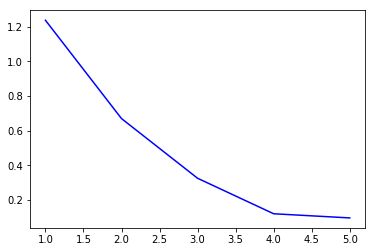

Testing...
Test accuracy: 82.90%


In [5]:
# data processing
X_train = train_images.reshape(train_images.shape[0], train_images.shape[1]*train_images.shape[2]).astype('float32') #flatten 28x28 to 784x1 vectors, [60000, 784]
x_train = X_train / 255 #normalization
y_train = np.eye(num_classes)[train_labels] #convert label to one-hot

X_test = test_images.reshape(test_images.shape[0], test_images.shape[1]*test_images.shape[2]).astype('float32') #flatten 28x28 to 784x1 vectors, [60000, 784]
x_test = X_test / 255 #normalization
y_test = test_labels

net = Network(
                 num_nodes_in_layers = [784, 32,32, 10], 
                 batch_size = 1,
                 num_epochs = 5,
                 learning_rate = 0.001, 
             )

net.train(x_train, y_train)

print("Testing...")
net.test(x_test, y_test)

In [6]:
with open('filename.pkl', 'rb') as handle:
    b = pickle.load(handle)

In [7]:
weight1 = b[0]
bias1 = b[1]
weight2 = b[2]
bias2 = b[3]
weight3 =b[4]
bias3 = b[5]

In [8]:
num = 0

while num < test_images.shape[0]:
    input_layer = np.dot(x_test[num:num+1], weight1)
    hidden_layer_1 = relu(input_layer + bias1)
    
    h1 = np.dot(hidden_layer_1, weight2) 
    hidden_layer_2 = relu(h1 + bias2)
    
    scores = np.dot(hidden_layer_2, weight3) + bias3
    probs = softmax(scores)
    predict = np.argmax(probs)

    img = np.zeros([28,28,3])

    img[:,:,0] = test_images[num]
    img[:,:,1] = test_images[num]
    img[:,:,2] = test_images[num]


    resized_image = cv2.resize(img, (100, 100)) 
    cv2.putText(resized_image, str(predict), (5,20), cv2.FONT_HERSHEY_DUPLEX, .7, (0,255, 0), 1)
    
    cv2.imwrite("saved_img"+ str(num)+ ".jpg",resized_image)
    
    num += 1
    if num >20:
        break

# cv2.destroyAllWindows()

error: OpenCV(4.5.1) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-memyuvq3\opencv\modules\highgui\src\window.cpp:645: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'
